In [99]:
import torch
import torch.nn as nn
import torch.utils.data
from torchvision import datasets, transforms
import torch.nn.functional as F
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline

from functools import reduce
import operator

from PIL import Image

In [100]:
device = torch.device('cuda')

num_channels = 5
batch_size = 4

In [101]:
def prod(iterable):
    return reduce(operator.mul, iterable, 1)
  
class NetCNN(nn.Module):
    def __init__(self, input_shape, output_dim):
        super().__init__()
        if (len(input_shape) != 3):
            raise ValueError('Expecting an input_shape representing dimensions CxHxW')
        self._input_channels = input_shape[0]
        print('input_channels: {}'.format(self._input_channels))
        self._conv2d1 = nn.Conv2d(in_channels=self._input_channels, out_channels=64, kernel_size=3)
        self._conv2d2 = nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3)
        self._cnn_output_dim = self._cnn(torch.zeros(input_shape).unsqueeze(0)).nelement()
        print('cnn_output_dim: {}'.format(self._cnn_output_dim))
        self._fc1 = nn.Linear(self._cnn_output_dim, 256)
        self._fc2 = nn.Linear(256, output_dim)
        
    def _cnn(self, x):
        x = self._conv2d1(x)
        x = torch.relu(x)
        x = nn.MaxPool2d(kernel_size=3)(x)
        x = self._conv2d2(x)
        x = nn.MaxPool2d(kernel_size=3)(x)
        return x
    
    
    def forward(self, x):
        batch_dim = x.shape[0]
        x = self._cnn(x).view(batch_dim, -1)
        x = self._fc1(x)
        x = torch.relu(x)
        x = self._fc2(x)
        x = torch.sigmoid(x)
        return x
    
class NetFF(nn.Module):
    def __init__(self, input_shape, output_dim):
        super().__init__()
        if (len(input_shape) != 3):
            raise ValueError('Expecting an input_shape representing dimensions CxHxW')
        self._input_channels = input_shape[0]
        print('input_channels: {}'.format(self._input_channels))
        self._input_dim = prod(input_shape)
        print('input_dim: {}'.format(self._input_dim))
        self._fc1 = nn.Linear(self._input_dim, 64)
        self._fc2 = nn.Linear(64, output_dim)
        
    def forward(self, x):
        x = x.view(-1, self._input_dim)
        x = self._fc1(x)
        x = torch.relu(x)
        x = self._fc2(x)
        x = torch.sigmoid(x)
        return x

def run_experiment(name, sun_maker_func):
  sun = sun_maker_func(num_channels)
  sun_numpy = sun.cpu().numpy()

  for channel in sun_numpy:
      plt.imshow(channel, norm=None, cmap='hot', vmin=sun_numpy.min(), vmax=sun_numpy.max())
      plt.show()

  model = NetCNN(input_shape=[num_channels, 28, 28], output_dim=num_channels)
  model.cuda(device)
  model.train()
  optimizer = torch.optim.Adam(model.parameters())

  losses = []
  for b in range(1000):
      data = torch.cat([sun_maker_func(num_channels=num_channels) for i in range(batch_size)]).view(batch_size, num_channels, 28, 28)
      data_min, data_max = torch.min(data), torch.max(data)
      dim_factors = torch.rand(batch_size, num_channels).view(batch_size,-1).to(device)
  #     print(batch.shape)
  #     print(dim_factors.shape)
      dimmed_data = data.clone().to(device)
      for i in range(batch_size):
          for j in range(num_channels):
              dimmed_data[i, j] *= dim_factors[i, j]

      optimizer.zero_grad()
      output = model(dimmed_data)
      loss = nn.MSELoss()(output, dim_factors)
      loss.backward()
      optimizer.step()
      losses.append(float(loss))

      if b % 10 == 0:
          print('Current loss: {}'.format(float(loss)))
          sample = data[0].cpu().numpy()
          sample_dimmed = dimmed_data[0].cpu().numpy()

          for i, (channel, channel_dimmed) in enumerate(zip(sample, sample_dimmed)):
              fig = plt.figure()
              ax1 = fig.add_subplot(1, 3, 1)
              ax1.imshow(channel, norm=None, cmap='hot', vmin=data_min, vmax=data_max)
              ax2 = fig.add_subplot(1, 3, 2)
              ax2.imshow(channel_dimmed, norm=None, cmap='hot', vmin=data_min, vmax=data_max)
              ax3 = fig.add_subplot(1, 3, 3)
              ax3.imshow(channel_dimmed / float(output[0, i]), norm=None, cmap='hot', vmin=data_min, vmax=data_max)
              print('Channel: {} (left: original, middle: dimmed, right: undimmed)\nDimming (true): {}, dimming (predicted): {}'.format(i, dim_factors[0, i], output[0, i]))
              plt.show()
          dim_factors_numpy = dim_factors[0].view(-1).cpu().numpy()
          plt.plot(dim_factors_numpy, label='Dimming factors (true)')
          output_numpy = output[0].detach().view(-1).cpu().numpy()
          plt.plot(output_numpy, label='Dimming factors (predicted)')
          plt.legend()
          plt.show()

  plt.plot(losses, label='training loss')
  plt.show()
  print('Loss min: {}, max: {}, mean: {}'.format(min(losses), max(losses), np.mean(losses)))
  
  return np.mean(losses)

<img src="experiment_quadrants.png" />

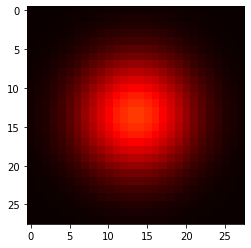

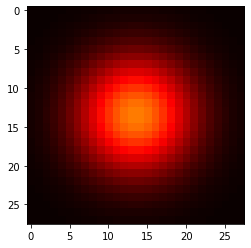

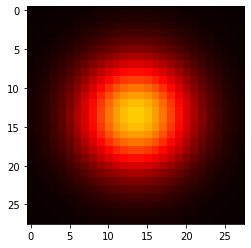

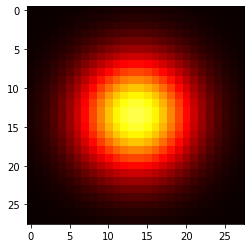

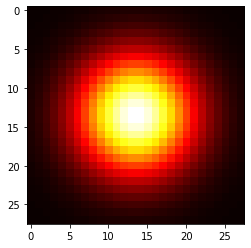

input_channels: 5
cnn_output_dim: 512
Current loss: 0.0748233050107956
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.19421452283859253, dimming (predicted): 0.5096190571784973


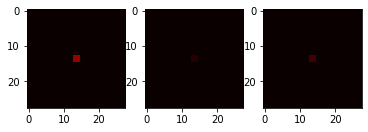

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3034716248512268, dimming (predicted): 0.5093736052513123


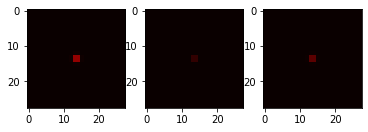

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7405577898025513, dimming (predicted): 0.48682165145874023


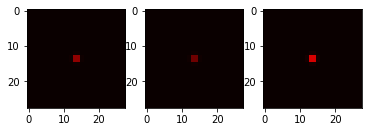

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.44542187452316284, dimming (predicted): 0.5076195597648621


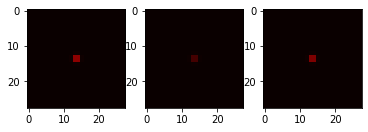

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5000106692314148, dimming (predicted): 0.49524977803230286


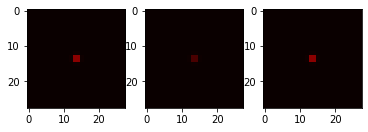

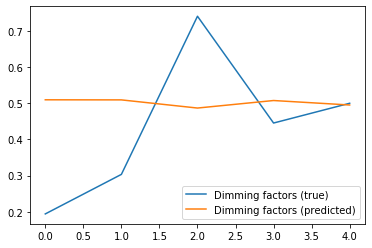

Current loss: 0.1011752262711525
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8394072651863098, dimming (predicted): 0.5074581503868103


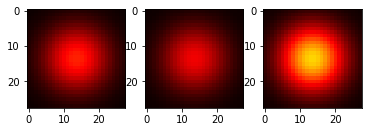

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8638467192649841, dimming (predicted): 0.45242825150489807


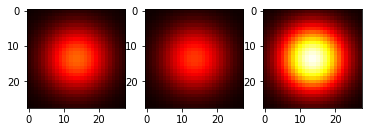

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5848503112792969, dimming (predicted): 0.44075843691825867


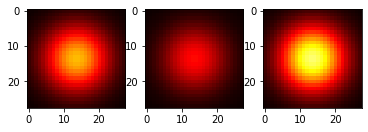

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9165015816688538, dimming (predicted): 0.5857497453689575


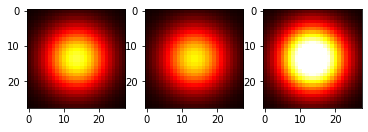

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5138253569602966, dimming (predicted): 0.5158724188804626


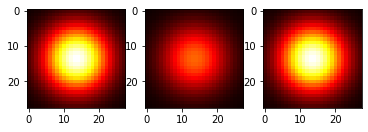

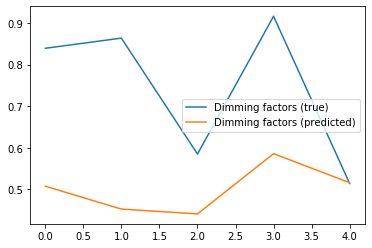

Current loss: 0.06063110753893852
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7631489634513855, dimming (predicted): 0.6078453063964844


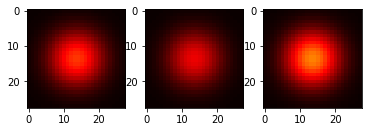

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6970176100730896, dimming (predicted): 0.32756519317626953


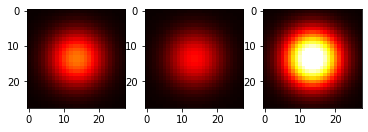

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2961381673812866, dimming (predicted): 0.49865466356277466


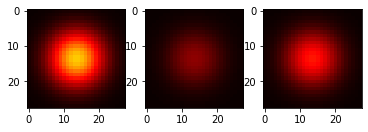

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3515191674232483, dimming (predicted): 0.4898100793361664


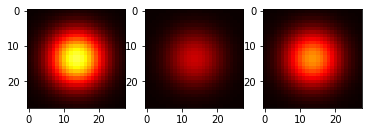

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9926382899284363, dimming (predicted): 0.7018874287605286


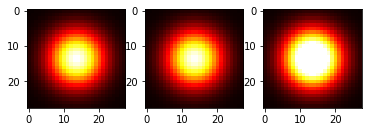

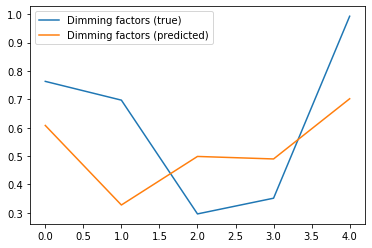

Current loss: 0.09414021670818329
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.761987030506134, dimming (predicted): 0.6653909683227539


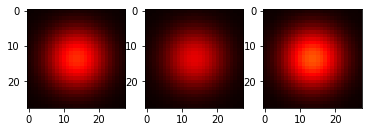

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8716499209403992, dimming (predicted): 0.562606692314148


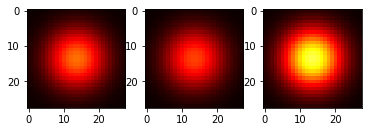

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8799692988395691, dimming (predicted): 0.6136446595191956


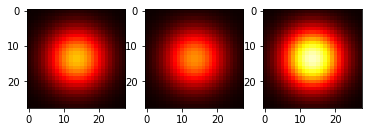

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7824215292930603, dimming (predicted): 0.6433154940605164


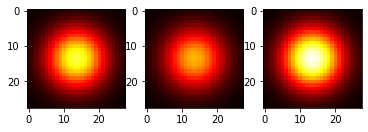

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.004195749759674072, dimming (predicted): 0.25820493698120117


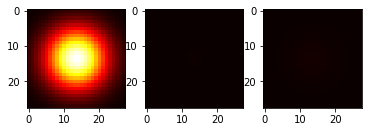

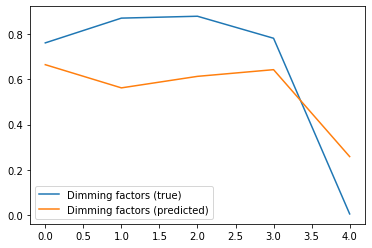

Current loss: 0.038389161229133606
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3719269037246704, dimming (predicted): 0.42481717467308044


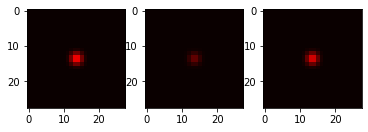

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8911697268486023, dimming (predicted): 0.5468659996986389


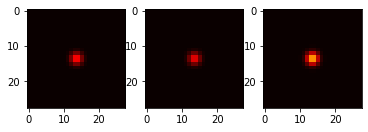

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8112141489982605, dimming (predicted): 0.3967186510562897


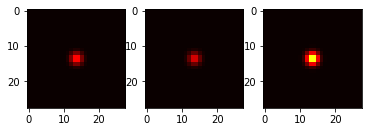

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5823282599449158, dimming (predicted): 0.4028419256210327


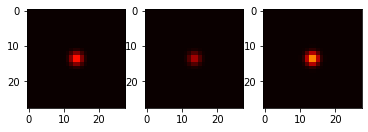

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7494010329246521, dimming (predicted): 0.47829338908195496


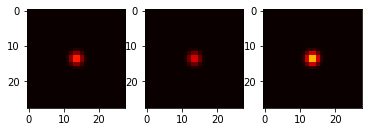

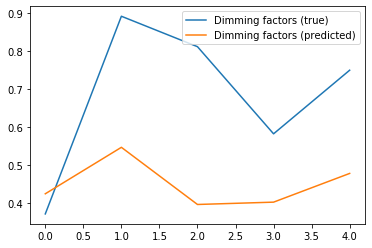

Current loss: 0.030576670542359352
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.029284119606018066, dimming (predicted): 0.3123107850551605


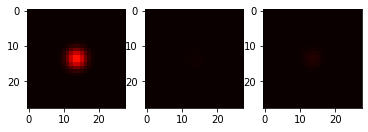

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.28582292795181274, dimming (predicted): 0.4051250219345093


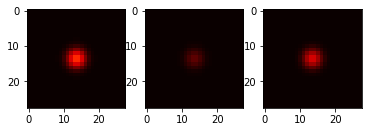

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3000373840332031, dimming (predicted): 0.4054540693759918


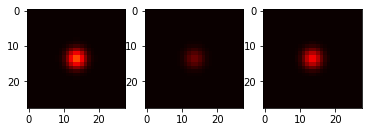

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6558288931846619, dimming (predicted): 0.6696386337280273


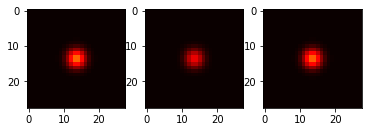

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9551366567611694, dimming (predicted): 0.7328710556030273


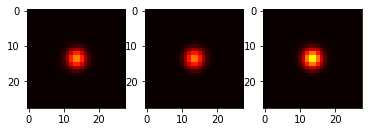

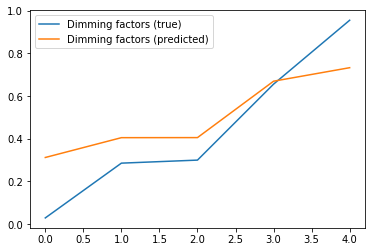

Current loss: 0.028693025931715965
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5463072657585144, dimming (predicted): 0.7044265270233154


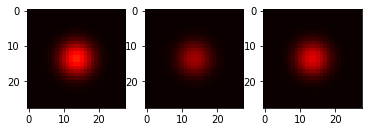

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8583105206489563, dimming (predicted): 0.8798384666442871


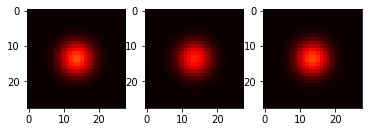

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.08268564939498901, dimming (predicted): 0.3166968822479248


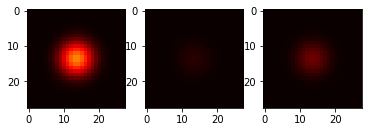

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.160101056098938, dimming (predicted): 0.17530743777751923


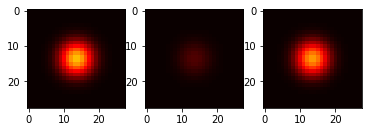

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8085070848464966, dimming (predicted): 0.8558788299560547


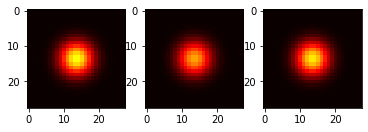

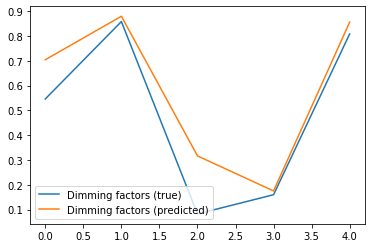

Current loss: 0.017908886075019836
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8550733923912048, dimming (predicted): 0.7553958892822266


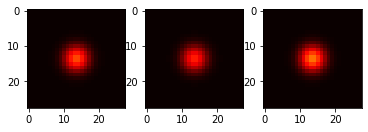

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.13539904356002808, dimming (predicted): 0.10193835943937302


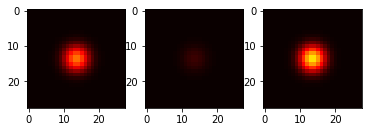

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9024913311004639, dimming (predicted): 0.7463889122009277


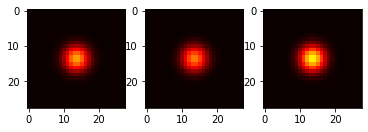

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7958179116249084, dimming (predicted): 0.6806349754333496


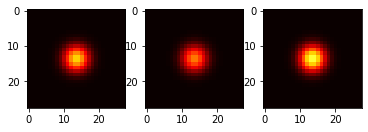

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.13313966989517212, dimming (predicted): 0.08744029700756073


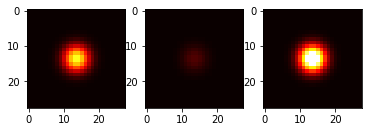

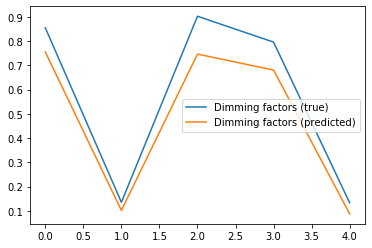

Current loss: 0.044272489845752716
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5949238538742065, dimming (predicted): 0.8383868336677551


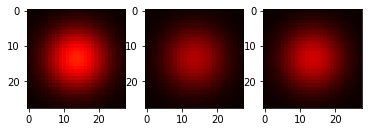

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.11272656917572021, dimming (predicted): 0.07409999519586563


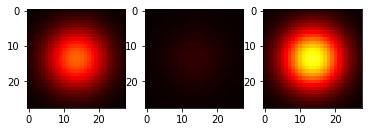

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3794156312942505, dimming (predicted): 0.6438959240913391


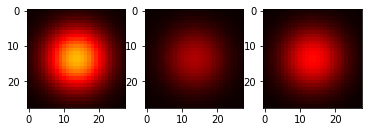

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9303090572357178, dimming (predicted): 0.9648588299751282


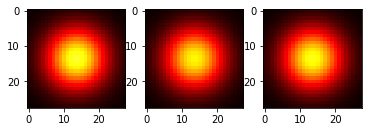

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2859070301055908, dimming (predicted): 0.3656352758407593


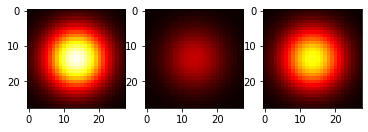

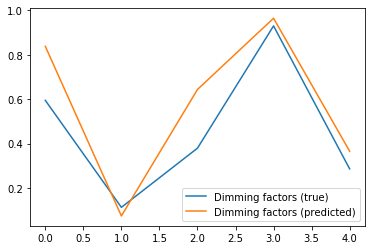

Current loss: 0.03393353521823883
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9907501339912415, dimming (predicted): 0.868937075138092


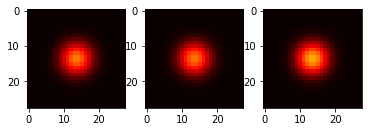

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.08592456579208374, dimming (predicted): 0.05019485205411911


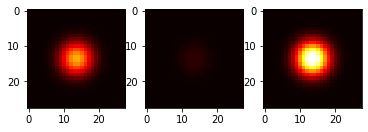

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.17701464891433716, dimming (predicted): 0.1605285257101059


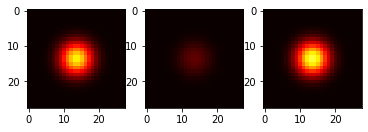

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7915671467781067, dimming (predicted): 0.6166083216667175


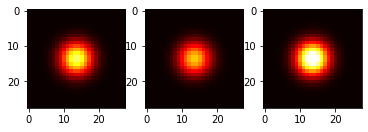

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9959410429000854, dimming (predicted): 0.8022197484970093


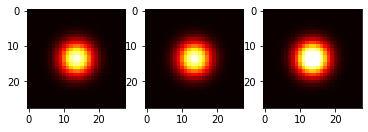

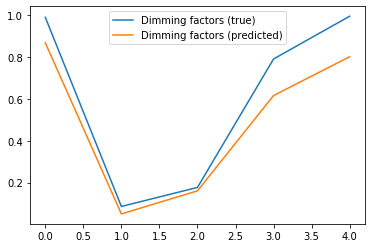

Current loss: 0.046815384179353714
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.04224812984466553, dimming (predicted): 0.2590242326259613


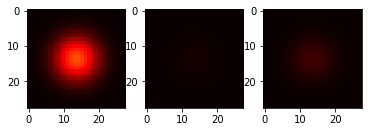

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4691823720932007, dimming (predicted): 0.7028997540473938


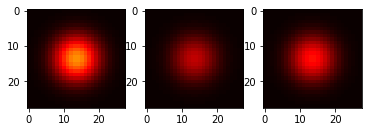

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.36265915632247925, dimming (predicted): 0.616741955280304


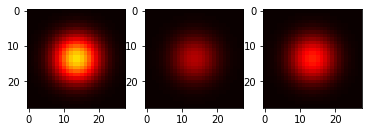

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.02762812376022339, dimming (predicted): 0.30663883686065674


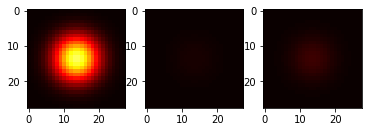

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.47019970417022705, dimming (predicted): 0.7296741008758545


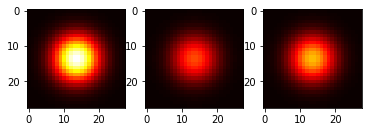

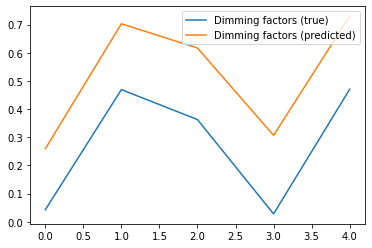

Current loss: 0.025502771139144897
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4339176416397095, dimming (predicted): 0.44687286019325256


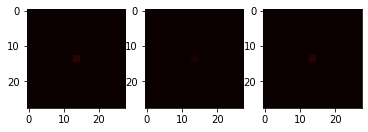

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9397898316383362, dimming (predicted): 0.42652270197868347


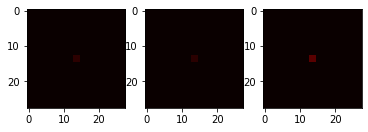

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6366367340087891, dimming (predicted): 0.4395529627799988


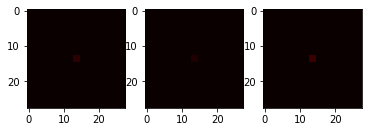

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3375054597854614, dimming (predicted): 0.47442111372947693


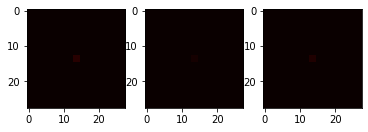

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4542151689529419, dimming (predicted): 0.4635854661464691


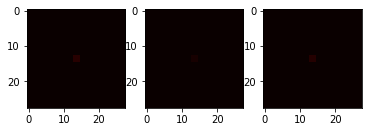

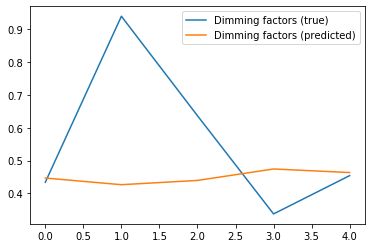

Current loss: 0.007880045101046562
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4851526618003845, dimming (predicted): 0.4774676561355591


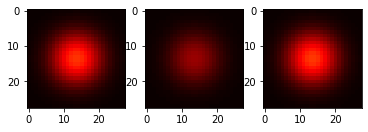

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5706385374069214, dimming (predicted): 0.5661569237709045


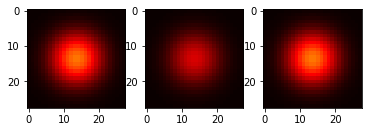

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9635474681854248, dimming (predicted): 0.9449299573898315


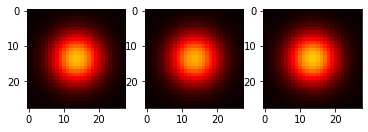

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.003675699234008789, dimming (predicted): 0.09890856593847275


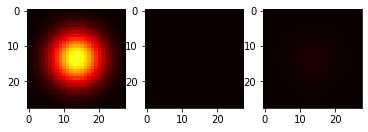

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.21107953786849976, dimming (predicted): 0.12656398117542267


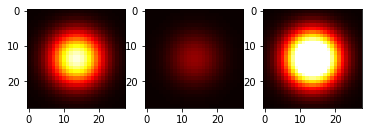

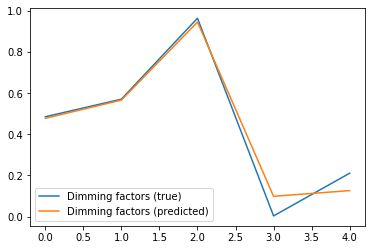

Current loss: 0.026214858517050743
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7878548502922058, dimming (predicted): 0.7560505270957947


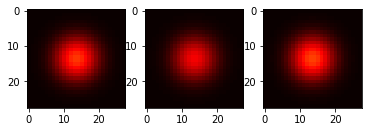

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9617669582366943, dimming (predicted): 0.8728437423706055


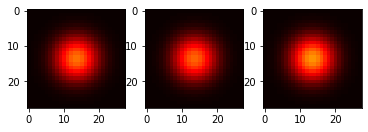

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6107324957847595, dimming (predicted): 0.41298428177833557


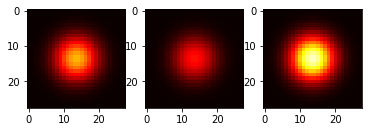

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5836456418037415, dimming (predicted): 0.475198358297348


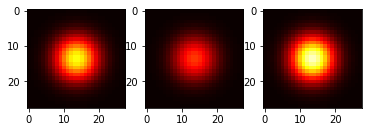

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9896647334098816, dimming (predicted): 0.8514341115951538


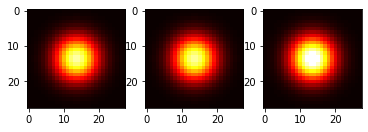

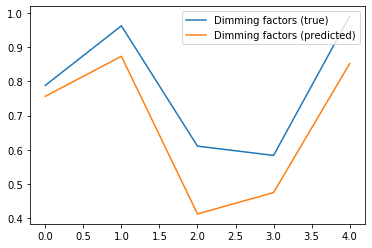

Current loss: 0.011108441278338432
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.0453639030456543, dimming (predicted): 0.044565483927726746


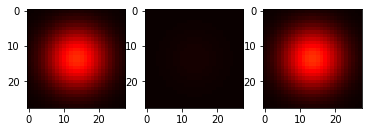

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2983882427215576, dimming (predicted): 0.43168067932128906


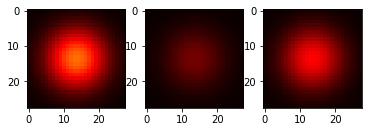

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.35531455278396606, dimming (predicted): 0.41246843338012695


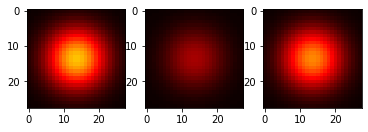

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5044584274291992, dimming (predicted): 0.600251317024231


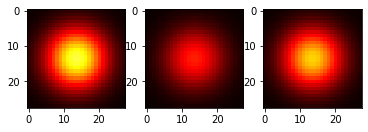

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5191542506217957, dimming (predicted): 0.7186374664306641


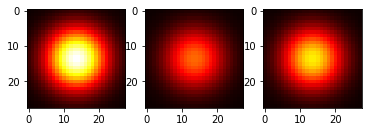

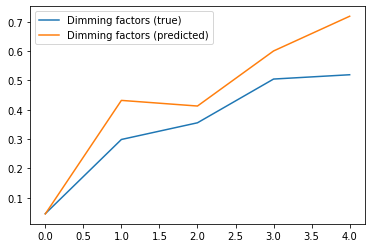

Current loss: 0.016592545434832573
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.19270390272140503, dimming (predicted): 0.29351574182510376


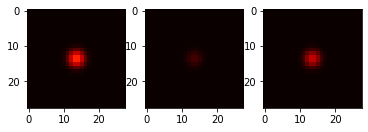

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8023746013641357, dimming (predicted): 0.6942469477653503


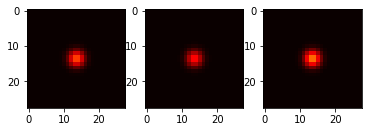

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.29035061597824097, dimming (predicted): 0.3085886538028717


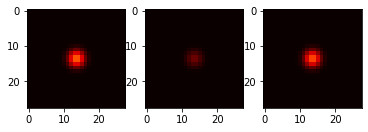

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8163939118385315, dimming (predicted): 0.7410603165626526


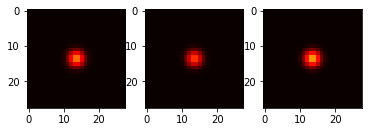

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6196373701095581, dimming (predicted): 0.6235373020172119


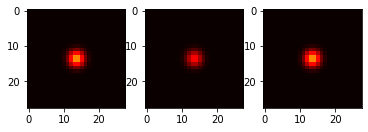

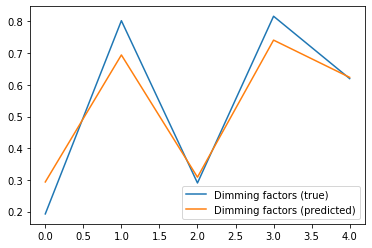

Current loss: 0.018926410004496574
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.636553168296814, dimming (predicted): 0.5697740316390991


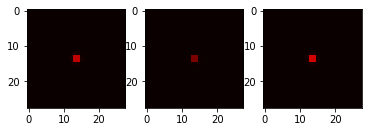

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3280843496322632, dimming (predicted): 0.38466787338256836


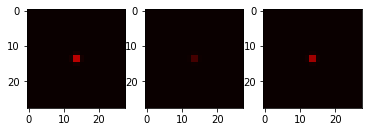

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.49773091077804565, dimming (predicted): 0.5060012936592102


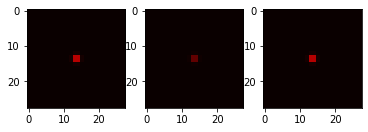

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3035494089126587, dimming (predicted): 0.523004412651062


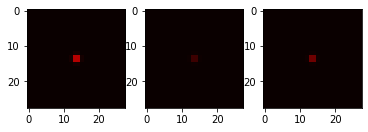

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2698272466659546, dimming (predicted): 0.2914558947086334


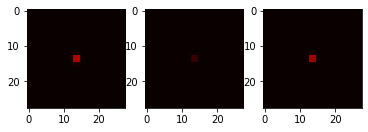

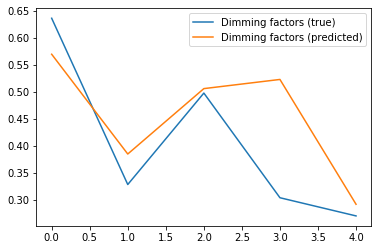

Current loss: 0.0317823700606823
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.07562446594238281, dimming (predicted): 0.3103213310241699


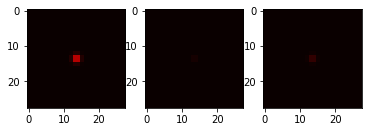

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6192417144775391, dimming (predicted): 0.559587836265564


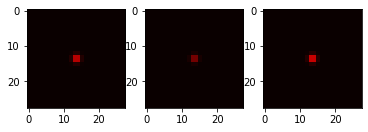

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.07597684860229492, dimming (predicted): 0.41000527143478394


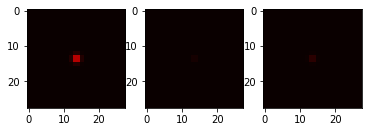

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.41174978017807007, dimming (predicted): 0.6078882217407227


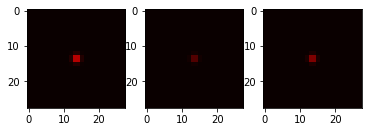

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7413333058357239, dimming (predicted): 0.5751903653144836


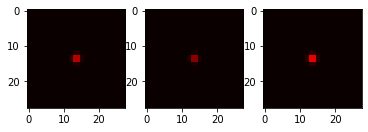

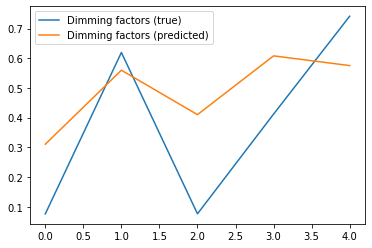

Current loss: 0.01023886539041996
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5997721552848816, dimming (predicted): 0.5954723358154297


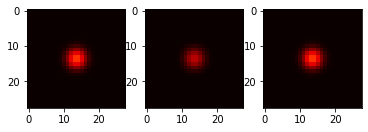

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.04824519157409668, dimming (predicted): 0.14179986715316772


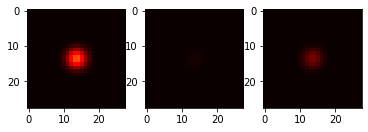

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5223029851913452, dimming (predicted): 0.5066053867340088


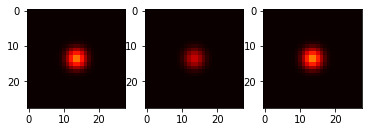

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.49879974126815796, dimming (predicted): 0.603840708732605


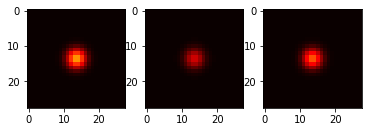

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8691413402557373, dimming (predicted): 0.7832835912704468


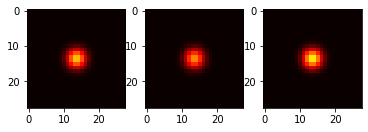

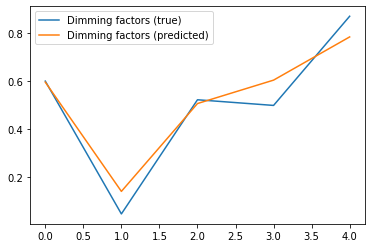

Current loss: 0.03410908952355385
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7307416200637817, dimming (predicted): 0.484563946723938


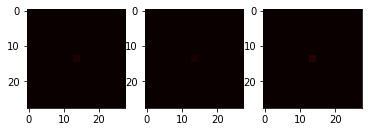

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6346621513366699, dimming (predicted): 0.41722556948661804


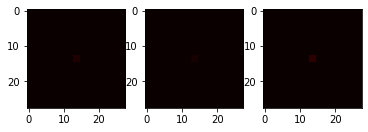

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7298688888549805, dimming (predicted): 0.5559009313583374


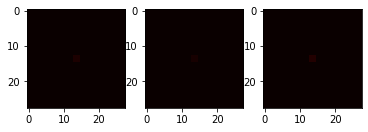

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9316102862358093, dimming (predicted): 0.5579037666320801


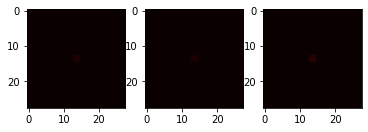

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.41469627618789673, dimming (predicted): 0.476511687040329


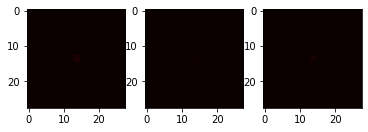

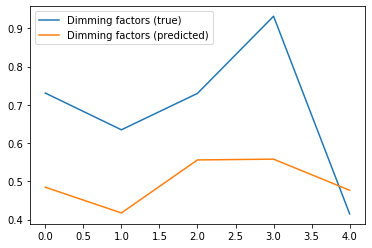

Current loss: 0.044169168919324875
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8278902173042297, dimming (predicted): 0.5026453733444214


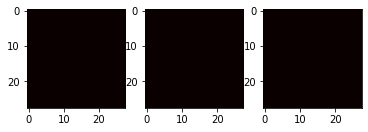

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.743197500705719, dimming (predicted): 0.4759804904460907


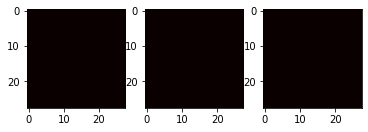

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.33119380474090576, dimming (predicted): 0.5597003102302551


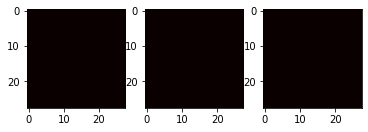

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.18854451179504395, dimming (predicted): 0.5133798122406006


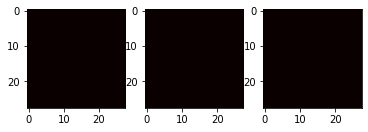

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9636401534080505, dimming (predicted): 0.40314045548439026


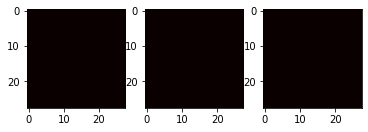

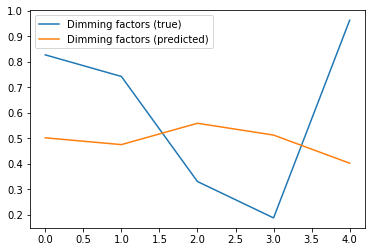

Current loss: 0.018559977412223816
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9866510629653931, dimming (predicted): 0.8774866461753845


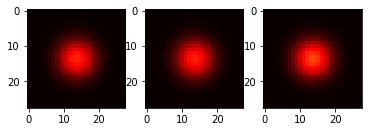

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8175156116485596, dimming (predicted): 0.7342879772186279


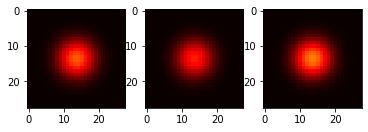

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6951864957809448, dimming (predicted): 0.6964350938796997


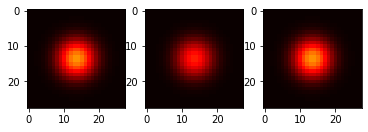

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7886162400245667, dimming (predicted): 0.7583991885185242


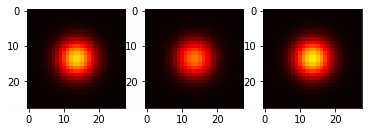

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.62257981300354, dimming (predicted): 0.5794826149940491


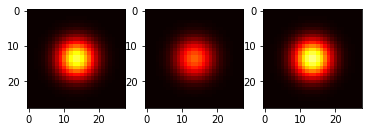

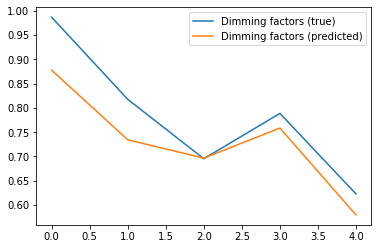

Current loss: 0.006257252302020788
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3448171615600586, dimming (predicted): 0.4905727207660675


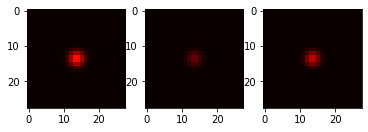

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2229195237159729, dimming (predicted): 0.331437349319458


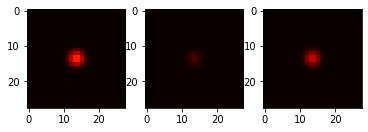

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5843408107757568, dimming (predicted): 0.6857391595840454


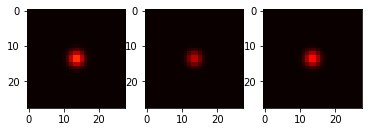

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5056647062301636, dimming (predicted): 0.5471636652946472


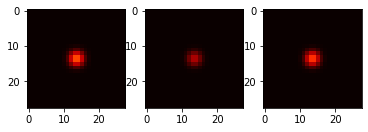

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.021164298057556152, dimming (predicted): 0.23300369083881378


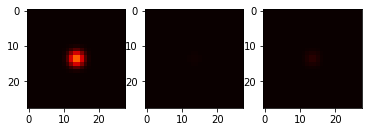

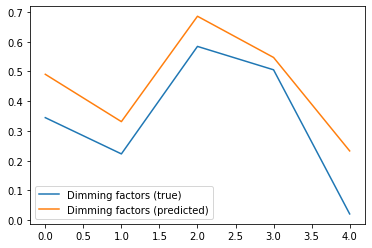

Current loss: 0.02620730921626091
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.49073100090026855, dimming (predicted): 0.5694618821144104


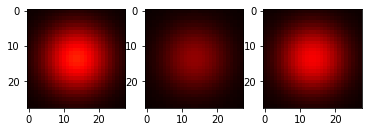

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8588908314704895, dimming (predicted): 0.9205977320671082


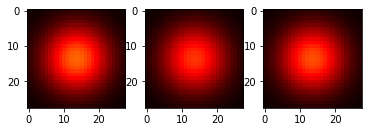

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5707049369812012, dimming (predicted): 0.5773431062698364


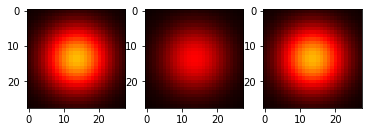

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.861996591091156, dimming (predicted): 0.8316066265106201


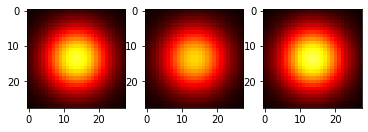

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5614974498748779, dimming (predicted): 0.6710425615310669


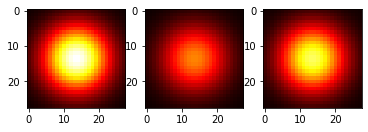

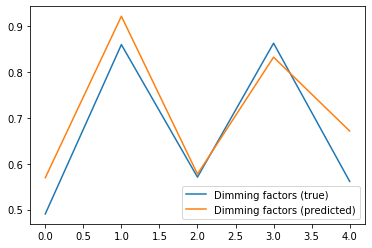

Current loss: 0.006775921676307917
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3313989043235779, dimming (predicted): 0.3998745381832123


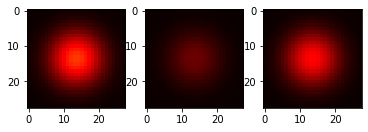

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.37843936681747437, dimming (predicted): 0.3554662764072418


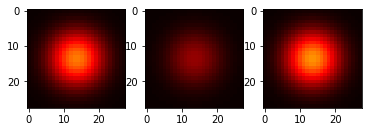

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5275524258613586, dimming (predicted): 0.6649495959281921


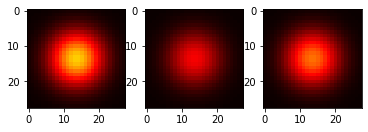

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4738490581512451, dimming (predicted): 0.5752073526382446


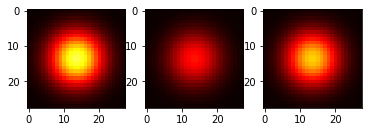

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5310073494911194, dimming (predicted): 0.6449283957481384


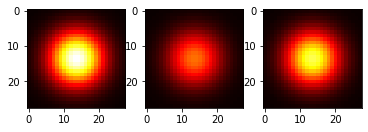

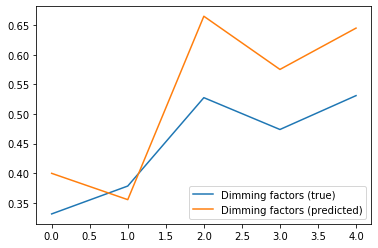

Current loss: 0.03690626472234726
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7173958420753479, dimming (predicted): 0.5249582529067993


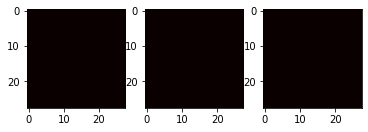

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9033511281013489, dimming (predicted): 0.4189707040786743


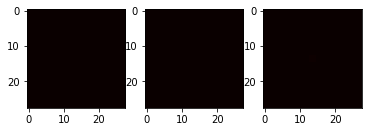

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6969594955444336, dimming (predicted): 0.42334243655204773


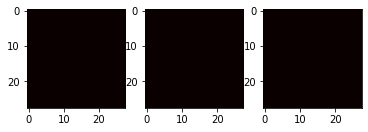

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.33528172969818115, dimming (predicted): 0.4421530067920685


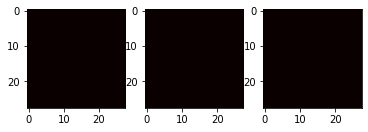

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7580662965774536, dimming (predicted): 0.46483007073402405


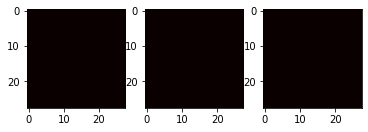

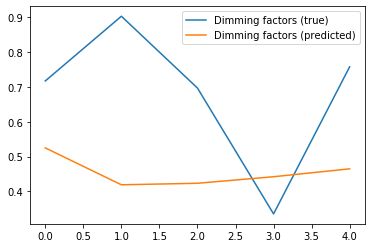

Current loss: 0.0034208521246910095
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.27090197801589966, dimming (predicted): 0.30884045362472534


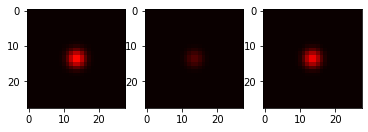

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.34575480222702026, dimming (predicted): 0.3319242298603058


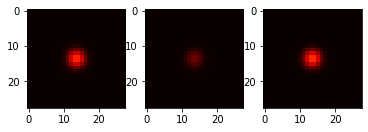

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.21967542171478271, dimming (predicted): 0.15908391773700714


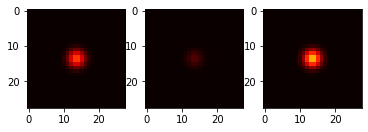

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6838646531105042, dimming (predicted): 0.737779974937439


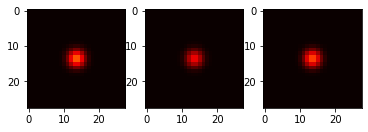

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7102037072181702, dimming (predicted): 0.7781371474266052


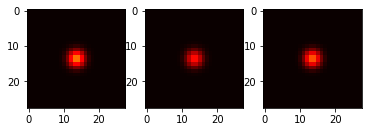

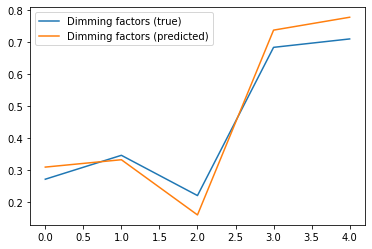

Current loss: 0.012850453145802021
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3098452091217041, dimming (predicted): 0.3066205382347107


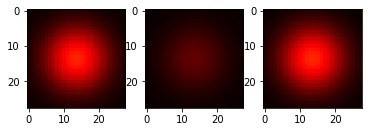

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.37856584787368774, dimming (predicted): 0.32781410217285156


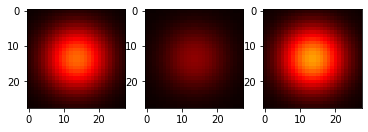

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.596229612827301, dimming (predicted): 0.5970779657363892


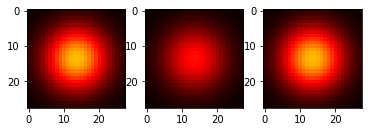

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7409399151802063, dimming (predicted): 0.8055604100227356


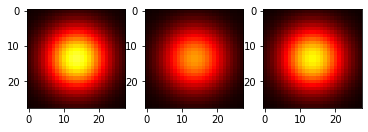

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8211390972137451, dimming (predicted): 0.8240461945533752


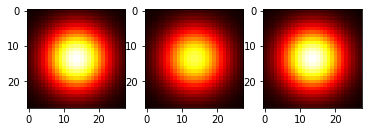

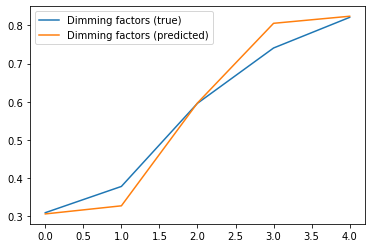

Current loss: 0.015613703057169914
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7524288892745972, dimming (predicted): 0.4366731345653534


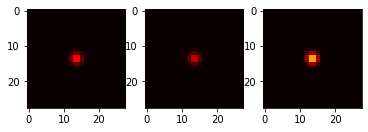

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8195781111717224, dimming (predicted): 0.5672587156295776


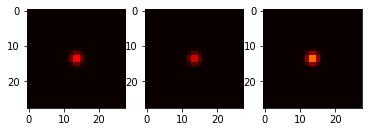

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9000516533851624, dimming (predicted): 0.7238568067550659


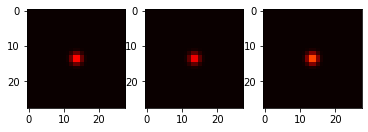

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.1864161491394043, dimming (predicted): 0.12130563706159592


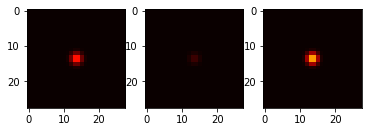

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8541732430458069, dimming (predicted): 0.6936724781990051


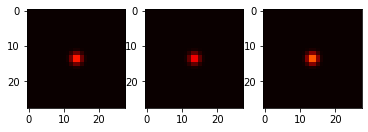

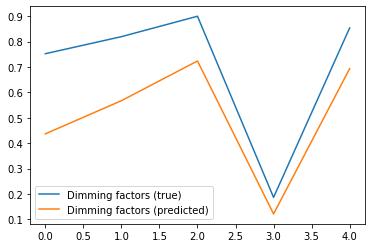

Current loss: 0.00390404905192554
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.60568767786026, dimming (predicted): 0.6111079454421997


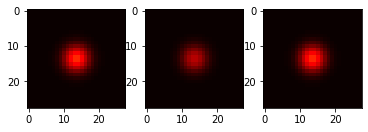

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7845928072929382, dimming (predicted): 0.7554714679718018


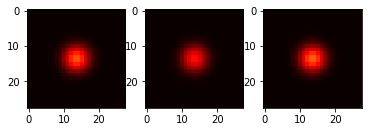

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.1854274868965149, dimming (predicted): 0.14725911617279053


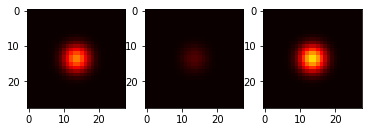

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.26101917028427124, dimming (predicted): 0.24890345335006714


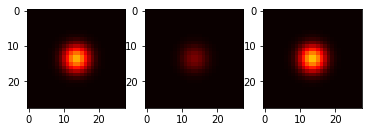

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8459187746047974, dimming (predicted): 0.8605564832687378


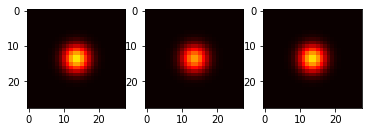

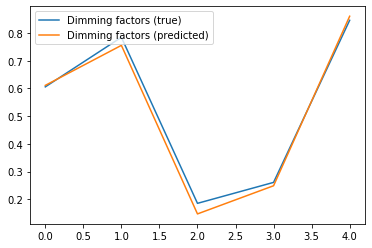

Current loss: 0.003749386640265584
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.47392165660858154, dimming (predicted): 0.42975157499313354


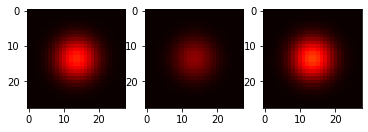

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5074517130851746, dimming (predicted): 0.45489177107810974


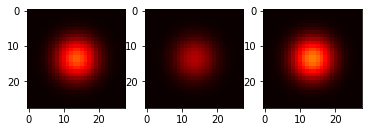

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5868782997131348, dimming (predicted): 0.5769739747047424


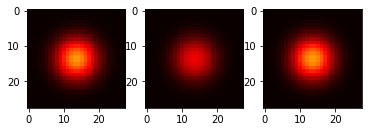

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8764680624008179, dimming (predicted): 0.8608894348144531


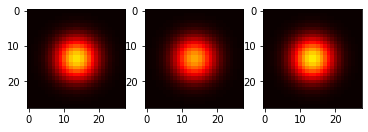

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8717243075370789, dimming (predicted): 0.8365173935890198


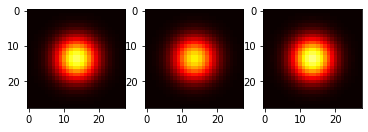

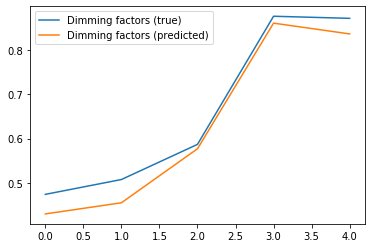

Current loss: 0.00402190862223506
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.0006476640701293945, dimming (predicted): 0.06505534797906876


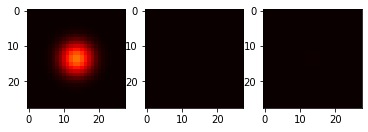

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4329269528388977, dimming (predicted): 0.3117223381996155


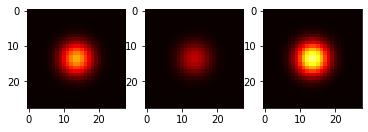

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4778994917869568, dimming (predicted): 0.44200655817985535


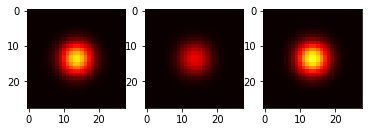

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.28249549865722656, dimming (predicted): 0.21199341118335724


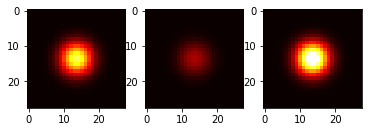

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9748082756996155, dimming (predicted): 0.9006332755088806


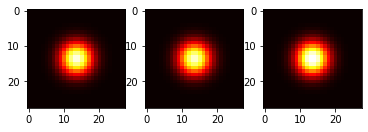

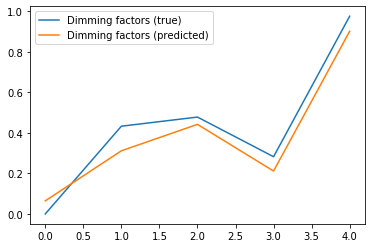

Current loss: 0.005412271246314049
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9660565257072449, dimming (predicted): 0.832528829574585


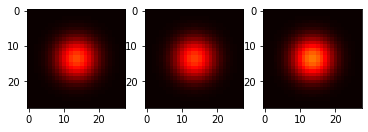

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.16197162866592407, dimming (predicted): 0.09185446053743362


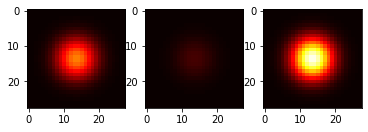

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8765102624893188, dimming (predicted): 0.752402126789093


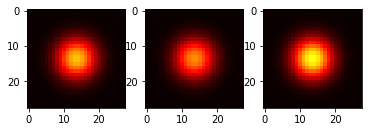

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.46733230352401733, dimming (predicted): 0.364258736371994


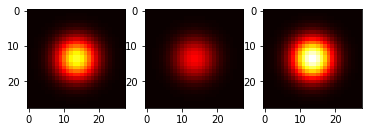

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.84840327501297, dimming (predicted): 0.8206068873405457


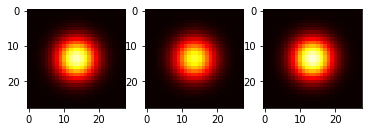

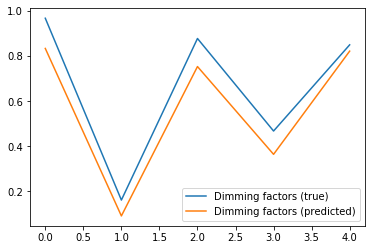

Current loss: 0.005992130376398563
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.28833651542663574, dimming (predicted): 0.2132440060377121


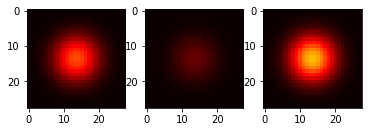

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9416506290435791, dimming (predicted): 0.8602026104927063


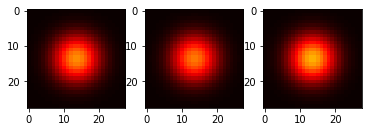

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.527482271194458, dimming (predicted): 0.5385984182357788


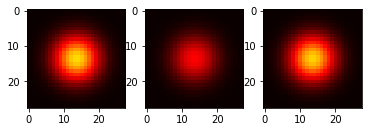

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7470174431800842, dimming (predicted): 0.7498615384101868


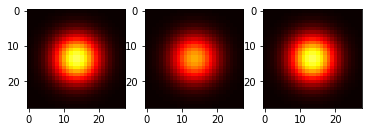

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9477480053901672, dimming (predicted): 0.8438589572906494


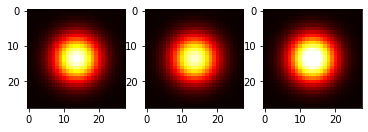

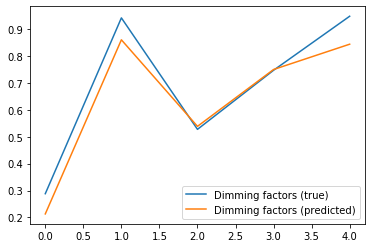

Current loss: 0.02283596806228161
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6258767247200012, dimming (predicted): 0.4737224578857422


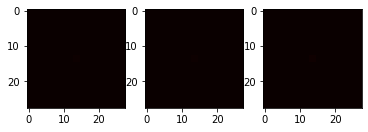

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.08161962032318115, dimming (predicted): 0.37779954075813293


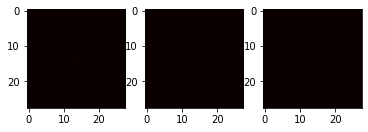

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7786993980407715, dimming (predicted): 0.49875664710998535


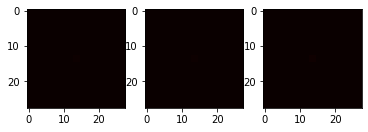

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.31897568702697754, dimming (predicted): 0.5125008821487427


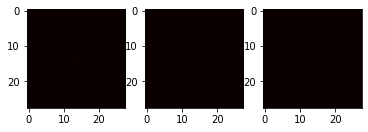

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6536104083061218, dimming (predicted): 0.4425249695777893


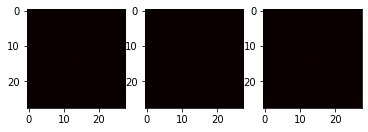

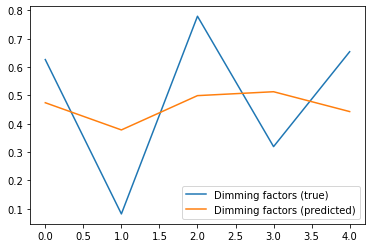

Current loss: 0.0087828878313303
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9052998423576355, dimming (predicted): 0.7517426013946533


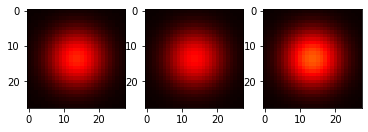

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9016140103340149, dimming (predicted): 0.7475130558013916


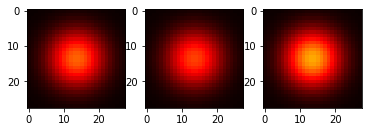

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9159920811653137, dimming (predicted): 0.7846516966819763


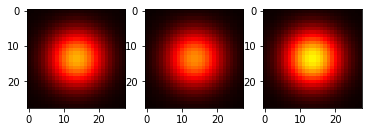

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.943854808807373, dimming (predicted): 0.8457679152488708


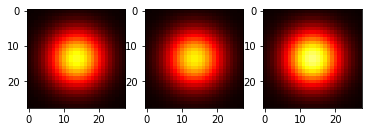

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5652154684066772, dimming (predicted): 0.5174817442893982


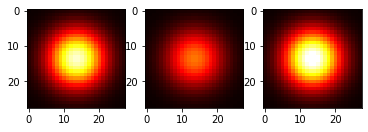

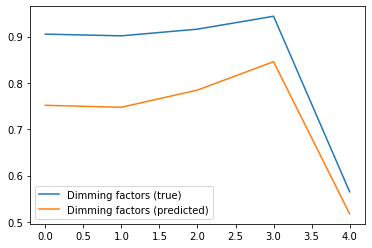

Current loss: 0.004756665788590908
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7785372734069824, dimming (predicted): 0.8188590407371521


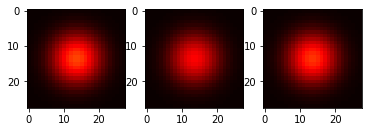

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.13553577661514282, dimming (predicted): 0.0874115452170372


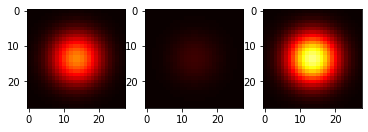

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.626409649848938, dimming (predicted): 0.6079186797142029


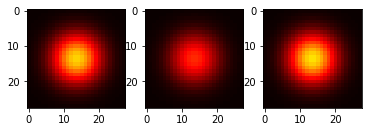

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.27086788415908813, dimming (predicted): 0.18299460411071777


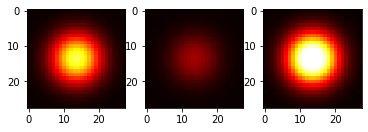

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9526457786560059, dimming (predicted): 0.9144133925437927


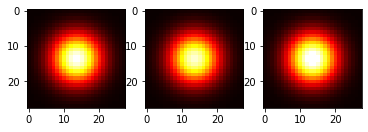

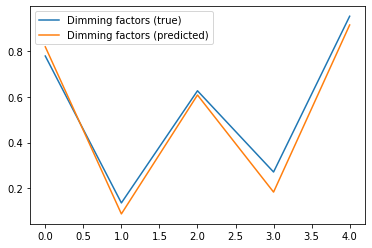

Current loss: 0.004030334763228893
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.724626898765564, dimming (predicted): 0.7798096537590027


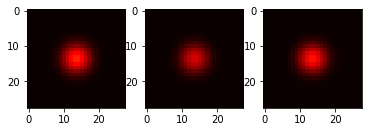

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3167310357093811, dimming (predicted): 0.3088401257991791


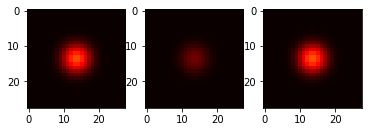

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4366474747657776, dimming (predicted): 0.4856506586074829


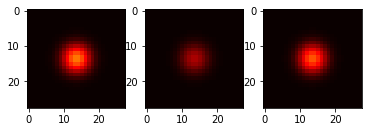

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.15603375434875488, dimming (predicted): 0.14550058543682098


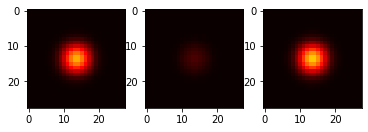

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.1280694603919983, dimming (predicted): 0.1385243982076645


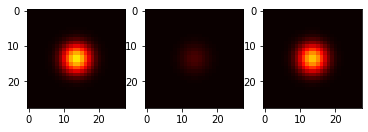

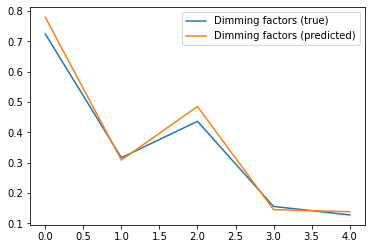

Current loss: 0.03217201679944992
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.07151204347610474, dimming (predicted): 0.1011679470539093


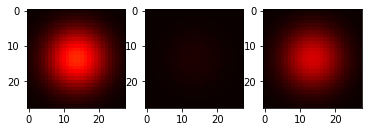

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3941987156867981, dimming (predicted): 0.3919732868671417


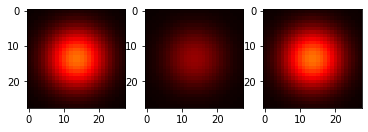

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7959941625595093, dimming (predicted): 0.6716916561126709


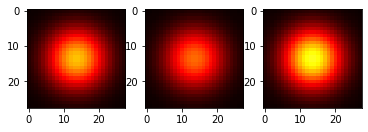

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5752477645874023, dimming (predicted): 0.478572279214859


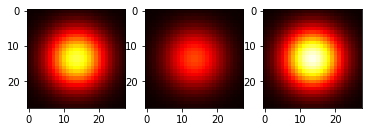

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7529518604278564, dimming (predicted): 0.7290396690368652


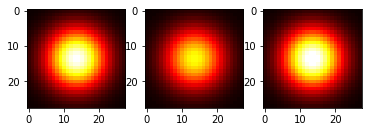

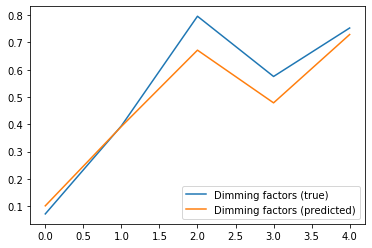

Current loss: 0.013472353108227253
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2178788185119629, dimming (predicted): 0.21808601915836334


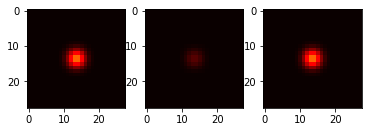

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.06579887866973877, dimming (predicted): 0.18542036414146423


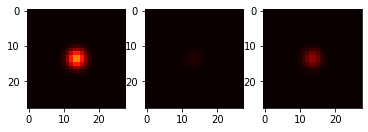

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.25545698404312134, dimming (predicted): 0.28157711029052734


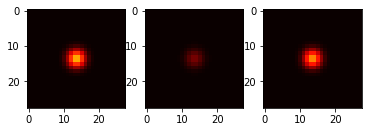

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9761579632759094, dimming (predicted): 0.8861358165740967


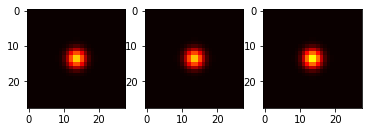

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4340951442718506, dimming (predicted): 0.45251572132110596


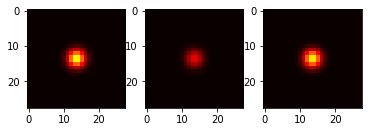

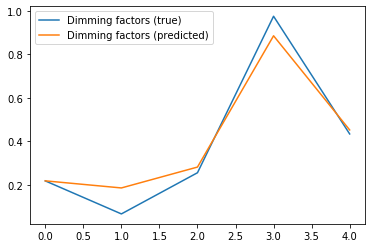

Current loss: 0.004988716449588537
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7121567130088806, dimming (predicted): 0.7654978036880493


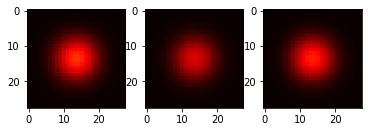

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6525002717971802, dimming (predicted): 0.6908026933670044


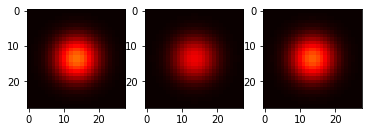

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7010965347290039, dimming (predicted): 0.8691489100456238


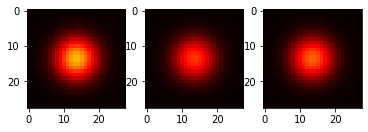

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8122788667678833, dimming (predicted): 0.8063052296638489


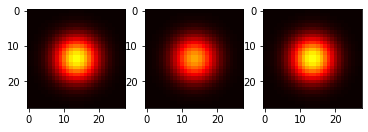

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9040489792823792, dimming (predicted): 0.8692567944526672


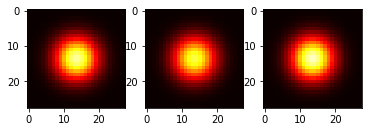

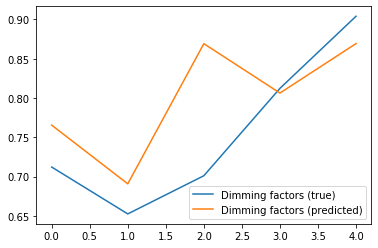

Current loss: 0.0225045308470726
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.696677029132843, dimming (predicted): 0.7106528282165527


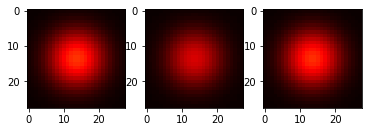

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.03802847862243652, dimming (predicted): 0.059450775384902954


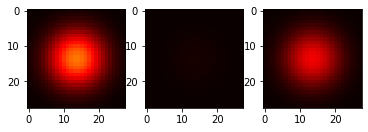

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6146103143692017, dimming (predicted): 0.5703926682472229


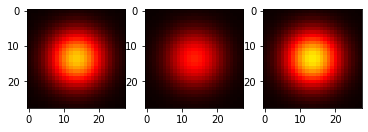

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7162410020828247, dimming (predicted): 0.6825950145721436


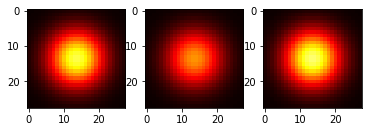

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.67416912317276, dimming (predicted): 0.6887797713279724


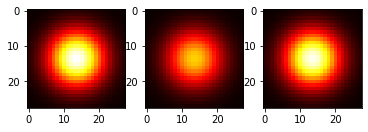

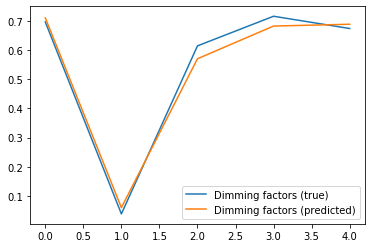

Current loss: 0.03409530594944954
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6016227006912231, dimming (predicted): 0.5633582472801208


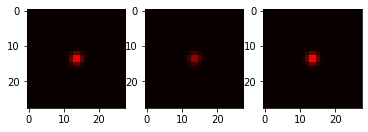

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.947184681892395, dimming (predicted): 0.868335485458374


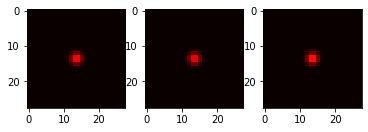

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5476850271224976, dimming (predicted): 0.6780082583427429


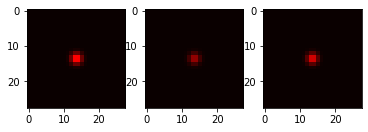

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5846728086471558, dimming (predicted): 0.5160439014434814


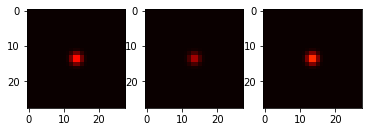

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7134382724761963, dimming (predicted): 0.8074432015419006


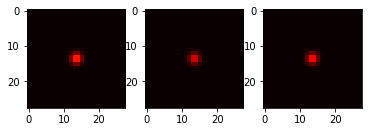

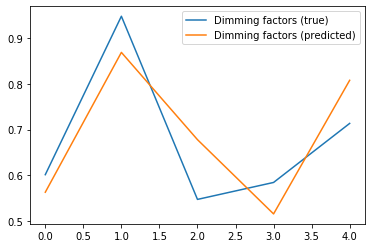

Current loss: 0.005245459731668234
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.29575347900390625, dimming (predicted): 0.2892853319644928


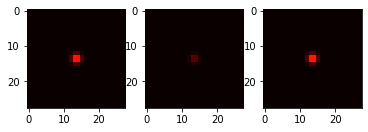

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7380766868591309, dimming (predicted): 0.7189617156982422


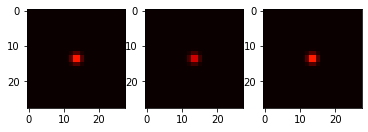

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7142780423164368, dimming (predicted): 0.7326940894126892


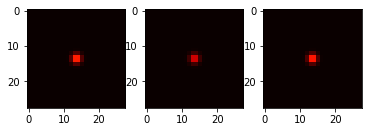

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.04068797826766968, dimming (predicted): 0.20364710688591003


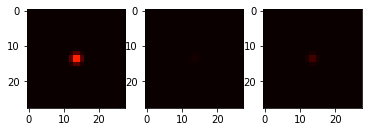

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.19633054733276367, dimming (predicted): 0.2791145145893097


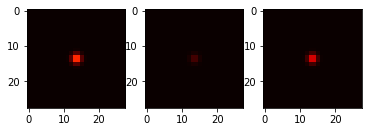

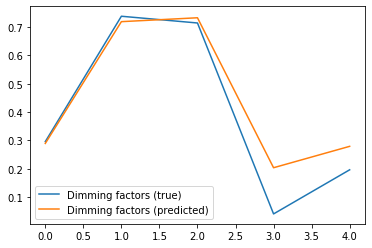

Current loss: 0.008244495838880539
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3213001489639282, dimming (predicted): 0.4225471019744873


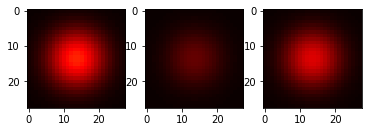

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.23348230123519897, dimming (predicted): 0.31298577785491943


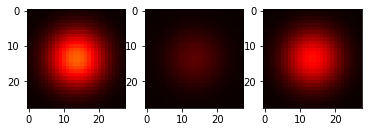

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4216211438179016, dimming (predicted): 0.5646722316741943


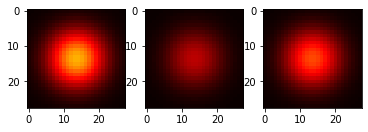

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2919690012931824, dimming (predicted): 0.41254663467407227


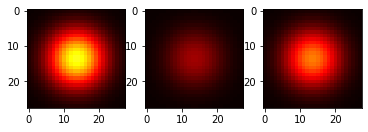

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.42951709032058716, dimming (predicted): 0.5908145904541016


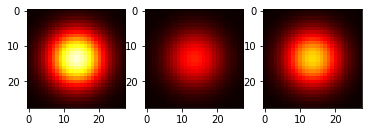

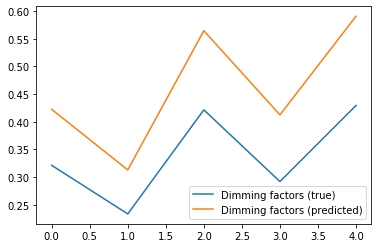

Current loss: 0.004428324289619923
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4629770517349243, dimming (predicted): 0.4254743456840515


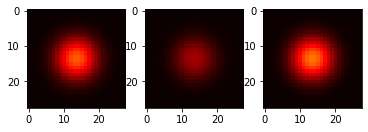

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5066739916801453, dimming (predicted): 0.55401611328125


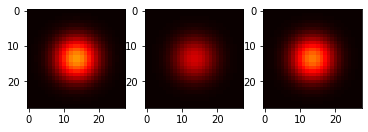

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9473700523376465, dimming (predicted): 0.8457997441291809


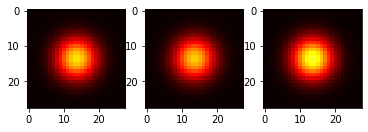

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4442310929298401, dimming (predicted): 0.4676974415779114


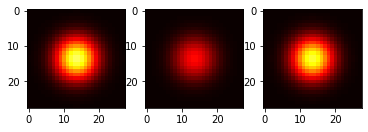

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.19411927461624146, dimming (predicted): 0.18535412847995758


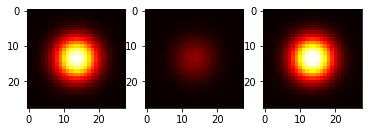

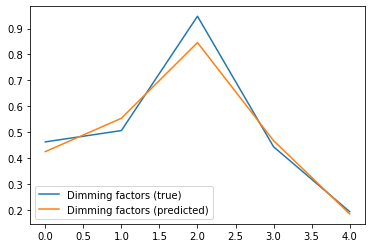

Current loss: 0.030086789280176163
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4939160943031311, dimming (predicted): 0.6143872737884521


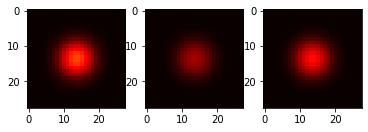

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6882476806640625, dimming (predicted): 0.7284924983978271


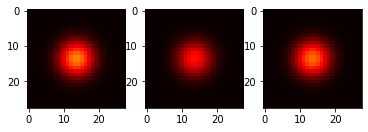

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8551304936408997, dimming (predicted): 0.8327579498291016


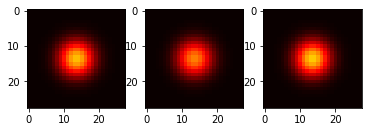

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4273771047592163, dimming (predicted): 0.5326364636421204


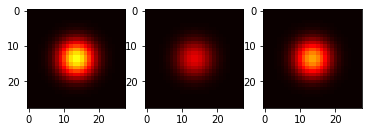

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5878270864486694, dimming (predicted): 0.6486822366714478


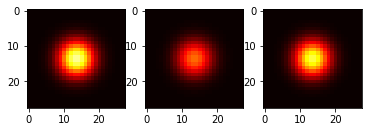

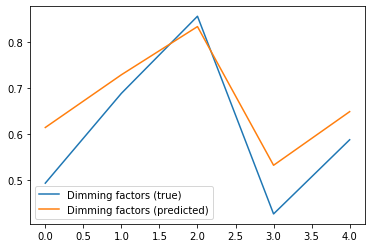

Current loss: 0.005055119749158621
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.07383984327316284, dimming (predicted): 0.1613055318593979


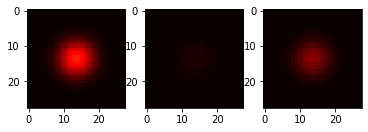

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.10698330402374268, dimming (predicted): 0.1378127783536911


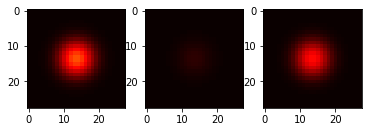

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8691059350967407, dimming (predicted): 0.8323041796684265


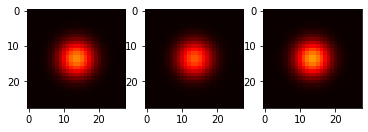

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.10196143388748169, dimming (predicted): 0.09308211505413055


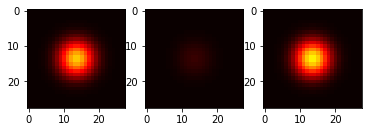

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6499401330947876, dimming (predicted): 0.7568176984786987


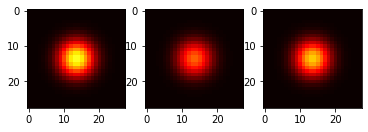

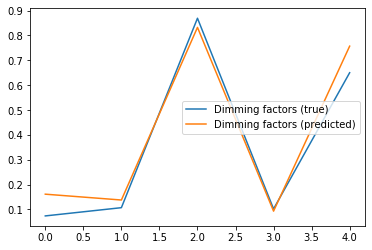

Current loss: 0.00580886285752058
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.508067786693573, dimming (predicted): 0.622134268283844


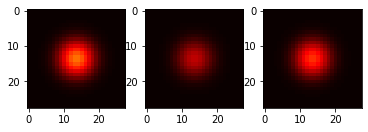

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5228357315063477, dimming (predicted): 0.5494519472122192


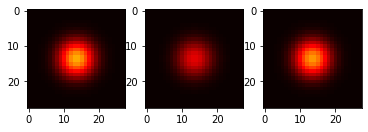

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.37273603677749634, dimming (predicted): 0.3893124759197235


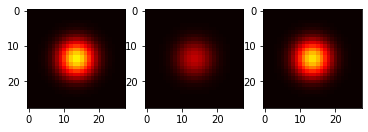

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7624281644821167, dimming (predicted): 0.8737147450447083


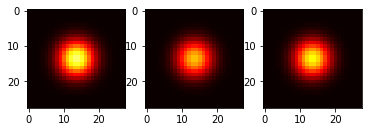

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.1207040548324585, dimming (predicted): 0.18603791296482086


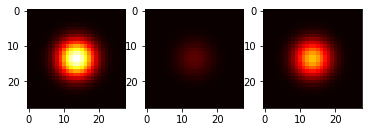

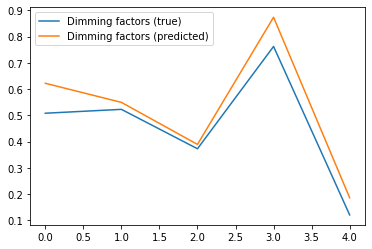

Current loss: 0.004473896697163582
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5839860439300537, dimming (predicted): 0.6510956287384033


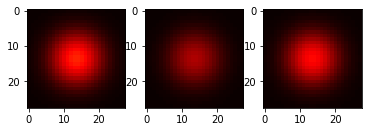

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9857051372528076, dimming (predicted): 0.8920252323150635


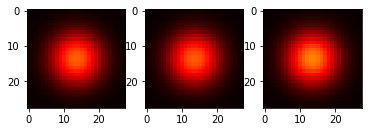

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.048094093799591064, dimming (predicted): 0.07351703196763992


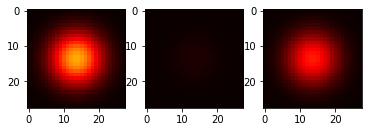

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3583253026008606, dimming (predicted): 0.25802937150001526


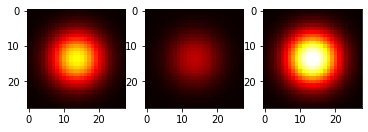

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.675832211971283, dimming (predicted): 0.7333590388298035


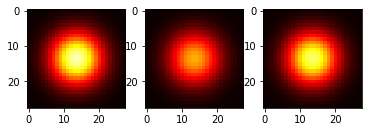

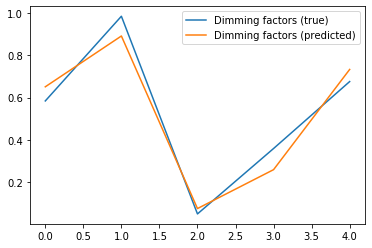

Current loss: 0.00415058946236968
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8089181184768677, dimming (predicted): 0.8376138210296631


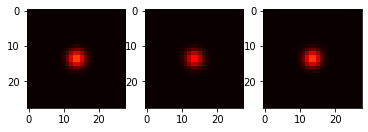

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5827544331550598, dimming (predicted): 0.5491770505905151


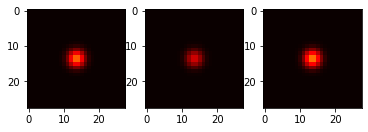

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2995821237564087, dimming (predicted): 0.29782456159591675


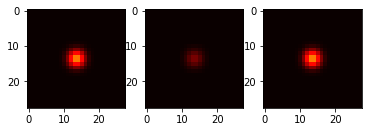

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.20073282718658447, dimming (predicted): 0.25260138511657715


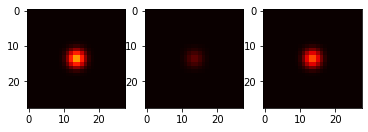

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6307920813560486, dimming (predicted): 0.7410014867782593


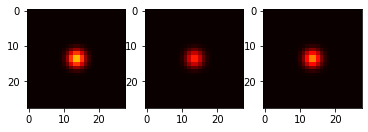

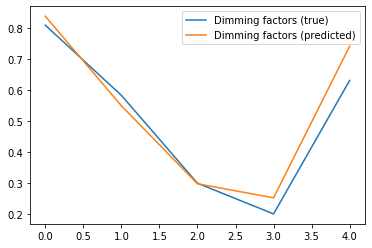

Current loss: 0.003470772411674261
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.18223464488983154, dimming (predicted): 0.19827181100845337


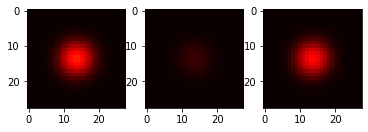

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.777337908744812, dimming (predicted): 0.8625199794769287


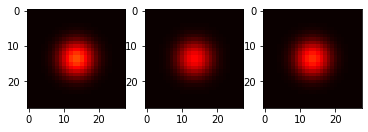

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7290016412734985, dimming (predicted): 0.7505574226379395


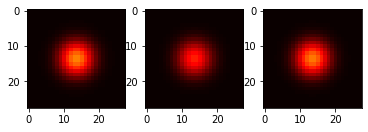

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.48600536584854126, dimming (predicted): 0.4216216504573822


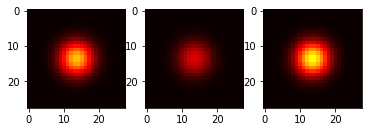

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.0022959113121032715, dimming (predicted): 0.07189430296421051


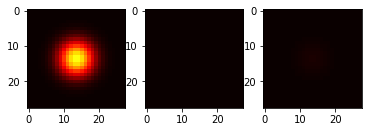

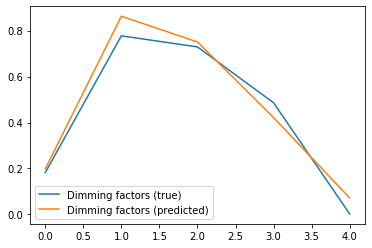

Current loss: 0.011900764890015125
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6762153506278992, dimming (predicted): 0.577295184135437


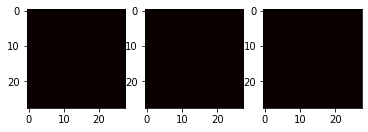

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5901327729225159, dimming (predicted): 0.31219300627708435


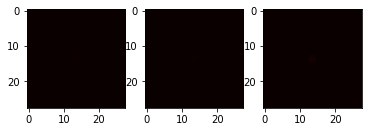

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.1362903118133545, dimming (predicted): 0.4001859426498413


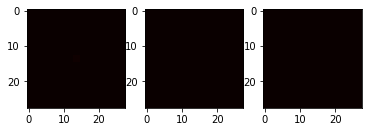

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7163387537002563, dimming (predicted): 0.48113545775413513


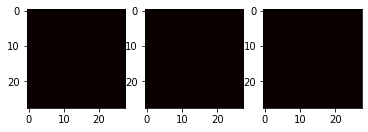

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.46367043256759644, dimming (predicted): 0.47034960985183716


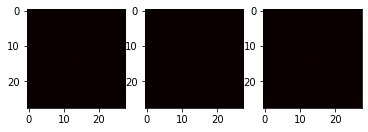

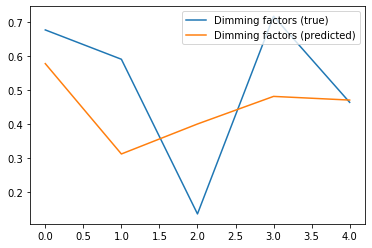

Current loss: 0.010572760365903378
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.40013009309768677, dimming (predicted): 0.4194481372833252


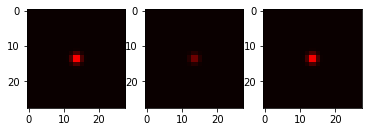

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.40054023265838623, dimming (predicted): 0.5320448279380798


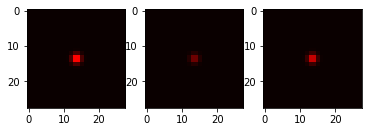

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9242481589317322, dimming (predicted): 0.8547223210334778


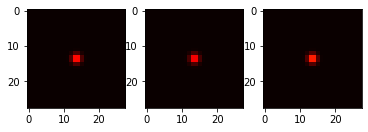

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.879388689994812, dimming (predicted): 0.8548064231872559


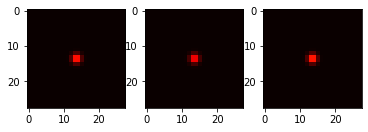

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5407001376152039, dimming (predicted): 0.5497993230819702


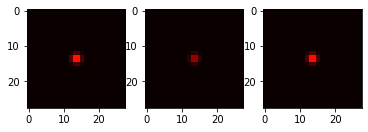

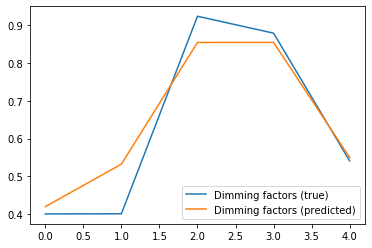

Current loss: 0.011500060558319092
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3435993790626526, dimming (predicted): 0.46482595801353455


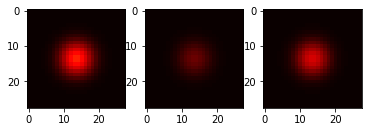

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9327002167701721, dimming (predicted): 0.8833662271499634


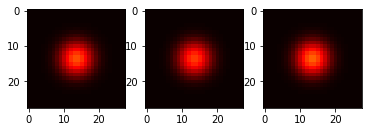

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5245079398155212, dimming (predicted): 0.5305529236793518


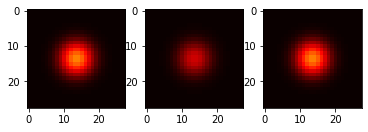

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9823361039161682, dimming (predicted): 0.9220689535140991


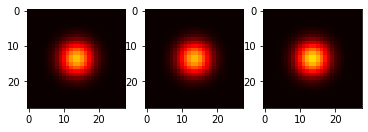

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6099435091018677, dimming (predicted): 0.6784189343452454


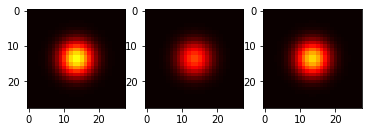

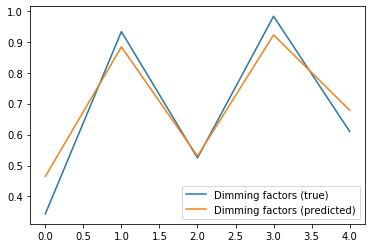

Current loss: 0.002264156471937895
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.09345269203186035, dimming (predicted): 0.19874872267246246


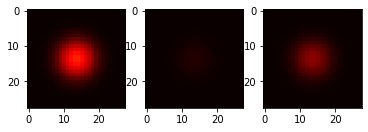

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.19093477725982666, dimming (predicted): 0.2435661107301712


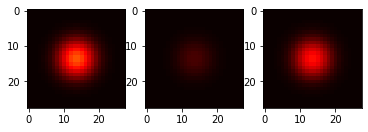

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7548925280570984, dimming (predicted): 0.8284830451011658


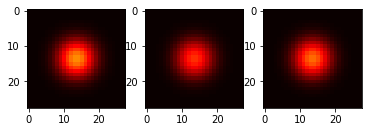

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4617769122123718, dimming (predicted): 0.513007640838623


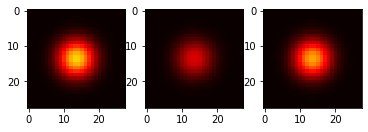

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2623831629753113, dimming (predicted): 0.26691487431526184


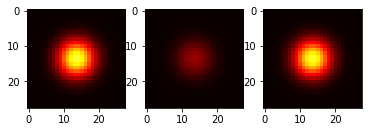

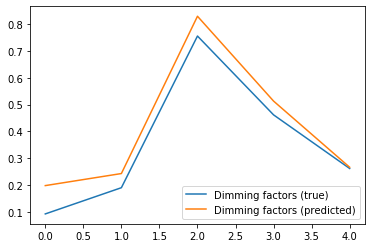

Current loss: 0.0016414495185017586
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.09589022397994995, dimming (predicted): 0.12941056489944458


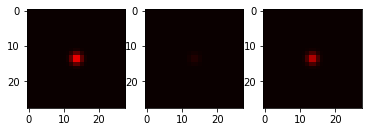

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.39929628372192383, dimming (predicted): 0.38811343908309937


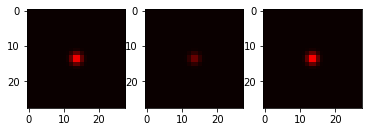

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3522396683692932, dimming (predicted): 0.32709774374961853


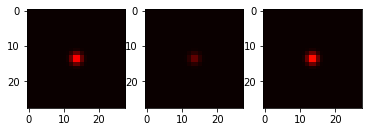

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9595425724983215, dimming (predicted): 0.8865490555763245


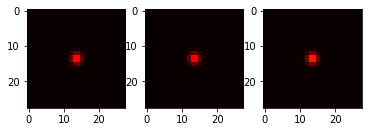

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.71119225025177, dimming (predicted): 0.7420378923416138


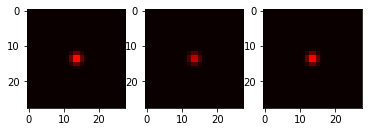

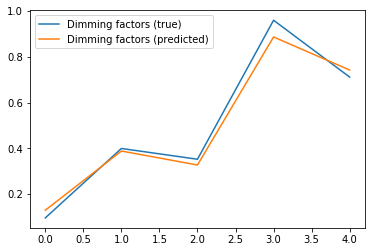

Current loss: 0.002894963836297393
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5761010646820068, dimming (predicted): 0.6438246369361877


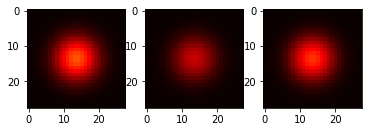

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.34608906507492065, dimming (predicted): 0.36229294538497925


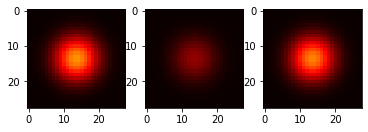

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.40699124336242676, dimming (predicted): 0.42900875210762024


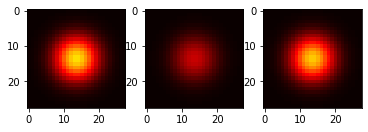

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7519940733909607, dimming (predicted): 0.7710301876068115


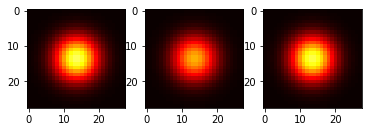

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.43685901165008545, dimming (predicted): 0.5007749795913696


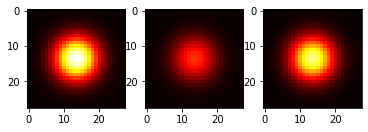

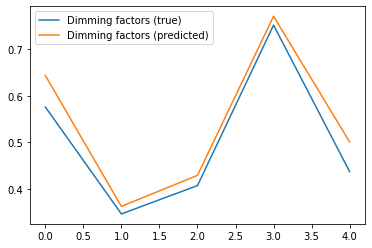

Current loss: 0.004778578411787748
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8886355757713318, dimming (predicted): 0.84983891248703


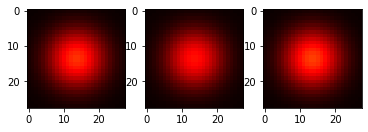

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2979651689529419, dimming (predicted): 0.2036413699388504


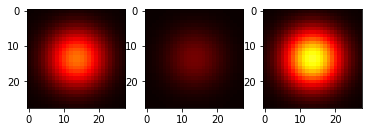

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9261769652366638, dimming (predicted): 0.8779874444007874


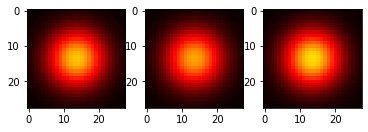

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.09123456478118896, dimming (predicted): 0.09791333973407745


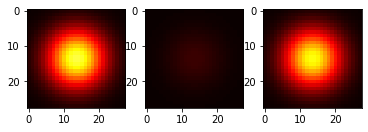

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6042619943618774, dimming (predicted): 0.5862423181533813


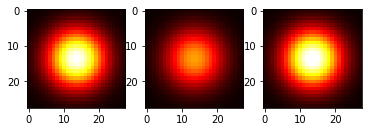

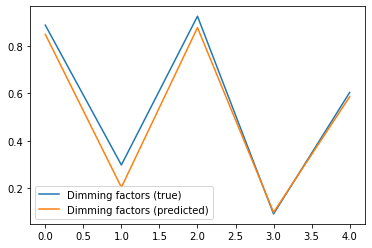

Current loss: 0.0058907316997647285
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5425238609313965, dimming (predicted): 0.5931460857391357


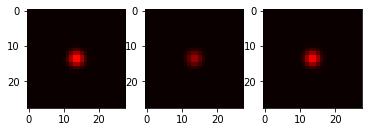

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6417891383171082, dimming (predicted): 0.7192080020904541


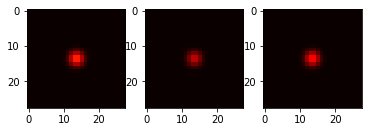

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5276715159416199, dimming (predicted): 0.5426676869392395


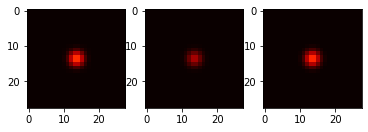

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3244575262069702, dimming (predicted): 0.2237759381532669


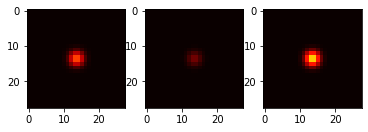

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.925690233707428, dimming (predicted): 0.9629026055335999


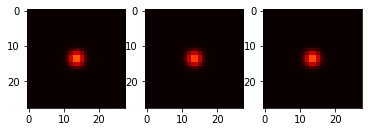

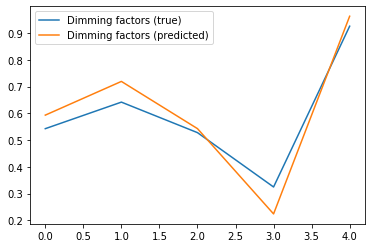

Current loss: 0.00612677913159132
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5086798071861267, dimming (predicted): 0.5066367983818054


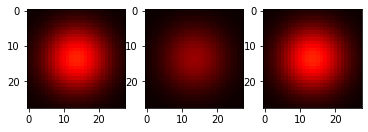

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8671576380729675, dimming (predicted): 0.8947924971580505


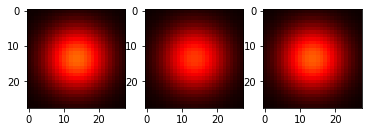

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8074736595153809, dimming (predicted): 0.8334572315216064


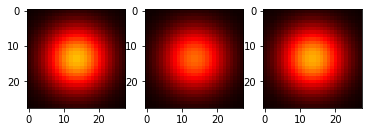

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.05667084455490112, dimming (predicted): 0.05816270038485527


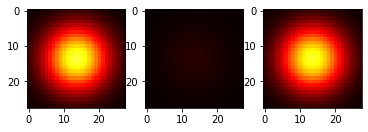

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.24398273229599, dimming (predicted): 0.18044337630271912


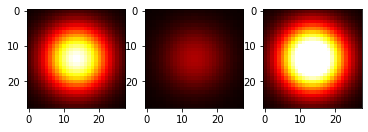

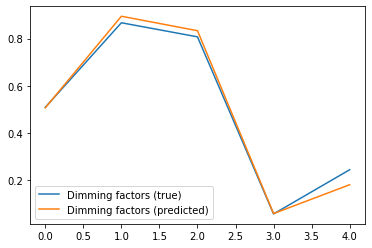

Current loss: 0.01273445226252079
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.12503069639205933, dimming (predicted): 0.08323600143194199


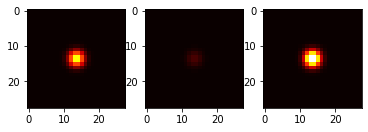

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6622500419616699, dimming (predicted): 0.6536039710044861


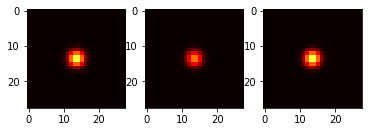

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8884439468383789, dimming (predicted): 0.8791527152061462


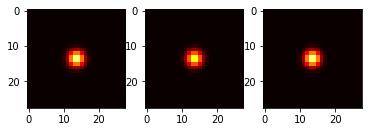

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3193192481994629, dimming (predicted): 0.22375555336475372


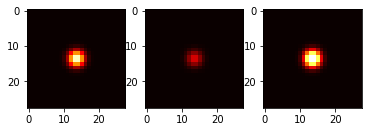

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5192983150482178, dimming (predicted): 0.4261031448841095


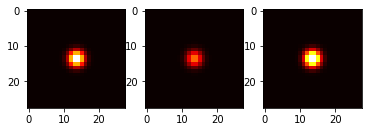

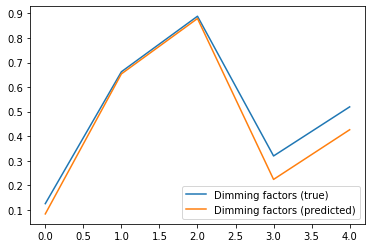

Current loss: 0.01493336446583271
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6388151049613953, dimming (predicted): 0.4270626902580261


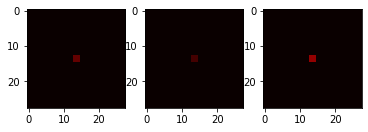

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4916265606880188, dimming (predicted): 0.43156692385673523


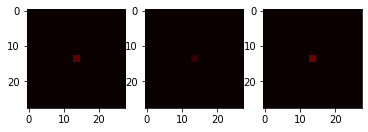

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.970121443271637, dimming (predicted): 0.5523382425308228


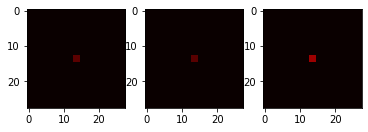

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.1290595531463623, dimming (predicted): 0.2193116694688797


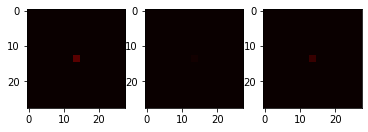

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.547696590423584, dimming (predicted): 0.4100348651409149


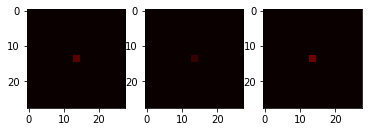

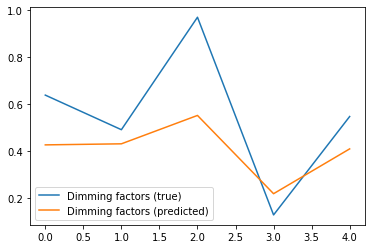

Current loss: 0.0029655941762030125
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.12794941663742065, dimming (predicted): 0.12129553407430649


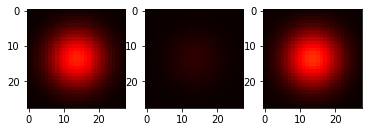

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5353648662567139, dimming (predicted): 0.49852675199508667


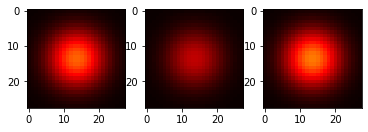

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8777145147323608, dimming (predicted): 0.8940358757972717


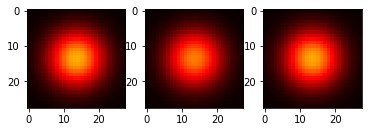

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.36799192428588867, dimming (predicted): 0.38316839933395386


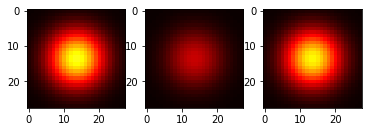

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.16374337673187256, dimming (predicted): 0.157143697142601


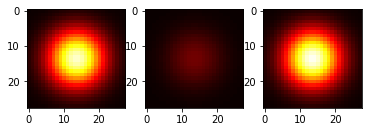

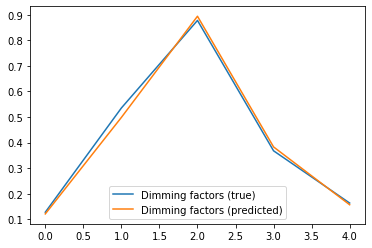

Current loss: 0.024114258587360382
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.1146971583366394, dimming (predicted): 0.47476470470428467


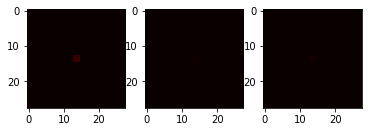

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.587094247341156, dimming (predicted): 0.4579319357872009


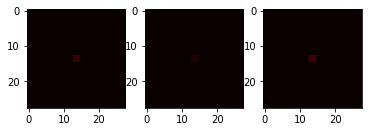

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5397028923034668, dimming (predicted): 0.4219784736633301


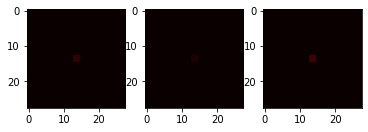

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6799194812774658, dimming (predicted): 0.4289824962615967


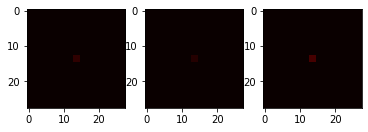

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7899171710014343, dimming (predicted): 0.5204488039016724


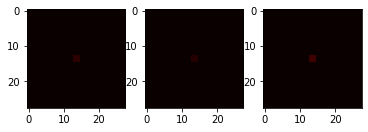

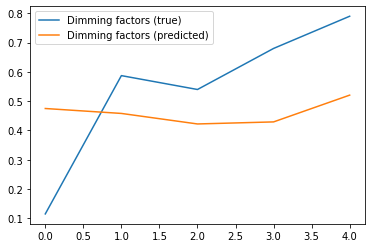

Current loss: 0.03586743026971817
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7358436584472656, dimming (predicted): 0.7785251140594482


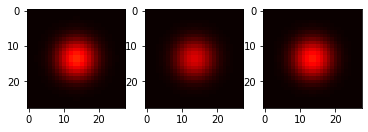

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6411855816841125, dimming (predicted): 0.6161099076271057


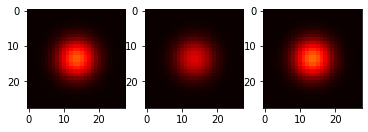

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.03098118305206299, dimming (predicted): 0.07399723678827286


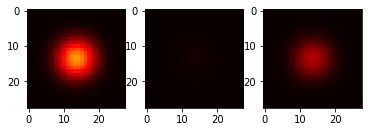

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.24029064178466797, dimming (predicted): 0.3066830337047577


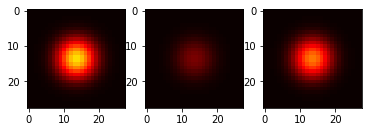

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.30499064922332764, dimming (predicted): 0.23758751153945923


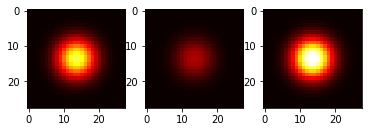

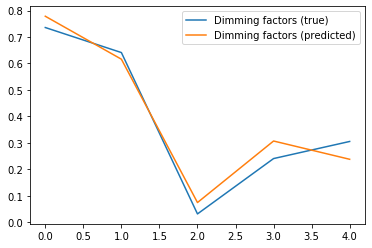

Current loss: 0.005809569265693426
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2347344160079956, dimming (predicted): 0.14808660745620728


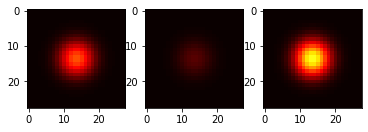

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.22429990768432617, dimming (predicted): 0.12498655915260315


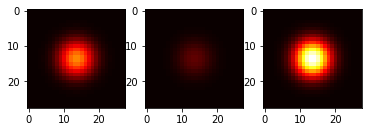

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.40710824728012085, dimming (predicted): 0.35179901123046875


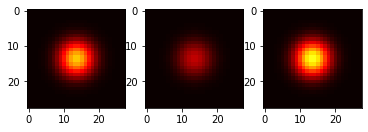

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.845266580581665, dimming (predicted): 0.7858238220214844


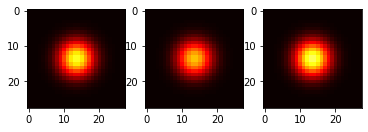

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5783863067626953, dimming (predicted): 0.5648407936096191


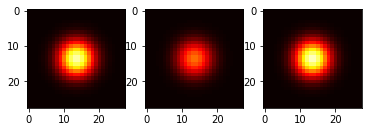

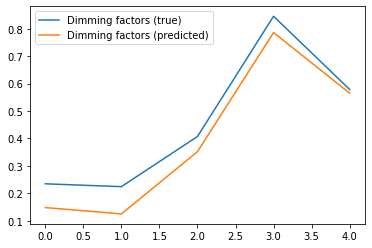

Current loss: 0.03479550778865814
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7720676064491272, dimming (predicted): 0.5904785990715027


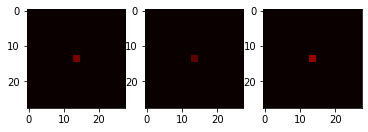

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5195521116256714, dimming (predicted): 0.41628438234329224


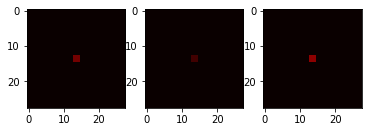

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7797118425369263, dimming (predicted): 0.5157875418663025


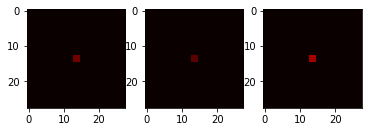

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8720085620880127, dimming (predicted): 0.630207359790802


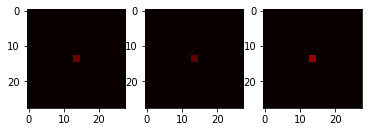

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9138269424438477, dimming (predicted): 0.499309778213501


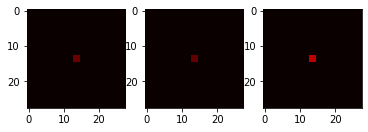

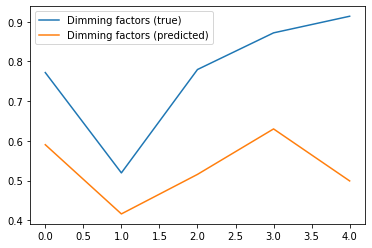

Current loss: 0.03238080069422722
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6898501515388489, dimming (predicted): 0.6978318095207214


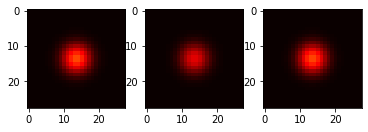

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4345651865005493, dimming (predicted): 0.38225385546684265


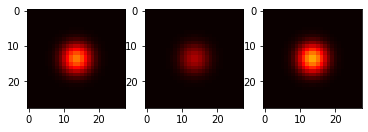

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.12325054407119751, dimming (predicted): 0.09899929910898209


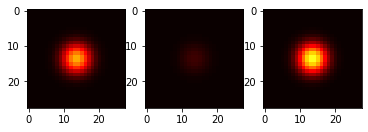

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5581284761428833, dimming (predicted): 0.5348233580589294


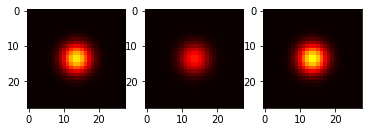

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5501956343650818, dimming (predicted): 0.541511595249176


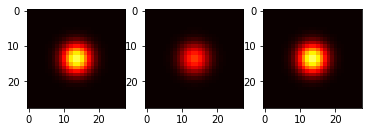

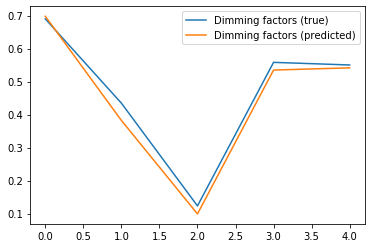

Current loss: 0.007781648542732
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.427878201007843, dimming (predicted): 0.32661962509155273


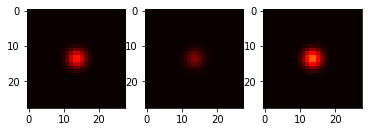

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5454131960868835, dimming (predicted): 0.5015991926193237


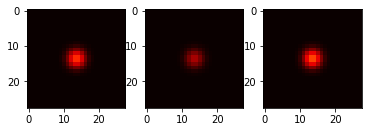

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7752137184143066, dimming (predicted): 0.789612352848053


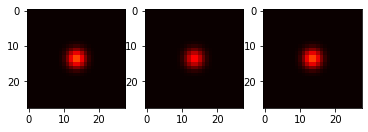

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8296290636062622, dimming (predicted): 0.8316723108291626


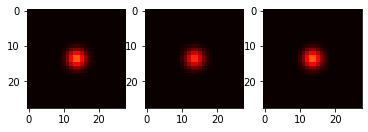

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8274686336517334, dimming (predicted): 0.7279985547065735


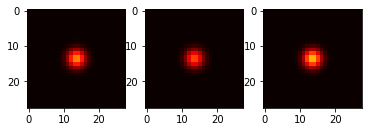

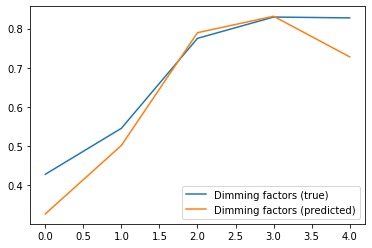

Current loss: 0.012937265448272228
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9182865023612976, dimming (predicted): 0.850770890712738


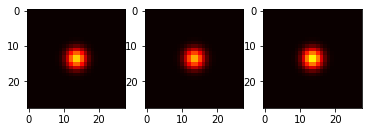

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9468508362770081, dimming (predicted): 0.8134837746620178


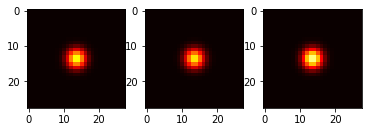

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8676462769508362, dimming (predicted): 0.7807487845420837


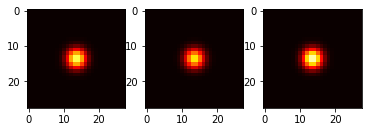

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.334894597530365, dimming (predicted): 0.1657160222530365


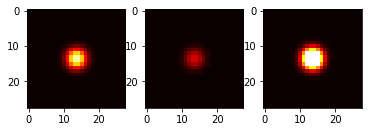

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5452095866203308, dimming (predicted): 0.44365671277046204


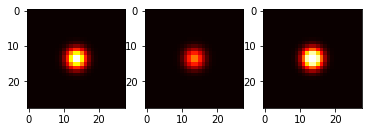

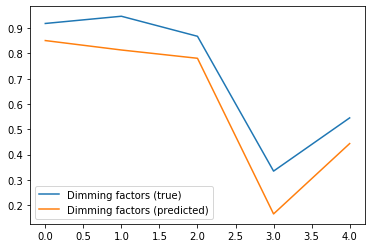

Current loss: 0.0037748522590845823
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6627153158187866, dimming (predicted): 0.6670097708702087


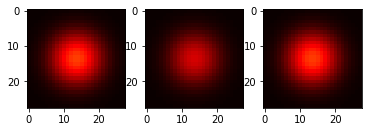

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.18878430128097534, dimming (predicted): 0.15112218260765076


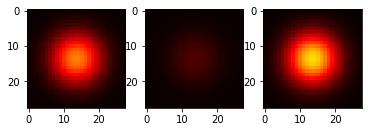

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4649561643600464, dimming (predicted): 0.5657107830047607


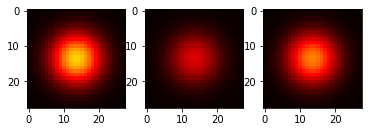

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8239912986755371, dimming (predicted): 0.8892945647239685


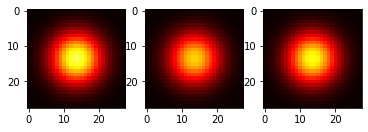

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.37341105937957764, dimming (predicted): 0.38499853014945984


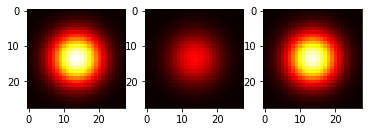

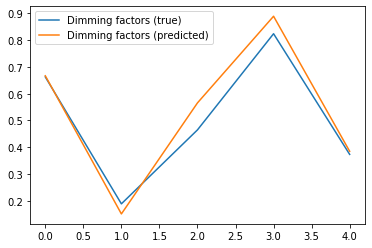

Current loss: 0.03268272802233696
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7458605170249939, dimming (predicted): 0.8108707070350647


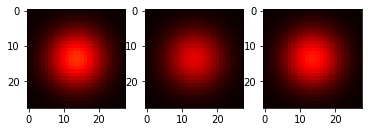

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3855178952217102, dimming (predicted): 0.30207401514053345


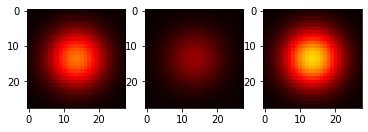

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.007565319538116455, dimming (predicted): 0.05850644409656525


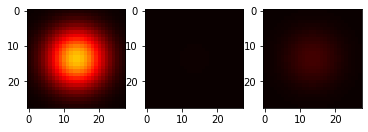

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7428321242332458, dimming (predicted): 0.7009545564651489


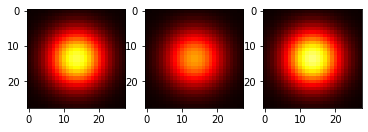

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6637371182441711, dimming (predicted): 0.5868111848831177


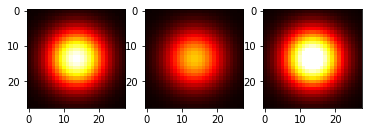

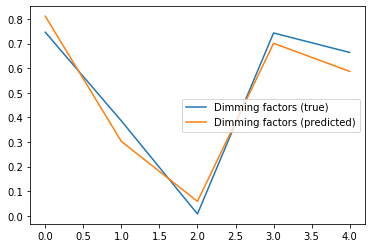

Current loss: 0.008876072242856026
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.061811208724975586, dimming (predicted): 0.0817057266831398


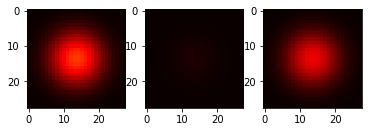

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8830175399780273, dimming (predicted): 0.7322270274162292


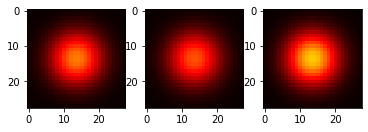

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9083916544914246, dimming (predicted): 0.802517831325531


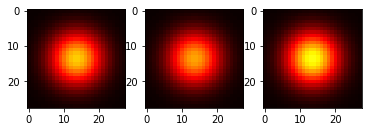

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.12179923057556152, dimming (predicted): 0.09167122095823288


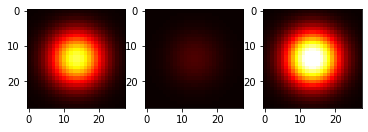

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.896506130695343, dimming (predicted): 0.7956638336181641


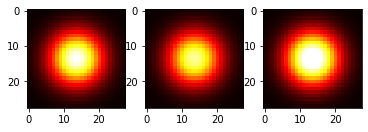

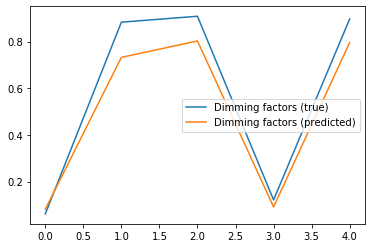

Current loss: 0.0047254664823412895
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9024569392204285, dimming (predicted): 0.8041741251945496


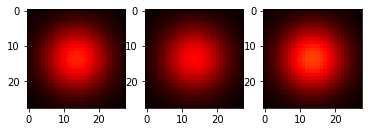

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.13421905040740967, dimming (predicted): 0.15705958008766174


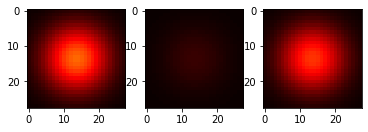

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.11013460159301758, dimming (predicted): 0.12780094146728516


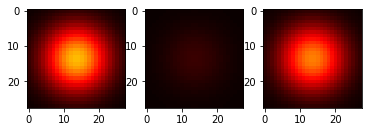

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.347423255443573, dimming (predicted): 0.4592495262622833


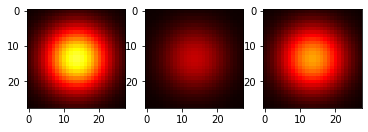

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7525111436843872, dimming (predicted): 0.8458545804023743


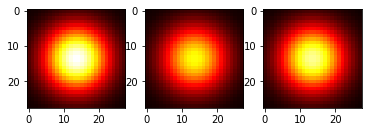

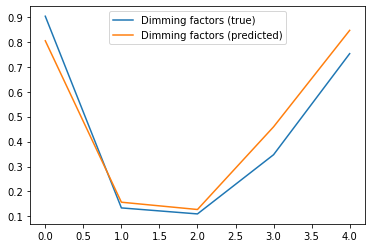

Current loss: 0.020874004811048508
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.25270432233810425, dimming (predicted): 0.33678364753723145


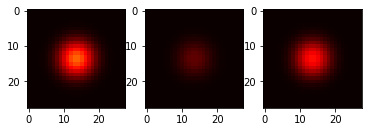

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.1728011965751648, dimming (predicted): 0.17272472381591797


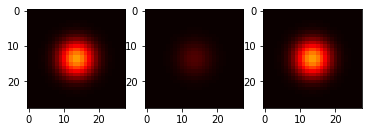

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.010685920715332031, dimming (predicted): 0.11067571491003036


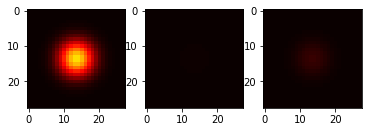

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.32659727334976196, dimming (predicted): 0.26703596115112305


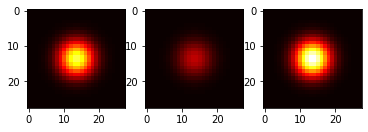

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9054248332977295, dimming (predicted): 0.9004796147346497


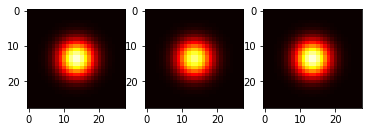

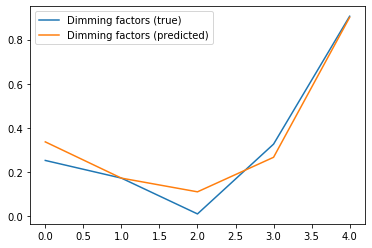

Current loss: 0.0015785960713401437
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9170461297035217, dimming (predicted): 0.8885163068771362


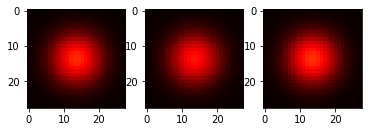

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6872155666351318, dimming (predicted): 0.660202145576477


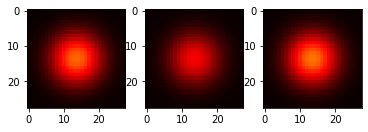

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5689524412155151, dimming (predicted): 0.5556788444519043


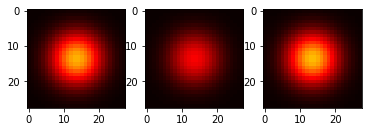

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.09889107942581177, dimming (predicted): 0.10489416867494583


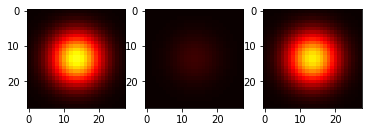

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6822509765625, dimming (predicted): 0.593028724193573


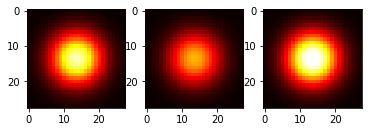

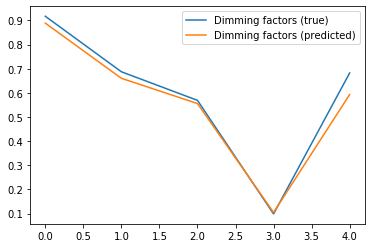

Current loss: 0.044604312628507614
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.681315541267395, dimming (predicted): 0.4212662875652313


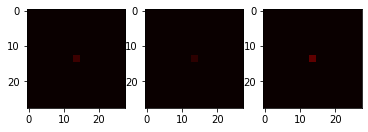

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9367078542709351, dimming (predicted): 0.5534424185752869


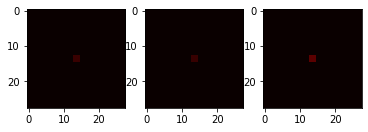

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.1915413737297058, dimming (predicted): 0.4911792576313019


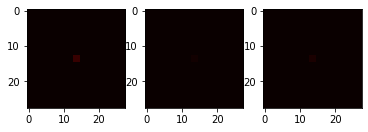

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8792012333869934, dimming (predicted): 0.44351518154144287


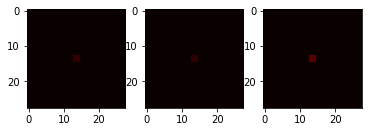

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6114676594734192, dimming (predicted): 0.48628485202789307


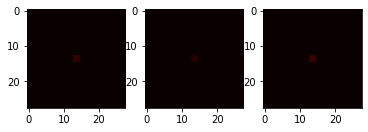

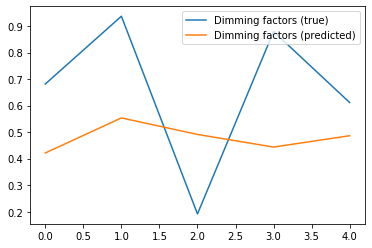

Current loss: 0.03846191614866257
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7243038415908813, dimming (predicted): 0.7284972071647644


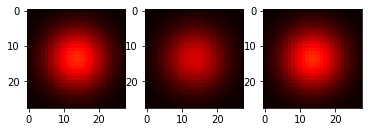

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7396605014801025, dimming (predicted): 0.7954325675964355


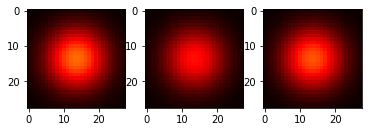

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6736946702003479, dimming (predicted): 0.7848474383354187


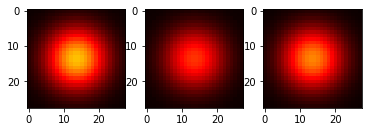

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7546567916870117, dimming (predicted): 0.7539970874786377


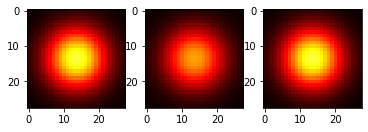

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.49369025230407715, dimming (predicted): 0.5108882784843445


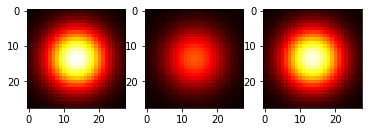

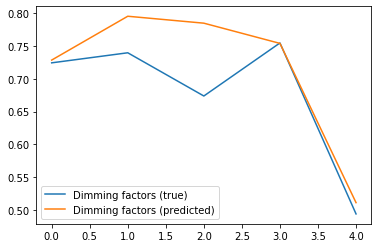

Current loss: 0.004584917798638344
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.802696943283081, dimming (predicted): 0.8324797749519348


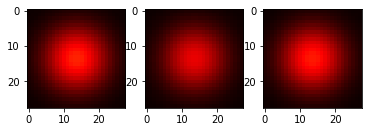

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.637680172920227, dimming (predicted): 0.7299319505691528


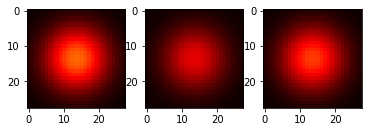

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4282979965209961, dimming (predicted): 0.5189829468727112


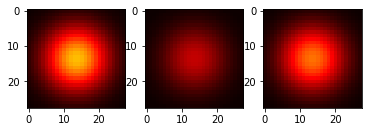

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4409668445587158, dimming (predicted): 0.47482725977897644


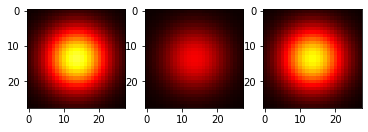

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4278882145881653, dimming (predicted): 0.4900837242603302


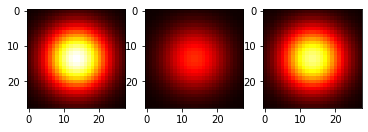

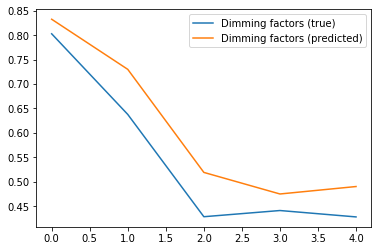

Current loss: 0.004393099807202816
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5655720829963684, dimming (predicted): 0.499070942401886


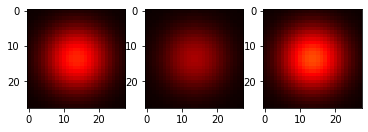

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2851974368095398, dimming (predicted): 0.24004215002059937


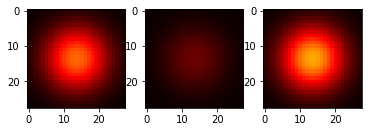

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8350989818572998, dimming (predicted): 0.8030387163162231


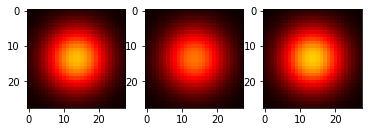

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6758432984352112, dimming (predicted): 0.6329427361488342


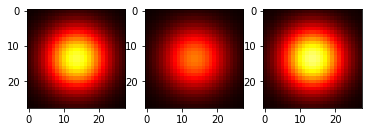

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9544765949249268, dimming (predicted): 0.8854420185089111


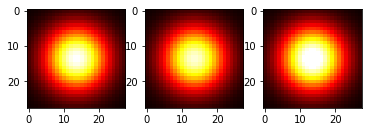

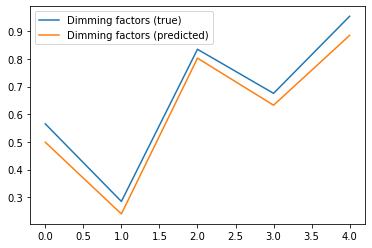

Current loss: 0.045043934136629105
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.11043500900268555, dimming (predicted): 0.15033146739006042


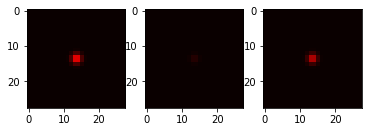

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5548344254493713, dimming (predicted): 0.5912394523620605


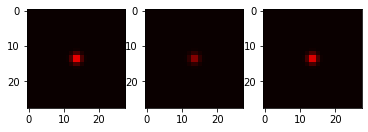

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.41725724935531616, dimming (predicted): 0.564075231552124


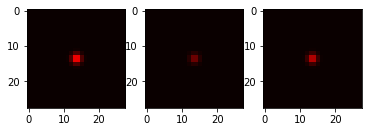

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9900268316268921, dimming (predicted): 0.924220621585846


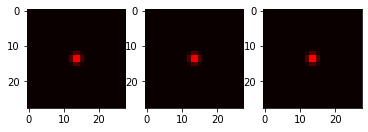

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7166337966918945, dimming (predicted): 0.7990092039108276


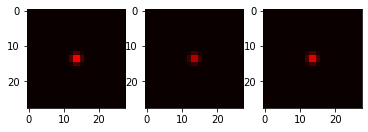

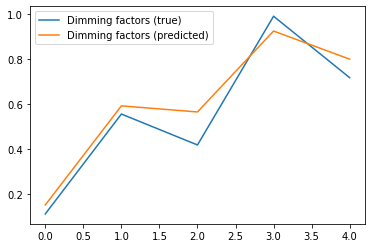

Current loss: 0.008188101463019848
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8482296466827393, dimming (predicted): 0.8438668847084045


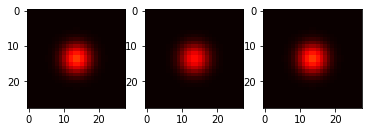

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8170474171638489, dimming (predicted): 0.7590094804763794


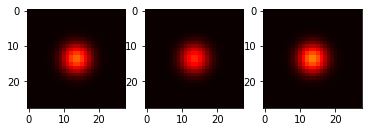

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2881298065185547, dimming (predicted): 0.21115395426750183


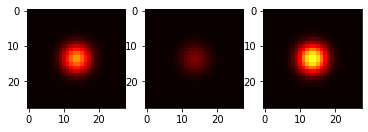

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.29394829273223877, dimming (predicted): 0.19493506848812103


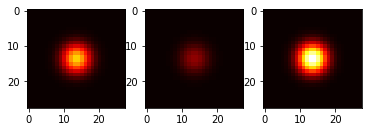

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.28470295667648315, dimming (predicted): 0.24330250918865204


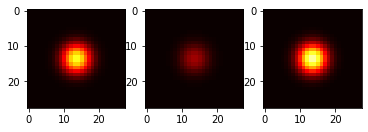

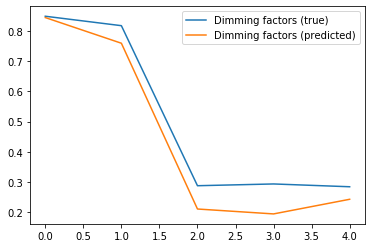

Current loss: 0.007174610160291195
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2901080846786499, dimming (predicted): 0.2930791974067688


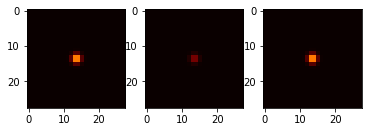

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.21806973218917847, dimming (predicted): 0.25357717275619507


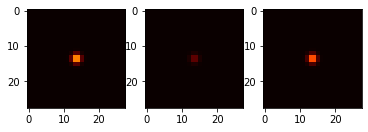

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5599697828292847, dimming (predicted): 0.6301235556602478


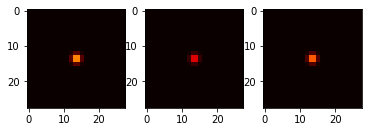

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.04022777080535889, dimming (predicted): 0.11970662325620651


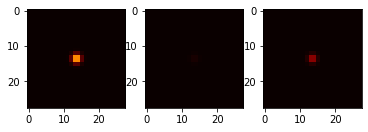

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5253127217292786, dimming (predicted): 0.5945993065834045


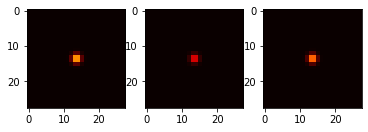

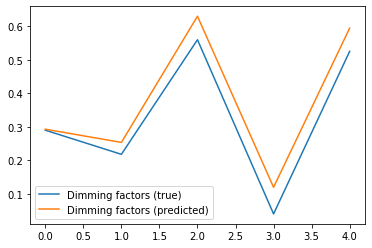

Current loss: 0.0015267353737726808
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.17443937063217163, dimming (predicted): 0.20082753896713257


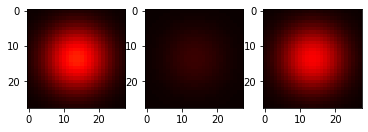

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.28124070167541504, dimming (predicted): 0.22482964396476746


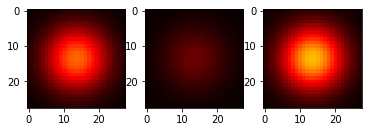

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6192247271537781, dimming (predicted): 0.68729567527771


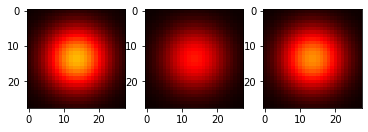

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7831975817680359, dimming (predicted): 0.7838345170021057


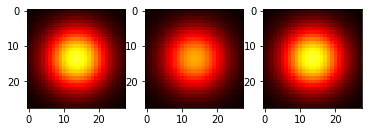

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.49500346183776855, dimming (predicted): 0.5285022258758545


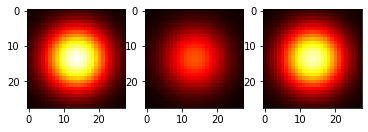

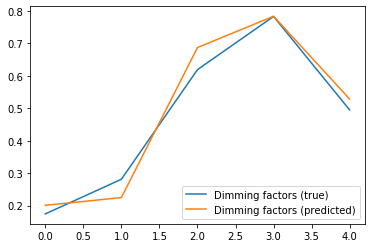

Current loss: 0.0033653955906629562
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.40936917066574097, dimming (predicted): 0.40184223651885986


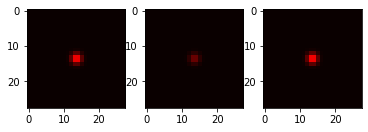

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.11672180891036987, dimming (predicted): 0.15816321969032288


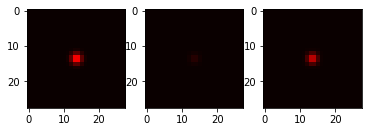

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9210735559463501, dimming (predicted): 0.8902692198753357


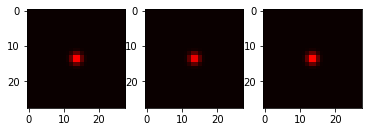

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.008589386940002441, dimming (predicted): 0.12293323874473572


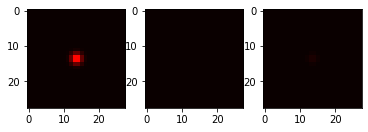

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5323225855827332, dimming (predicted): 0.675791323184967


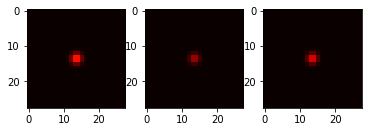

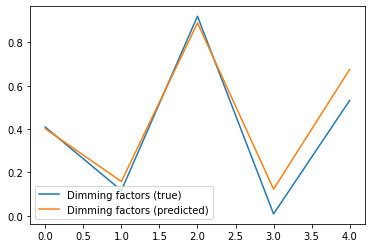

Current loss: 0.009680462069809437
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.06941038370132446, dimming (predicted): 0.12993529438972473


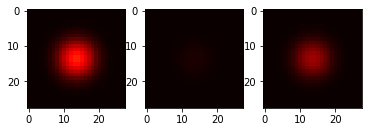

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.38587069511413574, dimming (predicted): 0.46479174494743347


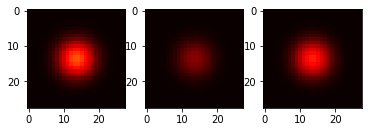

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8217455744743347, dimming (predicted): 0.7577965259552002


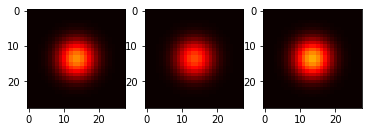

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5197648406028748, dimming (predicted): 0.5616002082824707


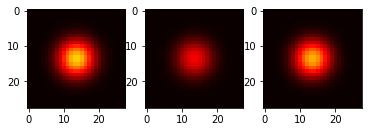

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9529891014099121, dimming (predicted): 0.8904427886009216


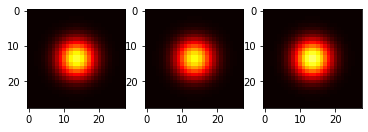

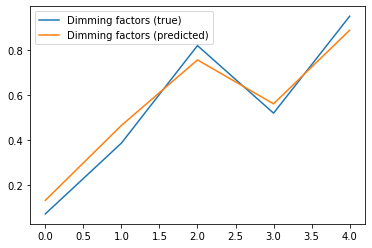

Current loss: 0.002336455974727869
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8391638398170471, dimming (predicted): 0.8441932201385498


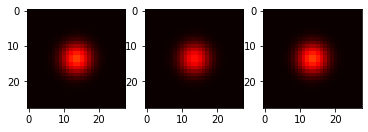

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.06600052118301392, dimming (predicted): 0.1075032651424408


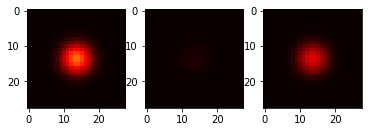

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4212568402290344, dimming (predicted): 0.5411193370819092


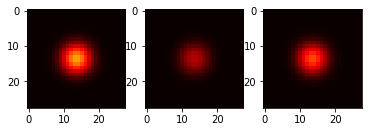

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8331860899925232, dimming (predicted): 0.8443198204040527


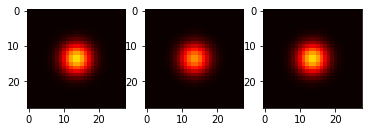

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.774576723575592, dimming (predicted): 0.8380281925201416


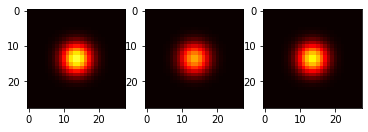

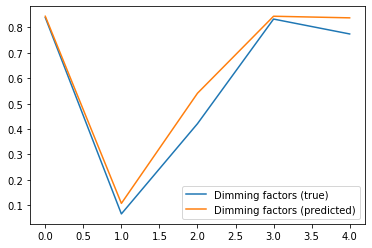

Current loss: 0.003167416900396347
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.41975724697113037, dimming (predicted): 0.3836643695831299


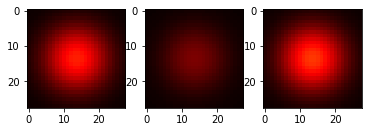

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.23337125778198242, dimming (predicted): 0.18399390578269958


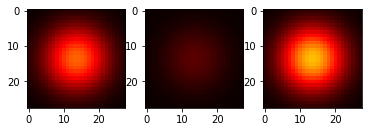

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6063016057014465, dimming (predicted): 0.5722957253456116


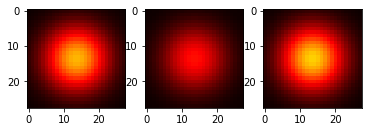

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.048477232456207275, dimming (predicted): 0.09282334893941879


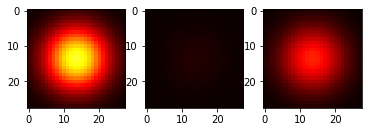

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7493592500686646, dimming (predicted): 0.775039792060852


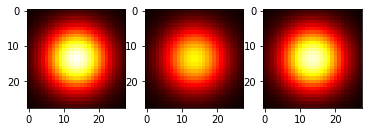

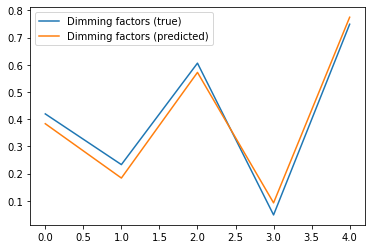

Current loss: 0.003393500344827771
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6384774446487427, dimming (predicted): 0.630878746509552


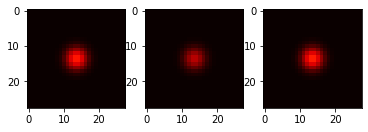

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4894881844520569, dimming (predicted): 0.4566343128681183


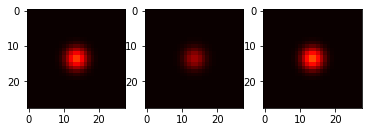

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5771492719650269, dimming (predicted): 0.5921347737312317


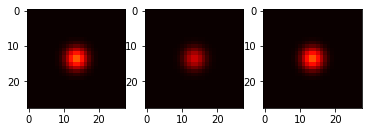

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.37457311153411865, dimming (predicted): 0.35008904337882996


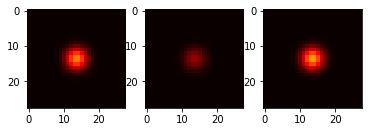

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6792457103729248, dimming (predicted): 0.706595242023468


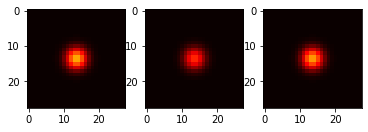

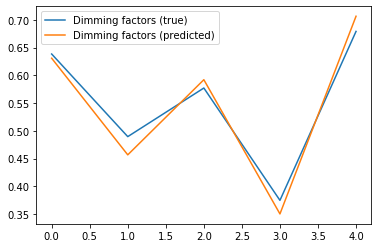

Current loss: 0.004667137749493122
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.05105280876159668, dimming (predicted): 0.09050070494413376


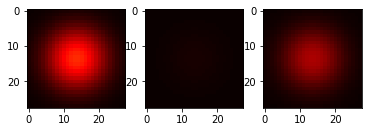

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7359321713447571, dimming (predicted): 0.7233259677886963


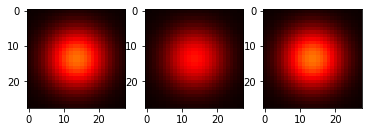

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7773318290710449, dimming (predicted): 0.8328993916511536


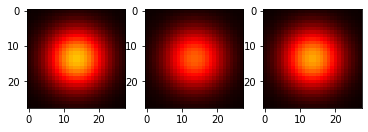

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.15822672843933105, dimming (predicted): 0.13315486907958984


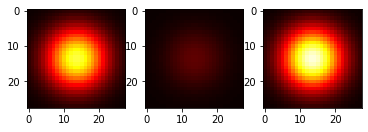

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.128307044506073, dimming (predicted): 0.1177576333284378


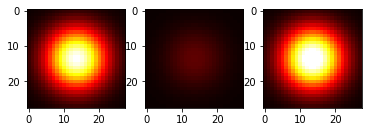

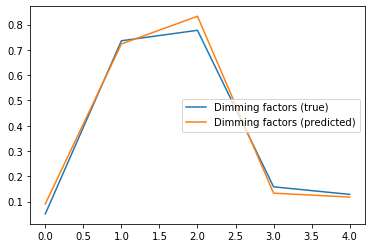

Current loss: 0.0022110522259026766
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.363209068775177, dimming (predicted): 0.36489057540893555


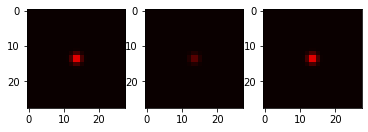

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7491912841796875, dimming (predicted): 0.7853288054466248


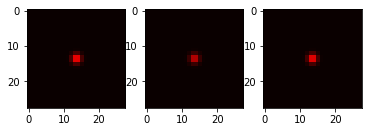

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.01421809196472168, dimming (predicted): 0.0598822683095932


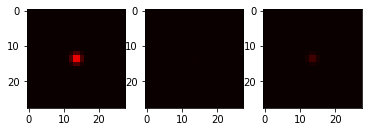

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6622705459594727, dimming (predicted): 0.6264897584915161


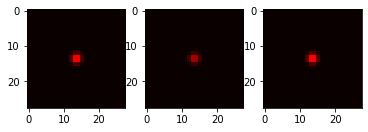

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6897023320198059, dimming (predicted): 0.6961563229560852


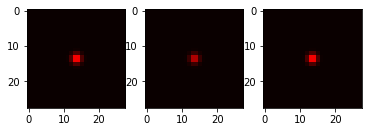

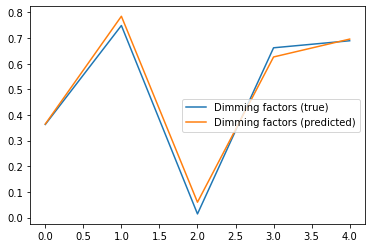

Current loss: 0.0017152698710560799
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6341065764427185, dimming (predicted): 0.6331971287727356


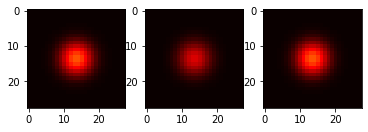

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5197089314460754, dimming (predicted): 0.5406832098960876


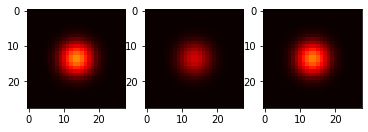

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.1403578519821167, dimming (predicted): 0.152576744556427


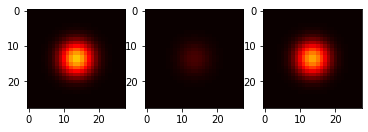

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7466735243797302, dimming (predicted): 0.7841758728027344


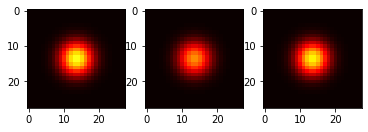

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6246158480644226, dimming (predicted): 0.6343832015991211


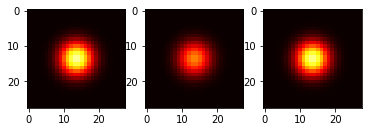

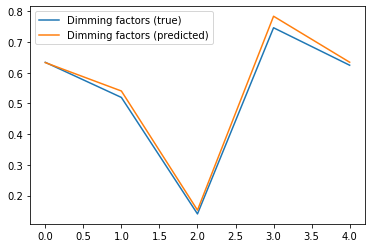

Current loss: 0.0019715181551873684
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.1246982216835022, dimming (predicted): 0.14361415803432465


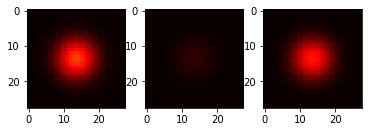

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8782958984375, dimming (predicted): 0.8566548824310303


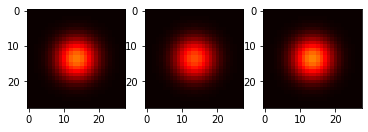

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5114479064941406, dimming (predicted): 0.4126945734024048


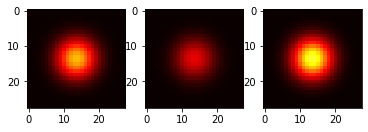

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7811341285705566, dimming (predicted): 0.8078522086143494


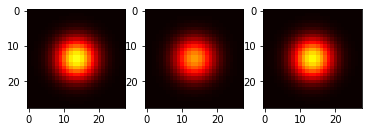

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5922899842262268, dimming (predicted): 0.6302993297576904


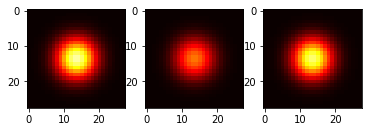

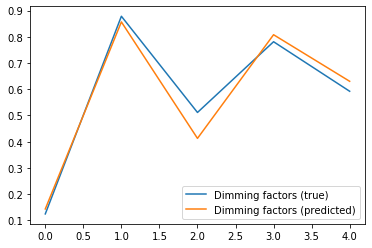

Current loss: 0.0015694517642259598
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.18137997388839722, dimming (predicted): 0.2166285514831543


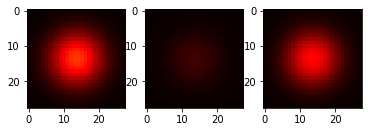

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.25792574882507324, dimming (predicted): 0.2797952890396118


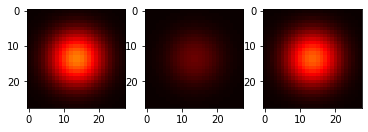

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.015637338161468506, dimming (predicted): 0.07399790734052658


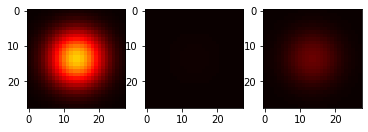

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.49751394987106323, dimming (predicted): 0.5700663924217224


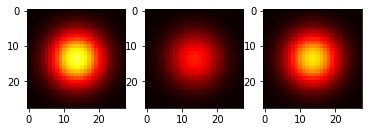

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.07712042331695557, dimming (predicted): 0.1232132762670517


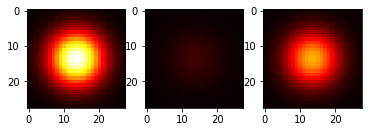

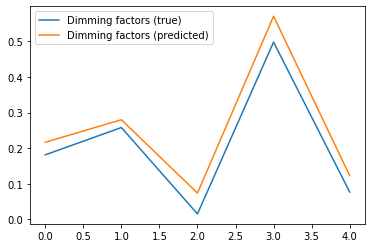

Current loss: 0.0034057472366839647
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3202645182609558, dimming (predicted): 0.3532218933105469


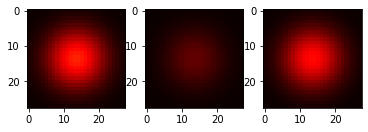

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7135030031204224, dimming (predicted): 0.8102543354034424


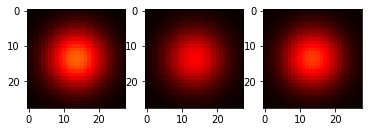

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.28760212659835815, dimming (predicted): 0.3658490478992462


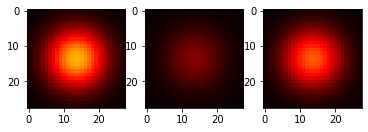

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.34567415714263916, dimming (predicted): 0.39809173345565796


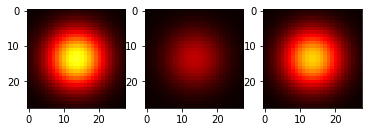

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5956556797027588, dimming (predicted): 0.6757192015647888


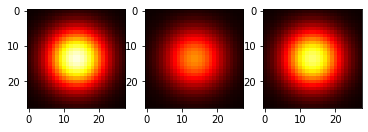

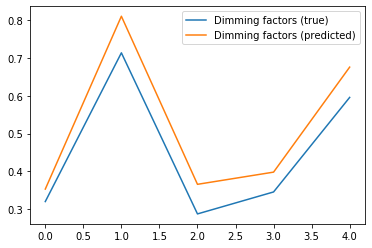

Current loss: 0.03716592490673065
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3615334630012512, dimming (predicted): 0.5591637492179871


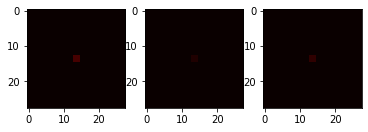

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.043392062187194824, dimming (predicted): 0.48149368166923523


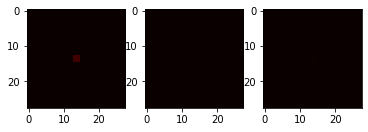

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9274417757987976, dimming (predicted): 0.5197535157203674


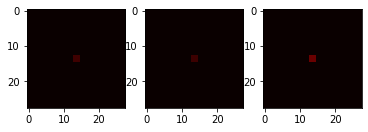

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.08832138776779175, dimming (predicted): 0.4775753319263458


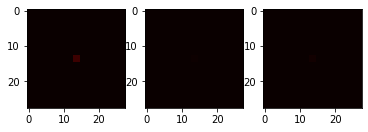

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.060192227363586426, dimming (predicted): 0.42510849237442017


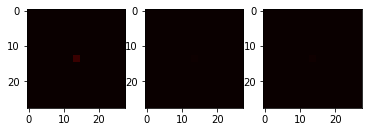

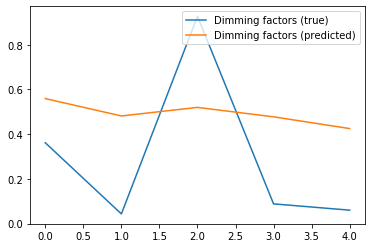

Current loss: 0.0029914570041000843
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5489238500595093, dimming (predicted): 0.6203754544258118


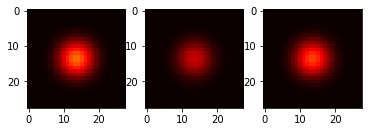

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7807871699333191, dimming (predicted): 0.8210633993148804


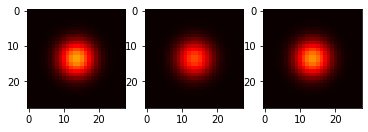

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.07884371280670166, dimming (predicted): 0.05595139414072037


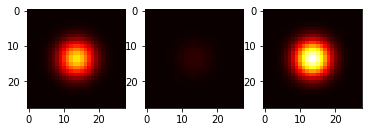

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.09699606895446777, dimming (predicted): 0.054720379412174225


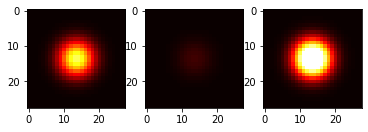

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.056705355644226074, dimming (predicted): 0.04140816256403923


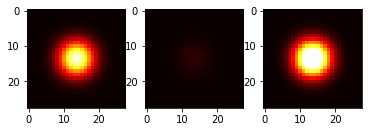

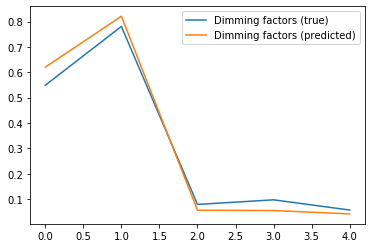

Current loss: 0.0017035097116604447
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5854687094688416, dimming (predicted): 0.5504981279373169


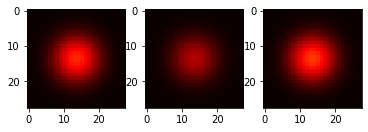

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.30277466773986816, dimming (predicted): 0.2703492343425751


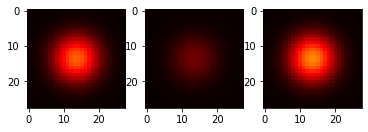

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6802118420600891, dimming (predicted): 0.6949200630187988


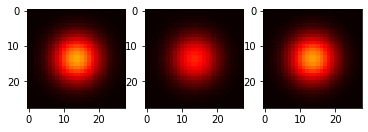

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2881430983543396, dimming (predicted): 0.25621145963668823


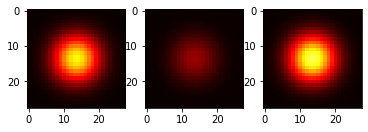

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5003618001937866, dimming (predicted): 0.46679216623306274


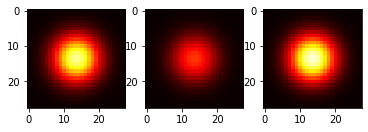

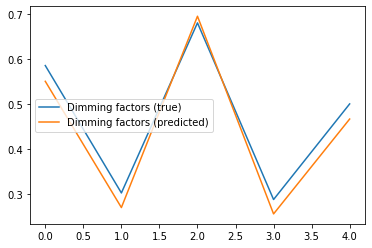

Current loss: 0.0022086738608777523
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6510438919067383, dimming (predicted): 0.7616245746612549


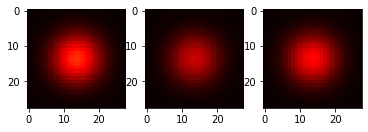

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.0164758563041687, dimming (predicted): 0.0720028281211853


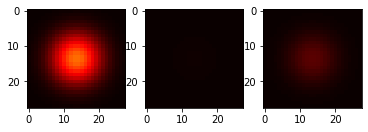

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7826099395751953, dimming (predicted): 0.7456925511360168


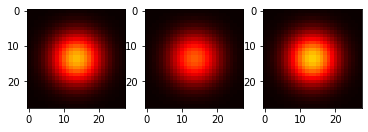

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3838844895362854, dimming (predicted): 0.3823709785938263


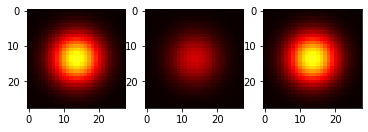

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3722307085990906, dimming (predicted): 0.36149314045906067


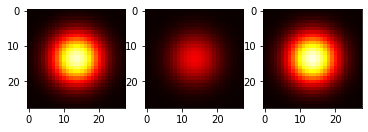

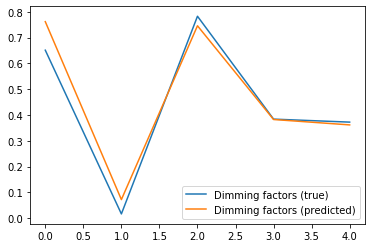

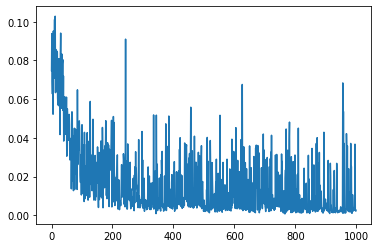

Loss min: 0.0007519329665228724, max: 0.10285864770412445, mean: 0.016695078083954287
0.016695078083954287


In [102]:
def make_sun_upperleft(num_channels):
    size = 28
    xx, yy = np.meshgrid(np.arange(size)-(size-1)/2.,np.arange(size)-(size-1)/2)
    r = np.sqrt(xx*xx+yy*yy) 
    R = np.random.rand(1)*(size/3)
    channels = []
    for c in range(num_channels):
        I_c = R**(c/10.)
        channels.append(np.exp(-(r*r)/(R*R))*I_c)
    image = torch.cat([torch.from_numpy(channel).float().to(device) for channel in channels]).view(num_channels, 28, 28)
    return image

upperleft_mean = run_experiment("upperleft_mean", make_sun_upperleft)
print(upperleft_mean)

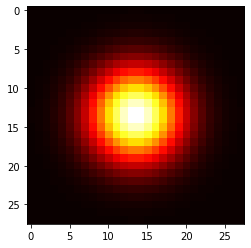

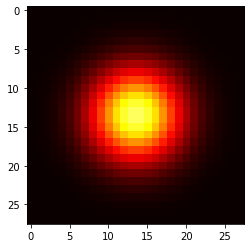

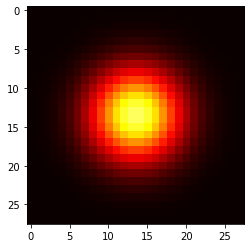

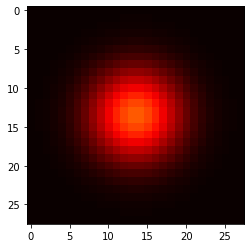

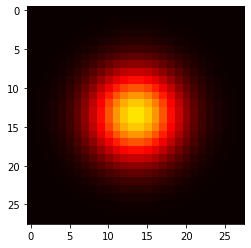

input_channels: 5
cnn_output_dim: 512
Current loss: 0.05421259254217148
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6805411577224731, dimming (predicted): 0.49189913272857666


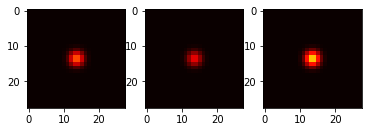

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4087222218513489, dimming (predicted): 0.4936603307723999


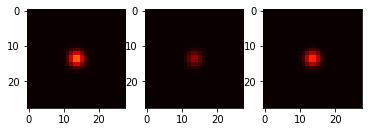

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6916486024856567, dimming (predicted): 0.5176777243614197


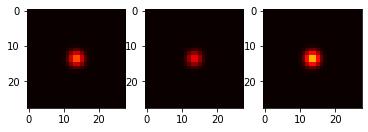

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8491874933242798, dimming (predicted): 0.5060298442840576


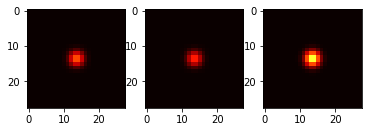

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8896107077598572, dimming (predicted): 0.49951761960983276


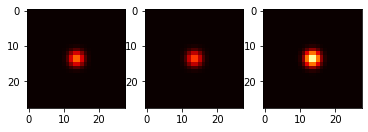

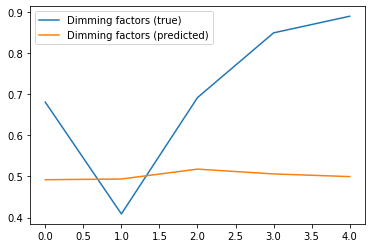

Current loss: 0.06328777968883514
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.13704270124435425, dimming (predicted): 0.4589211046695709


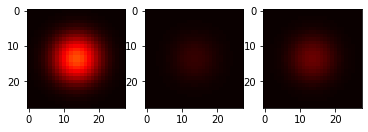

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.09654825925827026, dimming (predicted): 0.5300785303115845


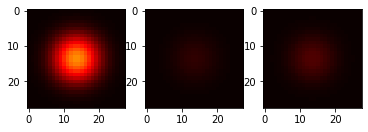

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7021108865737915, dimming (predicted): 0.5281700491905212


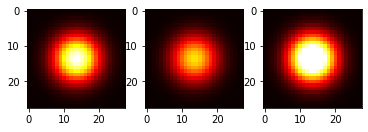

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3274728059768677, dimming (predicted): 0.5000686645507812


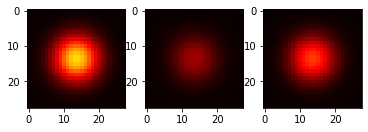

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.05157876014709473, dimming (predicted): 0.5180806517601013


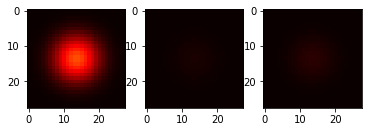

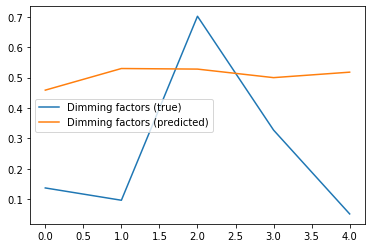

Current loss: 0.060404468327760696
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9686591029167175, dimming (predicted): 0.7346047163009644


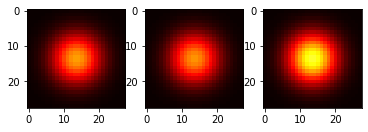

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4835734963417053, dimming (predicted): 0.4274173378944397


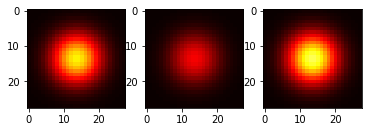

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9707170128822327, dimming (predicted): 0.540547251701355


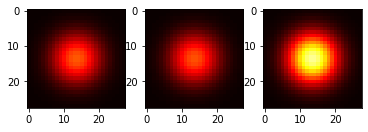

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7255938649177551, dimming (predicted): 0.5022639632225037


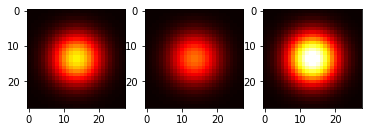

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9071272611618042, dimming (predicted): 0.6518135070800781


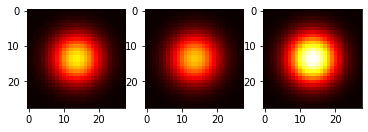

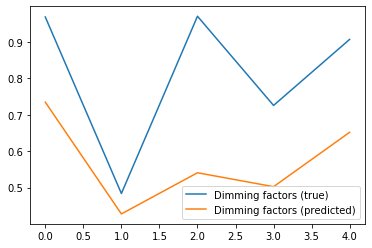

Current loss: 0.045810870826244354
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.07996624708175659, dimming (predicted): 0.3797754645347595


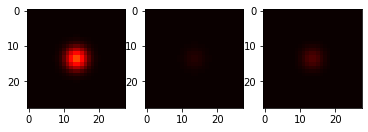

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.27652376890182495, dimming (predicted): 0.4724193215370178


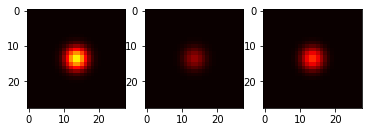

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4969094395637512, dimming (predicted): 0.5291759371757507


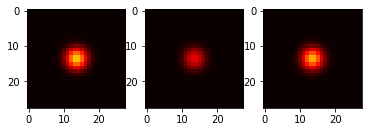

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.38229066133499146, dimming (predicted): 0.5228878855705261


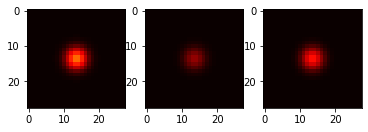

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5795354247093201, dimming (predicted): 0.5227312445640564


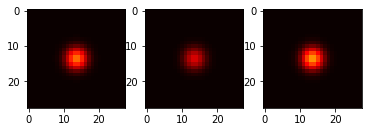

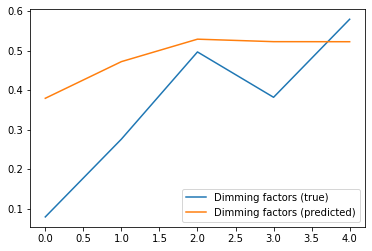

Current loss: 0.057367097586393356
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9328931570053101, dimming (predicted): 0.9117138385772705


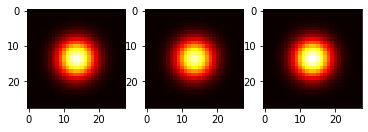

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.605495035648346, dimming (predicted): 0.5458067059516907


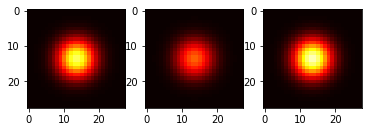

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8347646594047546, dimming (predicted): 0.8022127747535706


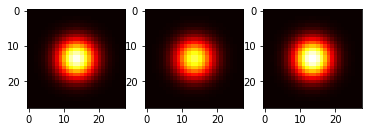

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4239123463630676, dimming (predicted): 0.22307440638542175


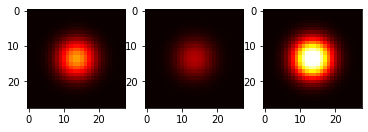

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9578791260719299, dimming (predicted): 0.4982534945011139


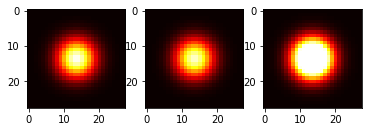

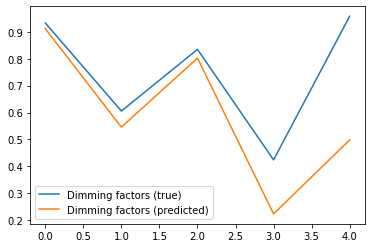

Current loss: 0.053472451865673065
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.05498605966567993, dimming (predicted): 0.2826506495475769


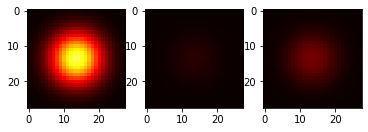

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.743354856967926, dimming (predicted): 0.6538614630699158


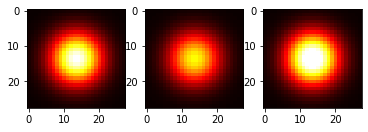

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.03986406326293945, dimming (predicted): 0.3773050010204315


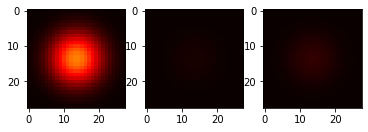

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9197180867195129, dimming (predicted): 0.83686363697052


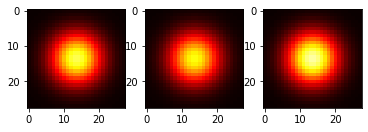

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2863059639930725, dimming (predicted): 0.5366643667221069


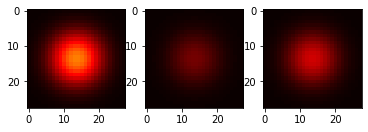

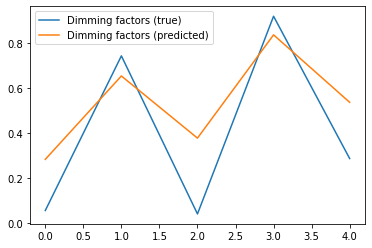

Current loss: 0.016307435929775238
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7158172130584717, dimming (predicted): 0.7155771255493164


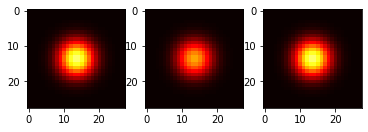

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.025767743587493896, dimming (predicted): 0.2543277442455292


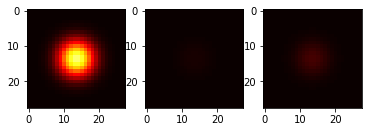

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.801826536655426, dimming (predicted): 0.7879398465156555


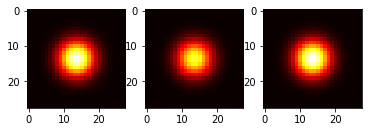

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6921747922897339, dimming (predicted): 0.731377124786377


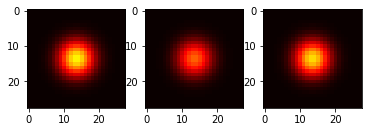

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.1988379955291748, dimming (predicted): 0.24913986027240753


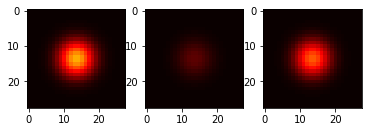

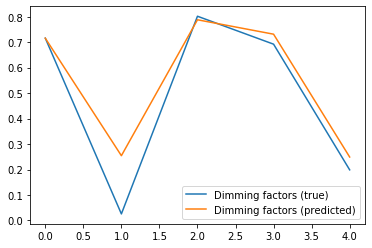

Current loss: 0.033824410289525986
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.19890785217285156, dimming (predicted): 0.15771467983722687


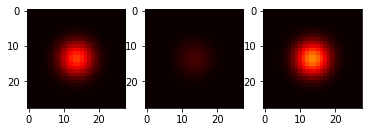

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9875300526618958, dimming (predicted): 0.6775542497634888


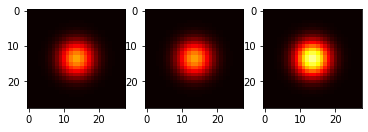

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9393455386161804, dimming (predicted): 0.8778050541877747


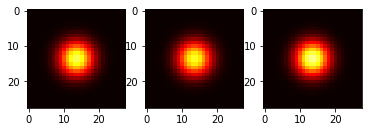

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2261558175086975, dimming (predicted): 0.4111608862876892


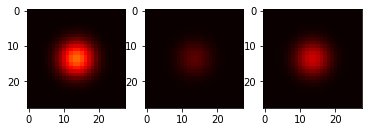

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4087715148925781, dimming (predicted): 0.46819424629211426


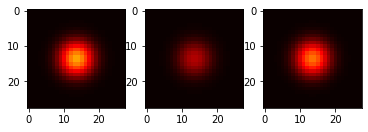

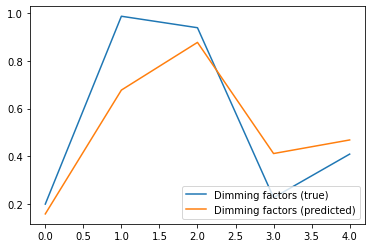

Current loss: 0.04934964329004288
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9383366107940674, dimming (predicted): 0.5143445134162903


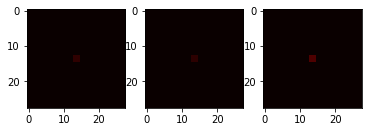

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4025653004646301, dimming (predicted): 0.40148305892944336


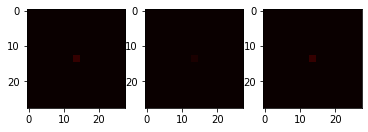

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.1415596604347229, dimming (predicted): 0.3869757354259491


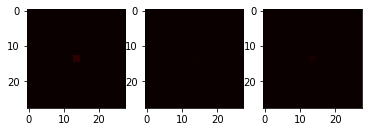

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8084339499473572, dimming (predicted): 0.4488641619682312


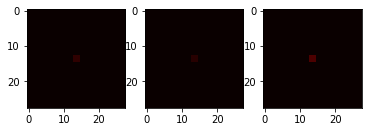

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.18881386518478394, dimming (predicted): 0.4672188460826874


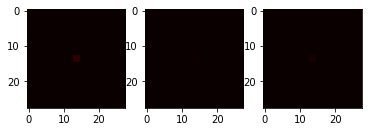

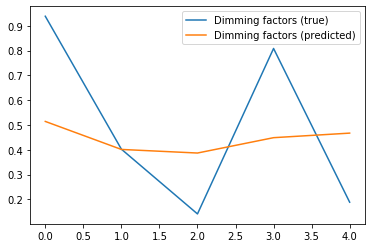

Current loss: 0.06295803934335709
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6181825399398804, dimming (predicted): 0.5855527520179749


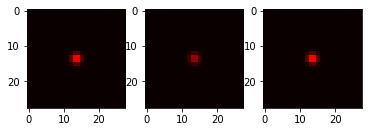

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.26575595140457153, dimming (predicted): 0.33250245451927185


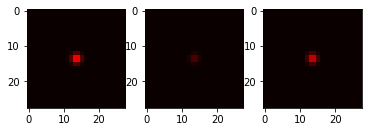

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.17039000988006592, dimming (predicted): 0.3772147297859192


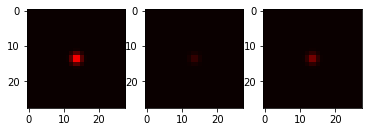

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9788326621055603, dimming (predicted): 0.5751267075538635


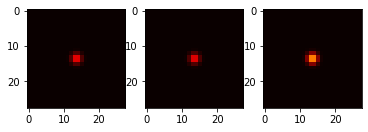

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.188618004322052, dimming (predicted): 0.47539791464805603


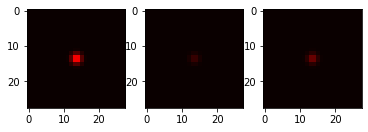

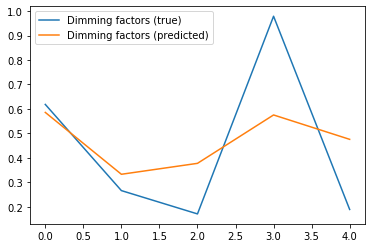

Current loss: 0.033422909677028656
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.13127613067626953, dimming (predicted): 0.42465320229530334


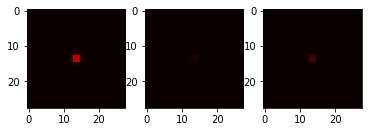

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3926483988761902, dimming (predicted): 0.2958035171031952


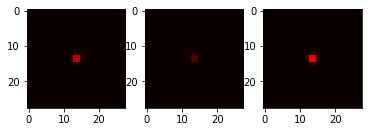

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.18842899799346924, dimming (predicted): 0.37328869104385376


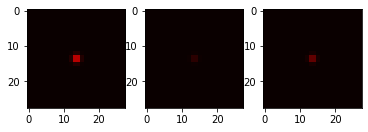

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.23752552270889282, dimming (predicted): 0.5076829195022583


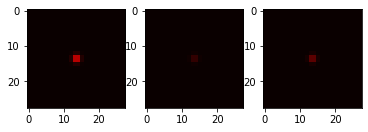

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5747537612915039, dimming (predicted): 0.5087099671363831


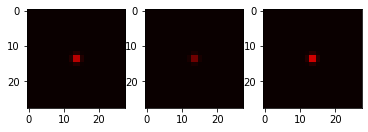

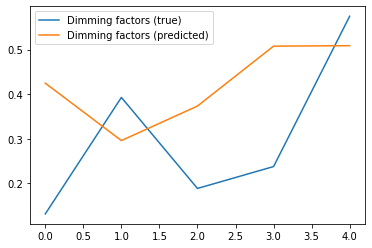

Current loss: 0.030217403545975685
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.29730021953582764, dimming (predicted): 0.4820452928543091


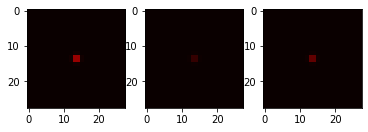

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2812637686729431, dimming (predicted): 0.4919506013393402


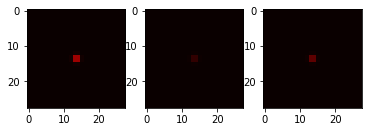

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8665891289710999, dimming (predicted): 0.44239532947540283


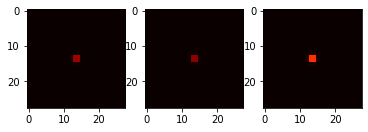

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7133575081825256, dimming (predicted): 0.5214489102363586


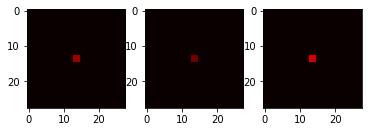

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2699164152145386, dimming (predicted): 0.36699727177619934


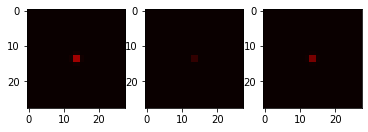

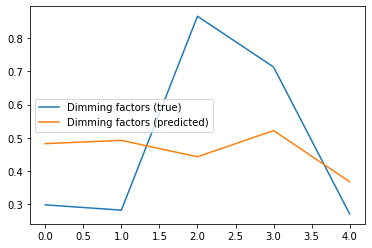

Current loss: 0.024036679416894913
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8708814978599548, dimming (predicted): 0.8369205594062805


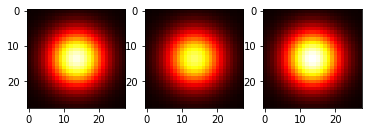

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5268083810806274, dimming (predicted): 0.5972234010696411


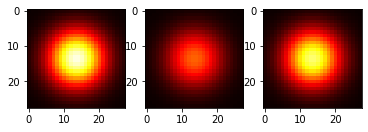

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8972434997558594, dimming (predicted): 0.7023429870605469


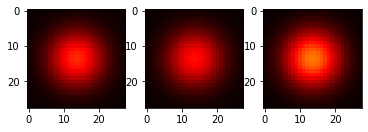

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.501036524772644, dimming (predicted): 0.2832142412662506


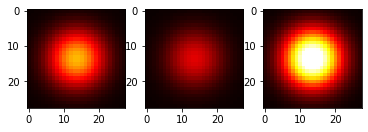

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.07291972637176514, dimming (predicted): 0.21653546392917633


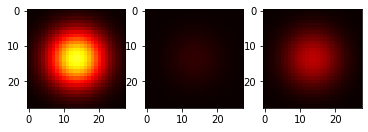

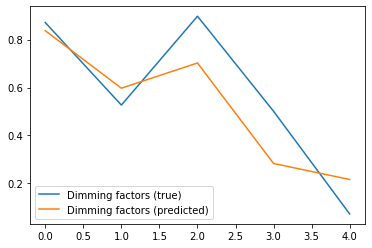

Current loss: 0.024892359972000122
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7388190627098083, dimming (predicted): 0.5769529342651367


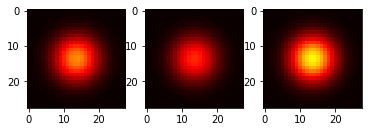

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.03585982322692871, dimming (predicted): 0.1730947345495224


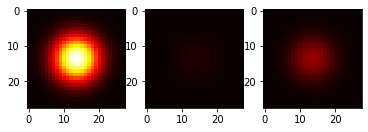

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8253771066665649, dimming (predicted): 0.7738655209541321


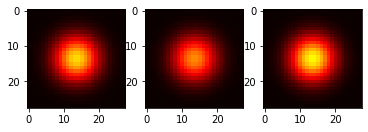

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7151830196380615, dimming (predicted): 0.870153546333313


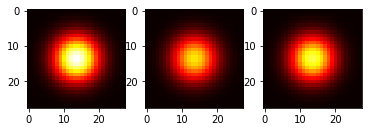

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.1064867377281189, dimming (predicted): 0.22211191058158875


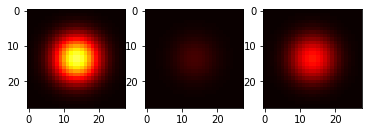

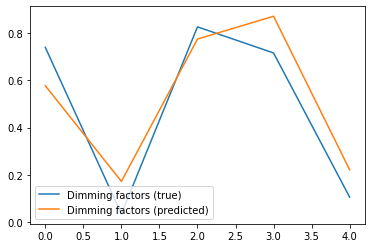

Current loss: 0.025682583451271057
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9602465629577637, dimming (predicted): 0.8519635796546936


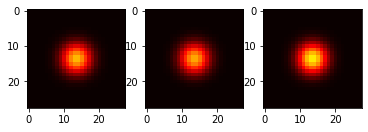

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.07552993297576904, dimming (predicted): 0.18948939442634583


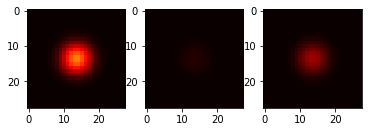

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.025944530963897705, dimming (predicted): 0.16807156801223755


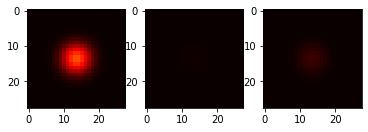

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9783939123153687, dimming (predicted): 0.8969533443450928


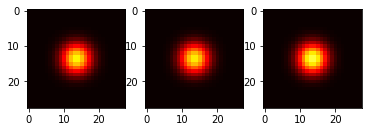

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.21931928396224976, dimming (predicted): 0.2685568034648895


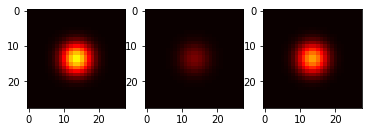

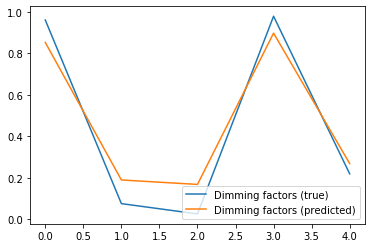

Current loss: 0.02523595467209816
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9947061538696289, dimming (predicted): 0.7919678092002869


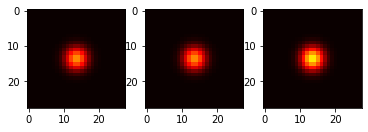

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8462240099906921, dimming (predicted): 0.6215021014213562


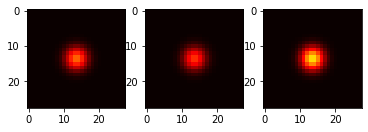

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7625913023948669, dimming (predicted): 0.5660664439201355


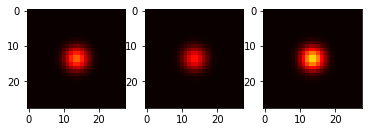

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.26050812005996704, dimming (predicted): 0.19387860596179962


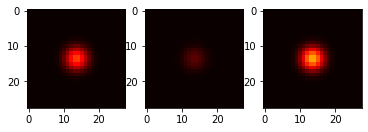

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6922655701637268, dimming (predicted): 0.7128386497497559


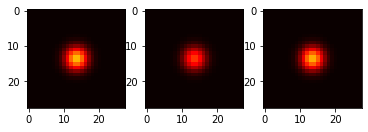

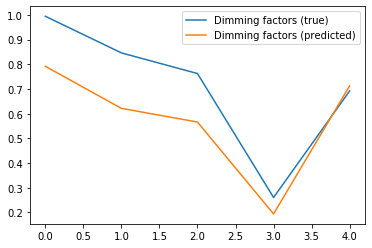

Current loss: 0.0231035016477108
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2585858106613159, dimming (predicted): 0.3564528524875641


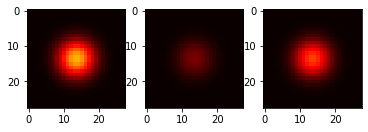

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4555068016052246, dimming (predicted): 0.4831215739250183


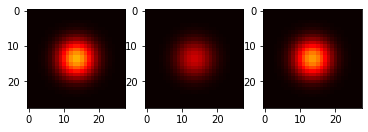

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.204509437084198, dimming (predicted): 0.45537900924682617


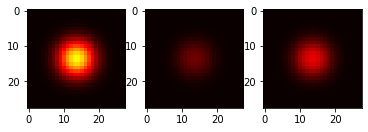

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.030672073364257812, dimming (predicted): 0.1435430645942688


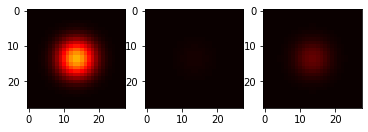

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.639825165271759, dimming (predicted): 0.7395397424697876


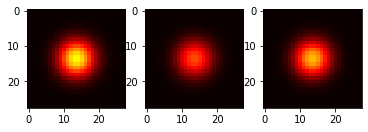

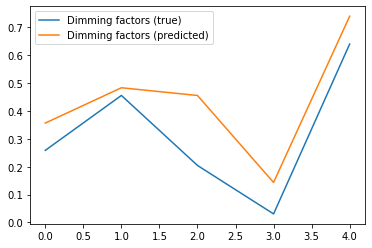

Current loss: 0.019504977390170097
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5447306036949158, dimming (predicted): 0.48787960410118103


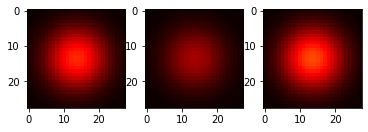

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7421128749847412, dimming (predicted): 0.740475594997406


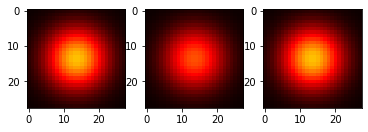

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9769567847251892, dimming (predicted): 0.649664580821991


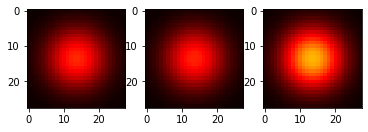

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.1323537826538086, dimming (predicted): 0.25196215510368347


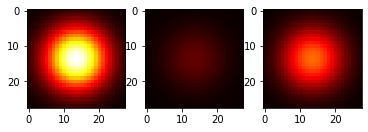

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.411754846572876, dimming (predicted): 0.31189465522766113


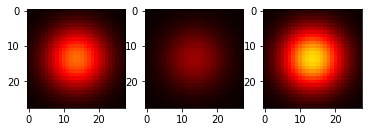

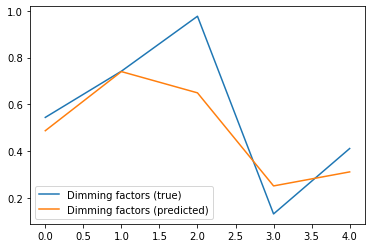

Current loss: 0.045250363647937775
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.14771497249603271, dimming (predicted): 0.5718534588813782


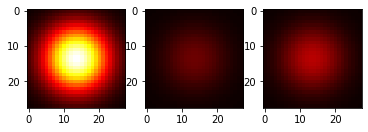

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9788558483123779, dimming (predicted): 0.739822268486023


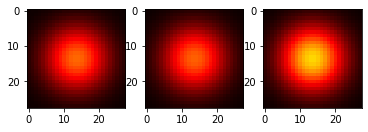

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.04594177007675171, dimming (predicted): 0.24854065477848053


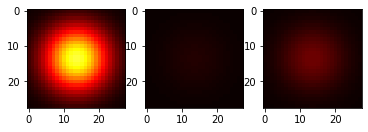

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7512781023979187, dimming (predicted): 0.6252022385597229


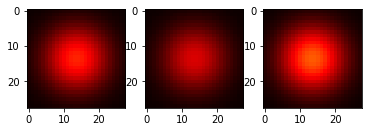

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7778477072715759, dimming (predicted): 0.7277337908744812


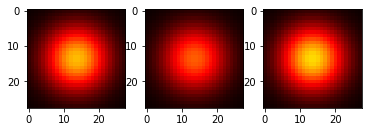

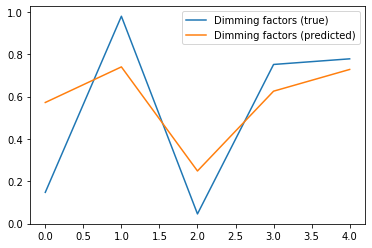

Current loss: 0.007106105796992779
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.0660136342048645, dimming (predicted): 0.08159015327692032


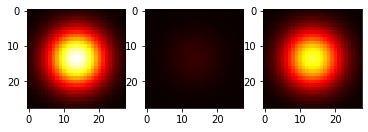

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8772876262664795, dimming (predicted): 0.9411199688911438


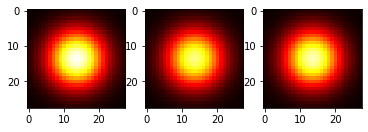

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.13932287693023682, dimming (predicted): 0.1315753310918808


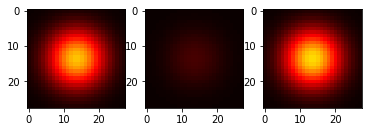

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5792677998542786, dimming (predicted): 0.7715629935264587


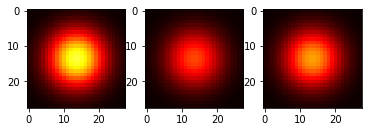

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5655984282493591, dimming (predicted): 0.5587785243988037


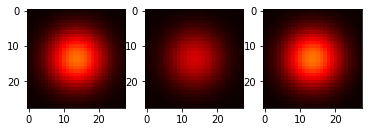

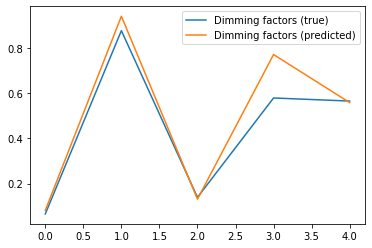

Current loss: 0.03400414437055588
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5322243571281433, dimming (predicted): 0.5915309190750122


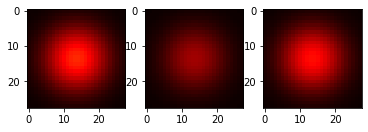

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.424095094203949, dimming (predicted): 0.6286965608596802


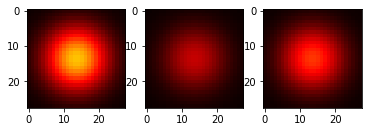

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.23375868797302246, dimming (predicted): 0.5036945939064026


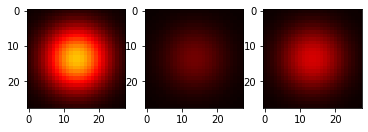

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.46235764026641846, dimming (predicted): 0.6339436769485474


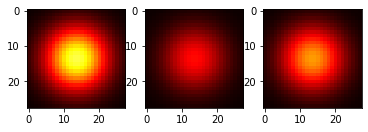

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5743826627731323, dimming (predicted): 0.685477614402771


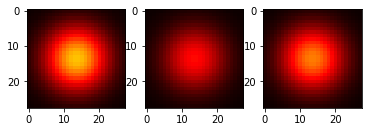

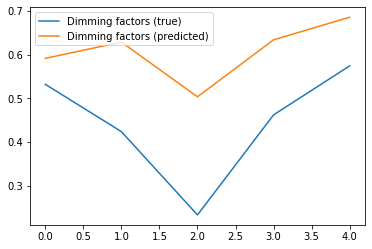

Current loss: 0.0328088104724884
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6616991758346558, dimming (predicted): 0.7204718589782715


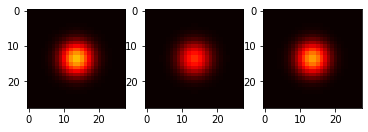

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.25713640451431274, dimming (predicted): 0.2293062061071396


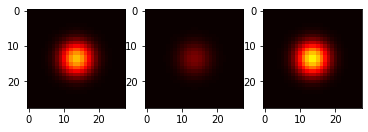

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.697899341583252, dimming (predicted): 0.7322990298271179


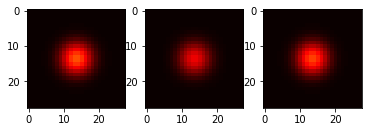

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4366917014122009, dimming (predicted): 0.6192565560340881


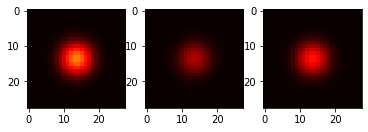

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.0953029990196228, dimming (predicted): 0.09399434179067612


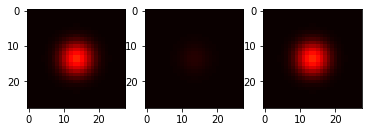

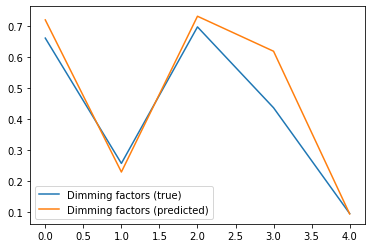

Current loss: 0.031922031193971634
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.020158052444458008, dimming (predicted): 0.22004351019859314


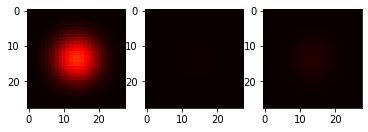

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.1931357979774475, dimming (predicted): 0.575783908367157


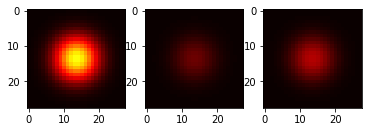

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9632266759872437, dimming (predicted): 0.8926969170570374


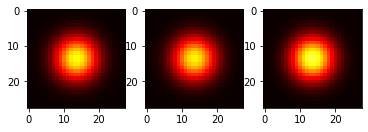

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.44354403018951416, dimming (predicted): 0.6077907085418701


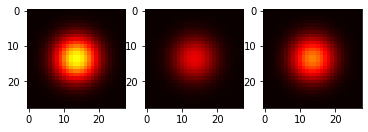

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5652906894683838, dimming (predicted): 0.7648564577102661


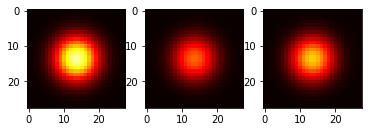

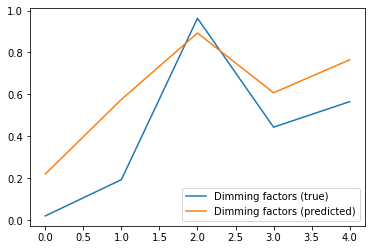

Current loss: 0.008777233771979809
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.45287102460861206, dimming (predicted): 0.3125090003013611


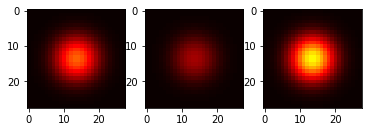

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7902708053588867, dimming (predicted): 0.8145158290863037


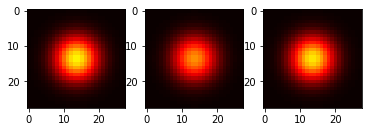

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4367888569831848, dimming (predicted): 0.5305598974227905


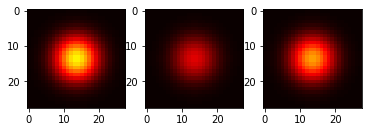

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7490952014923096, dimming (predicted): 0.7035316824913025


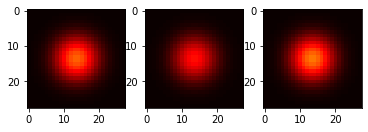

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9490675926208496, dimming (predicted): 0.8464837074279785


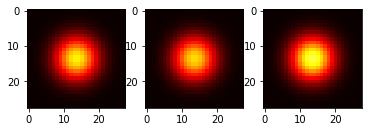

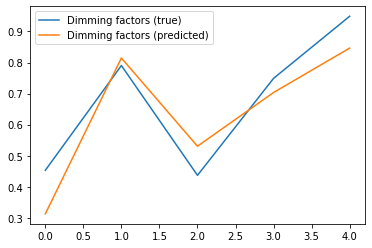

Current loss: 0.022306686267256737
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8718761205673218, dimming (predicted): 0.812760055065155


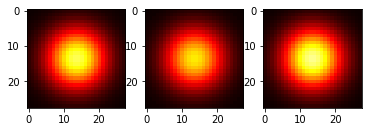

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.43018776178359985, dimming (predicted): 0.2615385353565216


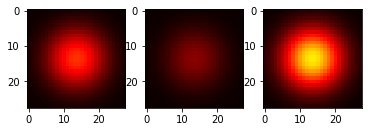

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9453953504562378, dimming (predicted): 0.8268336653709412


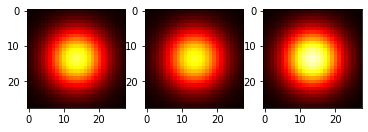

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.03430628776550293, dimming (predicted): 0.012260830961167812


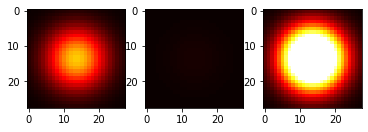

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6463690400123596, dimming (predicted): 0.4982951879501343


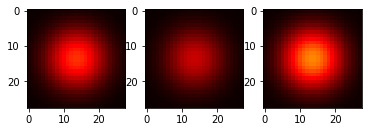

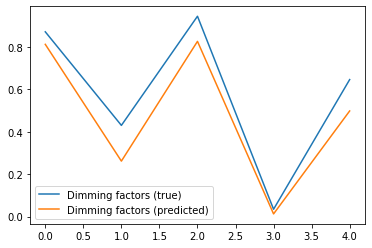

Current loss: 0.04140811413526535
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4245891571044922, dimming (predicted): 0.5339152216911316


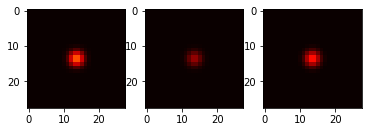

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.43215417861938477, dimming (predicted): 0.5259450078010559


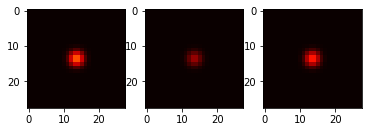

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.05606025457382202, dimming (predicted): 0.18377062678337097


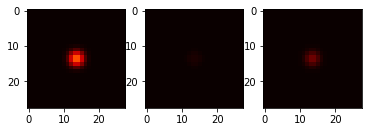

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9747663736343384, dimming (predicted): 0.8208412528038025


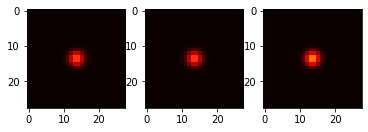

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5288287997245789, dimming (predicted): 0.4151949882507324


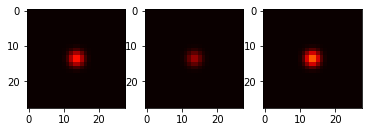

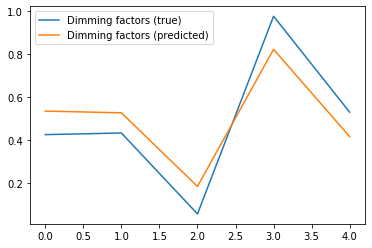

Current loss: 0.01415194384753704
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9106006026268005, dimming (predicted): 0.6879168748855591


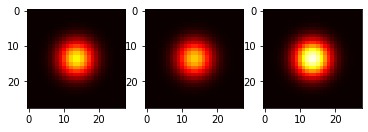

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2870320677757263, dimming (predicted): 0.4326898455619812


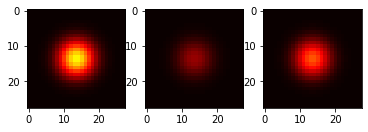

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9333750605583191, dimming (predicted): 0.8520777225494385


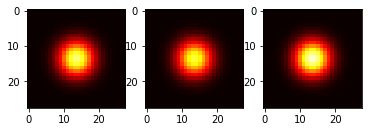

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8632646799087524, dimming (predicted): 0.9003554582595825


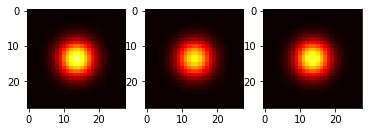

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.23794341087341309, dimming (predicted): 0.1533125638961792


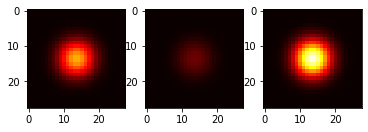

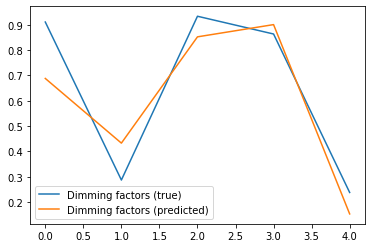

Current loss: 0.019645143300294876
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5095325708389282, dimming (predicted): 0.8351428508758545


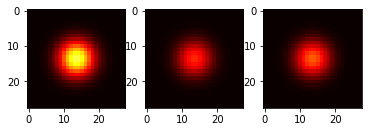

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.36895960569381714, dimming (predicted): 0.13129808008670807


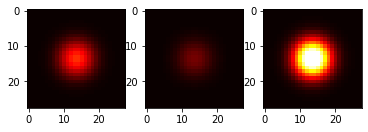

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.47699934244155884, dimming (predicted): 0.3484973907470703


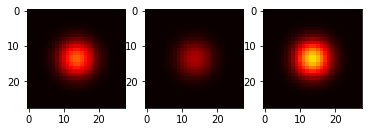

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9885595440864563, dimming (predicted): 0.8602447509765625


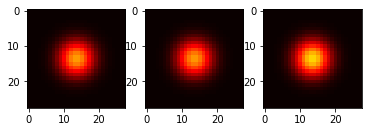

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6342407464981079, dimming (predicted): 0.6476417779922485


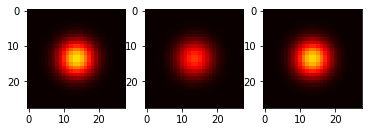

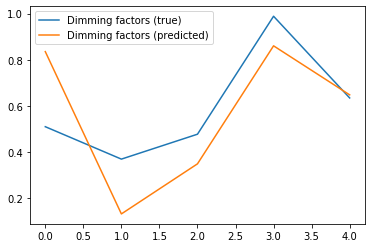

Current loss: 0.017299029976129532
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.13423758745193481, dimming (predicted): 0.09151437878608704


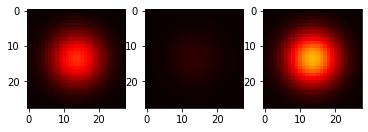

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6600633859634399, dimming (predicted): 0.7368393540382385


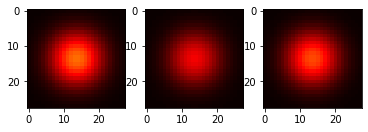

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7039715647697449, dimming (predicted): 0.538420557975769


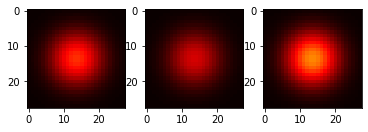

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.14145874977111816, dimming (predicted): 0.133293017745018


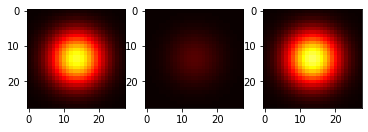

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5688185691833496, dimming (predicted): 0.7685811519622803


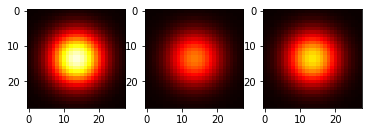

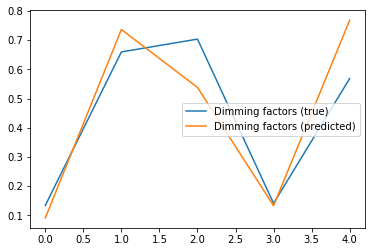

Current loss: 0.028177767992019653
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6280040144920349, dimming (predicted): 0.615905225276947


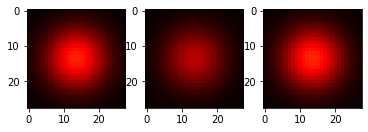

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.1958206295967102, dimming (predicted): 0.5053260326385498


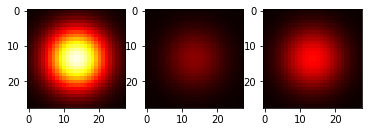

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.05038803815841675, dimming (predicted): 0.18208059668540955


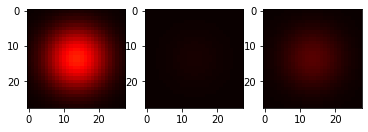

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.060574233531951904, dimming (predicted): 0.2231997698545456


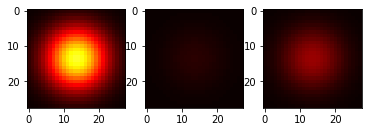

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.43252241611480713, dimming (predicted): 0.5248706340789795


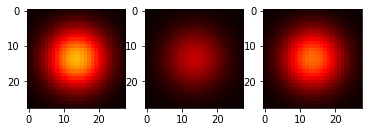

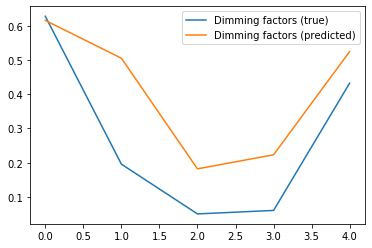

Current loss: 0.024705279618501663
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8282107710838318, dimming (predicted): 0.6834090352058411


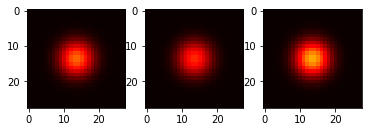

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.46467888355255127, dimming (predicted): 0.39395007491111755


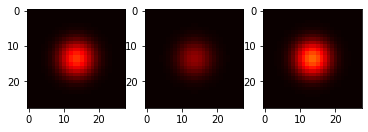

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8884908556938171, dimming (predicted): 0.5890997052192688


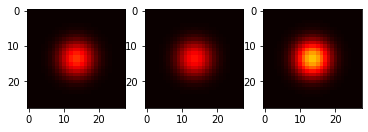

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6945712566375732, dimming (predicted): 0.5964321494102478


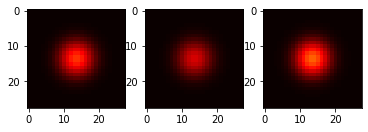

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.12228971719741821, dimming (predicted): 0.20341351628303528


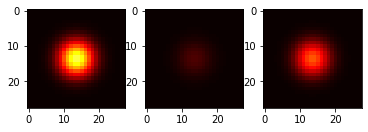

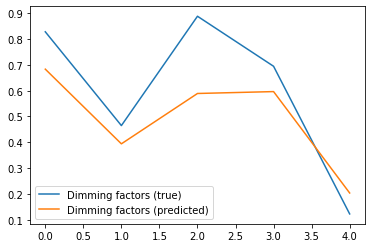

Current loss: 0.016496170312166214
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.09012669324874878, dimming (predicted): 0.19788183271884918


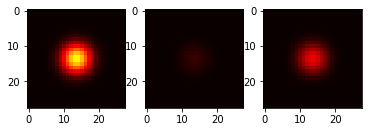

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8412426710128784, dimming (predicted): 0.7152405977249146


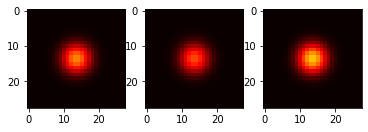

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.27551764249801636, dimming (predicted): 0.37935352325439453


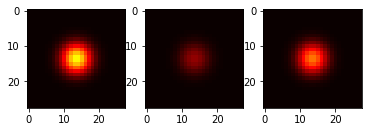

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5847890973091125, dimming (predicted): 0.7215022444725037


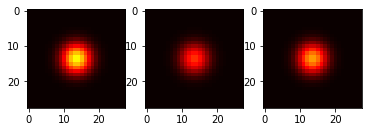

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8576356172561646, dimming (predicted): 0.7894214391708374


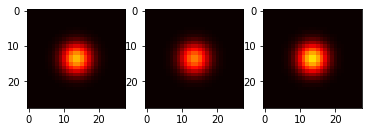

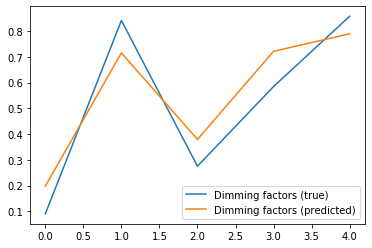

Current loss: 0.029579967260360718
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.29705238342285156, dimming (predicted): 0.41760292649269104


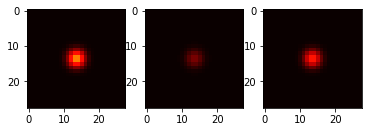

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5364100933074951, dimming (predicted): 0.6925603151321411


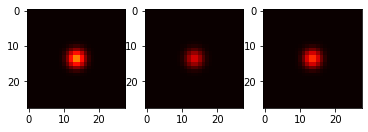

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3950198292732239, dimming (predicted): 0.44180405139923096


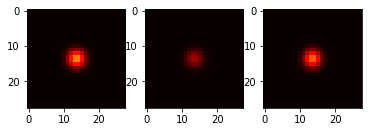

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3862825632095337, dimming (predicted): 0.47608596086502075


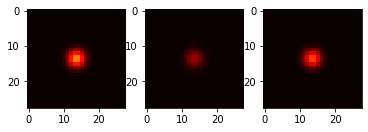

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.051194608211517334, dimming (predicted): 0.10106442868709564


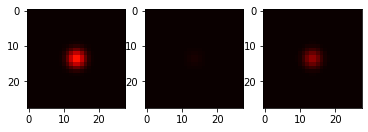

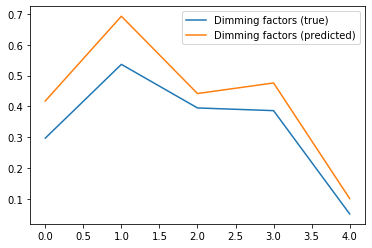

Current loss: 0.03620757535099983
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.22232723236083984, dimming (predicted): 0.2543674111366272


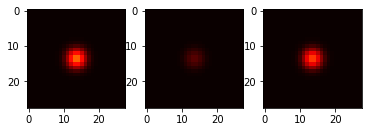

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4183908700942993, dimming (predicted): 0.3911206126213074


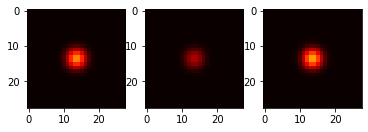

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.154465913772583, dimming (predicted): 0.2818675637245178


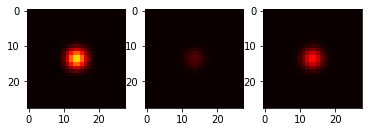

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.12785667181015015, dimming (predicted): 0.26548871397972107


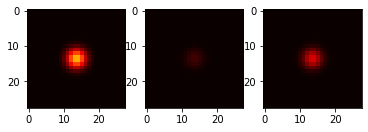

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8755360841751099, dimming (predicted): 0.7789902687072754


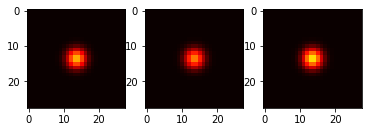

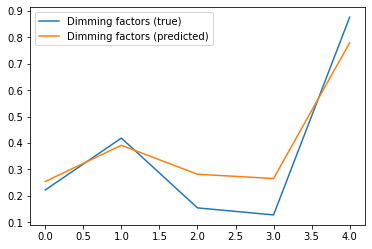

Current loss: 0.014909433200955391
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8438504934310913, dimming (predicted): 0.7517593502998352


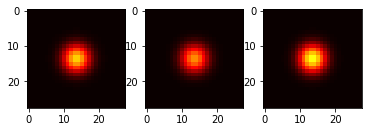

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8447862267494202, dimming (predicted): 0.8700653314590454


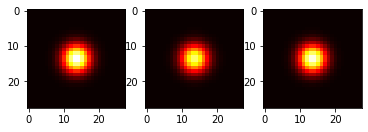

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5044307112693787, dimming (predicted): 0.6087523102760315


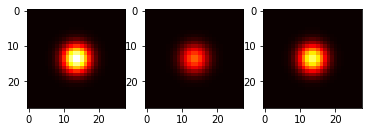

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8551348447799683, dimming (predicted): 0.6850957870483398


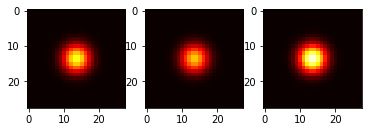

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.02737528085708618, dimming (predicted): 0.07698619365692139


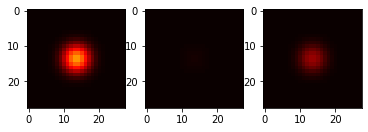

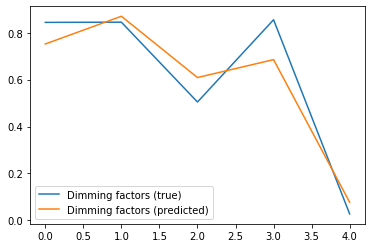

Current loss: 0.01406813133507967
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5590055584907532, dimming (predicted): 0.574650228023529


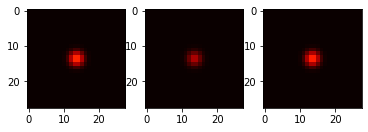

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9369518160820007, dimming (predicted): 0.8704860210418701


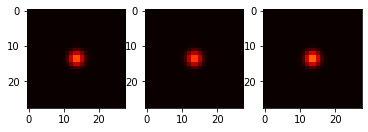

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.06257599592208862, dimming (predicted): 0.16388638317584991


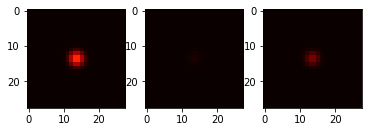

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.651733934879303, dimming (predicted): 0.6334041357040405


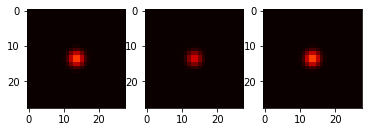

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.46899616718292236, dimming (predicted): 0.3827252984046936


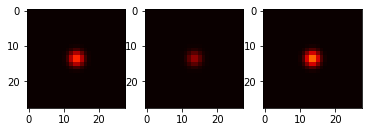

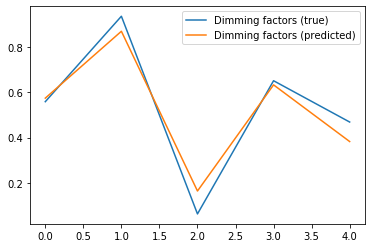

Current loss: 0.021104536950588226
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.41870659589767456, dimming (predicted): 0.4623638391494751


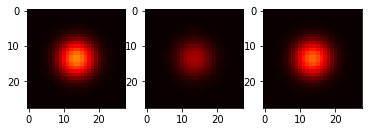

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7670849561691284, dimming (predicted): 0.6209571361541748


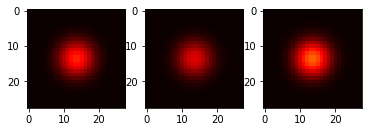

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9258421659469604, dimming (predicted): 0.8799124956130981


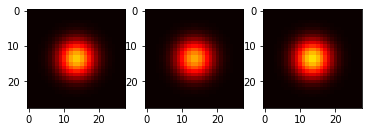

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6101195812225342, dimming (predicted): 0.5183852910995483


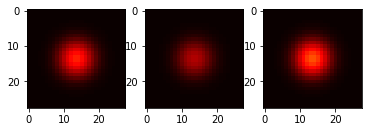

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.02123868465423584, dimming (predicted): 0.08573669195175171


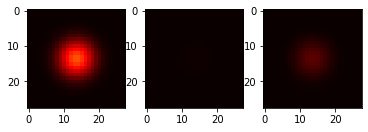

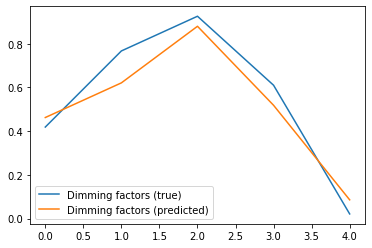

Current loss: 0.028269413858652115
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5126164555549622, dimming (predicted): 0.5454758405685425


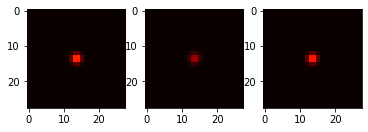

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9092652201652527, dimming (predicted): 0.7503881454467773


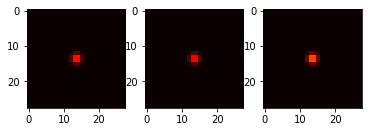

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.10923975706100464, dimming (predicted): 0.17619408667087555


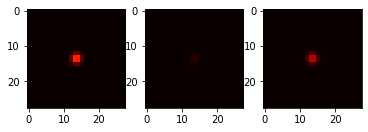

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3739367127418518, dimming (predicted): 0.5119990110397339


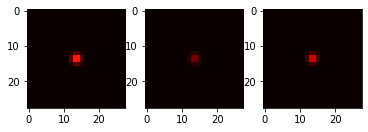

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.21368080377578735, dimming (predicted): 0.24522259831428528


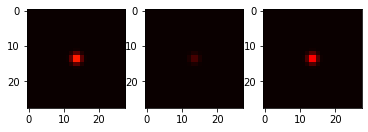

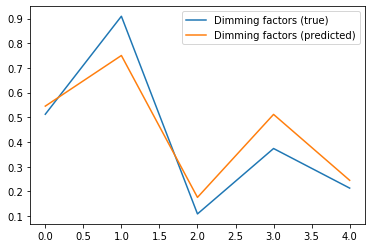

Current loss: 0.012530302628874779
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9882290363311768, dimming (predicted): 0.8967214822769165


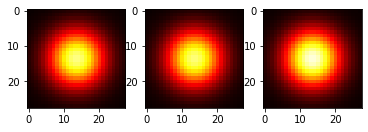

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5591909885406494, dimming (predicted): 0.5484622120857239


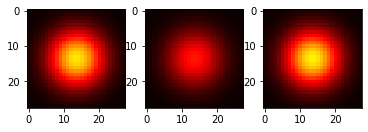

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8701289892196655, dimming (predicted): 0.8570960164070129


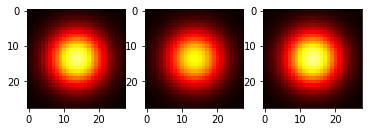

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.41212350130081177, dimming (predicted): 0.20414438843727112


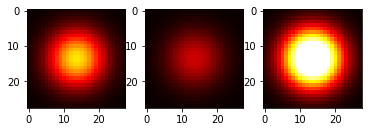

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4346926808357239, dimming (predicted): 0.385545939207077


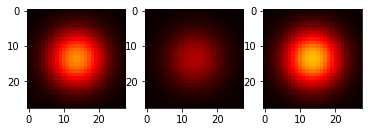

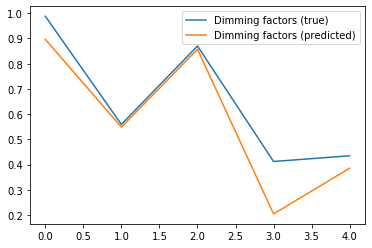

Current loss: 0.008515698835253716
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7271310091018677, dimming (predicted): 0.7469066381454468


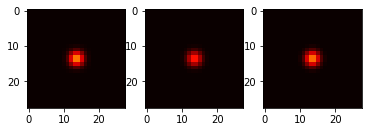

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.38551539182662964, dimming (predicted): 0.41536232829093933


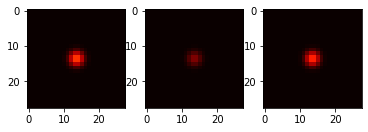

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.20988988876342773, dimming (predicted): 0.17703860998153687


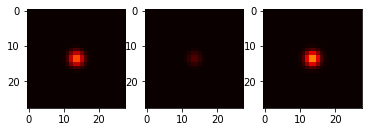

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9890949130058289, dimming (predicted): 0.9181541800498962


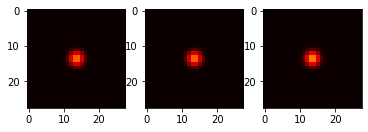

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6281296610832214, dimming (predicted): 0.7308449745178223


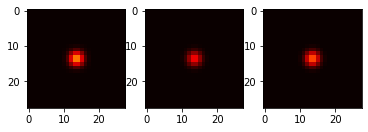

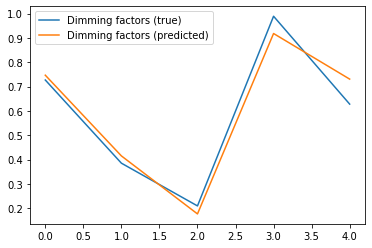

Current loss: 0.009165753610432148
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9607085585594177, dimming (predicted): 0.8546032905578613


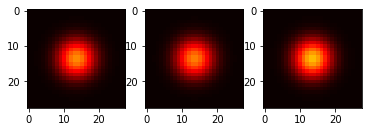

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.15009748935699463, dimming (predicted): 0.11155384033918381


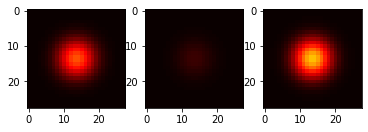

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6062059998512268, dimming (predicted): 0.6999773383140564


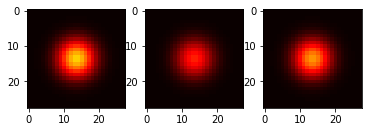

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2900453805923462, dimming (predicted): 0.26461300253868103


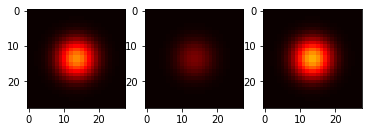

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.014301419258117676, dimming (predicted): 0.06635688245296478


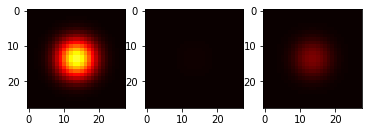

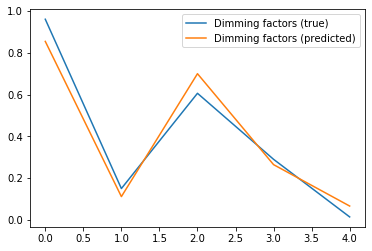

Current loss: 0.02043568715453148
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6594125628471375, dimming (predicted): 0.5824434757232666


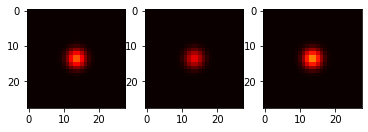

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8580278158187866, dimming (predicted): 0.8787060976028442


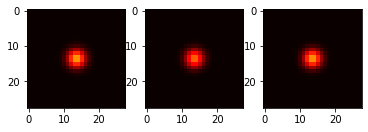

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5179976224899292, dimming (predicted): 0.6251267194747925


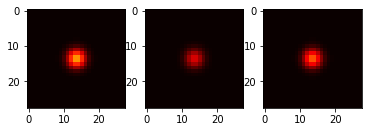

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6085927486419678, dimming (predicted): 0.48160430788993835


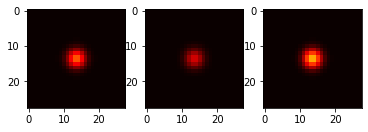

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8128430843353271, dimming (predicted): 0.7681394219398499


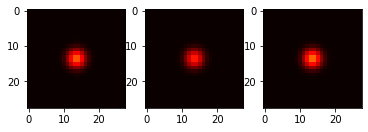

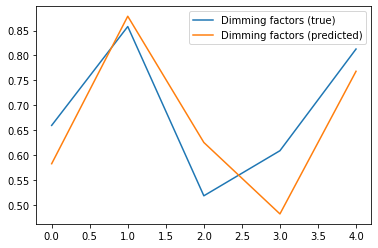

Current loss: 0.00875225942581892
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.13597869873046875, dimming (predicted): 0.033548999577760696


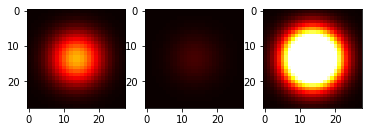

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.0749862790107727, dimming (predicted): 0.05775842443108559


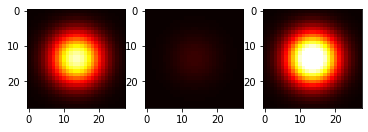

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.10298234224319458, dimming (predicted): 0.21200662851333618


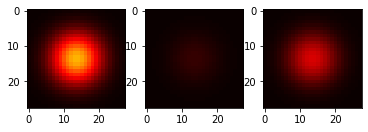

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9599891901016235, dimming (predicted): 0.9250608086585999


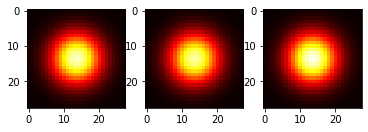

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8698790669441223, dimming (predicted): 0.8629603385925293


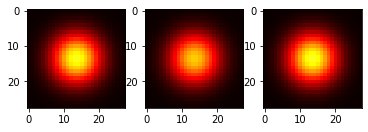

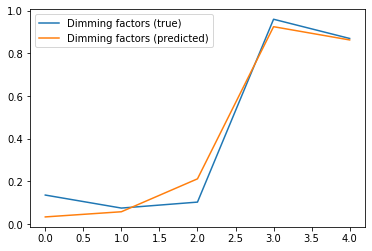

Current loss: 0.036905158311128616
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6866328120231628, dimming (predicted): 0.5217198133468628


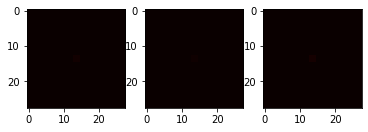

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.19258058071136475, dimming (predicted): 0.4378213882446289


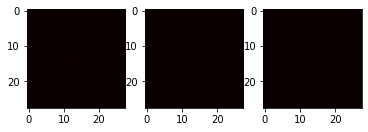

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6627334356307983, dimming (predicted): 0.49153608083724976


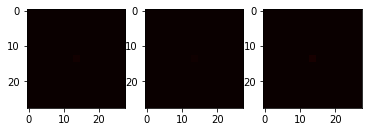

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4499526619911194, dimming (predicted): 0.490261971950531


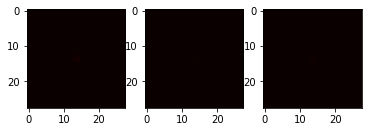

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.19727492332458496, dimming (predicted): 0.5589181780815125


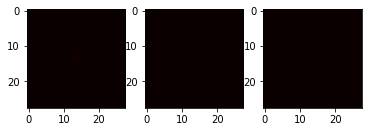

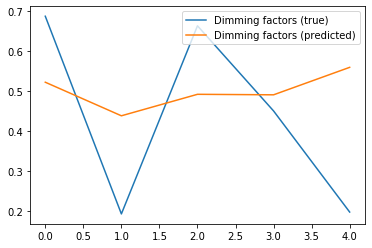

Current loss: 0.01922145113348961
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8235453963279724, dimming (predicted): 0.8200445771217346


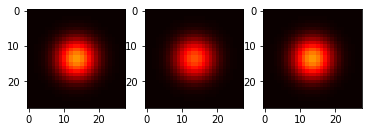

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.07970476150512695, dimming (predicted): 0.05217130854725838


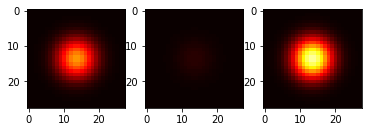

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.08708053827285767, dimming (predicted): 0.15978938341140747


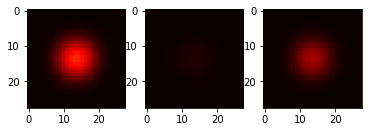

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.671525239944458, dimming (predicted): 0.8075991272926331


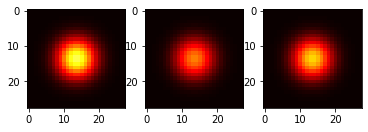

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.880998432636261, dimming (predicted): 0.577052116394043


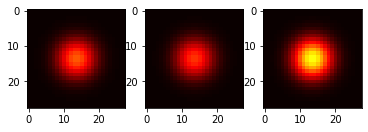

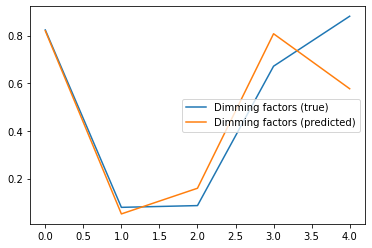

Current loss: 0.02528921328485012
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5091820359230042, dimming (predicted): 0.7253793478012085


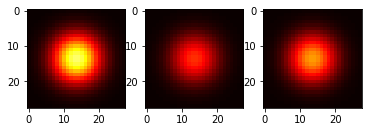

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9686742424964905, dimming (predicted): 0.7529527544975281


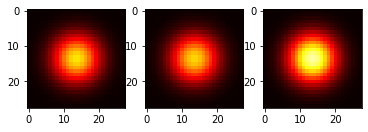

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5624564290046692, dimming (predicted): 0.7243262529373169


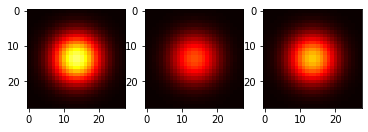

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5926821827888489, dimming (predicted): 0.5704034566879272


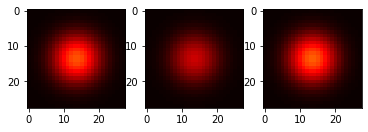

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.25941306352615356, dimming (predicted): 0.26284217834472656


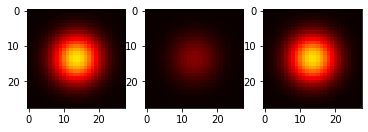

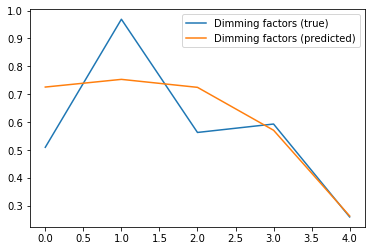

Current loss: 0.024526525288820267
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.06072646379470825, dimming (predicted): 0.3061266243457794


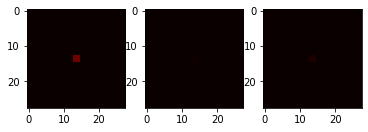

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.47534990310668945, dimming (predicted): 0.45147404074668884


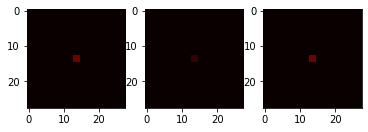

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9263136386871338, dimming (predicted): 0.5166447162628174


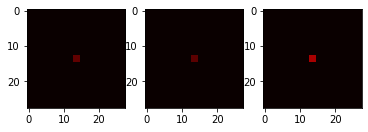

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.055079877376556396, dimming (predicted): 0.3006310760974884


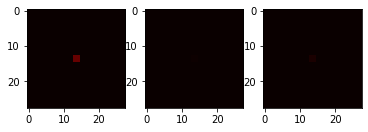

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6598051190376282, dimming (predicted): 0.41916540265083313


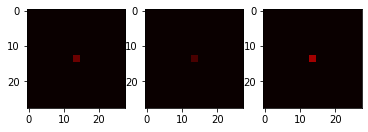

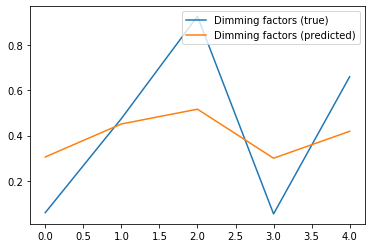

Current loss: 0.02102135680615902
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3676474094390869, dimming (predicted): 0.5534875988960266


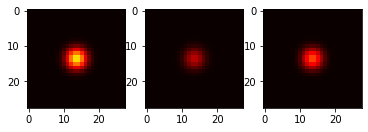

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4036276936531067, dimming (predicted): 0.3137418329715729


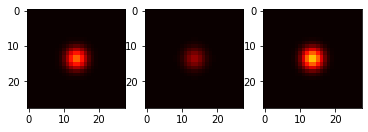

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6715161204338074, dimming (predicted): 0.7123529314994812


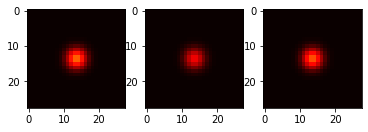

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5848754644393921, dimming (predicted): 0.7657994627952576


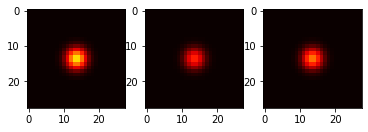

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6525658965110779, dimming (predicted): 0.6328232884407043


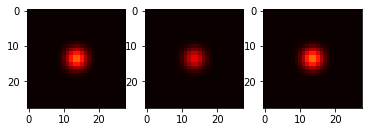

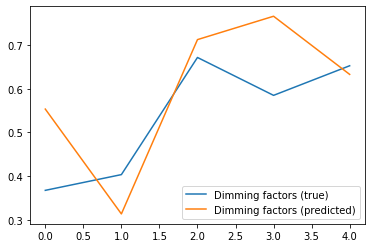

Current loss: 0.03381595015525818
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.24079716205596924, dimming (predicted): 0.2127038985490799


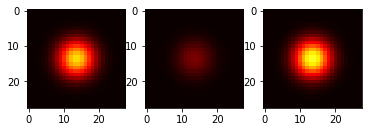

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9736582040786743, dimming (predicted): 0.6651421785354614


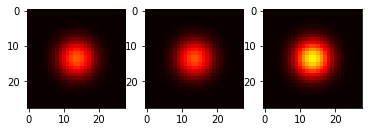

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5071148872375488, dimming (predicted): 0.6141306161880493


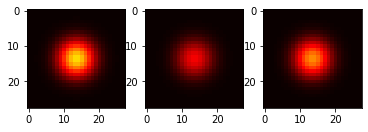

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9880408644676208, dimming (predicted): 0.5411027073860168


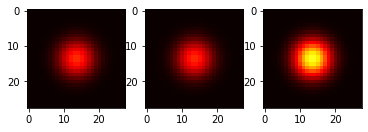

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4449816346168518, dimming (predicted): 0.6233108639717102


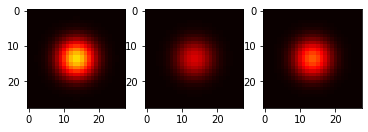

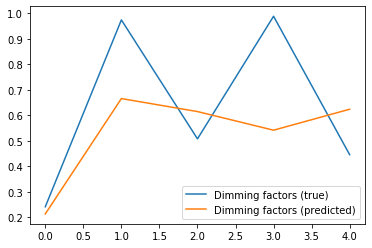

Current loss: 0.01794867217540741
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6469480395317078, dimming (predicted): 0.5516160726547241


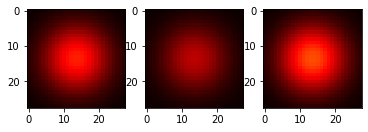

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8546044230461121, dimming (predicted): 0.7082258462905884


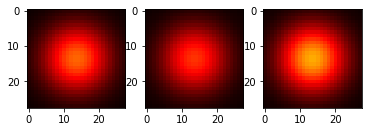

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4888976216316223, dimming (predicted): 0.7699878215789795


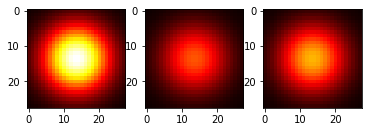

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.04437077045440674, dimming (predicted): 0.030670396983623505


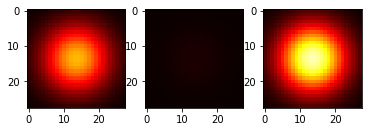

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9422416090965271, dimming (predicted): 0.7909290790557861


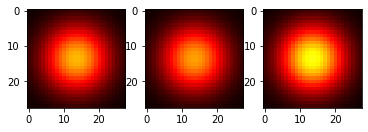

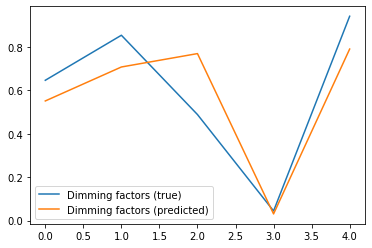

Current loss: 0.024673547595739365
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.024189352989196777, dimming (predicted): 0.08490889519453049


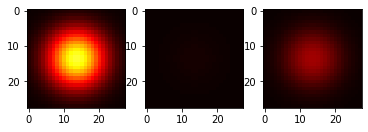

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.10107696056365967, dimming (predicted): 0.22094616293907166


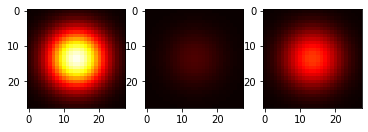

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6193891763687134, dimming (predicted): 0.5632253289222717


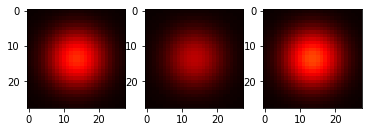

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5134767889976501, dimming (predicted): 0.6377298831939697


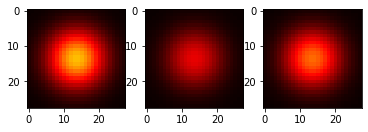

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2587707042694092, dimming (predicted): 0.46482306718826294


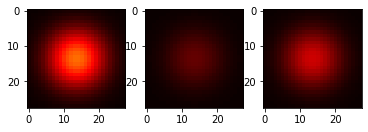

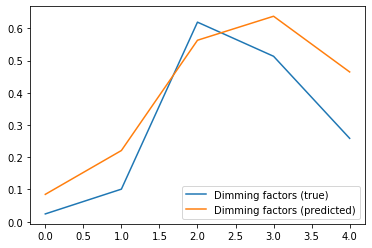

Current loss: 0.02993781305849552
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9472019076347351, dimming (predicted): 0.8633329272270203


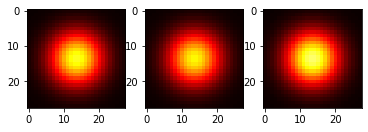

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.212957501411438, dimming (predicted): 0.13520309329032898


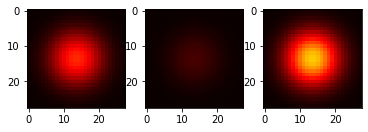

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9598647952079773, dimming (predicted): 0.8087830543518066


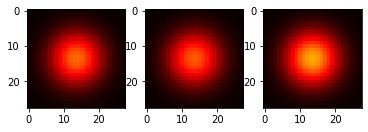

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6130906939506531, dimming (predicted): 0.6497052907943726


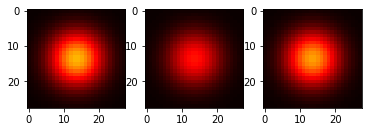

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6612834930419922, dimming (predicted): 0.7977568507194519


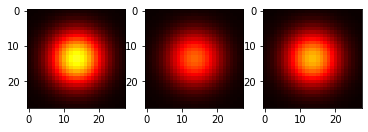

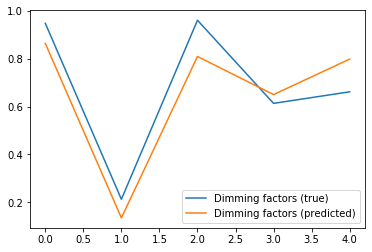

Current loss: 0.01837482862174511
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7026128172874451, dimming (predicted): 0.5989624261856079


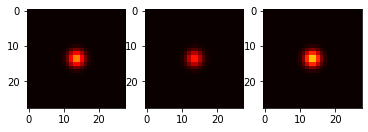

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9816192388534546, dimming (predicted): 0.830960214138031


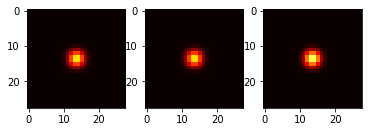

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8753076195716858, dimming (predicted): 0.8249011635780334


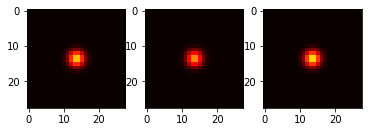

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9082012176513672, dimming (predicted): 0.6842943429946899


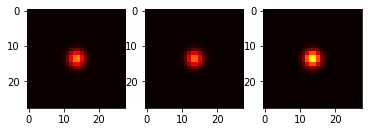

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6586718559265137, dimming (predicted): 0.6667566895484924


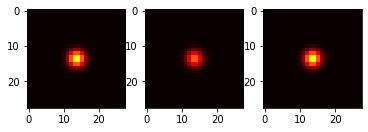

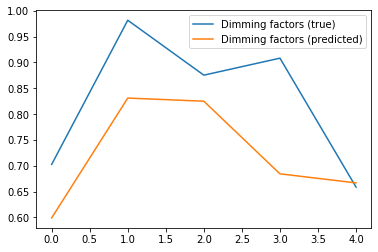

Current loss: 0.016110030934214592
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7553871870040894, dimming (predicted): 0.7625329494476318


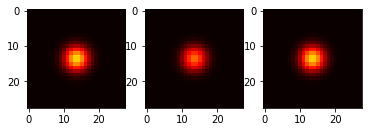

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6509262323379517, dimming (predicted): 0.7225708961486816


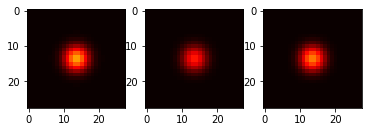

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.10761690139770508, dimming (predicted): 0.10530052334070206


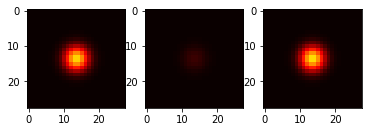

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5095682144165039, dimming (predicted): 0.6613430380821228


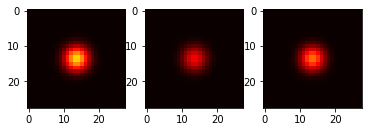

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.26258981227874756, dimming (predicted): 0.41574251651763916


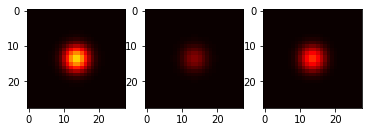

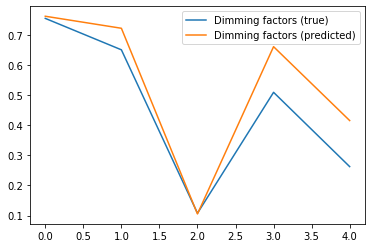

Current loss: 0.049087803810834885
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4045794606208801, dimming (predicted): 0.6213509440422058


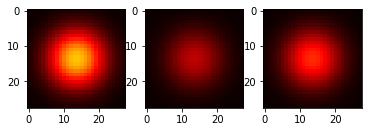

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.21564483642578125, dimming (predicted): 0.2449169158935547


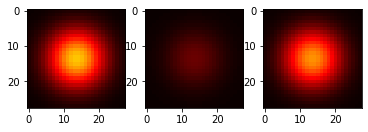

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9251112937927246, dimming (predicted): 0.7559362053871155


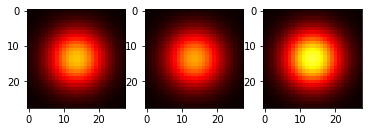

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6037214994430542, dimming (predicted): 0.598593533039093


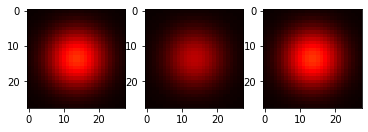

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.188093364238739, dimming (predicted): 0.22032707929611206


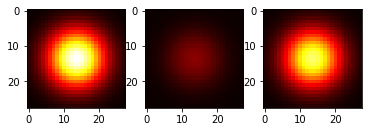

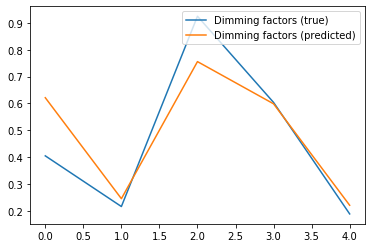

Current loss: 0.007923537865281105
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9111105799674988, dimming (predicted): 0.8635944128036499


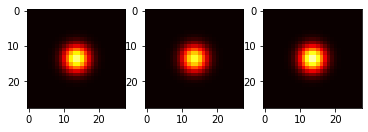

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.1576560139656067, dimming (predicted): 0.1471557915210724


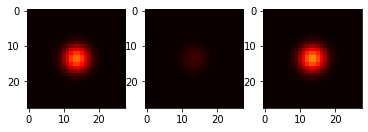

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.492412269115448, dimming (predicted): 0.5193527936935425


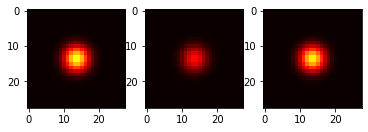

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.003370046615600586, dimming (predicted): 0.0944465845823288


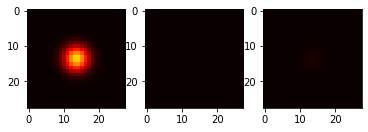

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.20581400394439697, dimming (predicted): 0.20706084370613098


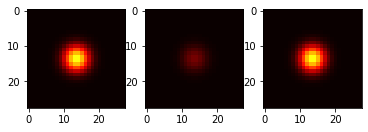

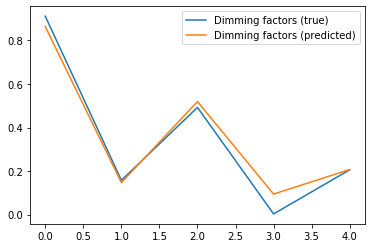

Current loss: 0.033056337386369705
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.1258307695388794, dimming (predicted): 0.21598462760448456


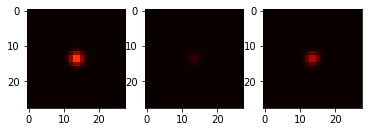

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.12892121076583862, dimming (predicted): 0.3474210500717163


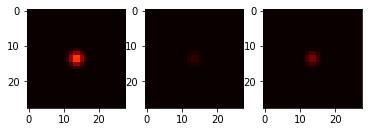

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3644520044326782, dimming (predicted): 0.5498141646385193


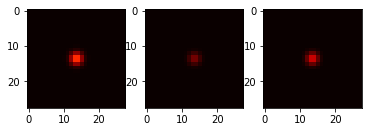

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.27339422702789307, dimming (predicted): 0.46470174193382263


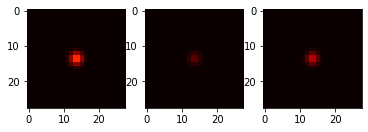

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.1795169711112976, dimming (predicted): 0.37049800157546997


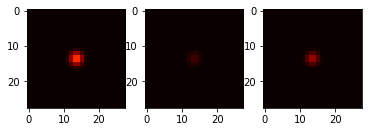

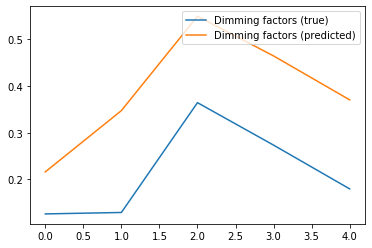

Current loss: 0.022685959935188293
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.05308103561401367, dimming (predicted): 0.12053894251585007


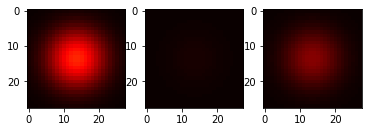

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9931097626686096, dimming (predicted): 0.8668652176856995


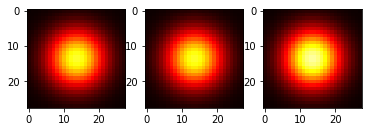

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9493221640586853, dimming (predicted): 0.6135263442993164


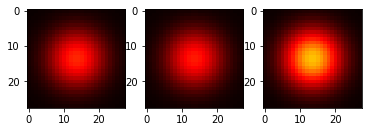

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.12708836793899536, dimming (predicted): 0.09057891368865967


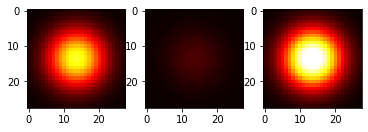

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.12753921747207642, dimming (predicted): 0.06245404854416847


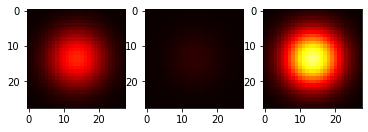

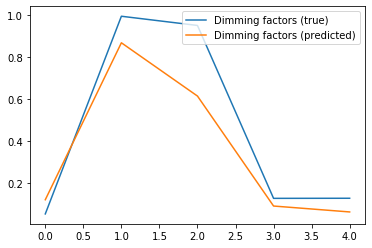

Current loss: 0.008312132209539413
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3290324807167053, dimming (predicted): 0.15094633400440216


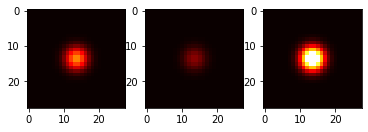

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.36546456813812256, dimming (predicted): 0.387737512588501


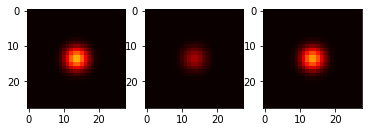

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.39191287755966187, dimming (predicted): 0.18103504180908203


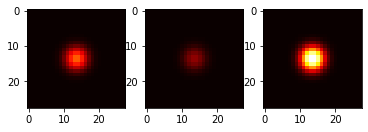

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9840958714485168, dimming (predicted): 0.7826392650604248


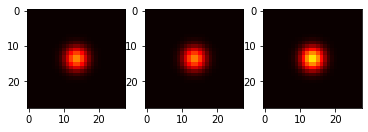

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7759084105491638, dimming (predicted): 0.7370644807815552


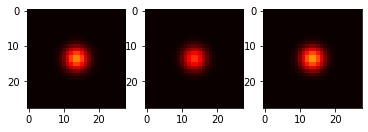

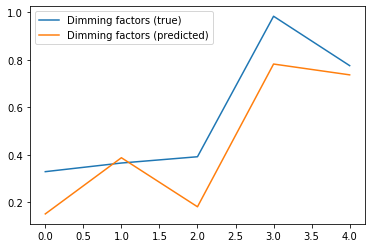

Current loss: 0.06787649542093277
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.11801797151565552, dimming (predicted): 0.5298062562942505


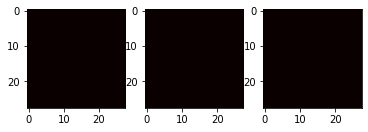

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.1811547875404358, dimming (predicted): 0.5877202749252319


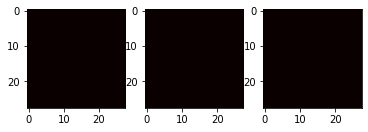

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2521921992301941, dimming (predicted): 0.4599444270133972


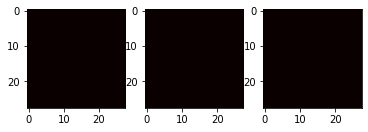

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2950085401535034, dimming (predicted): 0.39424997568130493


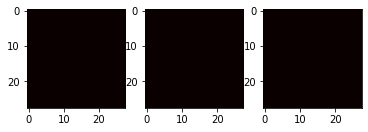

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.043914198875427246, dimming (predicted): 0.5285561680793762


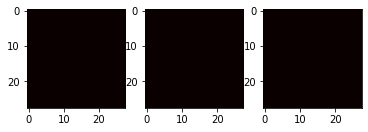

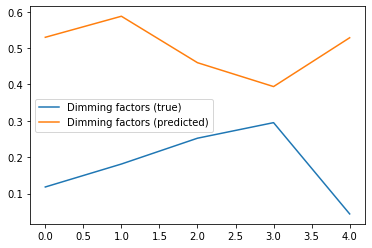

Current loss: 0.032333120703697205
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.08451473712921143, dimming (predicted): 0.0809592753648758


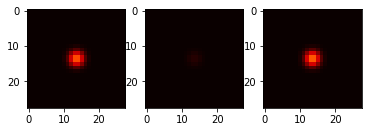

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7831802368164062, dimming (predicted): 0.7903804183006287


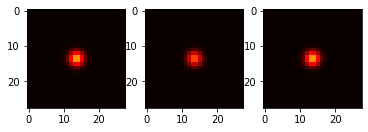

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.36781781911849976, dimming (predicted): 0.5003139972686768


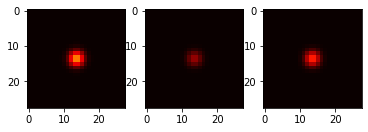

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.1674506664276123, dimming (predicted): 0.09811870008707047


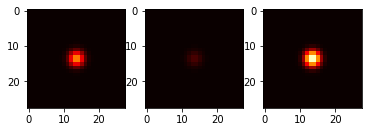

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5315397381782532, dimming (predicted): 0.5148923993110657


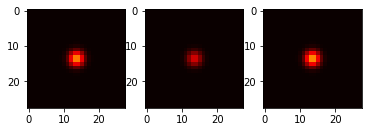

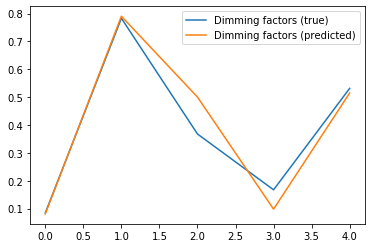

Current loss: 0.021300936117768288
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.0615386962890625, dimming (predicted): 0.15060774981975555


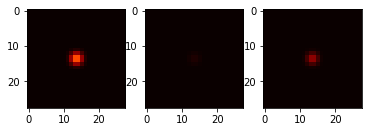

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5932886600494385, dimming (predicted): 0.6401534676551819


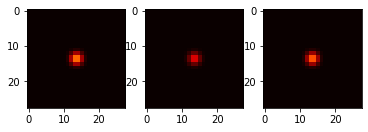

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.11658912897109985, dimming (predicted): 0.2717733383178711


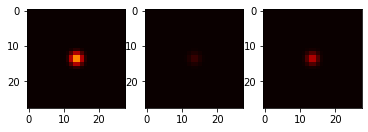

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5025123357772827, dimming (predicted): 0.6725847125053406


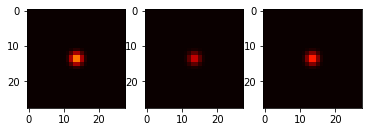

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.05095571279525757, dimming (predicted): 0.12454384565353394


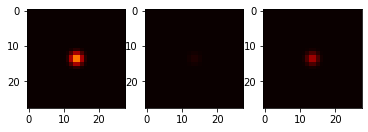

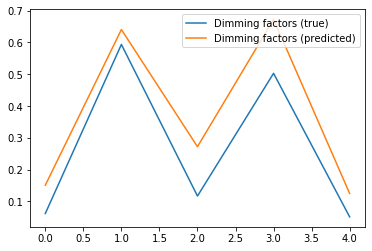

Current loss: 0.011480819433927536
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8838204741477966, dimming (predicted): 0.7859424352645874


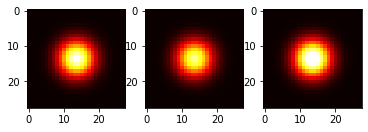

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4271581172943115, dimming (predicted): 0.5620546936988831


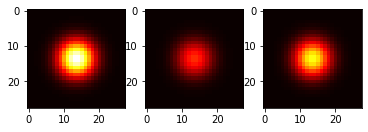

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.37582558393478394, dimming (predicted): 0.3012206554412842


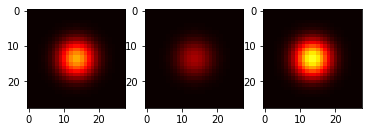

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.624974250793457, dimming (predicted): 0.6708168983459473


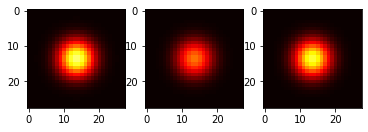

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.536164402961731, dimming (predicted): 0.4174475371837616


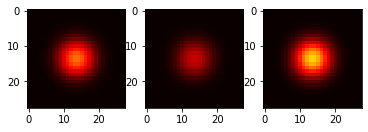

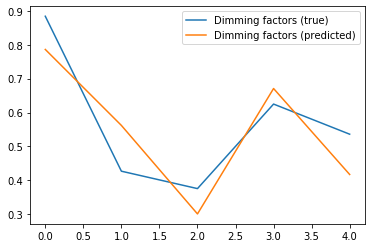

Current loss: 0.011402233503758907
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8546496629714966, dimming (predicted): 0.756417989730835


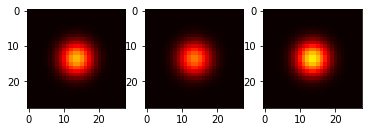

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.26846790313720703, dimming (predicted): 0.16115251183509827


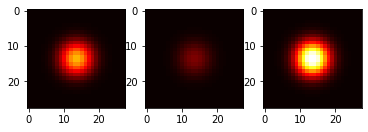

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3832938075065613, dimming (predicted): 0.4638898968696594


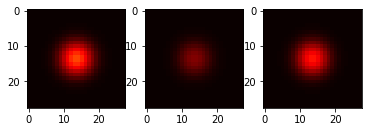

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.09404939413070679, dimming (predicted): 0.12107513099908829


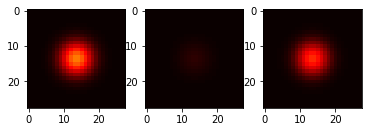

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5854488015174866, dimming (predicted): 0.6163499355316162


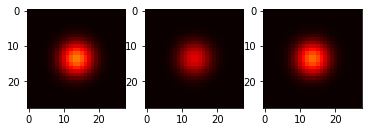

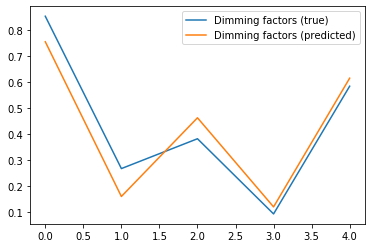

Current loss: 0.017689097672700882
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9438273906707764, dimming (predicted): 0.6358627080917358


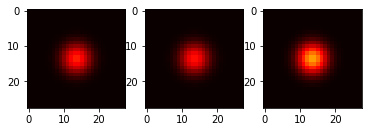

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7520461082458496, dimming (predicted): 0.6850159168243408


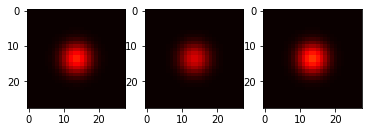

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.42017602920532227, dimming (predicted): 0.3145782947540283


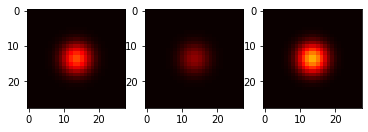

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6307233572006226, dimming (predicted): 0.6202199459075928


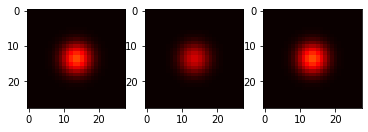

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.20008999109268188, dimming (predicted): 0.11702918261289597


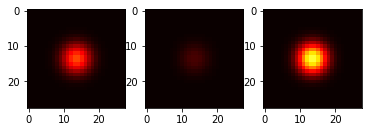

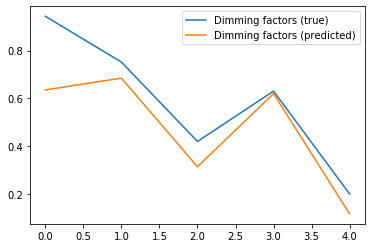

Current loss: 0.040198393166065216
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4932745695114136, dimming (predicted): 0.6002246737480164


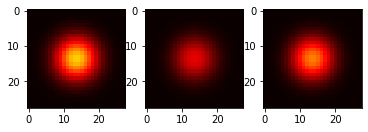

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8250115513801575, dimming (predicted): 0.7837700247764587


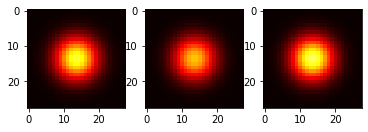

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.48945754766464233, dimming (predicted): 0.5481244325637817


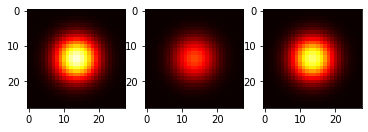

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9917817115783691, dimming (predicted): 0.9075343608856201


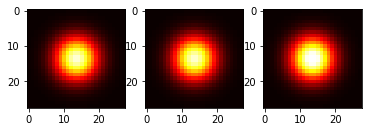

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.35406625270843506, dimming (predicted): 0.49011221528053284


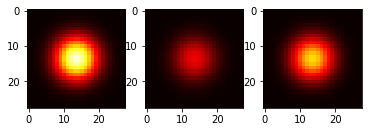

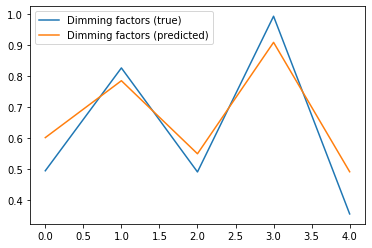

Current loss: 0.012861862778663635
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8856739401817322, dimming (predicted): 0.7794375419616699


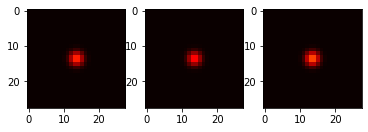

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.35175758600234985, dimming (predicted): 0.26661378145217896


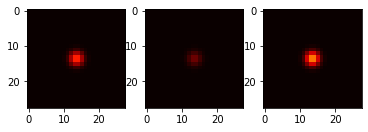

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6308813691139221, dimming (predicted): 0.6532201766967773


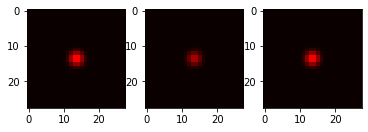

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4495426416397095, dimming (predicted): 0.43251582980155945


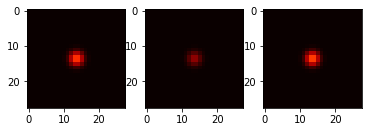

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8961005806922913, dimming (predicted): 0.9126967787742615


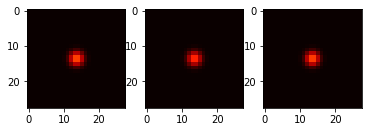

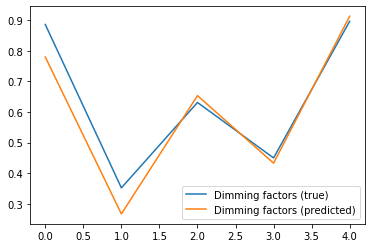

Current loss: 0.02358303777873516
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9810540080070496, dimming (predicted): 0.9037047624588013


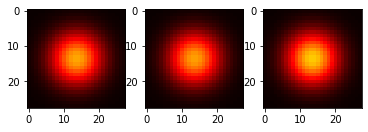

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.425899863243103, dimming (predicted): 0.6496462225914001


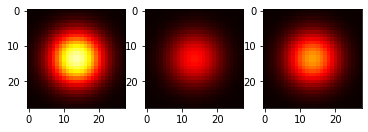

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8786200881004333, dimming (predicted): 0.8816445469856262


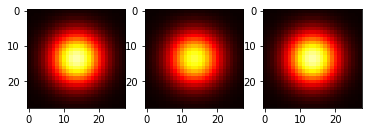

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2363564372062683, dimming (predicted): 0.48949551582336426


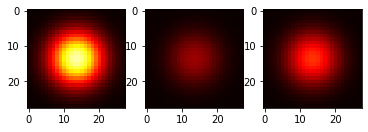

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.24427402019500732, dimming (predicted): 0.3200237452983856


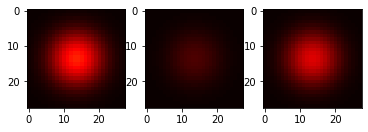

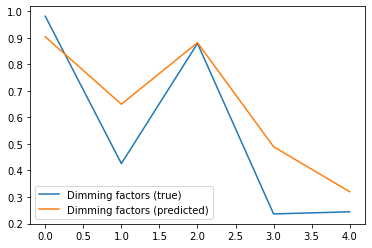

Current loss: 0.03128071874380112
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5321155190467834, dimming (predicted): 0.5075218081474304


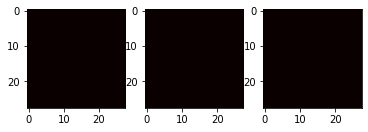

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.764123797416687, dimming (predicted): 0.3869037926197052


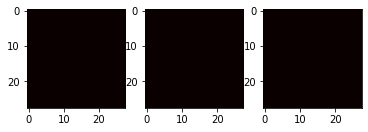

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7586937546730042, dimming (predicted): 0.34469205141067505


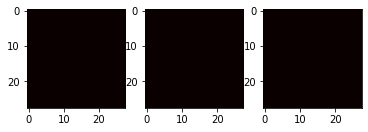

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.03321480751037598, dimming (predicted): 0.3661162555217743


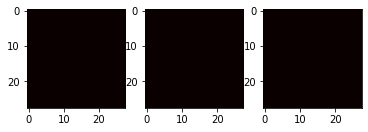

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5257082581520081, dimming (predicted): 0.4758010804653168


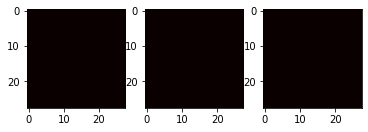

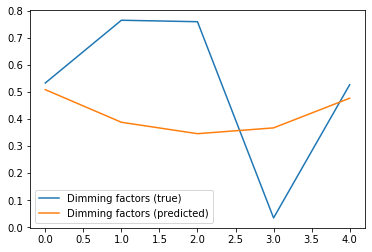

Current loss: 0.01225358247756958
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7233192324638367, dimming (predicted): 0.815292477607727


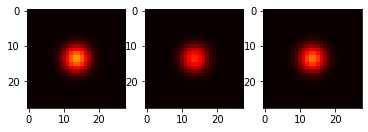

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.06609165668487549, dimming (predicted): 0.08536302298307419


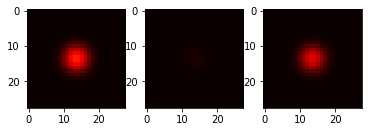

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8361151218414307, dimming (predicted): 0.8919985890388489


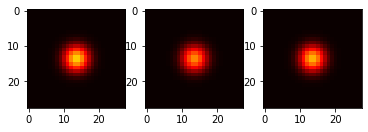

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.034143686294555664, dimming (predicted): 0.03317256644368172


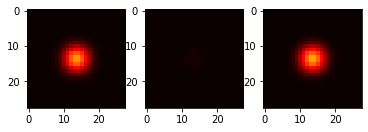

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5775348544120789, dimming (predicted): 0.5715567469596863


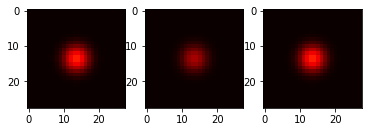

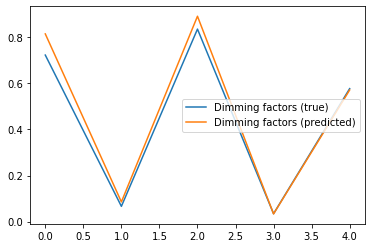

Current loss: 0.01126639824360609
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9965808391571045, dimming (predicted): 0.9247625470161438


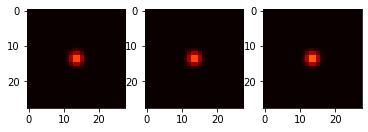

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6641505360603333, dimming (predicted): 0.6168080568313599


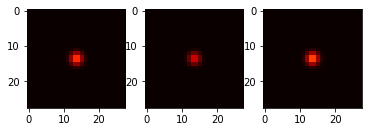

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.08482080698013306, dimming (predicted): 0.05550984665751457


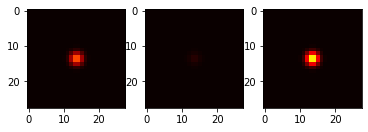

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6024948358535767, dimming (predicted): 0.7586875557899475


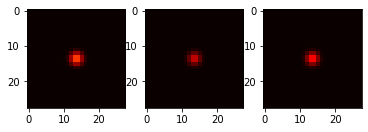

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.661894679069519, dimming (predicted): 0.6496734023094177


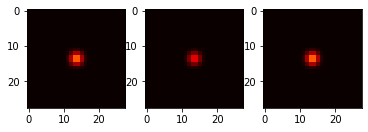

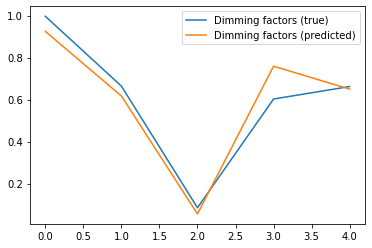

Current loss: 0.022161979228258133
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4334588050842285, dimming (predicted): 0.47209373116493225


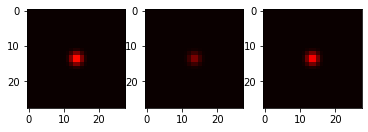

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.23545807600021362, dimming (predicted): 0.22299589216709137


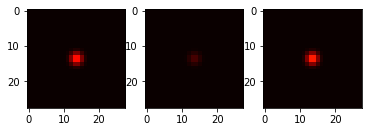

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.45336776971817017, dimming (predicted): 0.5172343850135803


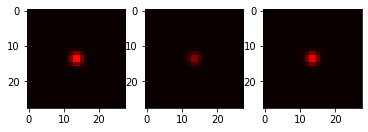

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.30573081970214844, dimming (predicted): 0.4073510468006134


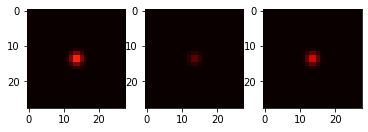

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5606474876403809, dimming (predicted): 0.6526027321815491


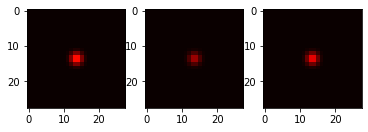

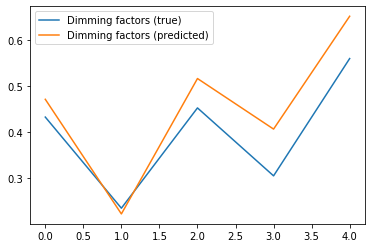

Current loss: 0.02611869014799595
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9692381024360657, dimming (predicted): 0.7261291146278381


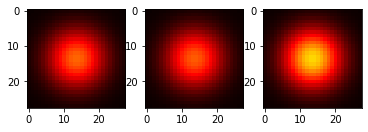

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9797096252441406, dimming (predicted): 0.6892914175987244


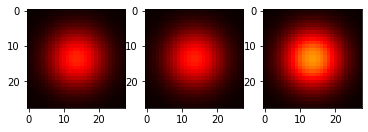

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.46378493309020996, dimming (predicted): 0.5306342244148254


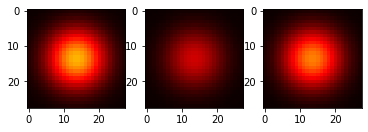

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6313827633857727, dimming (predicted): 0.5287438035011292


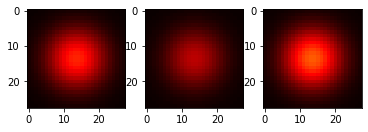

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3577415347099304, dimming (predicted): 0.638099730014801


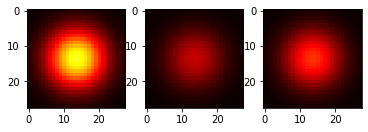

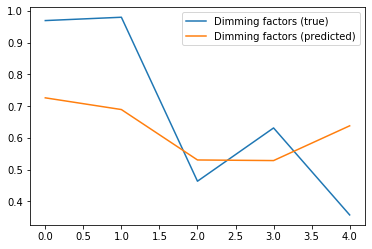

Current loss: 0.04730485752224922
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3980168104171753, dimming (predicted): 0.5558413863182068


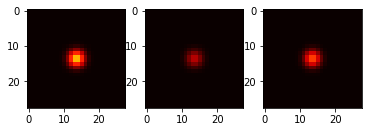

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7044599056243896, dimming (predicted): 0.7964162826538086


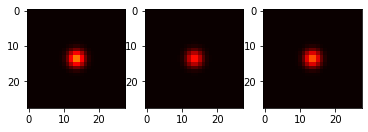

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.39686083793640137, dimming (predicted): 0.43173056840896606


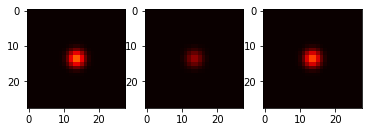

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8178209066390991, dimming (predicted): 0.8246199488639832


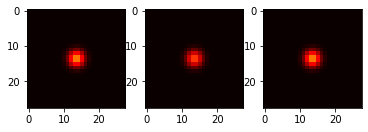

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.1990486979484558, dimming (predicted): 0.10418971627950668


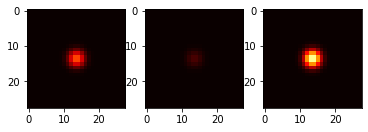

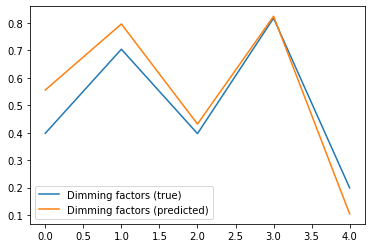

Current loss: 0.011054298840463161
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5686808824539185, dimming (predicted): 0.4317736029624939


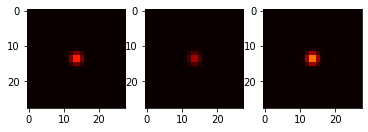

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8936238884925842, dimming (predicted): 0.8093842267990112


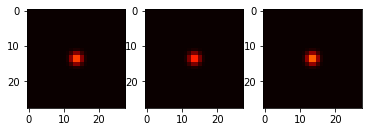

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.754551112651825, dimming (predicted): 0.6961644887924194


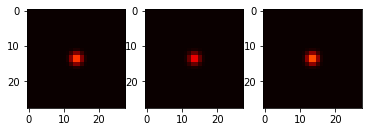

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.36096078157424927, dimming (predicted): 0.25838080048561096


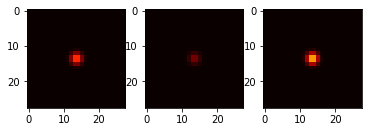

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9498510956764221, dimming (predicted): 0.9261036515235901


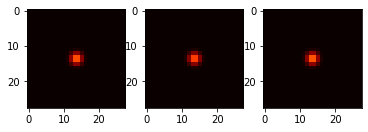

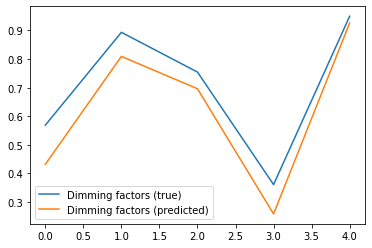

Current loss: 0.028925132006406784
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.24928373098373413, dimming (predicted): 0.5138977766036987


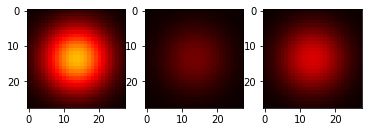

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9866927266120911, dimming (predicted): 0.9235227108001709


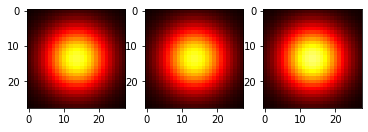

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4998820424079895, dimming (predicted): 0.5960326790809631


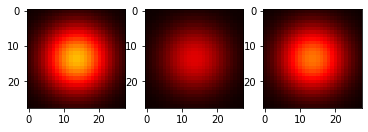

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8599206805229187, dimming (predicted): 0.8189107179641724


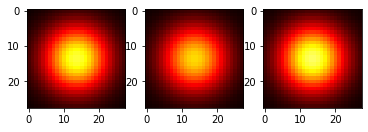

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.772189199924469, dimming (predicted): 0.9125645160675049


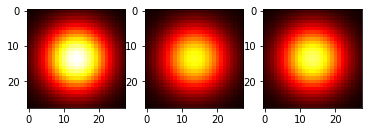

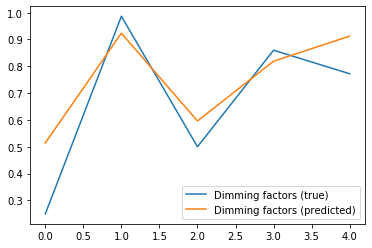

Current loss: 0.025943253189325333
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.323957622051239, dimming (predicted): 0.5622724294662476


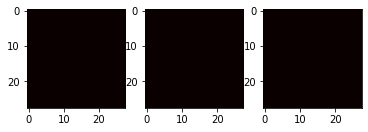

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2681550979614258, dimming (predicted): 0.5333685278892517


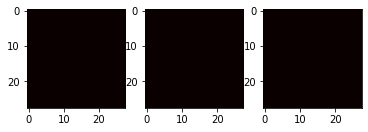

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9456195831298828, dimming (predicted): 0.5265380144119263


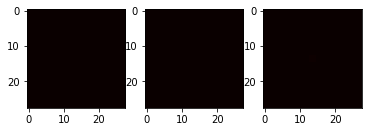

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.31595492362976074, dimming (predicted): 0.4638582766056061


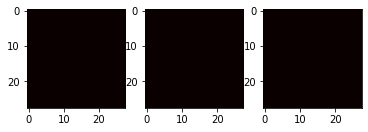

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.46301716566085815, dimming (predicted): 0.5008641481399536


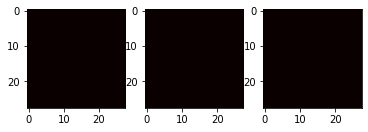

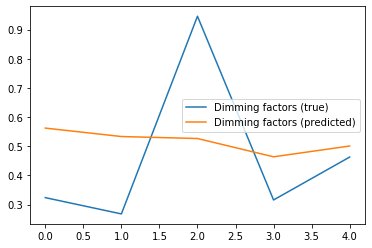

Current loss: 0.017245063558220863
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6360795497894287, dimming (predicted): 0.5478570461273193


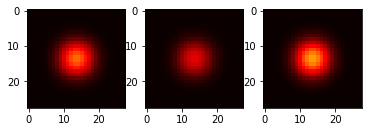

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.43733692169189453, dimming (predicted): 0.5100939273834229


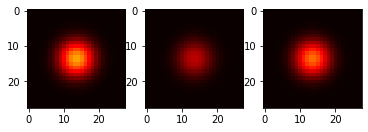

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8767369985580444, dimming (predicted): 0.9117939472198486


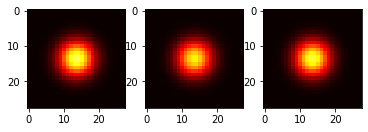

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.504621148109436, dimming (predicted): 0.3129934072494507


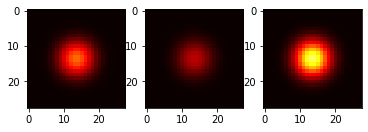

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.1741693615913391, dimming (predicted): 0.10273884981870651


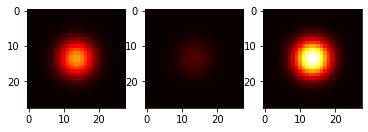

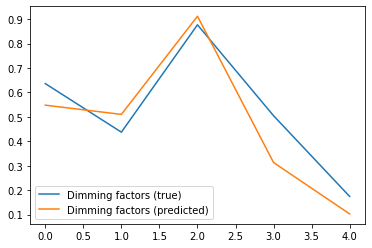

Current loss: 0.0177774615585804
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.20629644393920898, dimming (predicted): 0.1517002284526825


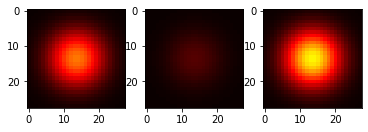

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5561288595199585, dimming (predicted): 0.7561007142066956


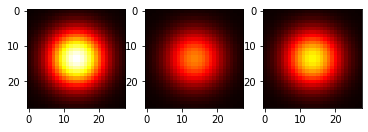

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.22631096839904785, dimming (predicted): 0.14924201369285583


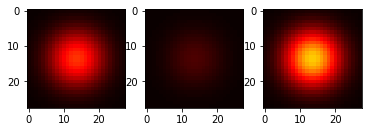

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7533010840415955, dimming (predicted): 0.5044989585876465


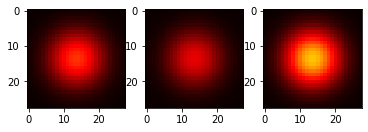

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.709912121295929, dimming (predicted): 0.6572787165641785


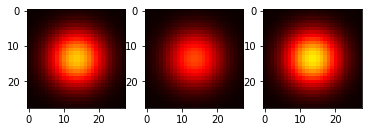

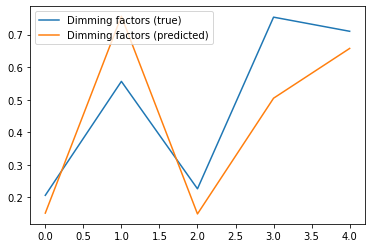

Current loss: 0.020411109551787376
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.962684690952301, dimming (predicted): 0.8329653143882751


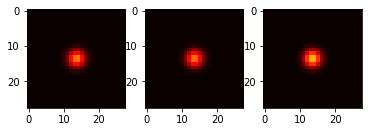

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6106602549552917, dimming (predicted): 0.764811098575592


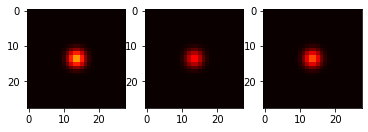

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5911176800727844, dimming (predicted): 0.5494109988212585


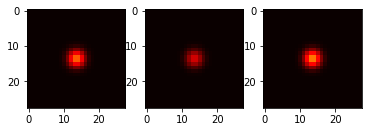

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.09750038385391235, dimming (predicted): 0.11405923962593079


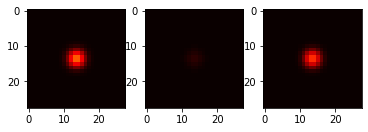

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3754658102989197, dimming (predicted): 0.31082406640052795


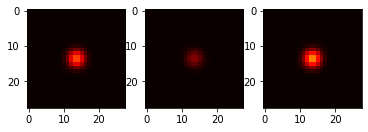

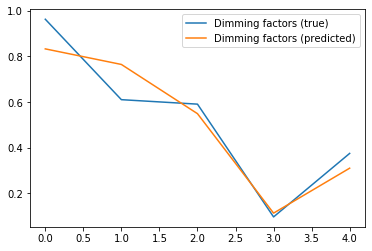

Current loss: 0.011810007505118847
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5236049294471741, dimming (predicted): 0.5468441843986511


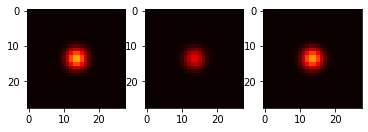

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3549618124961853, dimming (predicted): 0.3516015410423279


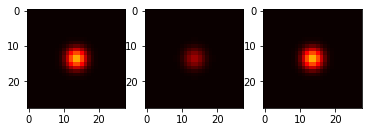

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5127298831939697, dimming (predicted): 0.4794672727584839


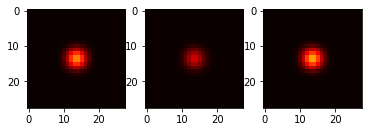

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8275210857391357, dimming (predicted): 0.7241955995559692


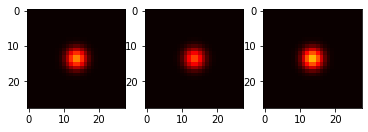

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9765855669975281, dimming (predicted): 0.8858912587165833


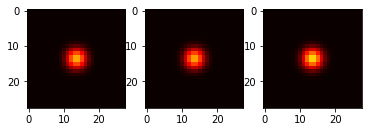

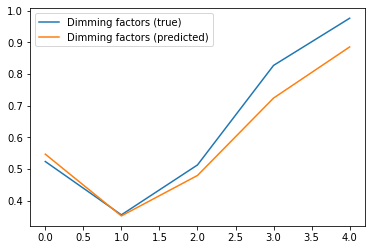

Current loss: 0.015953604131937027
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.12498778104782104, dimming (predicted): 0.049498338252305984


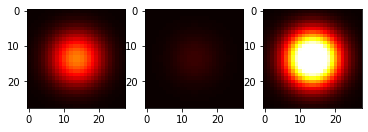

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8261785507202148, dimming (predicted): 0.8266437649726868


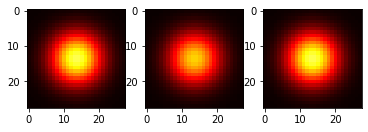

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5216346383094788, dimming (predicted): 0.8165685534477234


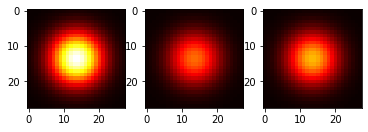

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8264226317405701, dimming (predicted): 0.7531285881996155


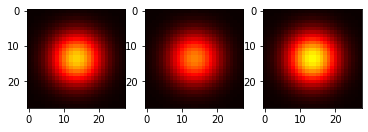

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.48114651441574097, dimming (predicted): 0.7409232258796692


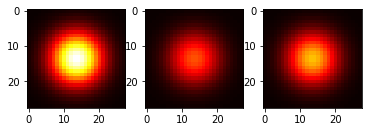

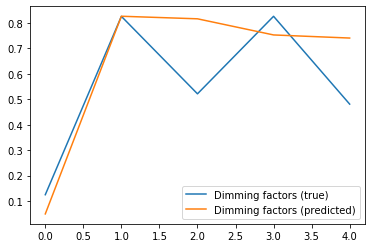

Current loss: 0.011120334267616272
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6673136353492737, dimming (predicted): 0.6967122554779053


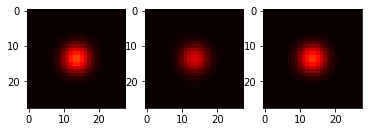

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4961462616920471, dimming (predicted): 0.6259181499481201


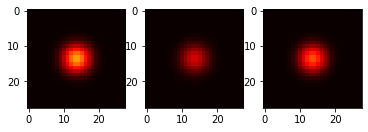

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.16501390933990479, dimming (predicted): 0.18090157210826874


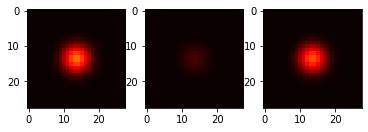

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.616590678691864, dimming (predicted): 0.7684383392333984


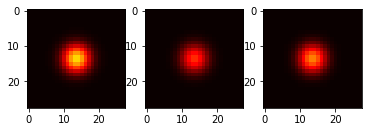

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8104866743087769, dimming (predicted): 0.9075397849082947


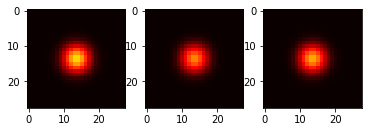

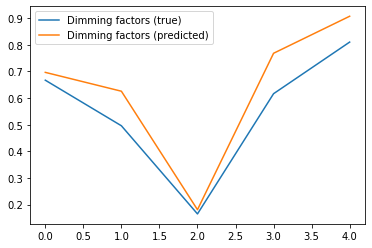

Current loss: 0.014759762212634087
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8644559979438782, dimming (predicted): 0.7892189025878906


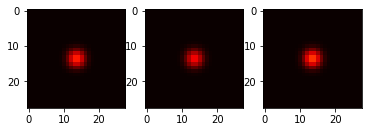

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.03461265563964844, dimming (predicted): 0.09100882709026337


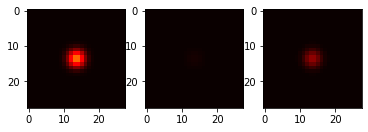

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.41653263568878174, dimming (predicted): 0.5664571523666382


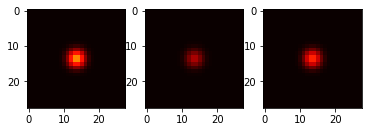

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7885451316833496, dimming (predicted): 0.7121418118476868


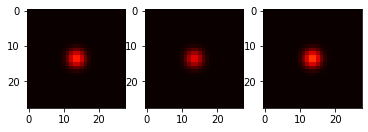

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7341099381446838, dimming (predicted): 0.8344754576683044


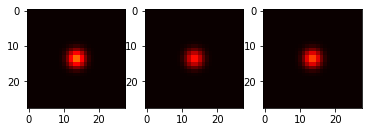

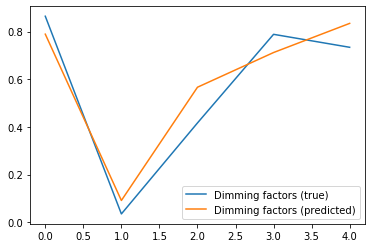

Current loss: 0.0177371297031641
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.08792132139205933, dimming (predicted): 0.09317369014024734


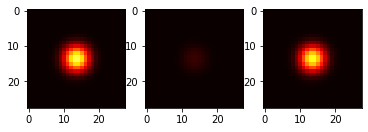

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5760974884033203, dimming (predicted): 0.6999784111976624


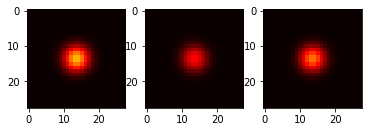

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7414844632148743, dimming (predicted): 0.7674840092658997


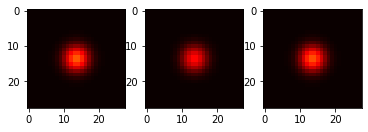

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8924008011817932, dimming (predicted): 0.7080962061882019


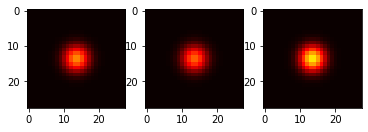

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3866764307022095, dimming (predicted): 0.41582751274108887


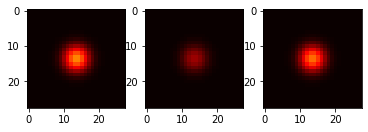

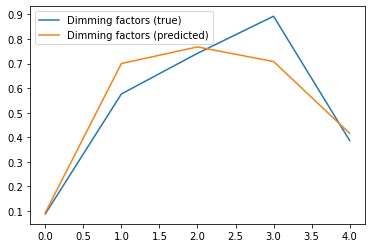

Current loss: 0.01276654563844204
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8149877190589905, dimming (predicted): 0.8746451735496521


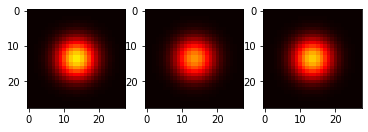

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4062976837158203, dimming (predicted): 0.4352359175682068


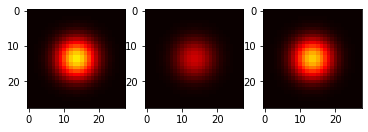

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7918409109115601, dimming (predicted): 0.9234395623207092


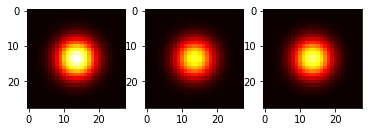

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.12719178199768066, dimming (predicted): 0.15856656432151794


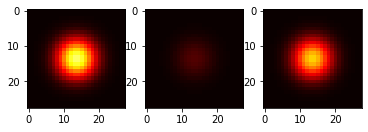

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.10198354721069336, dimming (predicted): 0.07371082156896591


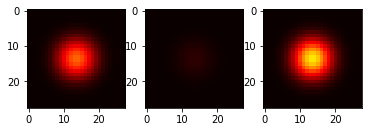

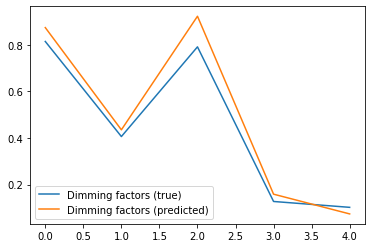

Current loss: 0.006371770054101944
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.33983874320983887, dimming (predicted): 0.4152365028858185


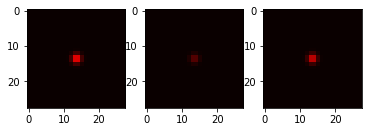

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2671470046043396, dimming (predicted): 0.2526535093784332


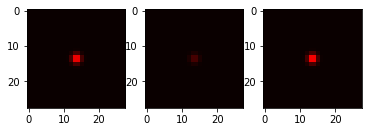

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.17065566778182983, dimming (predicted): 0.144262433052063


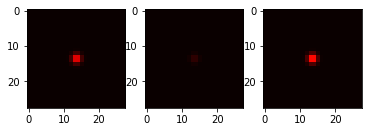

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6147673726081848, dimming (predicted): 0.7186304926872253


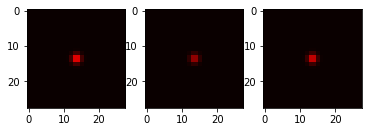

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5407209992408752, dimming (predicted): 0.7162665128707886


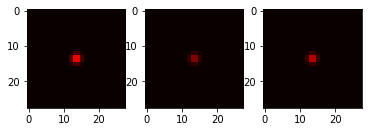

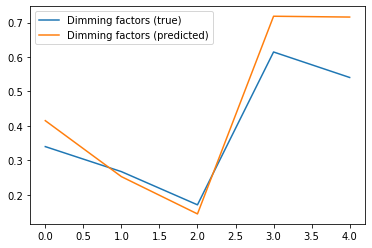

Current loss: 0.006229229271411896
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8226891756057739, dimming (predicted): 0.8839340209960938


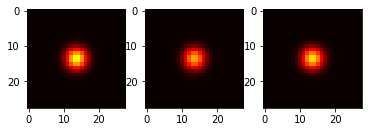

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.21867257356643677, dimming (predicted): 0.2226015329360962


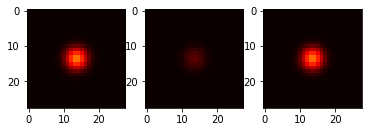

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.432014524936676, dimming (predicted): 0.4290950894355774


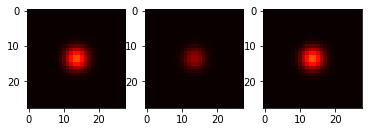

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.13409119844436646, dimming (predicted): 0.11416837573051453


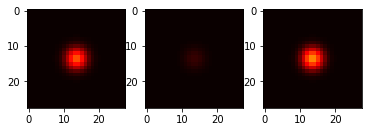

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.19759517908096313, dimming (predicted): 0.17154015600681305


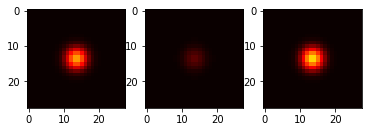

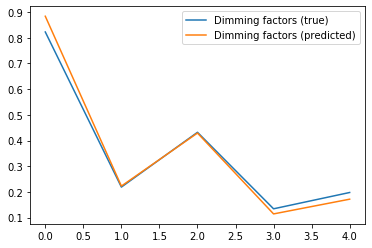

Current loss: 0.024174610152840614
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.16369569301605225, dimming (predicted): 0.18307043612003326


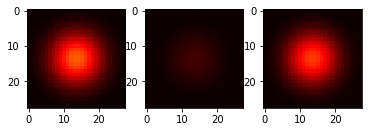

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.71562260389328, dimming (predicted): 0.8552184700965881


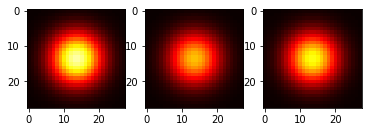

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.06703358888626099, dimming (predicted): 0.06468462198972702


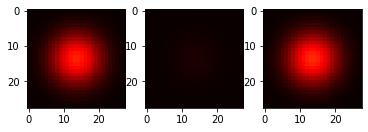

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5874189138412476, dimming (predicted): 0.5598356127738953


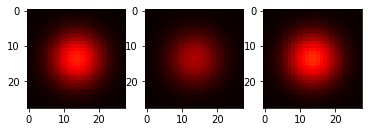

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6591827869415283, dimming (predicted): 0.5333070755004883


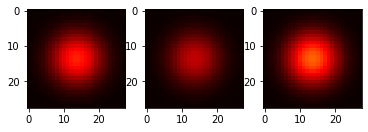

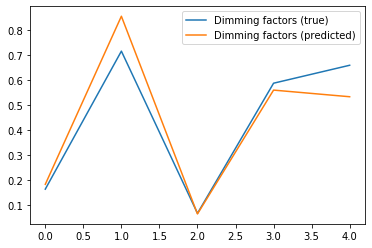

Current loss: 0.00996636413037777
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9634029269218445, dimming (predicted): 0.8496033549308777


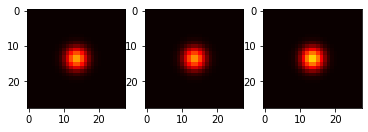

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.17246556282043457, dimming (predicted): 0.06970605254173279


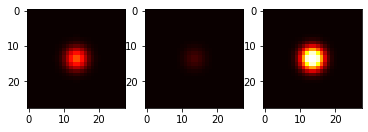

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.16405898332595825, dimming (predicted): 0.22388577461242676


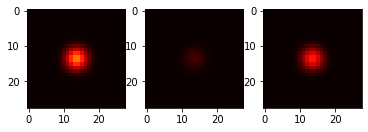

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.23220711946487427, dimming (predicted): 0.20019212365150452


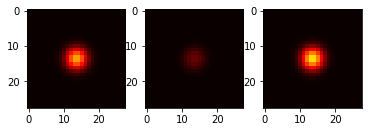

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7689847946166992, dimming (predicted): 0.7855323553085327


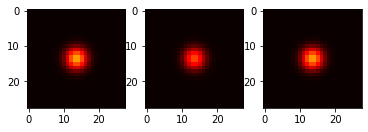

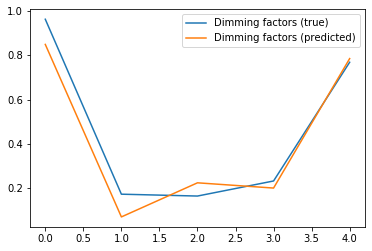

Current loss: 0.020767049863934517
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4850844740867615, dimming (predicted): 0.670501708984375


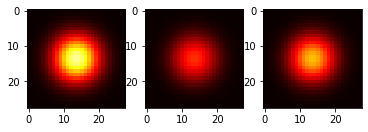

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.12605297565460205, dimming (predicted): 0.16263586282730103


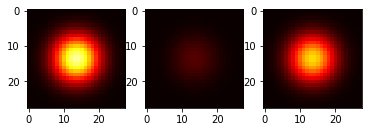

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5578095316886902, dimming (predicted): 0.6695386171340942


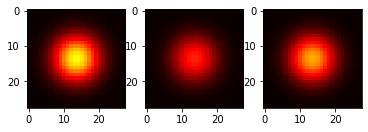

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6560588479042053, dimming (predicted): 0.3943304121494293


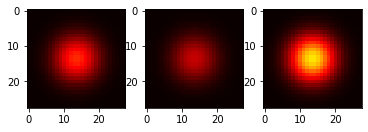

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4594387412071228, dimming (predicted): 0.6954746246337891


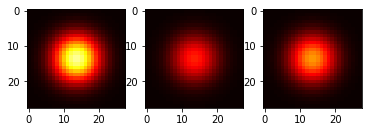

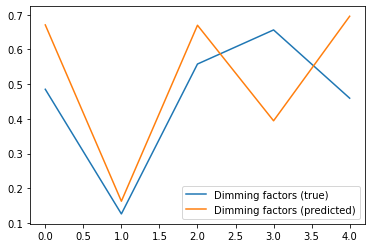

Current loss: 0.017861800268292427
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4142550230026245, dimming (predicted): 0.6064718961715698


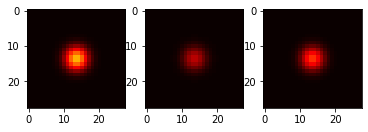

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7072380185127258, dimming (predicted): 0.590628981590271


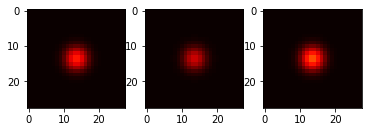

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.010699927806854248, dimming (predicted): 0.10495240241289139


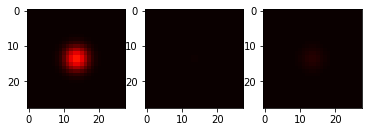

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4335052967071533, dimming (predicted): 0.35112264752388


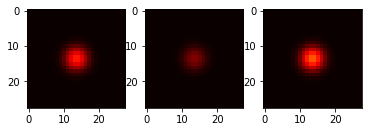

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3965930938720703, dimming (predicted): 0.4178600013256073


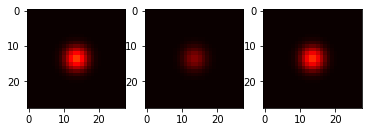

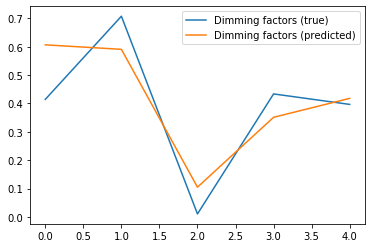

Current loss: 0.040204815566539764
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.16514688730239868, dimming (predicted): 0.13332828879356384


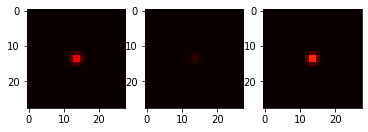

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9834838509559631, dimming (predicted): 0.9090893864631653


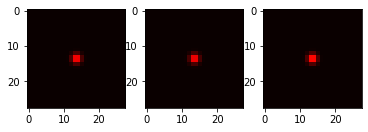

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6540260314941406, dimming (predicted): 0.581447184085846


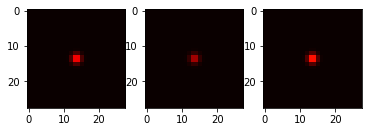

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7213094234466553, dimming (predicted): 0.7128289937973022


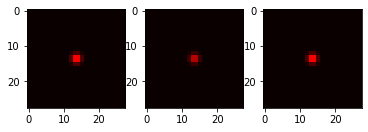

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6055400967597961, dimming (predicted): 0.6631823182106018


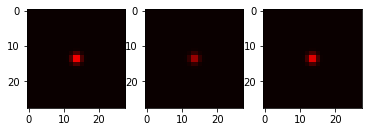

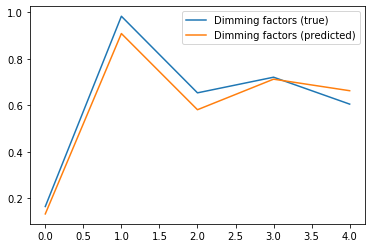

Current loss: 0.027933791279792786
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6662639379501343, dimming (predicted): 0.7615742087364197


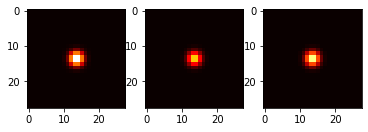

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.036835670471191406, dimming (predicted): 0.14419351518154144


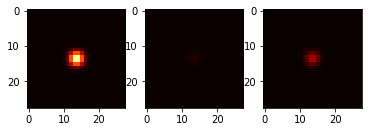

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.17630231380462646, dimming (predicted): 0.33933544158935547


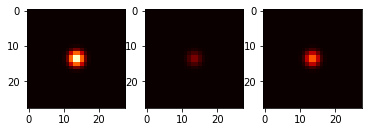

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.08550858497619629, dimming (predicted): 0.1826343536376953


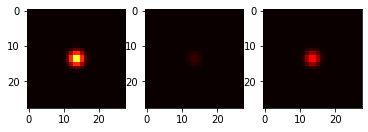

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.17025399208068848, dimming (predicted): 0.29108721017837524


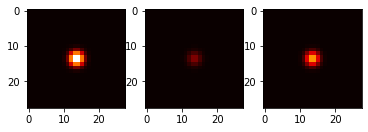

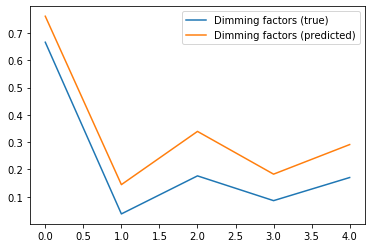

Current loss: 0.010562370531260967
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.177348792552948, dimming (predicted): 0.1956346184015274


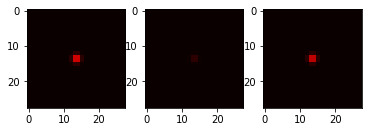

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5173599123954773, dimming (predicted): 0.4795786142349243


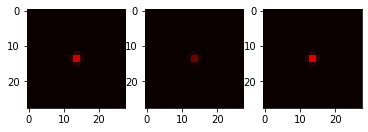

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3492310047149658, dimming (predicted): 0.32986190915107727


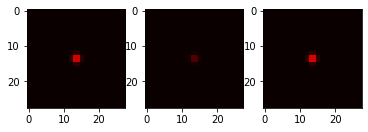

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9643468260765076, dimming (predicted): 0.8929850459098816


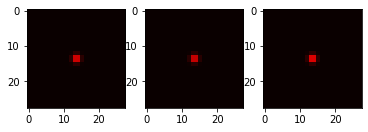

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5967555642127991, dimming (predicted): 0.5921755433082581


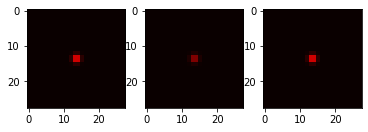

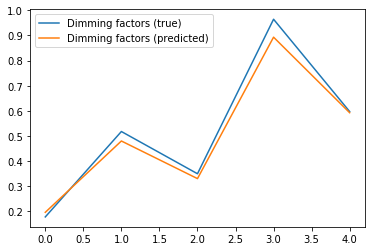

Current loss: 0.03263464570045471
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8405012488365173, dimming (predicted): 0.5712597370147705


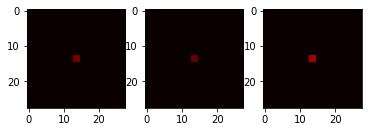

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6836681365966797, dimming (predicted): 0.5908575057983398


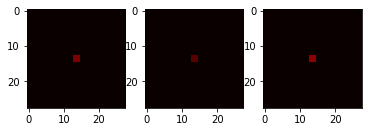

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.29558491706848145, dimming (predicted): 0.2804916501045227


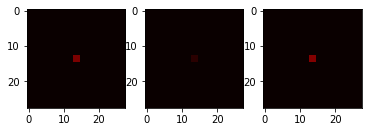

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4066246747970581, dimming (predicted): 0.3393777012825012


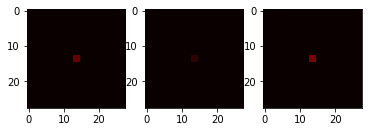

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2106425166130066, dimming (predicted): 0.2526625096797943


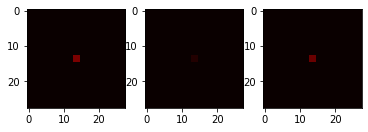

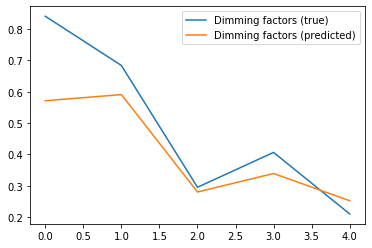

Current loss: 0.010997897014021873
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3966449499130249, dimming (predicted): 0.34204307198524475


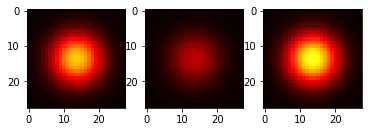

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7347054481506348, dimming (predicted): 0.8329624533653259


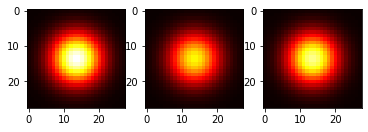

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2514973282814026, dimming (predicted): 0.33332574367523193


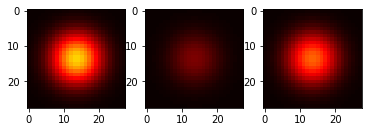

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.08650386333465576, dimming (predicted): 0.05698315054178238


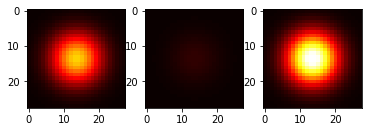

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7971059083938599, dimming (predicted): 0.5561094880104065


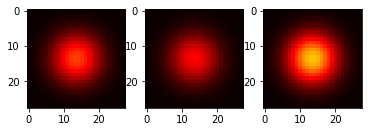

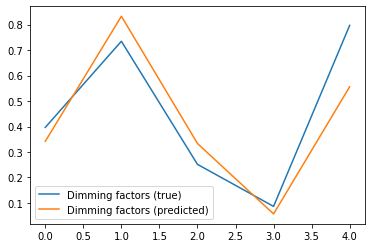

Current loss: 0.01153530366718769
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7264672517776489, dimming (predicted): 0.7302428483963013


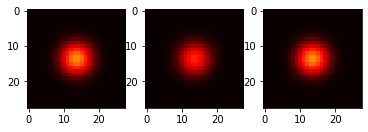

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3641619086265564, dimming (predicted): 0.30555349588394165


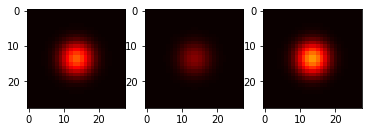

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2459404468536377, dimming (predicted): 0.24343083798885345


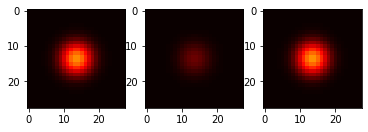

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.32227224111557007, dimming (predicted): 0.3763306140899658


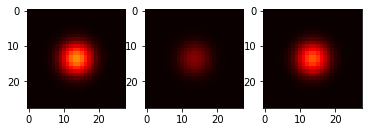

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9868127703666687, dimming (predicted): 0.8522923588752747


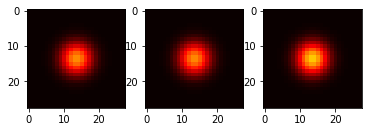

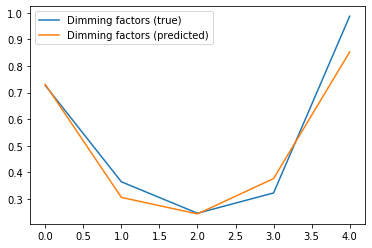

Current loss: 0.015392964705824852
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.030408203601837158, dimming (predicted): 0.0772022232413292


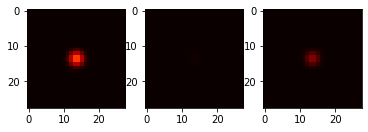

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.372042179107666, dimming (predicted): 0.4017258584499359


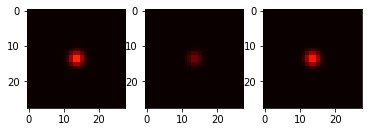

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7916200757026672, dimming (predicted): 0.8400269150733948


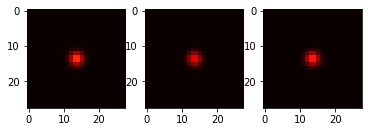

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6310757398605347, dimming (predicted): 0.8118478059768677


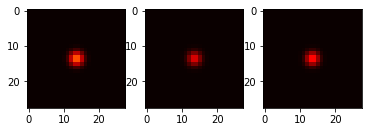

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.31345611810684204, dimming (predicted): 0.24675436317920685


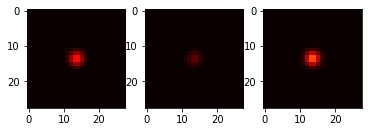

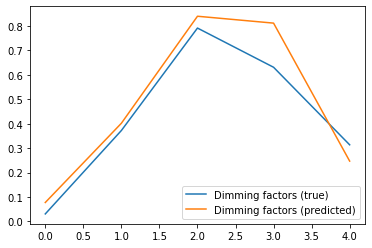

Current loss: 0.016497671604156494
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.692639946937561, dimming (predicted): 0.6716926097869873


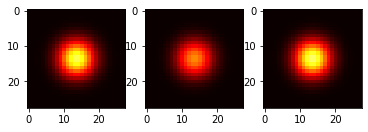

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8765347003936768, dimming (predicted): 0.6975647807121277


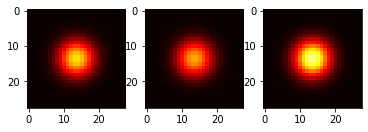

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6126766800880432, dimming (predicted): 0.6589939594268799


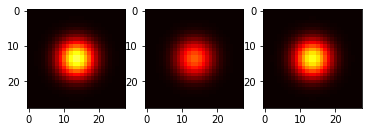

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5946093201637268, dimming (predicted): 0.6788287162780762


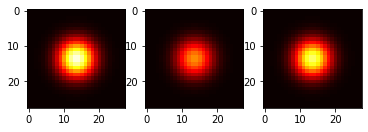

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.1782178282737732, dimming (predicted): 0.21578949689865112


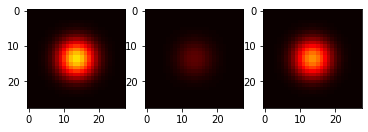

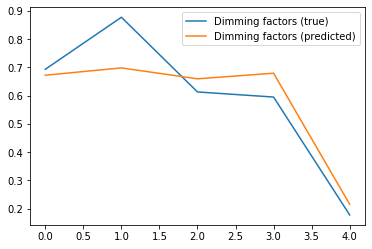

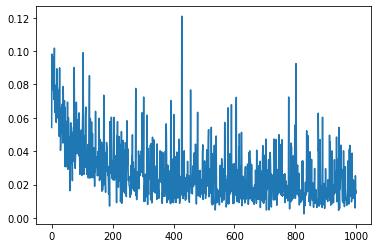

Loss min: 0.002405724721029401, max: 0.12087694555521011, mean: 0.027399372360436245
0.027399372360436245


In [103]:
def make_sun_lowerleft(num_channels):
    size = 28
    xx, yy = np.meshgrid(np.arange(size)-(size-1)/2.,np.arange(size)-(size-1)/2)
    r = np.sqrt(xx*xx+yy*yy) 
    R = np.random.rand(1)*(size/3)
    channels = []
    for c in range(num_channels):
        random_channel = np.random.randint(num_channels)
        I_c = R ** (random_channel/10.)
        channels.append(np.exp(-(r*r)/(R*R))*I_c)
    image = torch.cat([torch.from_numpy(channel).float().to(device) for channel in channels]).view(num_channels, 28, 28)
    return image

lowerleft_mean = run_experiment("lowerleft_mean", make_sun_lowerleft)
print(lowerleft_mean)

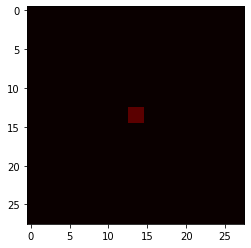

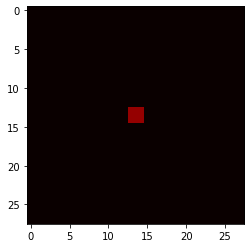

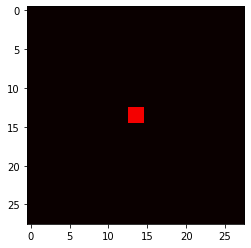

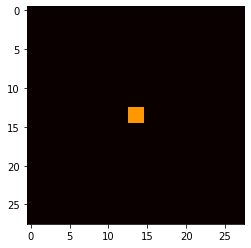

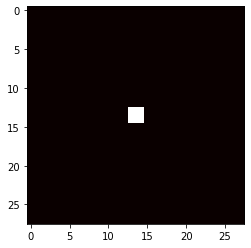

input_channels: 5
cnn_output_dim: 512
Current loss: 0.0810447707772255
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3863863945007324, dimming (predicted): 0.4893687963485718


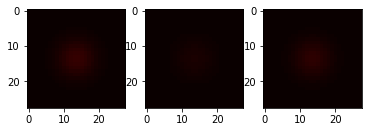

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.14232712984085083, dimming (predicted): 0.527695894241333


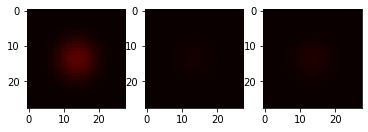

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9320893287658691, dimming (predicted): 0.5043255686759949


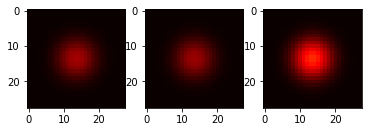

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2052769660949707, dimming (predicted): 0.5528631210327148


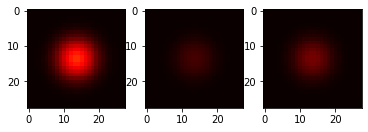

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5006236433982849, dimming (predicted): 0.4859740436077118


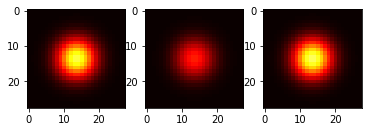

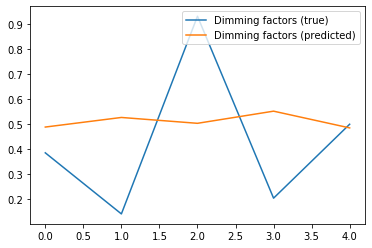

Current loss: 0.08660654723644257
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2923271656036377, dimming (predicted): 0.5759355425834656


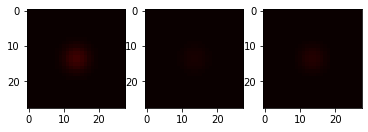

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5167489051818848, dimming (predicted): 0.5135114192962646


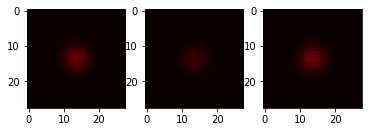

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8595498204231262, dimming (predicted): 0.4936891496181488


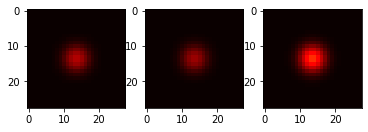

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9277803897857666, dimming (predicted): 0.5131853818893433


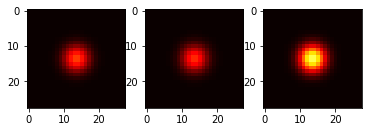

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7394330501556396, dimming (predicted): 0.4118797779083252


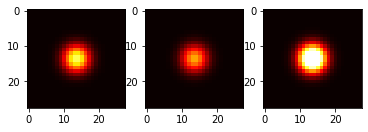

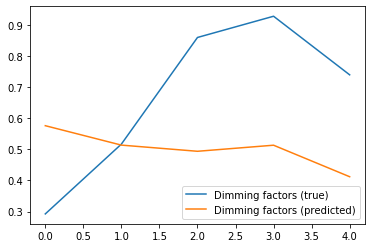

Current loss: 0.07574047893285751
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9923571348190308, dimming (predicted): 0.5110095739364624


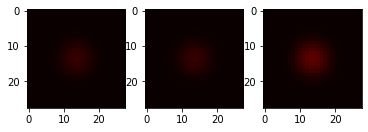

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9152956604957581, dimming (predicted): 0.5755863189697266


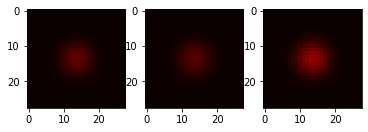

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.28445494174957275, dimming (predicted): 0.5429643392562866


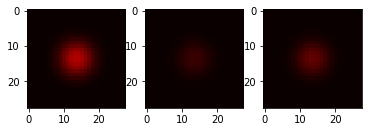

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7789920568466187, dimming (predicted): 0.5002323985099792


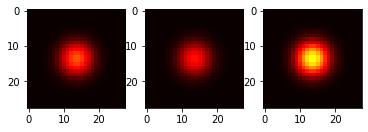

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8903608918190002, dimming (predicted): 0.8389444351196289


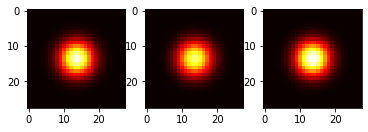

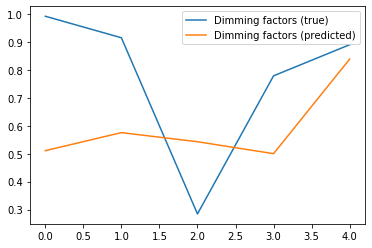

Current loss: 0.0555402934551239
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2888453006744385, dimming (predicted): 0.593540608882904


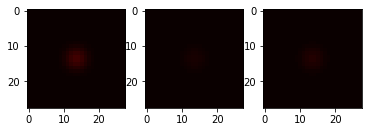

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9680697917938232, dimming (predicted): 0.5947845578193665


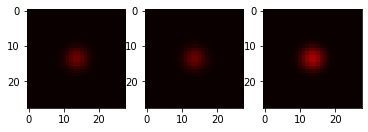

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.39819997549057007, dimming (predicted): 0.36860352754592896


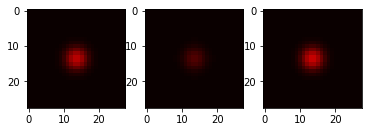

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.564745306968689, dimming (predicted): 0.49563005566596985


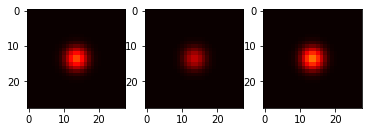

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8164701461791992, dimming (predicted): 0.7821700572967529


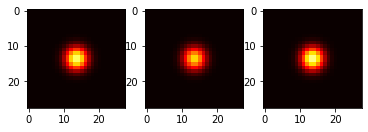

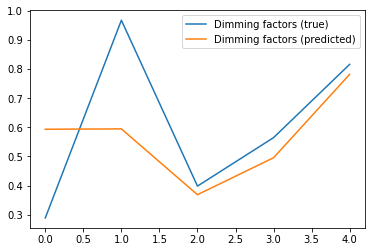

Current loss: 0.06280435621738434
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5437283515930176, dimming (predicted): 0.42070841789245605


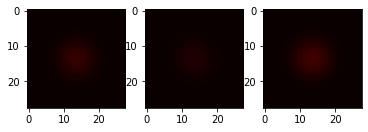

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9608692526817322, dimming (predicted): 0.6279035210609436


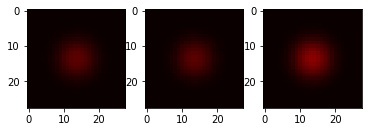

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.07912987470626831, dimming (predicted): 0.21922901272773743


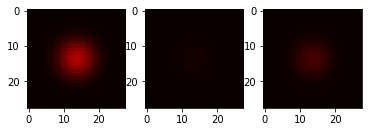

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5594593286514282, dimming (predicted): 0.34314271807670593


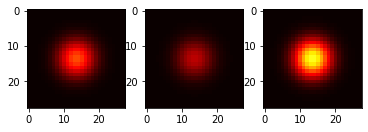

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9457615613937378, dimming (predicted): 0.9064525961875916


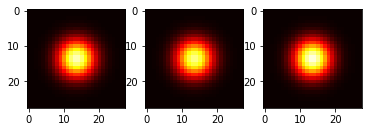

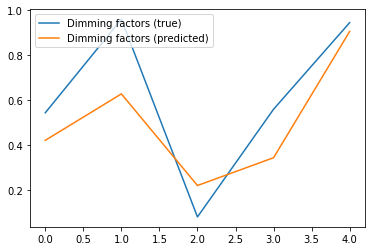

Current loss: 0.05794612690806389
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8365724682807922, dimming (predicted): 0.5562645792961121


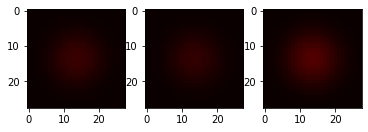

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5677762627601624, dimming (predicted): 0.3826846182346344


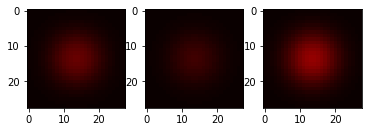

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5867655873298645, dimming (predicted): 0.3429908752441406


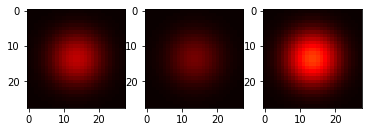

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.334280788898468, dimming (predicted): 0.08429746329784393


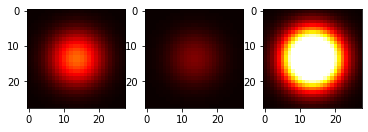

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9552559852600098, dimming (predicted): 0.812982439994812


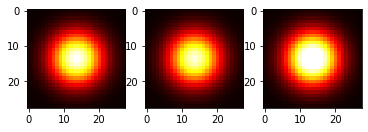

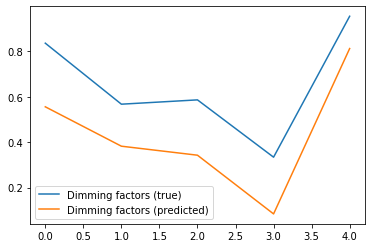

Current loss: 0.02504485286772251
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7450559139251709, dimming (predicted): 0.595472514629364


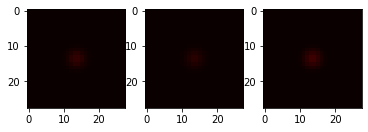

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8530006408691406, dimming (predicted): 0.5772862434387207


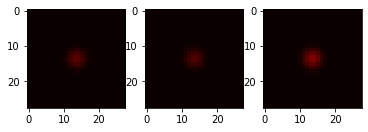

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.39945554733276367, dimming (predicted): 0.4753718376159668


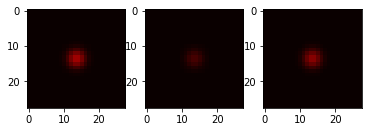

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4312182068824768, dimming (predicted): 0.4006108343601227


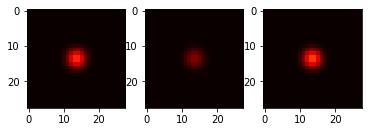

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.625404417514801, dimming (predicted): 0.7178674340248108


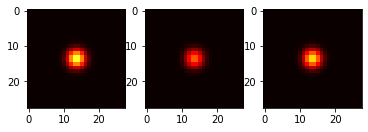

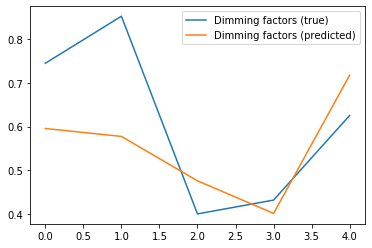

Current loss: 0.04326546937227249
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6800211071968079, dimming (predicted): 0.36342066526412964


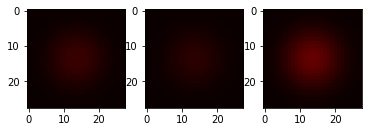

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8114365935325623, dimming (predicted): 0.5447796583175659


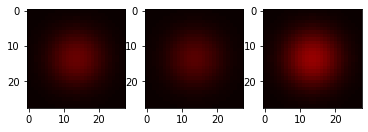

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.04516679048538208, dimming (predicted): 0.08731906861066818


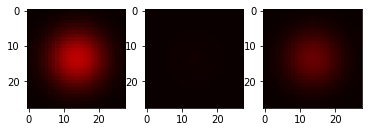

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6028135418891907, dimming (predicted): 0.8157580494880676


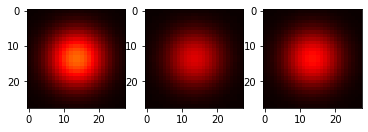

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2025381326675415, dimming (predicted): 0.23953716456890106


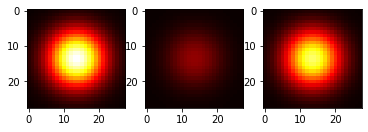

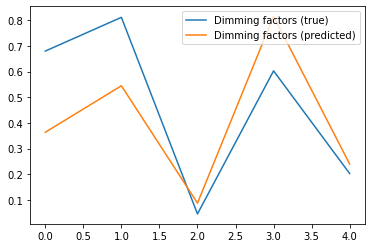

Current loss: 0.05818328261375427
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.08669841289520264, dimming (predicted): 0.362337201833725


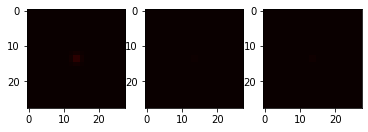

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.21900635957717896, dimming (predicted): 0.2854258716106415


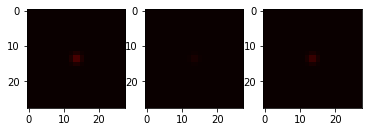

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8963446617126465, dimming (predicted): 0.35722482204437256


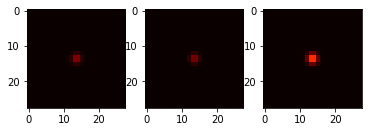

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9447149038314819, dimming (predicted): 0.7617112994194031


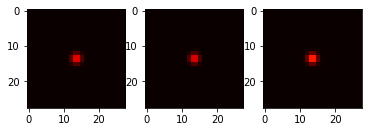

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3930089473724365, dimming (predicted): 0.2879487872123718


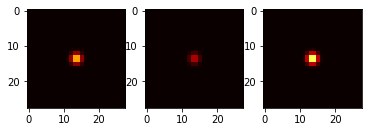

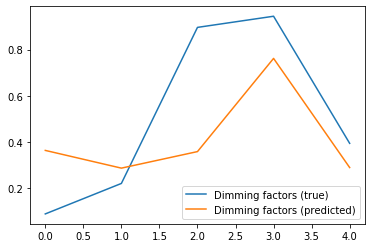

Current loss: 0.07657699286937714
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7547319531440735, dimming (predicted): 0.31282541155815125


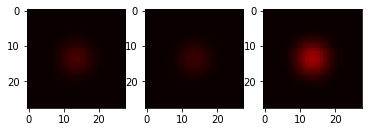

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5406032800674438, dimming (predicted): 0.4616658091545105


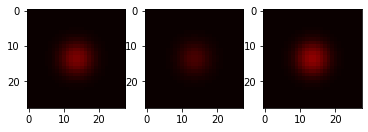

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7272336483001709, dimming (predicted): 0.8809415102005005


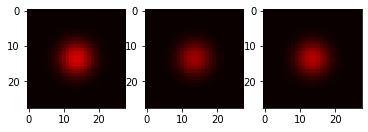

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.944465160369873, dimming (predicted): 0.7970682978630066


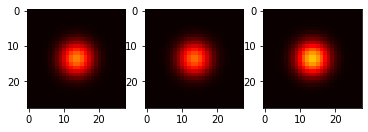

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.08032083511352539, dimming (predicted): 0.19188417494297028


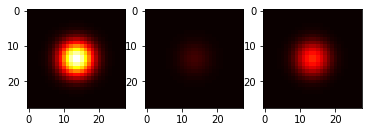

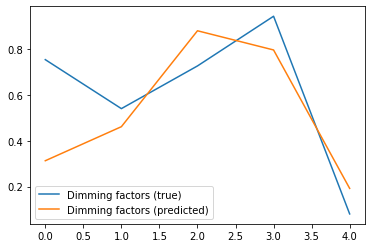

Current loss: 0.024891551584005356
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7688203454017639, dimming (predicted): 0.5159997940063477


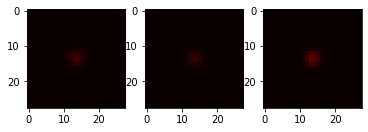

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.48272275924682617, dimming (predicted): 0.6148959398269653


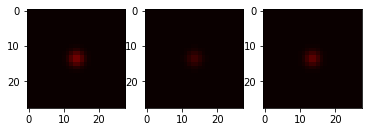

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3377034068107605, dimming (predicted): 0.5132330656051636


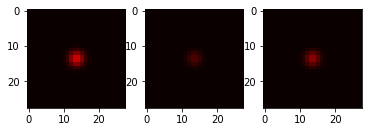

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3674256205558777, dimming (predicted): 0.6340462565422058


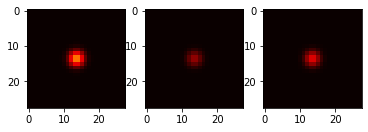

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.1714821457862854, dimming (predicted): 0.2640033960342407


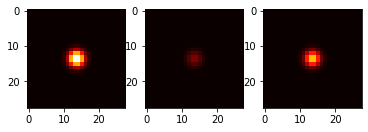

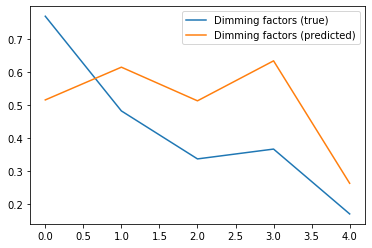

Current loss: 0.02606755867600441
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.09650564193725586, dimming (predicted): 0.3304571211338043


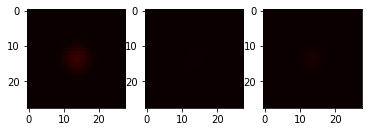

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5162491798400879, dimming (predicted): 0.5809229612350464


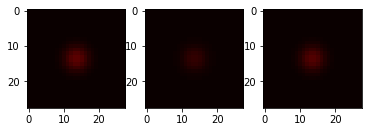

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.33340829610824585, dimming (predicted): 0.3184296190738678


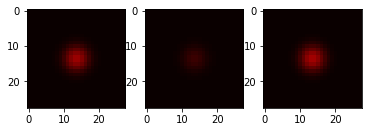

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7485151886940002, dimming (predicted): 0.8215988278388977


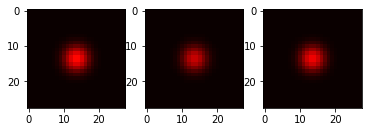

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3562014698982239, dimming (predicted): 0.33529189229011536


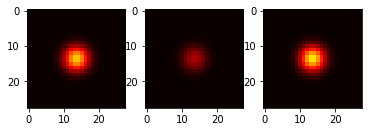

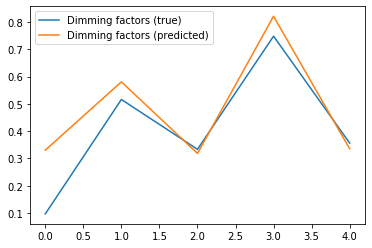

Current loss: 0.040557749569416046
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9049214124679565, dimming (predicted): 0.7627967000007629


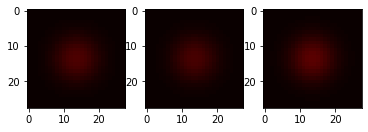

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.09871691465377808, dimming (predicted): 0.08085258305072784


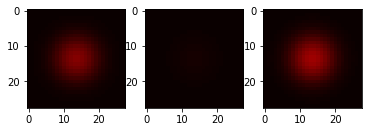

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6069376468658447, dimming (predicted): 0.46541228890419006


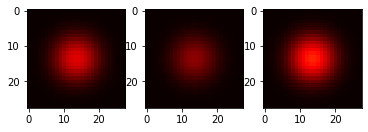

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9046573638916016, dimming (predicted): 0.7801880240440369


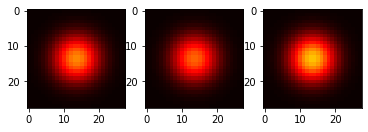

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9567165970802307, dimming (predicted): 0.7575362324714661


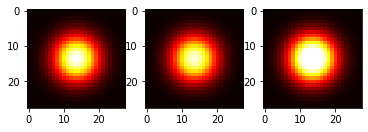

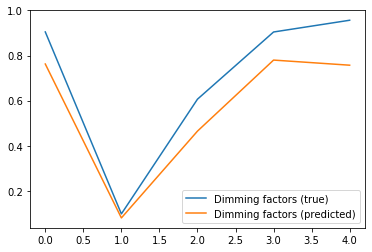

Current loss: 0.03710563853383064
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6116881370544434, dimming (predicted): 0.4539451599121094


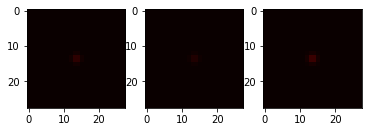

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7498297095298767, dimming (predicted): 0.34924232959747314


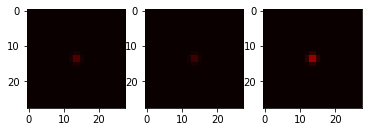

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9977918267250061, dimming (predicted): 0.7125930190086365


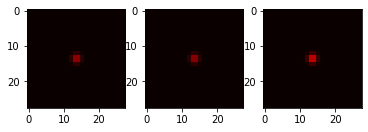

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9178372025489807, dimming (predicted): 0.850877046585083


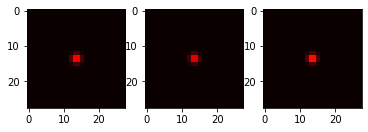

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5353875756263733, dimming (predicted): 0.4061230421066284


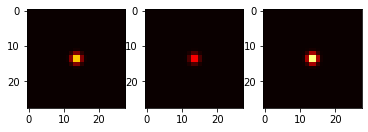

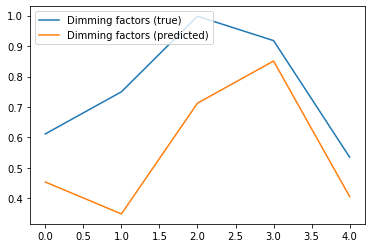

Current loss: 0.03546570613980293
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7172698378562927, dimming (predicted): 0.5389857292175293


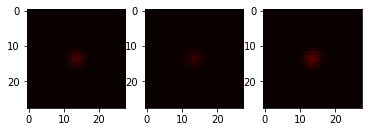

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6441479325294495, dimming (predicted): 0.743120014667511


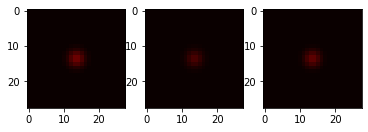

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.08215600252151489, dimming (predicted): 0.18356695771217346


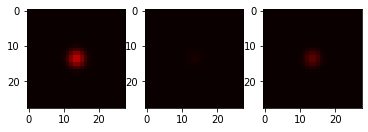

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.519600510597229, dimming (predicted): 0.3199177086353302


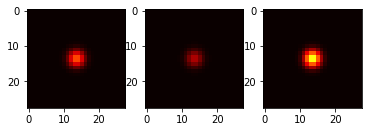

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8286839723587036, dimming (predicted): 0.786211371421814


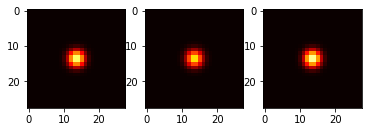

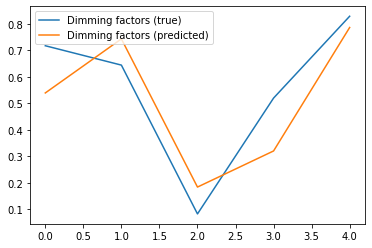

Current loss: 0.02707698568701744
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6189820170402527, dimming (predicted): 0.6794987916946411


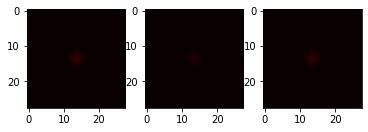

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.18474799394607544, dimming (predicted): 0.38584062457084656


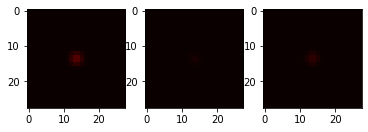

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.24858778715133667, dimming (predicted): 0.32915452122688293


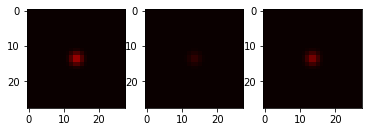

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.10025161504745483, dimming (predicted): 0.26505622267723083


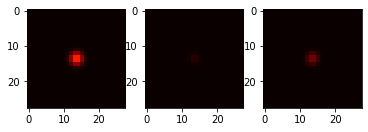

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7787893414497375, dimming (predicted): 0.8936193585395813


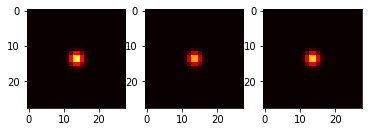

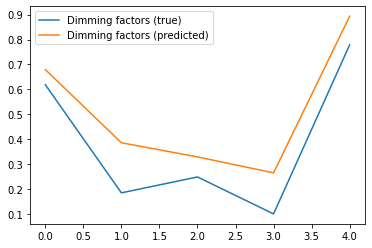

Current loss: 0.040439870208501816
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.06108129024505615, dimming (predicted): 0.08565345406532288


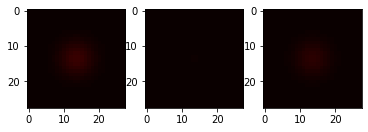

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5152258276939392, dimming (predicted): 0.3149002492427826


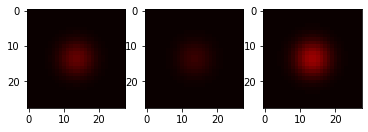

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6465556025505066, dimming (predicted): 0.6743447184562683


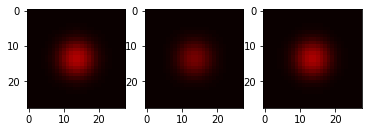

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9768422842025757, dimming (predicted): 0.886277437210083


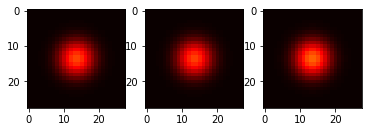

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8165243864059448, dimming (predicted): 0.8073635101318359


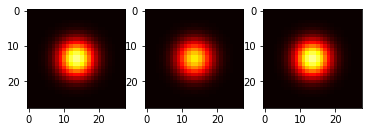

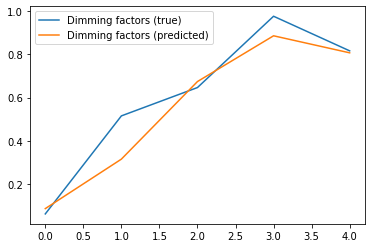

Current loss: 0.012398498132824898
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6059891581535339, dimming (predicted): 0.70906001329422


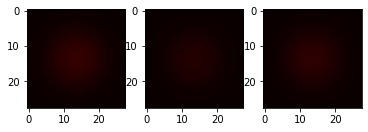

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.08454364538192749, dimming (predicted): 0.05566171184182167


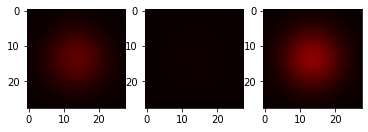

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9393139481544495, dimming (predicted): 0.9163030982017517


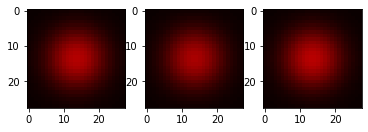

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.06689167022705078, dimming (predicted): 0.07565484941005707


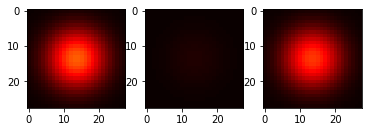

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4928179383277893, dimming (predicted): 0.5798774361610413


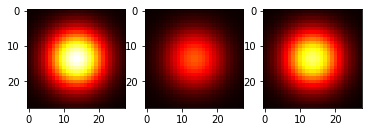

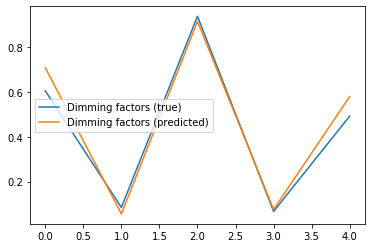

Current loss: 0.06224246695637703
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9218064546585083, dimming (predicted): 0.6901270747184753


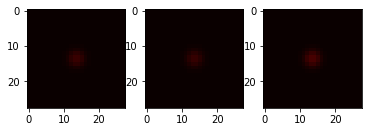

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7294758558273315, dimming (predicted): 0.4780210554599762


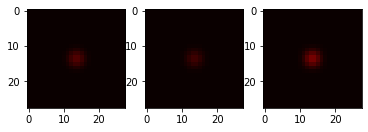

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.10906678438186646, dimming (predicted): 0.25532475113868713


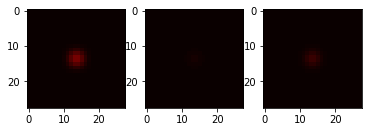

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3346986174583435, dimming (predicted): 0.30160605907440186


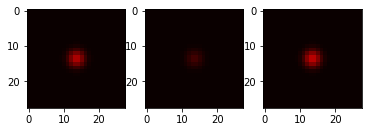

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8532690405845642, dimming (predicted): 0.6114802956581116


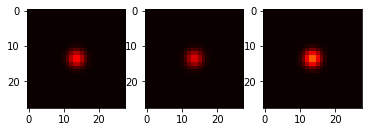

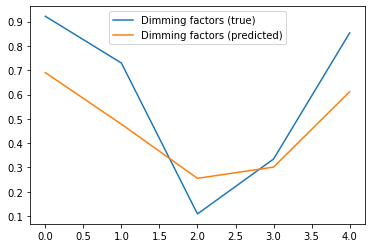

Current loss: 0.02987891435623169
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3478502035140991, dimming (predicted): 0.5832411646842957


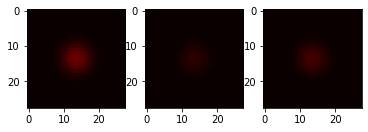

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.13378459215164185, dimming (predicted): 0.27894914150238037


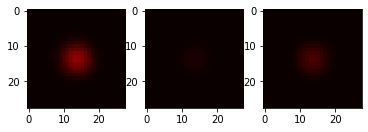

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9467607736587524, dimming (predicted): 0.7787557244300842


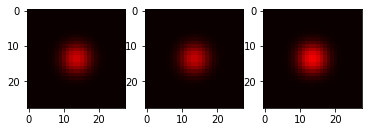

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.46705830097198486, dimming (predicted): 0.3257294297218323


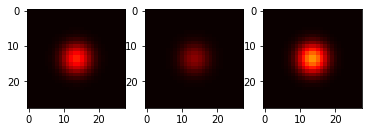

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.23206287622451782, dimming (predicted): 0.17390187084674835


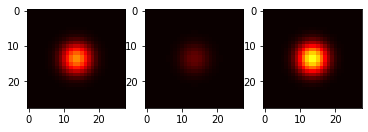

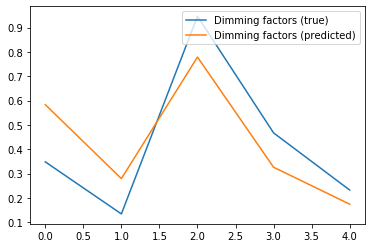

Current loss: 0.018159013241529465
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.38668590784072876, dimming (predicted): 0.35101965069770813


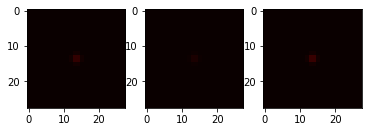

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.942912220954895, dimming (predicted): 0.7330491542816162


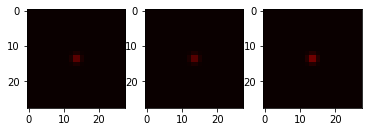

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7584022879600525, dimming (predicted): 0.8211535215377808


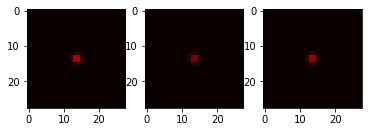

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6028040051460266, dimming (predicted): 0.6956983208656311


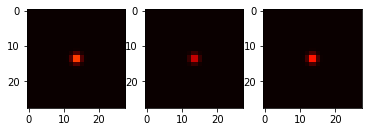

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6573798656463623, dimming (predicted): 0.7520537376403809


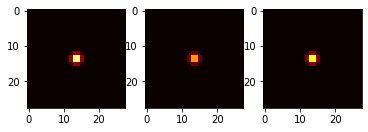

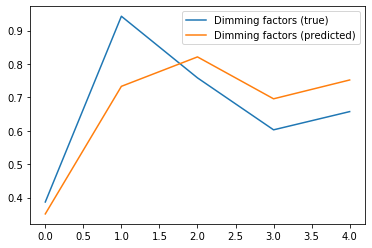

Current loss: 0.030163157731294632
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.552731454372406, dimming (predicted): 0.4263290762901306


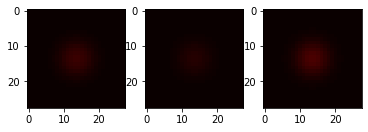

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8625402450561523, dimming (predicted): 0.7772297263145447


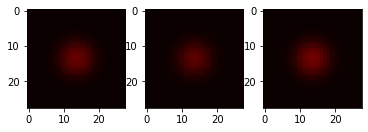

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5751634240150452, dimming (predicted): 0.3830789625644684


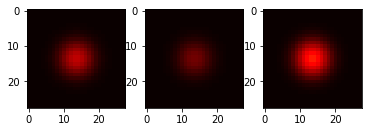

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3817208409309387, dimming (predicted): 0.0838232934474945


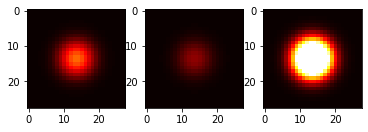

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9825103282928467, dimming (predicted): 0.7501108646392822


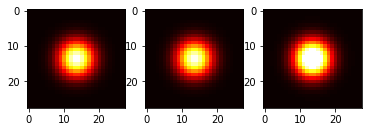

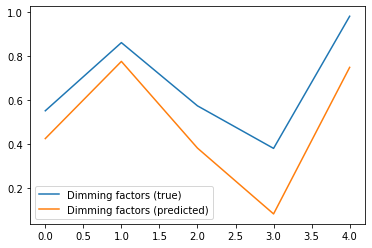

Current loss: 0.013232653960585594
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8444501161575317, dimming (predicted): 0.7991036176681519


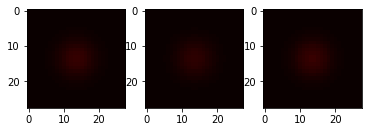

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.49419528245925903, dimming (predicted): 0.5637310743331909


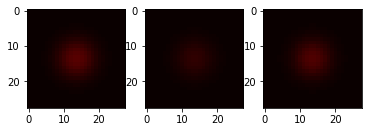

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.40372151136398315, dimming (predicted): 0.3979710340499878


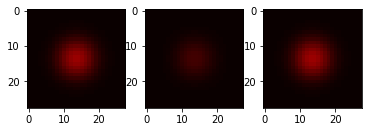

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8069426417350769, dimming (predicted): 0.8327590823173523


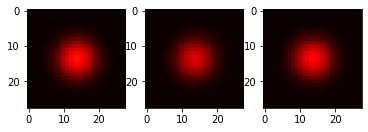

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4802098274230957, dimming (predicted): 0.4910789132118225


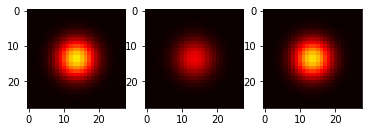

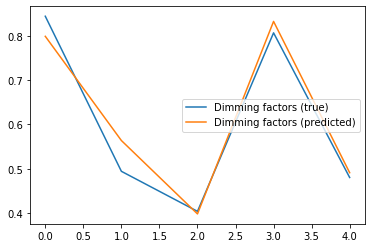

Current loss: 0.012608478777110577
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4584909677505493, dimming (predicted): 0.4491257965564728


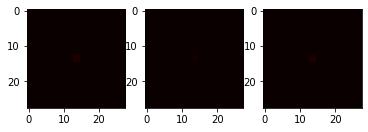

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6432319283485413, dimming (predicted): 0.5209646224975586


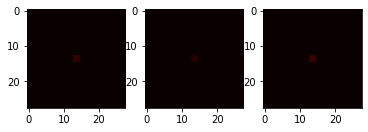

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.010697007179260254, dimming (predicted): 0.15457478165626526


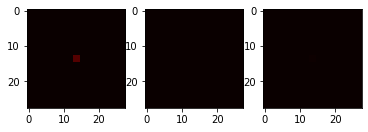

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2676898241043091, dimming (predicted): 0.30091986060142517


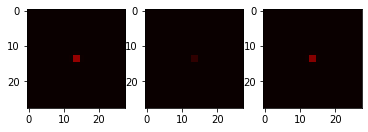

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5051945447921753, dimming (predicted): 0.6377046704292297


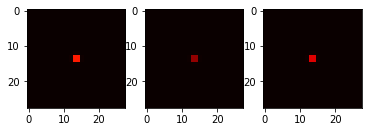

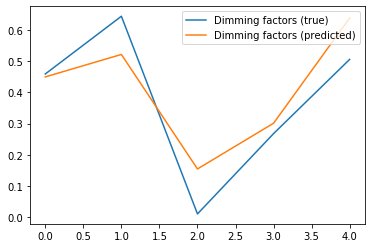

Current loss: 0.030080337077379227
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8068922162055969, dimming (predicted): 0.5343999266624451


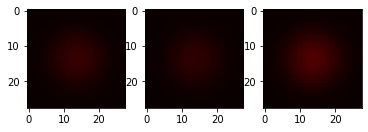

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.05684548616409302, dimming (predicted): 0.03920502960681915


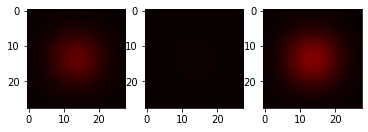

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.719571590423584, dimming (predicted): 0.6471010446548462


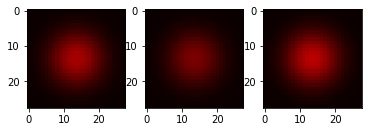

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8059674501419067, dimming (predicted): 0.6590653657913208


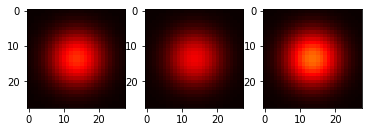

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9774073362350464, dimming (predicted): 0.7682440280914307


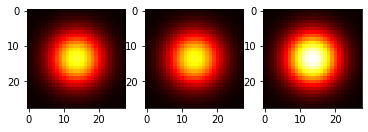

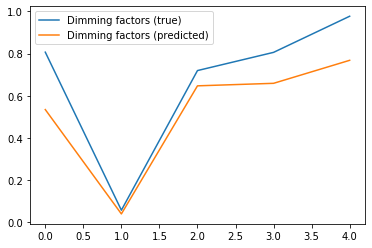

Current loss: 0.03759551793336868
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8898627161979675, dimming (predicted): 0.9190676212310791


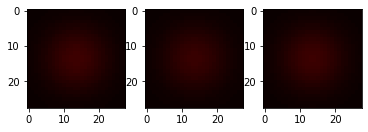

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.374610960483551, dimming (predicted): 0.3012132942676544


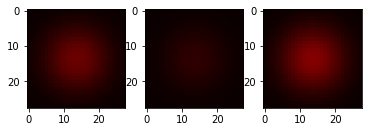

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4385002851486206, dimming (predicted): 0.3515121340751648


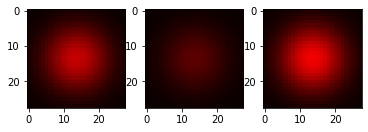

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.12898200750350952, dimming (predicted): 0.18497605621814728


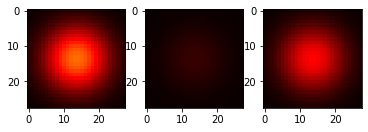

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.621981143951416, dimming (predicted): 0.889948844909668


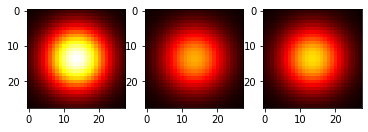

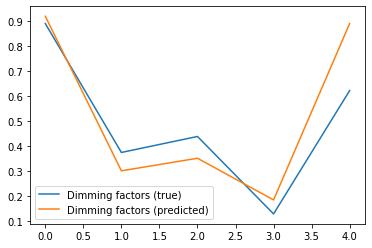

Current loss: 0.015610028989613056
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.87721186876297, dimming (predicted): 0.9057759046554565


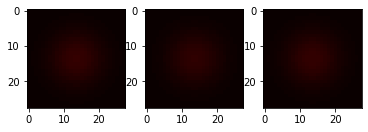

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.20636993646621704, dimming (predicted): 0.1505649834871292


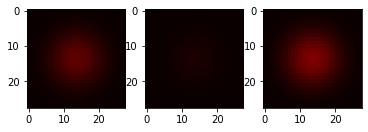

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9823293089866638, dimming (predicted): 0.8917463421821594


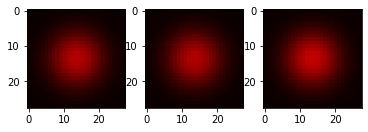

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5705885887145996, dimming (predicted): 0.708548367023468


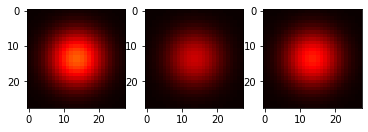

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5721835494041443, dimming (predicted): 0.6198253035545349


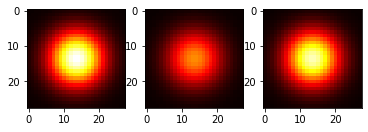

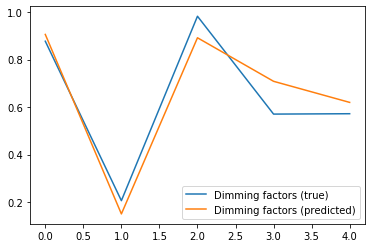

Current loss: 0.007940439507365227
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8557162880897522, dimming (predicted): 0.8068116307258606


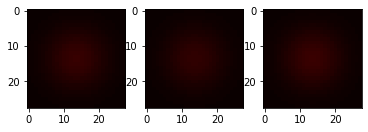

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.492012083530426, dimming (predicted): 0.3266093134880066


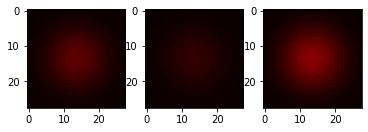

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9208617210388184, dimming (predicted): 0.8823025822639465


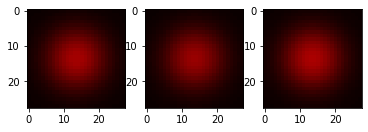

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5664793848991394, dimming (predicted): 0.4985077977180481


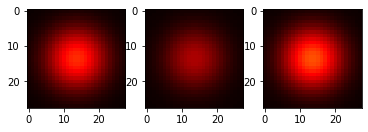

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.08857929706573486, dimming (predicted): 0.0550888366997242


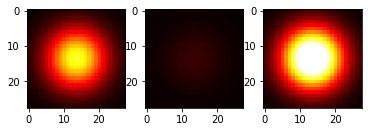

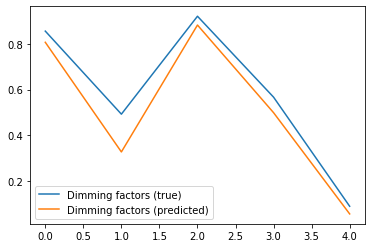

Current loss: 0.01677568443119526
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9008578062057495, dimming (predicted): 0.8198174834251404


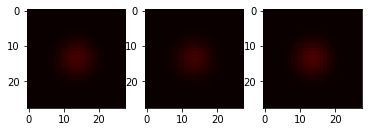

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.44396185874938965, dimming (predicted): 0.432130366563797


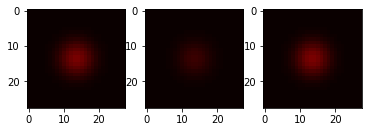

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9783700108528137, dimming (predicted): 0.8561334013938904


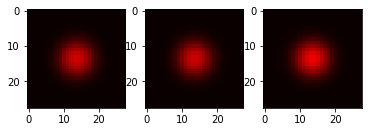

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.40541380643844604, dimming (predicted): 0.4185786843299866


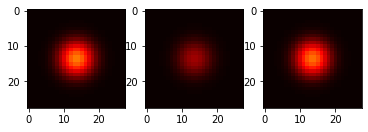

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.68733811378479, dimming (predicted): 0.8101874589920044


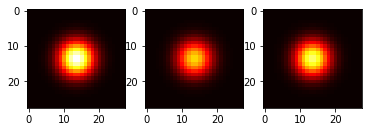

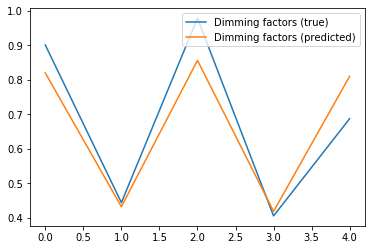

Current loss: 0.01638706587255001
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.06335622072219849, dimming (predicted): 0.3458942472934723


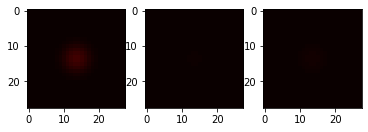

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.12110161781311035, dimming (predicted): 0.21302007138729095


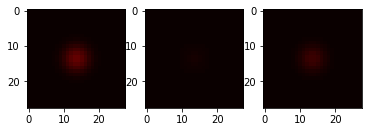

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.27247291803359985, dimming (predicted): 0.5187444686889648


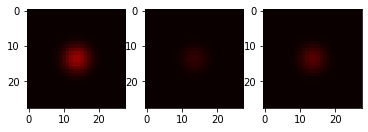

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.13981640338897705, dimming (predicted): 0.2533762753009796


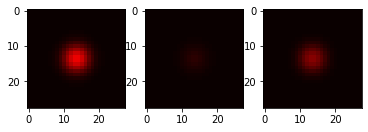

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9322774410247803, dimming (predicted): 0.8137306571006775


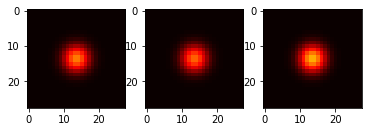

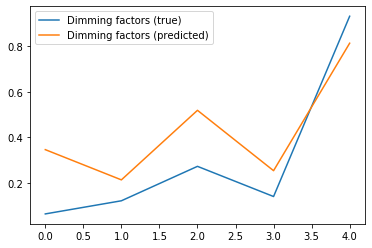

Current loss: 0.031887445598840714
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.025913596153259277, dimming (predicted): 0.1755744367837906


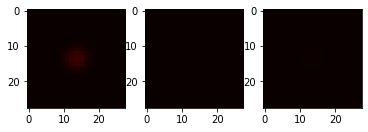

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.08033955097198486, dimming (predicted): 0.2263467013835907


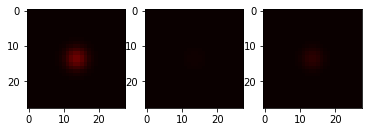

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5837690830230713, dimming (predicted): 0.7680436372756958


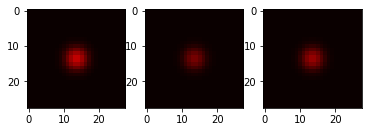

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.15622490644454956, dimming (predicted): 0.3030380606651306


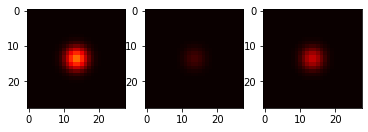

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2811679244041443, dimming (predicted): 0.6429237723350525


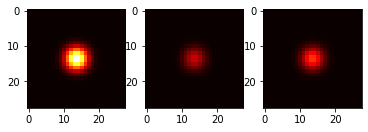

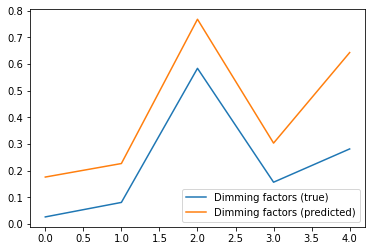

Current loss: 0.037026889622211456
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9397169351577759, dimming (predicted): 0.37984076142311096


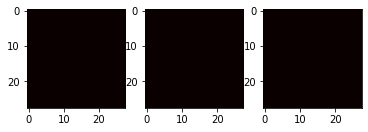

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5266619324684143, dimming (predicted): 0.3086387813091278


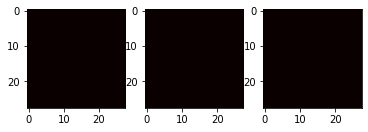

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5198817253112793, dimming (predicted): 0.4762333631515503


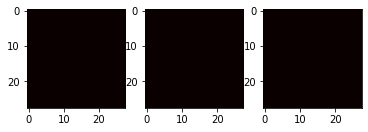

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3469342589378357, dimming (predicted): 0.47185176610946655


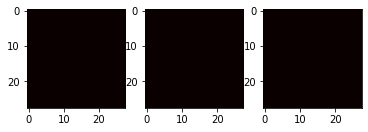

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.19004499912261963, dimming (predicted): 0.46548694372177124


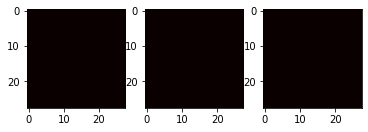

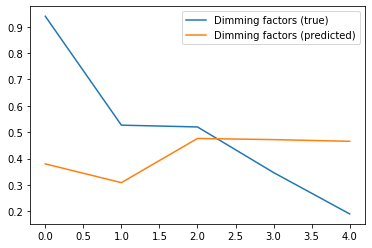

Current loss: 0.021877048537135124
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.612236738204956, dimming (predicted): 0.49227747321128845


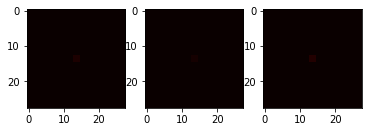

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.641228199005127, dimming (predicted): 0.46528735756874084


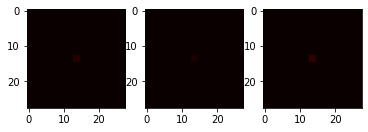

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.665530800819397, dimming (predicted): 0.4518616795539856


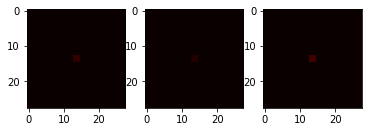

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.1354803442955017, dimming (predicted): 0.28277257084846497


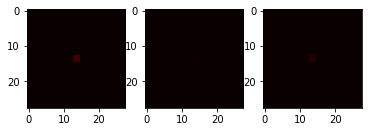

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8730131387710571, dimming (predicted): 0.3820078670978546


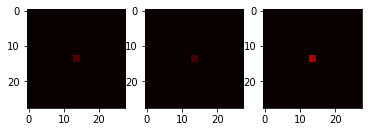

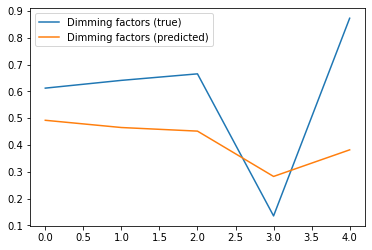

Current loss: 0.014702844433486462
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9244831800460815, dimming (predicted): 0.8199961185455322


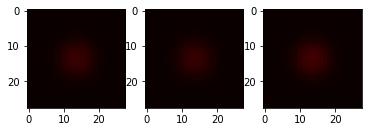

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6265544891357422, dimming (predicted): 0.48615002632141113


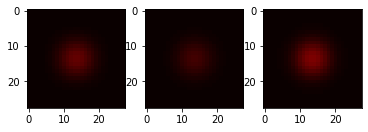

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.024131953716278076, dimming (predicted): 0.11229878664016724


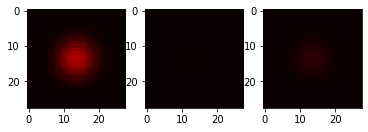

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.867158055305481, dimming (predicted): 0.8043084144592285


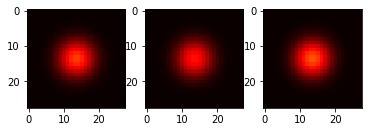

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9347610473632812, dimming (predicted): 0.8470197916030884


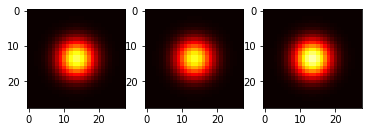

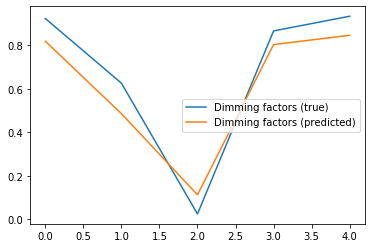

Current loss: 0.02329072915017605
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3040717840194702, dimming (predicted): 0.16364040970802307


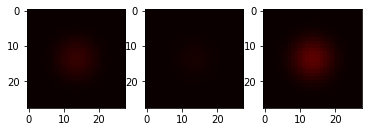

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.354966402053833, dimming (predicted): 0.32373762130737305


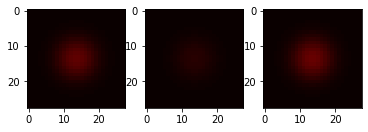

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9627395868301392, dimming (predicted): 0.9136515855789185


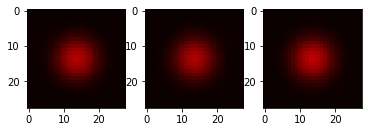

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.003984928131103516, dimming (predicted): 0.01738230139017105


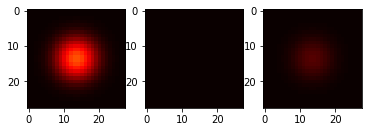

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6948604583740234, dimming (predicted): 0.7074275612831116


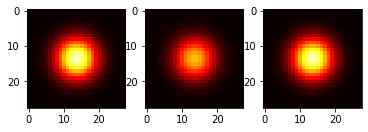

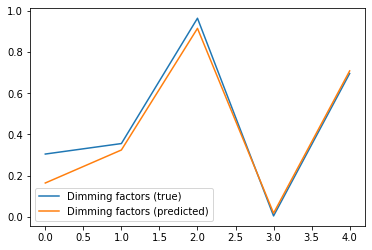

Current loss: 0.013946512714028358
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.18810009956359863, dimming (predicted): 0.2344323843717575


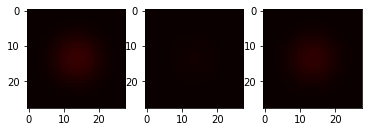

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5934008359909058, dimming (predicted): 0.7829009890556335


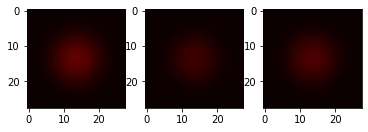

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5061704516410828, dimming (predicted): 0.6485016942024231


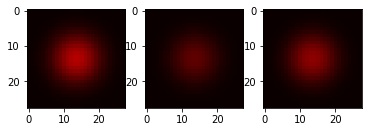

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.280423104763031, dimming (predicted): 0.4433120787143707


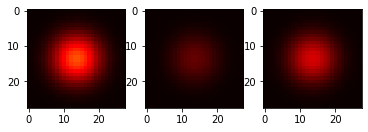

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.458493173122406, dimming (predicted): 0.7031835317611694


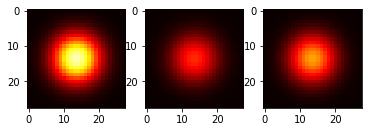

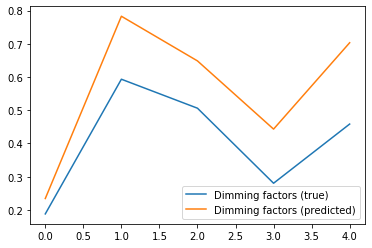

Current loss: 0.017774855718016624
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5977543592453003, dimming (predicted): 0.5804352760314941


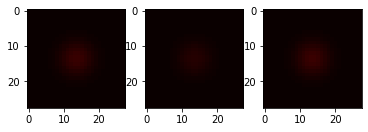

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.021161377429962158, dimming (predicted): 0.06492014229297638


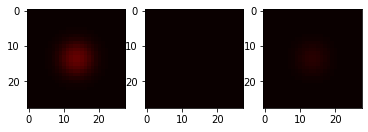

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4552237391471863, dimming (predicted): 0.3408818244934082


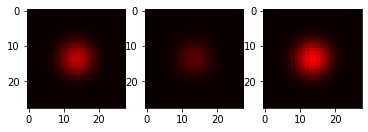

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8845247626304626, dimming (predicted): 0.8129737377166748


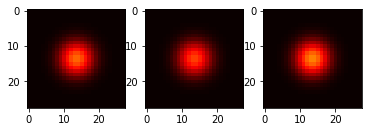

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5959627628326416, dimming (predicted): 0.6080151796340942


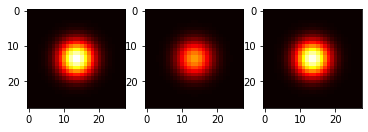

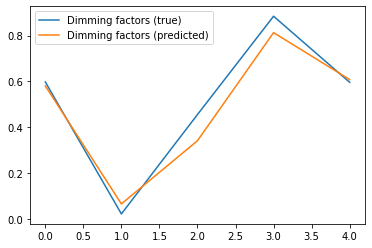

Current loss: 0.011235274374485016
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5968031287193298, dimming (predicted): 0.7562126517295837


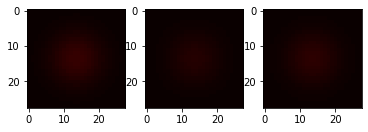

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4481852054595947, dimming (predicted): 0.44765180349349976


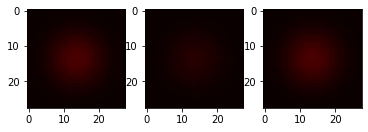

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6044930219650269, dimming (predicted): 0.6500445604324341


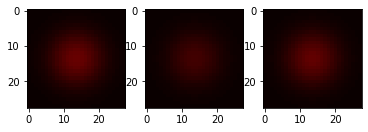

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.040502965450286865, dimming (predicted): 0.1908857375383377


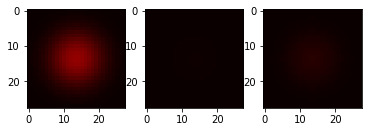

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2481434941291809, dimming (predicted): 0.42302730679512024


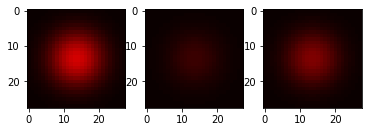

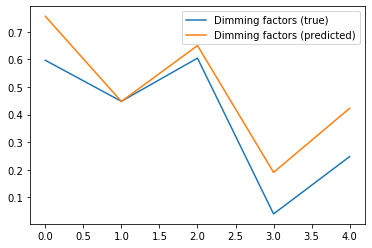

Current loss: 0.03757181018590927
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.11293262243270874, dimming (predicted): 0.5081291198730469


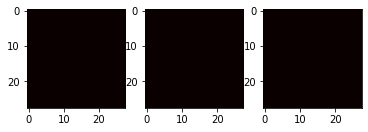

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7551594972610474, dimming (predicted): 0.5237759351730347


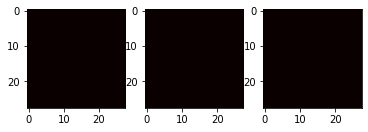

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6654812693595886, dimming (predicted): 0.4858144223690033


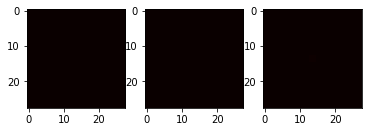

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.13846832513809204, dimming (predicted): 0.3745737671852112


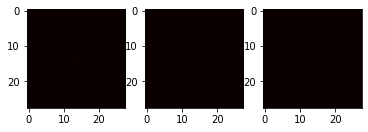

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8527112603187561, dimming (predicted): 0.4088837802410126


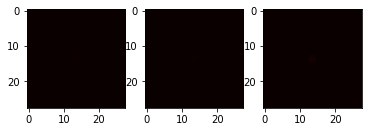

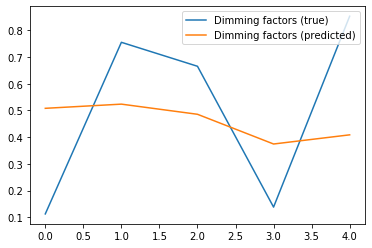

Current loss: 0.005111367907375097
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.45458853244781494, dimming (predicted): 0.31642621755599976


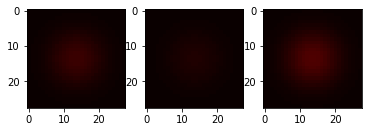

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.058405160903930664, dimming (predicted): 0.08619549125432968


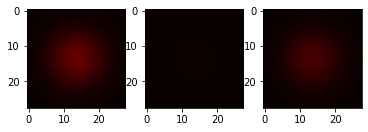

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9575690031051636, dimming (predicted): 0.9262953996658325


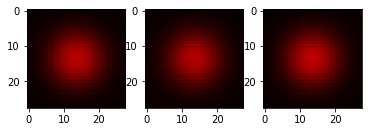

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3904916048049927, dimming (predicted): 0.35140183568000793


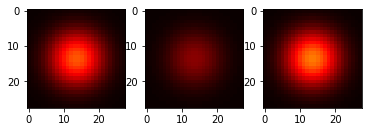

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2350638508796692, dimming (predicted): 0.17489401996135712


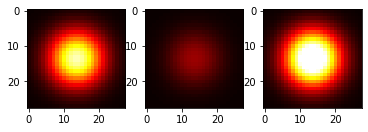

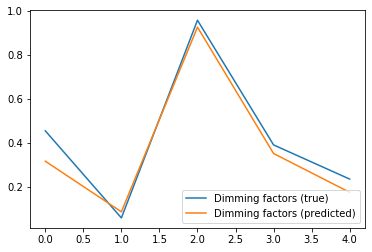

Current loss: 0.019109589979052544
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.517363965511322, dimming (predicted): 0.6196300983428955


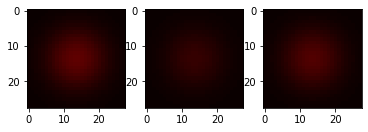

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5510819554328918, dimming (predicted): 0.5291982293128967


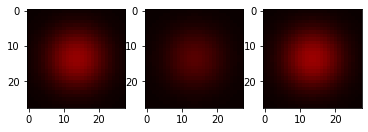

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9275396466255188, dimming (predicted): 0.8043085336685181


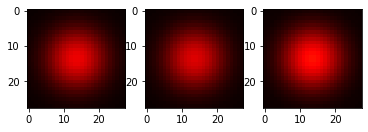

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.696067214012146, dimming (predicted): 0.6324613690376282


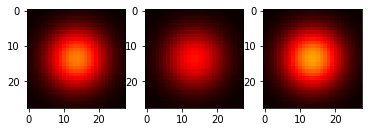

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4249560236930847, dimming (predicted): 0.4563354253768921


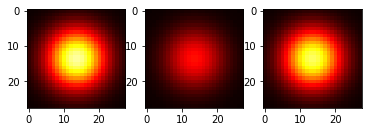

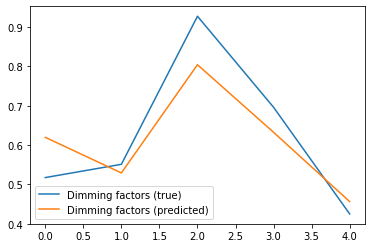

Current loss: 0.01715564914047718
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4892421364784241, dimming (predicted): 0.5498220920562744


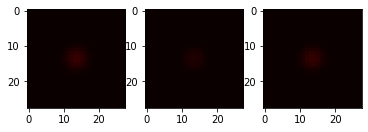

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5161539316177368, dimming (predicted): 0.6553062200546265


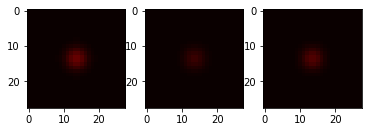

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.21087121963500977, dimming (predicted): 0.29446205496788025


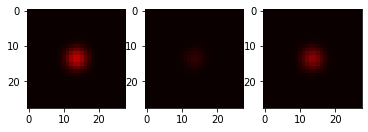

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3690217137336731, dimming (predicted): 0.6218369603157043


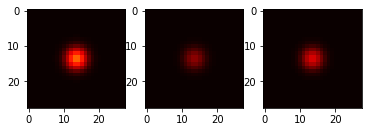

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.017358720302581787, dimming (predicted): 0.10110119730234146


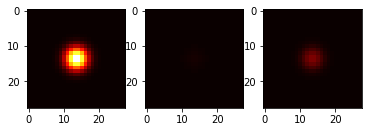

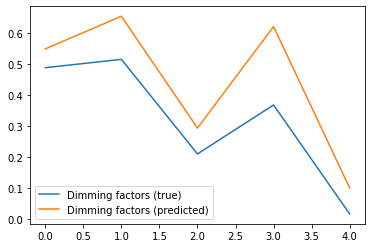

Current loss: 0.013578170910477638
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3002917766571045, dimming (predicted): 0.2600889801979065


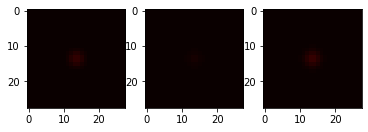

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9326866865158081, dimming (predicted): 0.8058062791824341


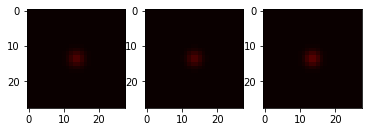

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8124807476997375, dimming (predicted): 0.7564724087715149


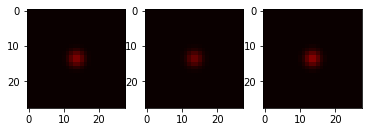

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.15076994895935059, dimming (predicted): 0.10163859277963638


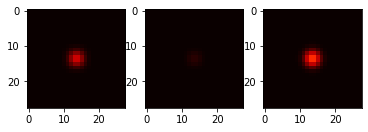

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6216832995414734, dimming (predicted): 0.5827136635780334


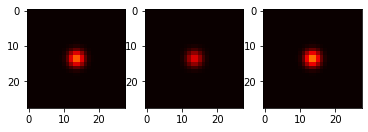

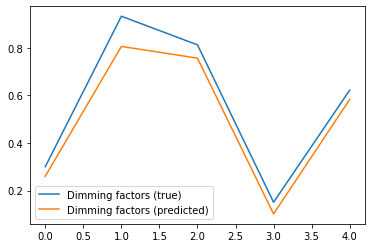

Current loss: 0.03749953955411911
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5773929357528687, dimming (predicted): 0.7319607734680176


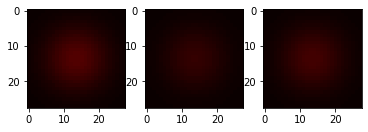

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.15148049592971802, dimming (predicted): 0.1656217724084854


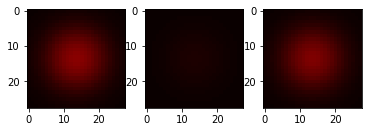

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.06385552883148193, dimming (predicted): 0.07303924113512039


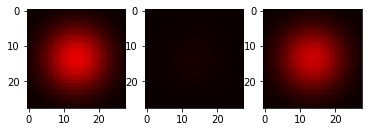

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.48951786756515503, dimming (predicted): 0.44081008434295654


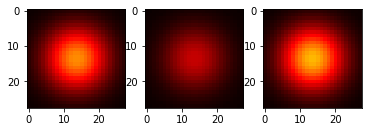

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.939651608467102, dimming (predicted): 0.7764884233474731


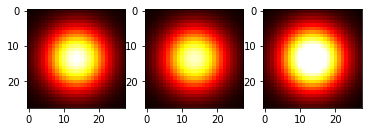

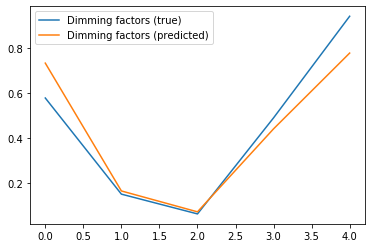

Current loss: 0.004915604367852211
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9105190634727478, dimming (predicted): 0.8132440447807312


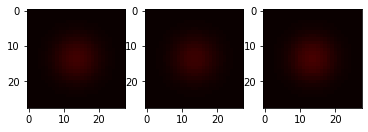

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8910665512084961, dimming (predicted): 0.8692607879638672


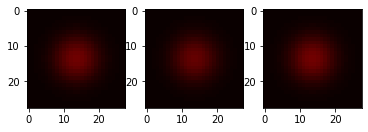

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6661167144775391, dimming (predicted): 0.7686143517494202


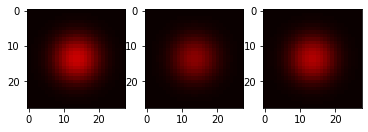

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5151563882827759, dimming (predicted): 0.632840096950531


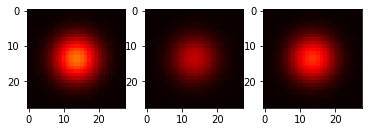

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.19708877801895142, dimming (predicted): 0.19379006326198578


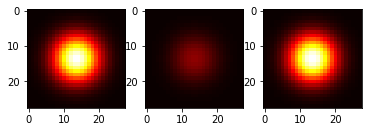

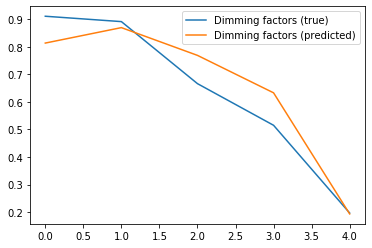

Current loss: 0.0177177581936121
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.0216405987739563, dimming (predicted): 0.39455509185791016


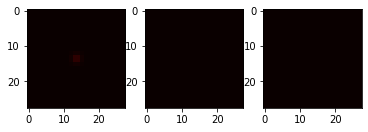

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.06441038846969604, dimming (predicted): 0.1850900650024414


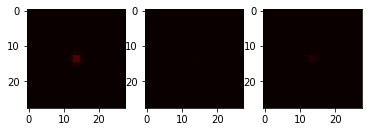

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.594571590423584, dimming (predicted): 0.6281157732009888


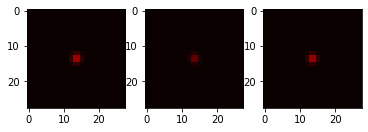

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.09545701742172241, dimming (predicted): 0.12589974701404572


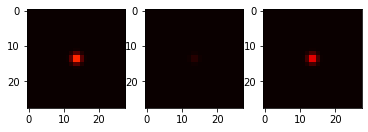

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9620152711868286, dimming (predicted): 0.9626527428627014


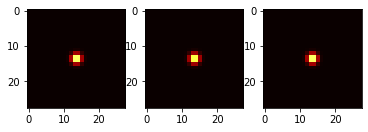

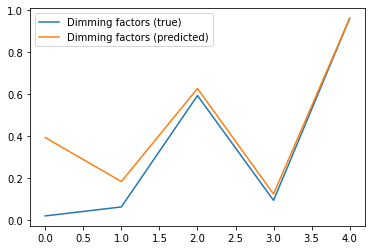

Current loss: 0.012230758555233479
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9720359444618225, dimming (predicted): 0.837670624256134


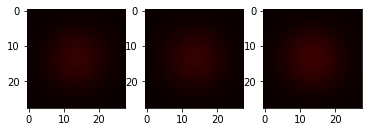

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2813912630081177, dimming (predicted): 0.3456510305404663


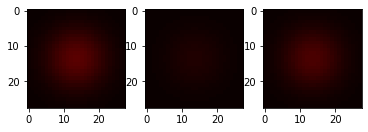

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5632711052894592, dimming (predicted): 0.5713981986045837


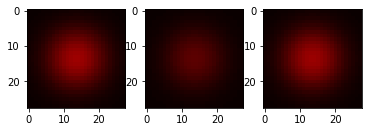

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9652011394500732, dimming (predicted): 0.8364522457122803


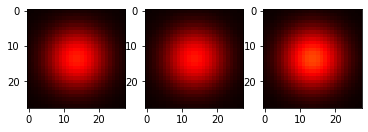

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7332574129104614, dimming (predicted): 0.7215677499771118


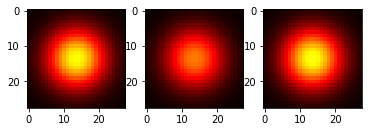

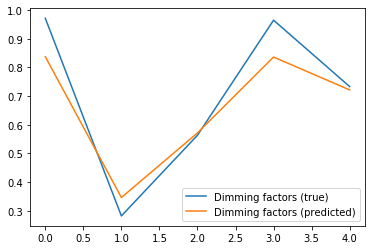

Current loss: 0.012459026649594307
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6973356604576111, dimming (predicted): 0.6310856938362122


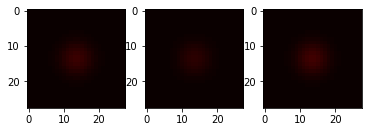

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7200298309326172, dimming (predicted): 0.7163060903549194


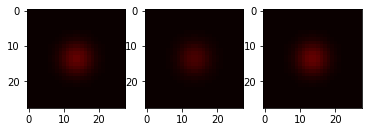

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.46592962741851807, dimming (predicted): 0.4085114598274231


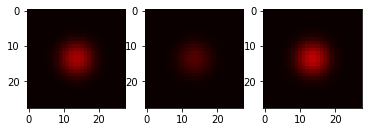

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8123223781585693, dimming (predicted): 0.746074378490448


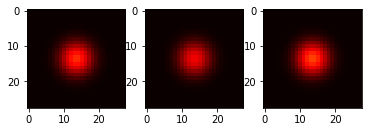

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.21894115209579468, dimming (predicted): 0.1471724510192871


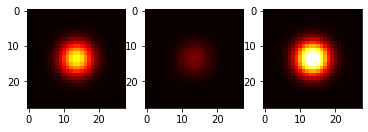

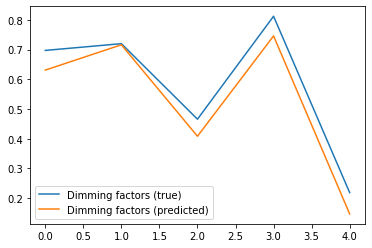

Current loss: 0.010112670250236988
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3247271180152893, dimming (predicted): 0.4932531416416168


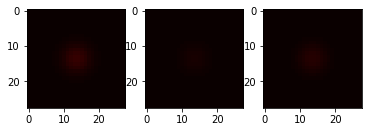

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4089892506599426, dimming (predicted): 0.5084987878799438


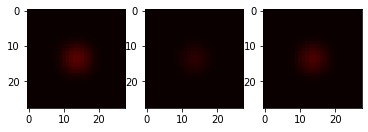

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4555395245552063, dimming (predicted): 0.5531812906265259


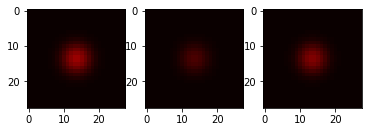

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.29345273971557617, dimming (predicted): 0.3828205168247223


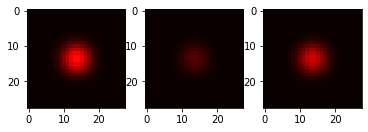

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6708284020423889, dimming (predicted): 0.7520159482955933


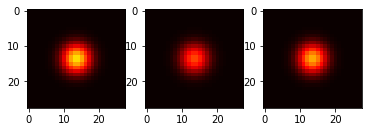

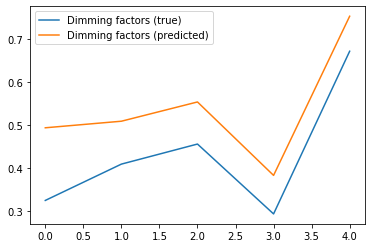

Current loss: 0.043296996504068375
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6592766046524048, dimming (predicted): 0.7547314167022705


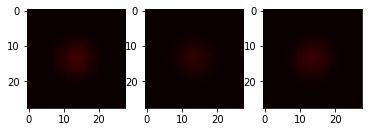

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.14432084560394287, dimming (predicted): 0.22035087645053864


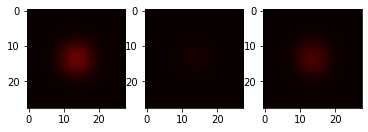

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3310140371322632, dimming (predicted): 0.5204393267631531


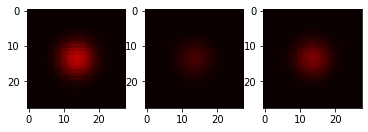

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.27167952060699463, dimming (predicted): 0.5707162022590637


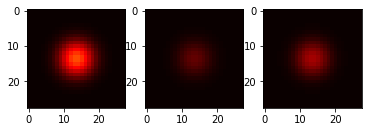

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.12925058603286743, dimming (predicted): 0.4359445869922638


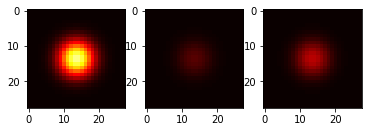

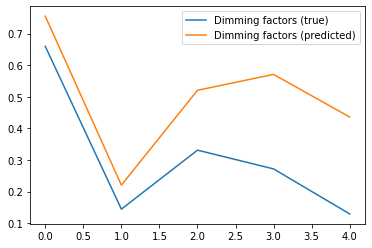

Current loss: 0.02077571302652359
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2901325821876526, dimming (predicted): 0.33320364356040955


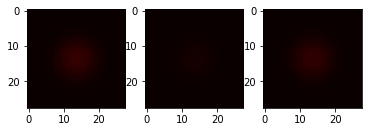

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6835882663726807, dimming (predicted): 0.6556761860847473


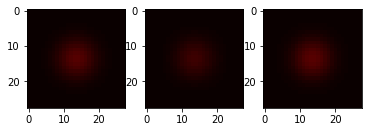

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8215128779411316, dimming (predicted): 0.7020702362060547


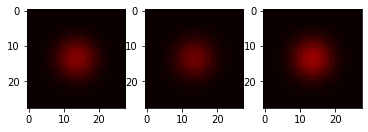

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9536327719688416, dimming (predicted): 0.7311186194419861


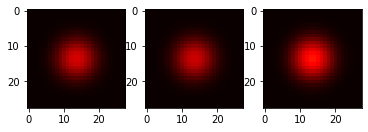

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.37229567766189575, dimming (predicted): 0.2332092821598053


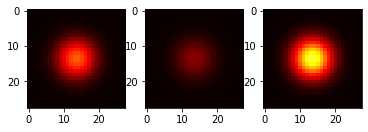

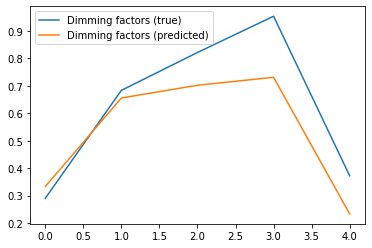

Current loss: 0.01684349589049816
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5128774642944336, dimming (predicted): 0.5226667523384094


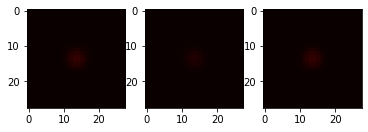

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3396828770637512, dimming (predicted): 0.40841013193130493


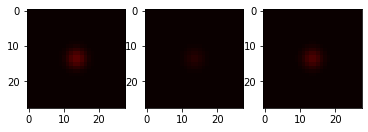

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8349867463111877, dimming (predicted): 0.8310630321502686


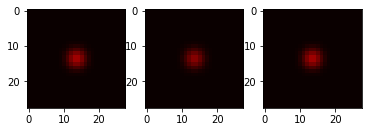

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7757449150085449, dimming (predicted): 0.788885772228241


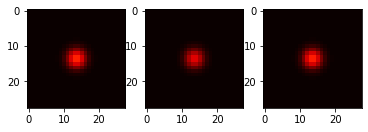

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8067819476127625, dimming (predicted): 0.7547684907913208


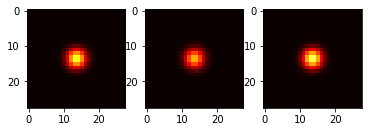

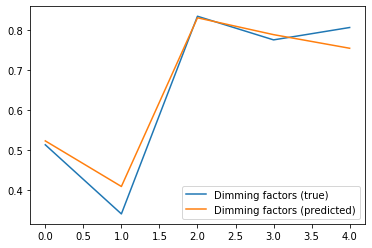

Current loss: 0.013974100351333618
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.21556764841079712, dimming (predicted): 0.13327522575855255


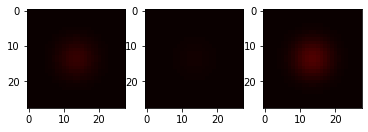

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9446563720703125, dimming (predicted): 0.6996434926986694


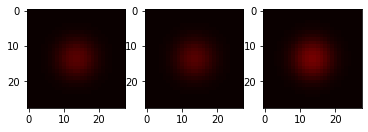

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9871082901954651, dimming (predicted): 0.864478588104248


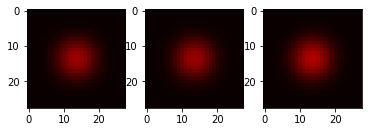

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7304189205169678, dimming (predicted): 0.6274245381355286


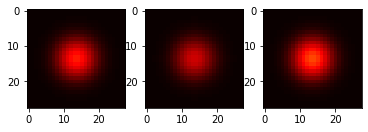

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.22797632217407227, dimming (predicted): 0.16420704126358032


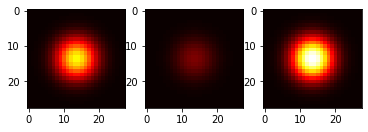

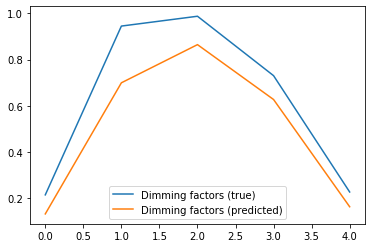

Current loss: 0.009262463077902794
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.20251315832138062, dimming (predicted): 0.11787892878055573


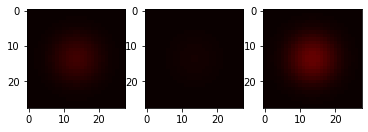

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.004336237907409668, dimming (predicted): 0.05344994366168976


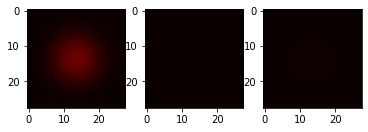

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.35681742429733276, dimming (predicted): 0.3132031559944153


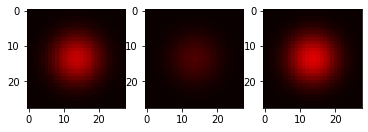

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9213815331459045, dimming (predicted): 0.9502894878387451


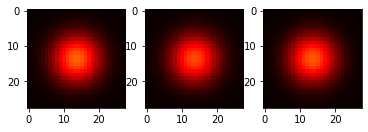

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.15146607160568237, dimming (predicted): 0.12470566481351852


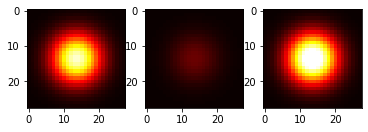

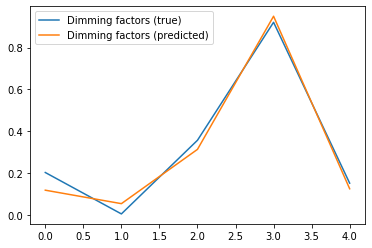

Current loss: 0.012031358666718006
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6545813679695129, dimming (predicted): 0.5533676147460938


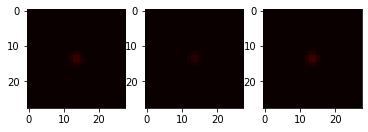

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6485738754272461, dimming (predicted): 0.5522706508636475


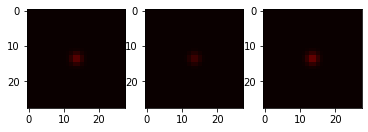

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3319229483604431, dimming (predicted): 0.13467614352703094


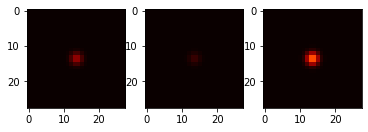

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.960873007774353, dimming (predicted): 0.7900357842445374


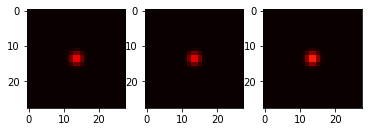

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9773607850074768, dimming (predicted): 0.8283032178878784


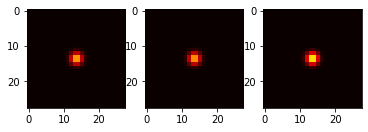

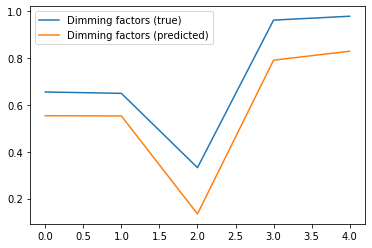

Current loss: 0.006685162894427776
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.48977118730545044, dimming (predicted): 0.664116382598877


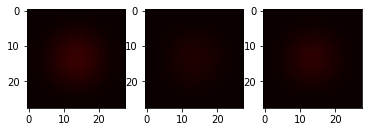

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.34268391132354736, dimming (predicted): 0.4268539845943451


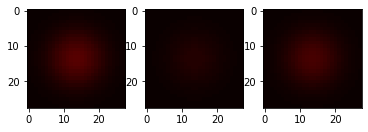

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4111260175704956, dimming (predicted): 0.5449563264846802


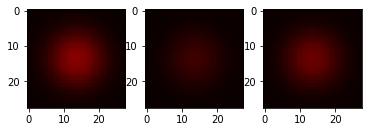

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.26101160049438477, dimming (predicted): 0.38003140687942505


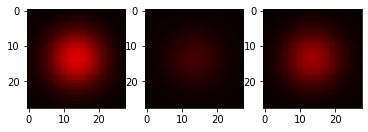

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.556191086769104, dimming (predicted): 0.6132983565330505


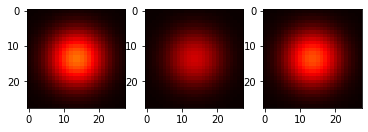

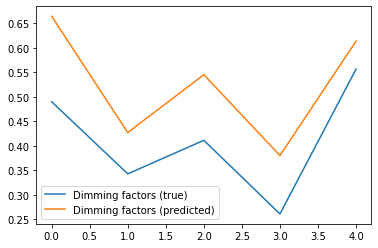

Current loss: 0.008760327473282814
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4317203164100647, dimming (predicted): 0.4382396936416626


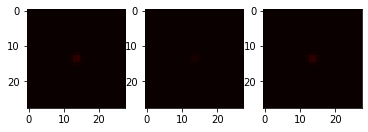

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9713062047958374, dimming (predicted): 0.9161364436149597


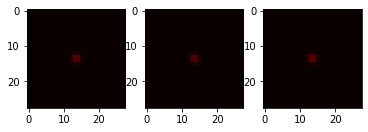

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3570265769958496, dimming (predicted): 0.3535585403442383


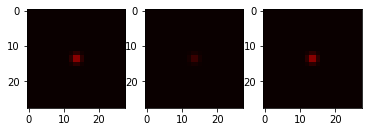

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4546507000923157, dimming (predicted): 0.4518693685531616


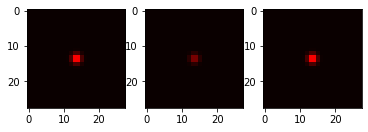

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5452225208282471, dimming (predicted): 0.6830388307571411


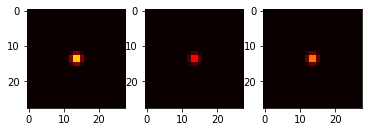

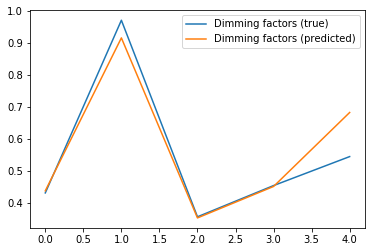

Current loss: 0.03415224701166153
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3218790888786316, dimming (predicted): 0.38343778252601624


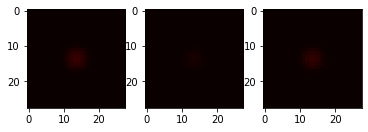

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.1692425012588501, dimming (predicted): 0.27696776390075684


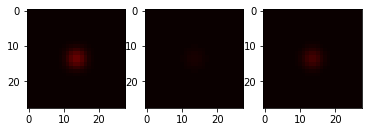

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.11620557308197021, dimming (predicted): 0.2184288054704666


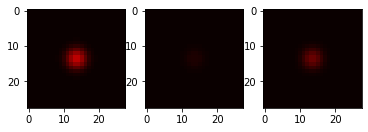

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.006099343299865723, dimming (predicted): 0.13333778083324432


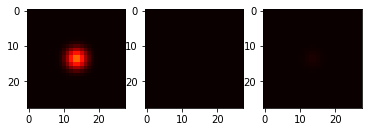

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4756256937980652, dimming (predicted): 0.7315452694892883


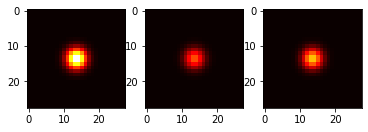

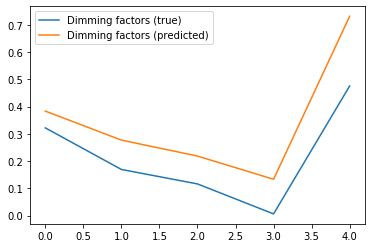

Current loss: 0.007622821722179651
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.42068976163864136, dimming (predicted): 0.520519495010376


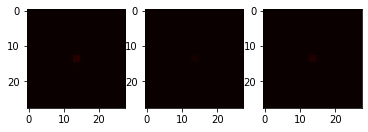

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.02151811122894287, dimming (predicted): 0.1474207192659378


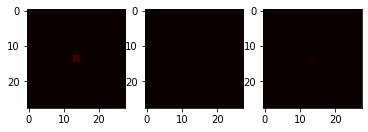

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.23303407430648804, dimming (predicted): 0.24283598363399506


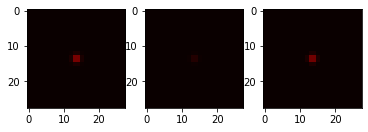

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.18282318115234375, dimming (predicted): 0.1813623458147049


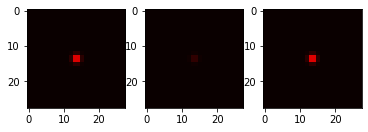

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7685507535934448, dimming (predicted): 0.9155924916267395


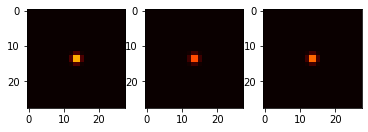

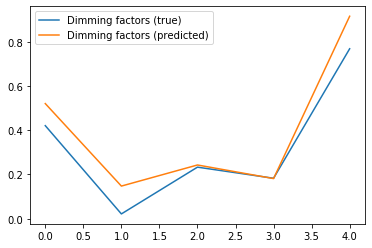

Current loss: 0.020266395062208176
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.1673927903175354, dimming (predicted): 0.21557225286960602


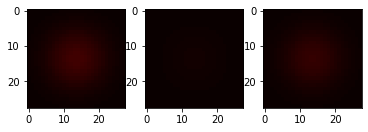

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5907884836196899, dimming (predicted): 0.6748310923576355


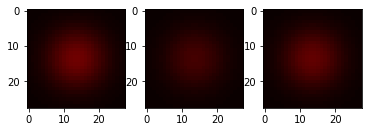

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.38296419382095337, dimming (predicted): 0.3125850558280945


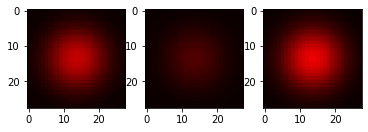

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8197112679481506, dimming (predicted): 0.7969745397567749


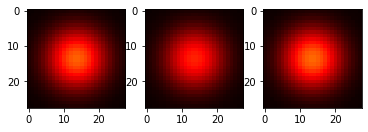

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.10406631231307983, dimming (predicted): 0.08847958594560623


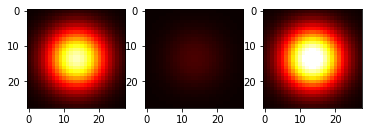

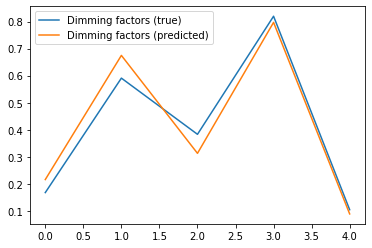

Current loss: 0.009850521571934223
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3616994619369507, dimming (predicted): 0.21080084145069122


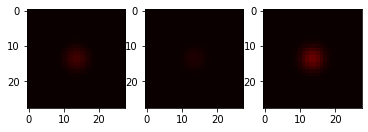

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9396094679832458, dimming (predicted): 0.8796817064285278


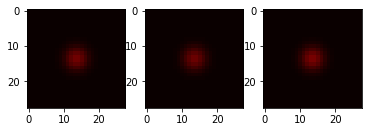

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.18044304847717285, dimming (predicted): 0.07779061049222946


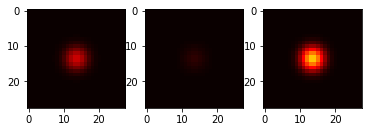

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.03914457559585571, dimming (predicted): 0.03508507460355759


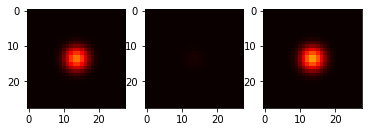

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8149828314781189, dimming (predicted): 0.7159092426300049


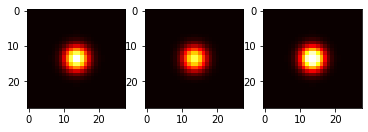

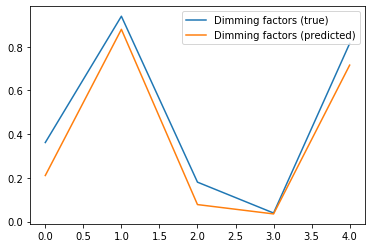

Current loss: 0.00634677242487669
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.44293761253356934, dimming (predicted): 0.3433424234390259


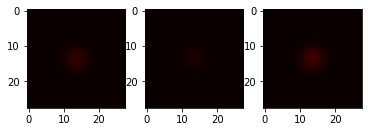

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8752278685569763, dimming (predicted): 0.8681726455688477


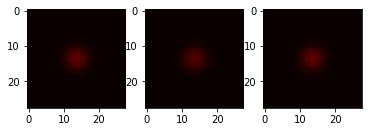

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7037973403930664, dimming (predicted): 0.7557234764099121


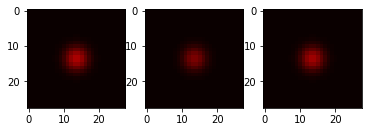

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.25468307733535767, dimming (predicted): 0.3070172667503357


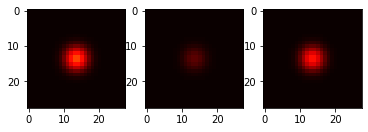

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8164446353912354, dimming (predicted): 0.8627194166183472


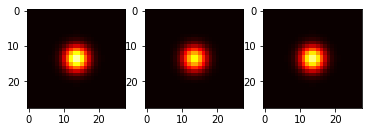

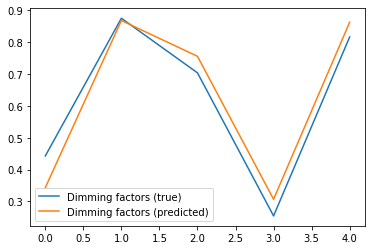

Current loss: 0.010379360057413578
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.35154443979263306, dimming (predicted): 0.3713071942329407


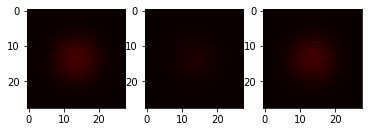

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.07313084602355957, dimming (predicted): 0.07837826758623123


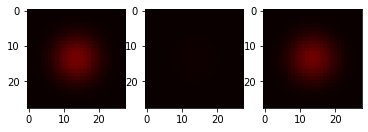

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6465806365013123, dimming (predicted): 0.679479718208313


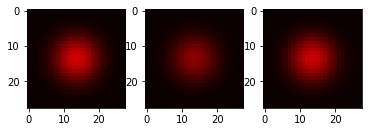

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9234227538108826, dimming (predicted): 0.8244142532348633


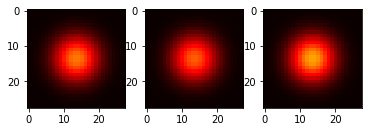

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.1588314175605774, dimming (predicted): 0.13677795231342316


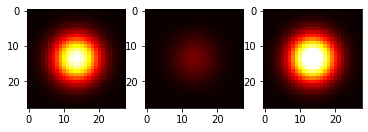

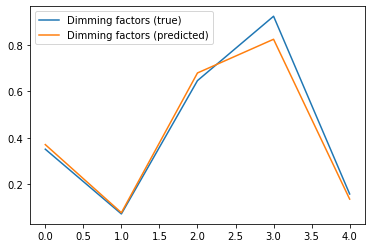

Current loss: 0.019411232322454453
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.29718393087387085, dimming (predicted): 0.16494505107402802


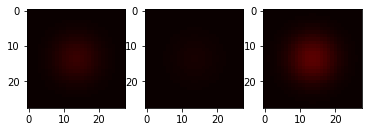

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.42190665006637573, dimming (predicted): 0.5392358303070068


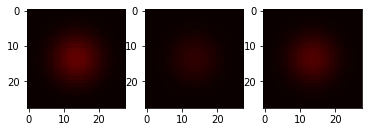

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7355152368545532, dimming (predicted): 0.815207302570343


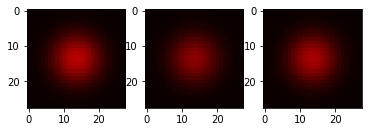

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2751755118370056, dimming (predicted): 0.27019476890563965


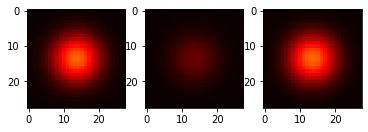

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9298864006996155, dimming (predicted): 0.9299732446670532


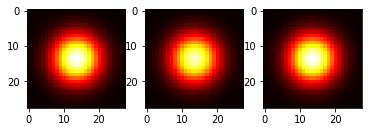

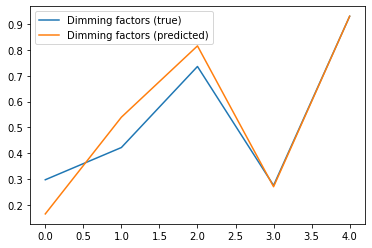

Current loss: 0.0450810045003891
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8078621029853821, dimming (predicted): 0.4211623966693878


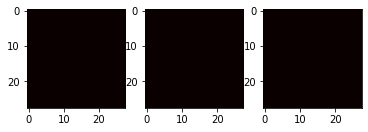

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6671439409255981, dimming (predicted): 0.4005535840988159


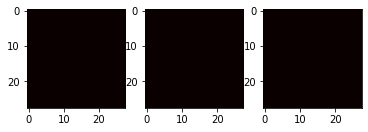

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.11382907629013062, dimming (predicted): 0.47277459502220154


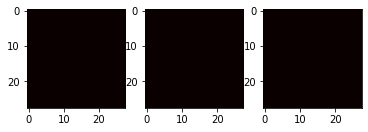

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9921982288360596, dimming (predicted): 0.4040904641151428


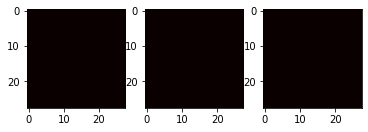

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6905336380004883, dimming (predicted): 0.5224925875663757


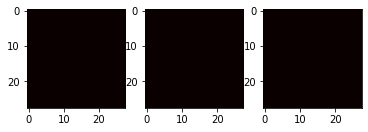

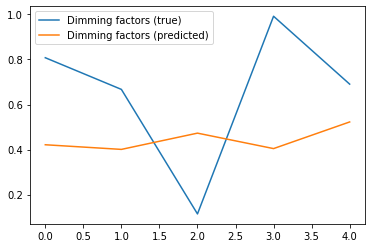

Current loss: 0.00647785235196352
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4302886724472046, dimming (predicted): 0.5531283617019653


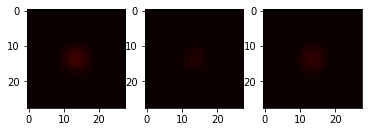

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.11250406503677368, dimming (predicted): 0.13989704847335815


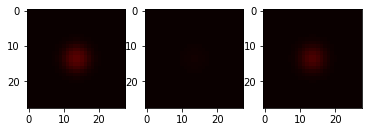

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5824938416481018, dimming (predicted): 0.5532261729240417


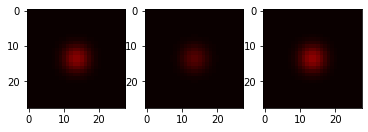

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6888005137443542, dimming (predicted): 0.613884687423706


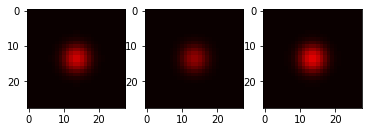

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4523466229438782, dimming (predicted): 0.3903014361858368


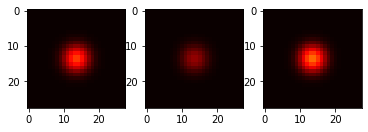

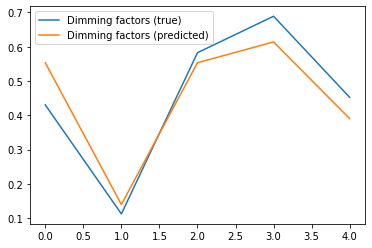

Current loss: 0.0080433813855052
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.10105806589126587, dimming (predicted): 0.059599149972200394


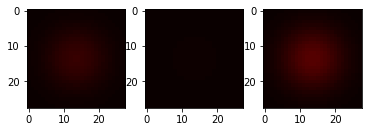

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.23554956912994385, dimming (predicted): 0.3102356791496277


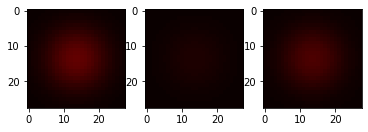

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7159887552261353, dimming (predicted): 0.711463212966919


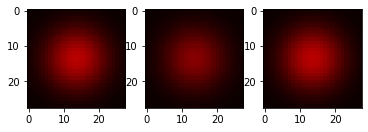

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.45643889904022217, dimming (predicted): 0.4971834123134613


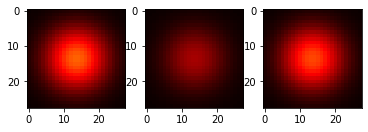

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8500415682792664, dimming (predicted): 0.8887791633605957


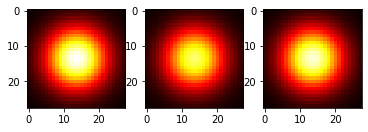

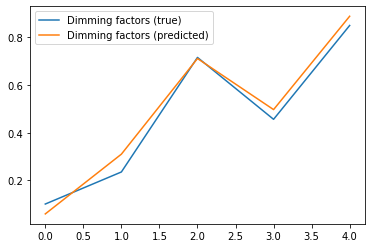

Current loss: 0.008247057907283306
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.68974769115448, dimming (predicted): 0.6532862186431885


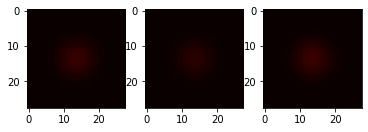

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4778819680213928, dimming (predicted): 0.35291656851768494


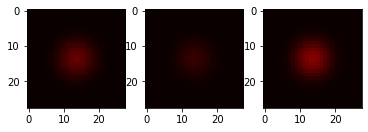

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8034617900848389, dimming (predicted): 0.8176643252372742


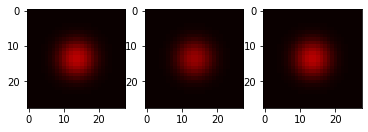

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.693792462348938, dimming (predicted): 0.7050297260284424


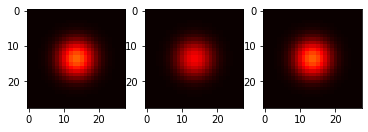

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7444946765899658, dimming (predicted): 0.7744361758232117


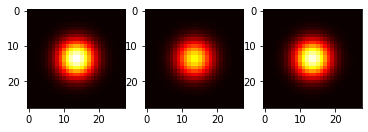

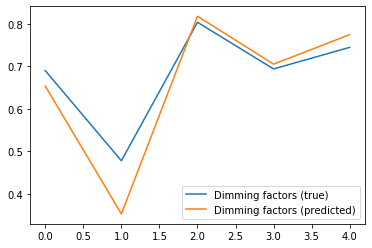

Current loss: 0.003628809005022049
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3045971989631653, dimming (predicted): 0.26260021328926086


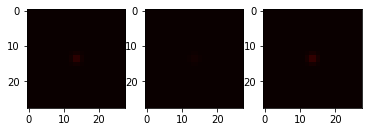

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9423360228538513, dimming (predicted): 0.8441340327262878


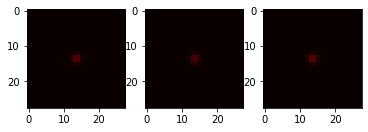

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9498760104179382, dimming (predicted): 0.9143880605697632


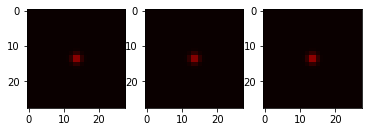

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.36045414209365845, dimming (predicted): 0.2953566014766693


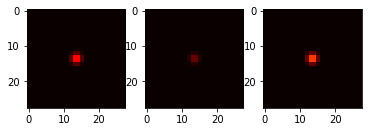

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.13909345865249634, dimming (predicted): 0.08843270689249039


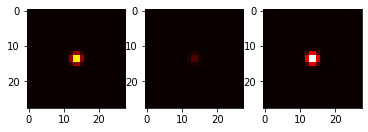

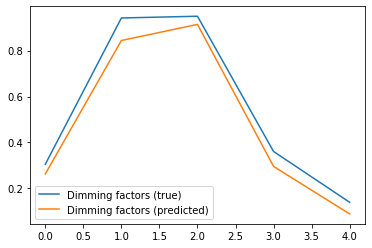

Current loss: 0.04406404495239258
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4588722586631775, dimming (predicted): 0.4327552318572998


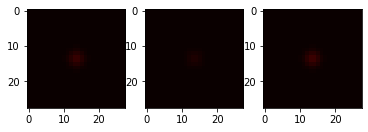

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9264454245567322, dimming (predicted): 0.8367721438407898


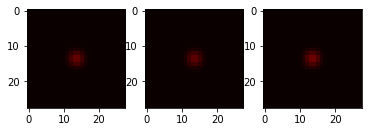

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8505260348320007, dimming (predicted): 0.8611664772033691


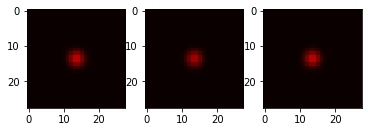

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4874613285064697, dimming (predicted): 0.47066375613212585


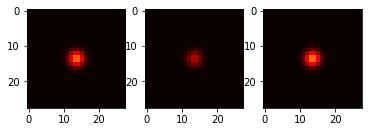

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.298626184463501, dimming (predicted): 0.24507880210876465


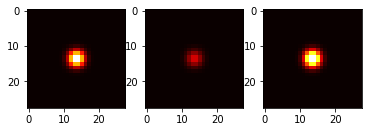

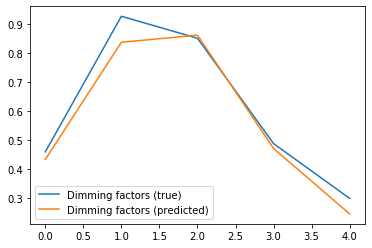

Current loss: 0.011085432022809982
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6311396360397339, dimming (predicted): 0.7984611988067627


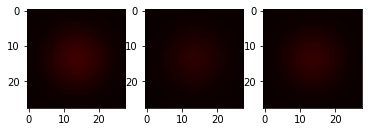

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.796699047088623, dimming (predicted): 0.6849843859672546


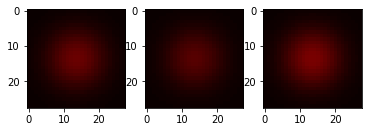

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.29094552993774414, dimming (predicted): 0.2527596950531006


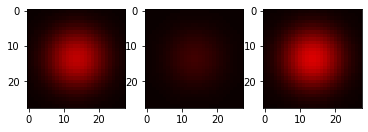

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7736047506332397, dimming (predicted): 0.7329902648925781


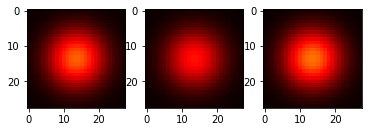

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7270264625549316, dimming (predicted): 0.6874623894691467


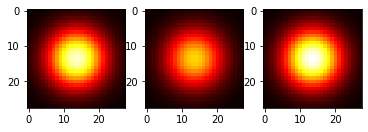

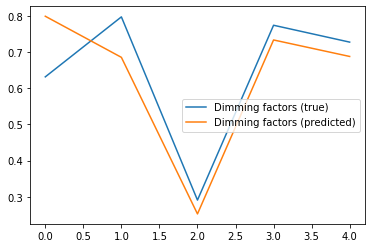

Current loss: 0.003891225205734372
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9506781697273254, dimming (predicted): 0.9013289213180542


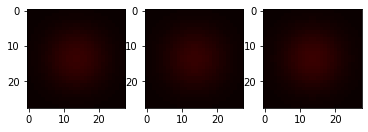

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.34588873386383057, dimming (predicted): 0.3495563268661499


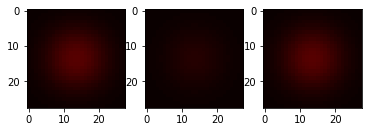

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7665528655052185, dimming (predicted): 0.8344170451164246


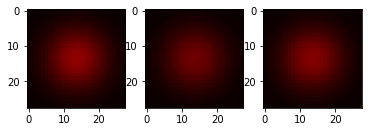

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.24603551626205444, dimming (predicted): 0.24755549430847168


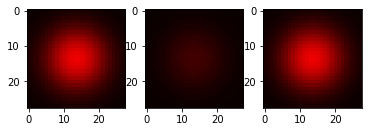

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.21952146291732788, dimming (predicted): 0.18611152470111847


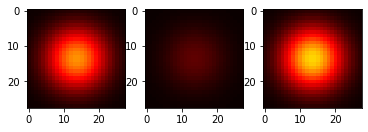

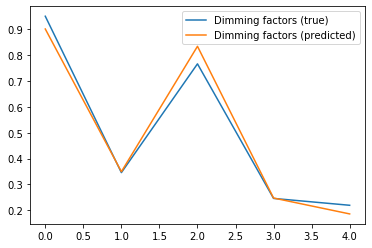

Current loss: 0.02799302339553833
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5346749424934387, dimming (predicted): 0.613750696182251


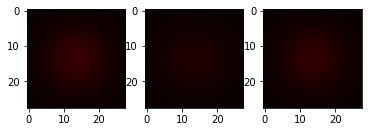

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8665536046028137, dimming (predicted): 0.7822128534317017


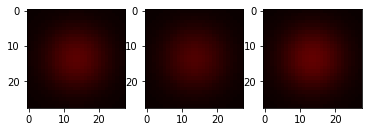

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.1993948221206665, dimming (predicted): 0.1852293461561203


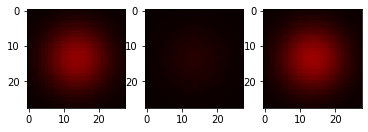

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.519229531288147, dimming (predicted): 0.4555136263370514


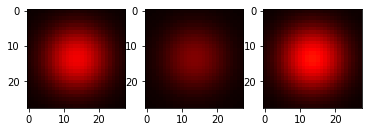

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8829538822174072, dimming (predicted): 0.7114481329917908


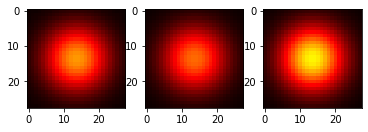

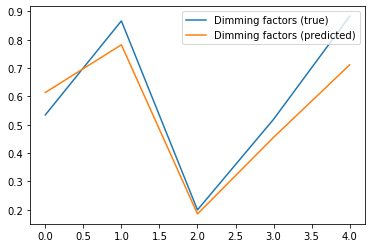

Current loss: 0.0039023752324283123
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.018581807613372803, dimming (predicted): 0.05186167731881142


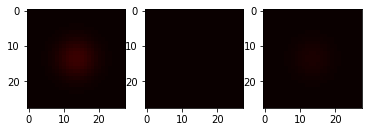

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8016949892044067, dimming (predicted): 0.8159909248352051


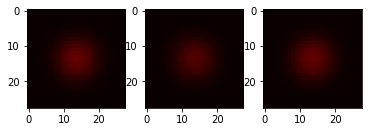

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9932044148445129, dimming (predicted): 0.9065104126930237


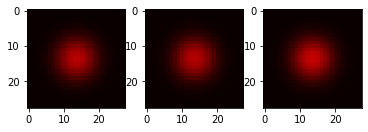

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7131215929985046, dimming (predicted): 0.7240392565727234


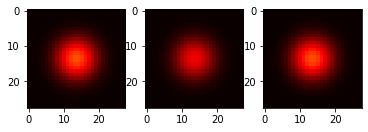

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.1486414670944214, dimming (predicted): 0.08016867190599442


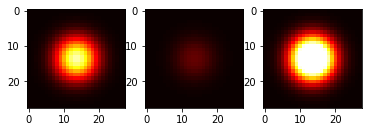

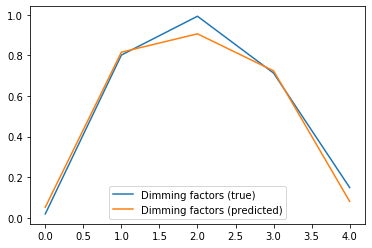

Current loss: 0.00468506058678031
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.29003816843032837, dimming (predicted): 0.3940887451171875


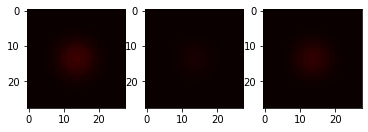

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.08336496353149414, dimming (predicted): 0.08599937707185745


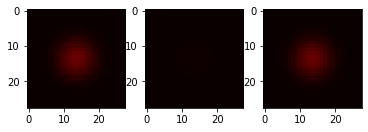

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8679578900337219, dimming (predicted): 0.8505999445915222


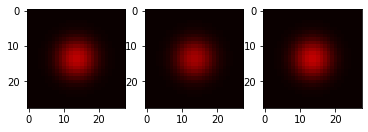

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8791220188140869, dimming (predicted): 0.8888643980026245


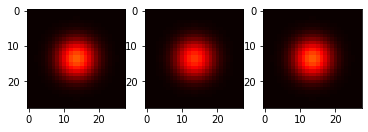

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7296579480171204, dimming (predicted): 0.6842049956321716


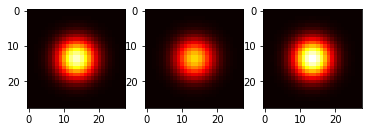

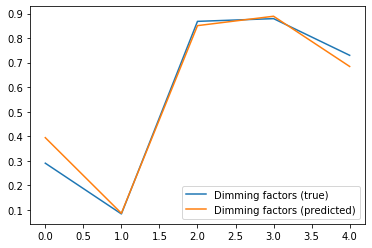

Current loss: 0.014212513342499733
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3084484338760376, dimming (predicted): 0.39772021770477295


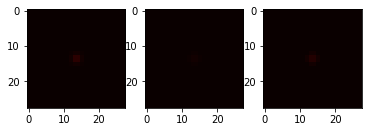

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.11364883184432983, dimming (predicted): 0.20578140020370483


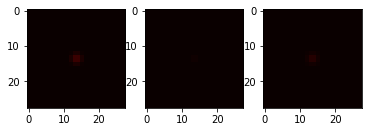

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7413821220397949, dimming (predicted): 0.6986194252967834


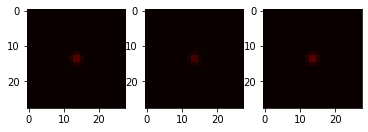

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.672957718372345, dimming (predicted): 0.6038386821746826


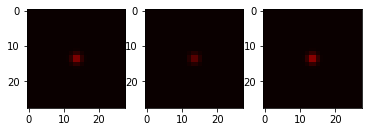

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5839957594871521, dimming (predicted): 0.5057586431503296


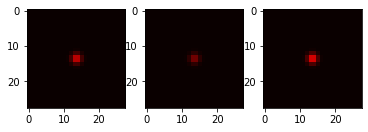

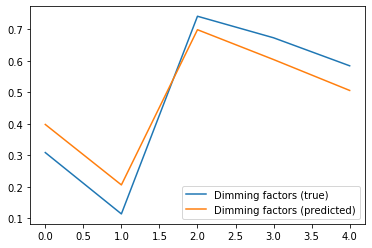

Current loss: 0.0035983447451144457
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6999752521514893, dimming (predicted): 0.7474853992462158


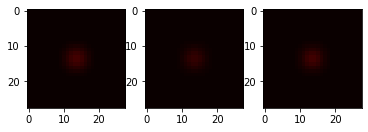

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.30802589654922485, dimming (predicted): 0.33081385493278503


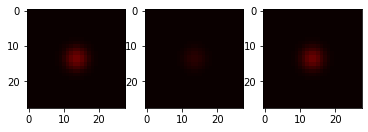

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4153757095336914, dimming (predicted): 0.4376877546310425


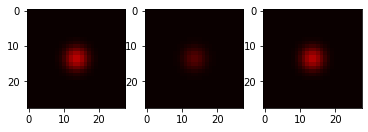

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8381175398826599, dimming (predicted): 0.7451819777488708


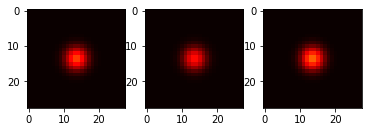

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8259109854698181, dimming (predicted): 0.7062410116195679


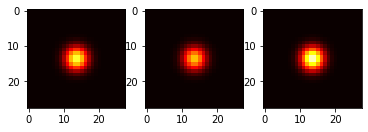

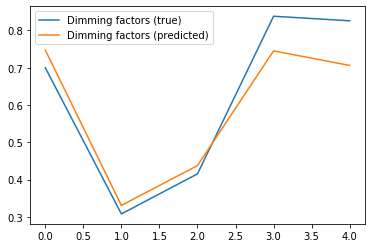

Current loss: 0.024612320587038994
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7197278141975403, dimming (predicted): 0.45470672845840454


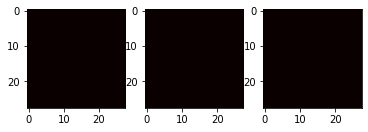

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9048321843147278, dimming (predicted): 0.592912495136261


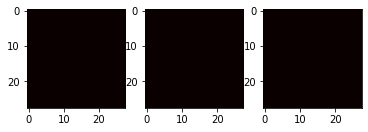

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5168595314025879, dimming (predicted): 0.5268239974975586


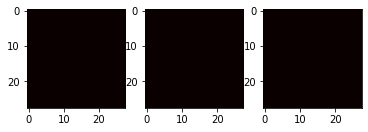

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8553225994110107, dimming (predicted): 0.5236477851867676


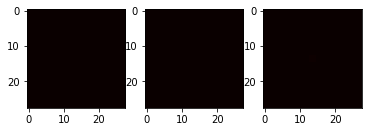

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6207567453384399, dimming (predicted): 0.5524833798408508


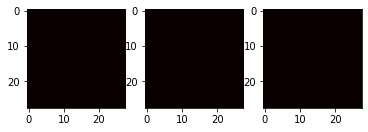

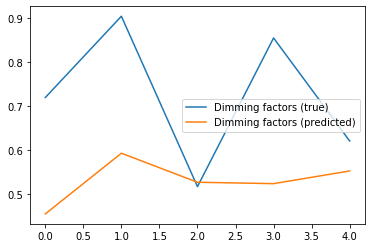

Current loss: 0.02442629635334015
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.719296395778656, dimming (predicted): 0.8290461301803589


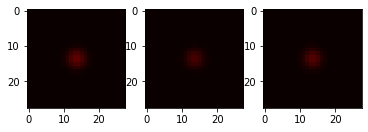

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6655616164207458, dimming (predicted): 0.675905168056488


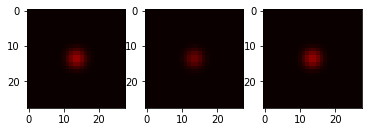

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8198657631874084, dimming (predicted): 0.7416815161705017


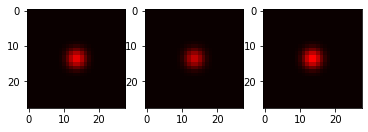

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8808592557907104, dimming (predicted): 0.6943261027336121


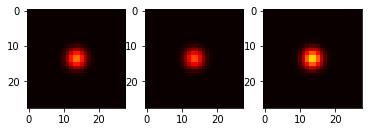

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.19648098945617676, dimming (predicted): 0.15358340740203857


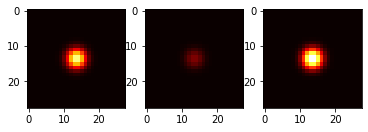

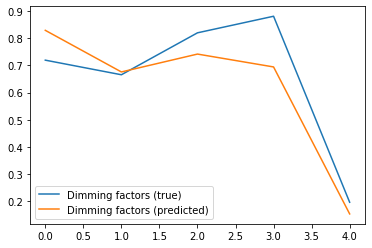

Current loss: 0.0037730615586042404
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.1226300597190857, dimming (predicted): 0.14010058343410492


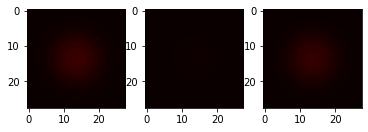

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6864883899688721, dimming (predicted): 0.7240487337112427


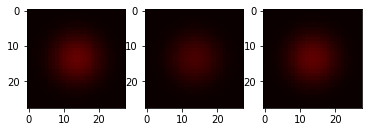

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.10338801145553589, dimming (predicted): 0.13520818948745728


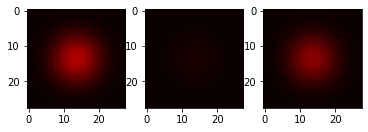

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.024577558040618896, dimming (predicted): 0.06516331434249878


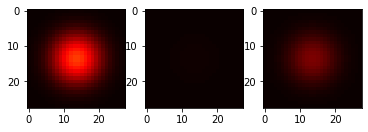

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7439137697219849, dimming (predicted): 0.7710999846458435


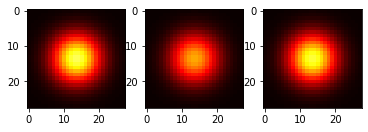

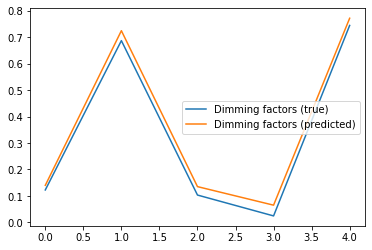

Current loss: 0.0038456954061985016
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.28767311573028564, dimming (predicted): 0.26037511229515076


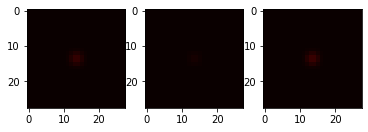

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8052495718002319, dimming (predicted): 0.8206177949905396


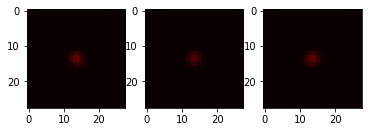

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.195681631565094, dimming (predicted): 0.11720480024814606


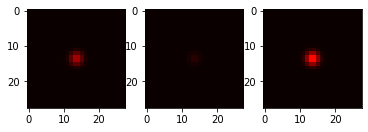

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6660763621330261, dimming (predicted): 0.805135190486908


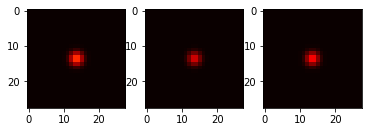

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.004486143589019775, dimming (predicted): 0.03963267058134079


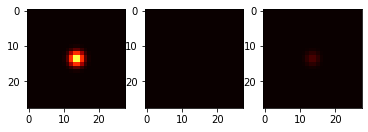

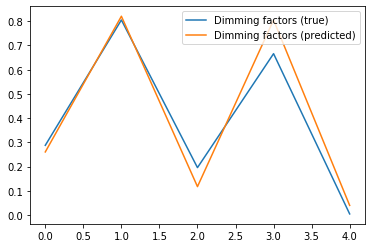

Current loss: 0.008704271167516708
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.28639471530914307, dimming (predicted): 0.2904174327850342


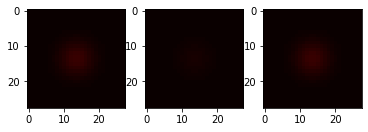

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9490174055099487, dimming (predicted): 0.8536087870597839


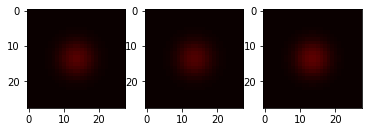

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.365134596824646, dimming (predicted): 0.3440718650817871


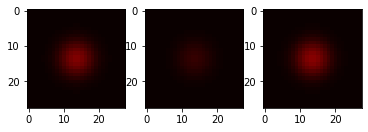

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6468724608421326, dimming (predicted): 0.5334348082542419


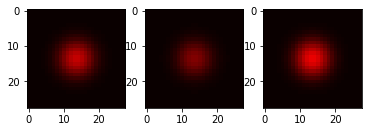

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.363398015499115, dimming (predicted): 0.3160415291786194


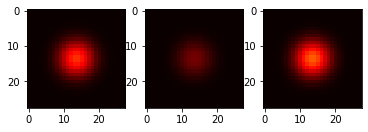

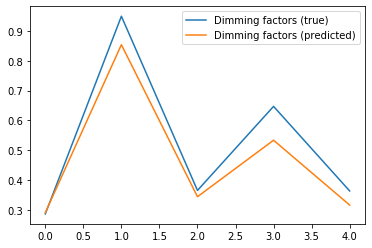

Current loss: 0.009668847545981407
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.863560140132904, dimming (predicted): 0.852902889251709


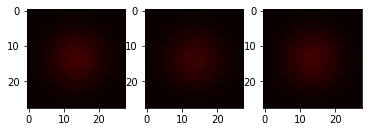

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9631314873695374, dimming (predicted): 0.8980990648269653


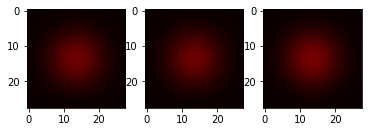

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.1146625280380249, dimming (predicted): 0.09746215492486954


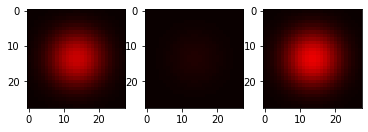

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8726345300674438, dimming (predicted): 0.8871361613273621


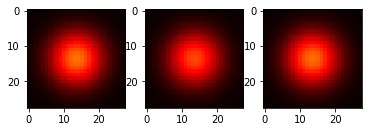

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.34310072660446167, dimming (predicted): 0.4662601351737976


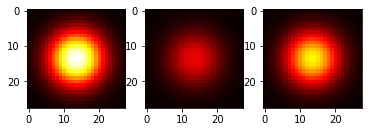

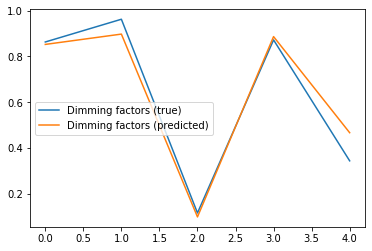

Current loss: 0.01441301591694355
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.27072983980178833, dimming (predicted): 0.30062344670295715


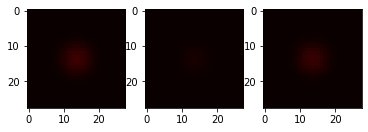

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6148066520690918, dimming (predicted): 0.6617221832275391


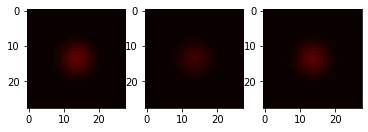

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.1014823317527771, dimming (predicted): 0.15832804143428802


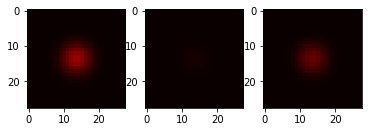

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.446128249168396, dimming (predicted): 0.3935874402523041


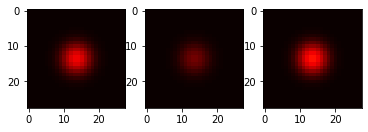

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8471837043762207, dimming (predicted): 0.6842666268348694


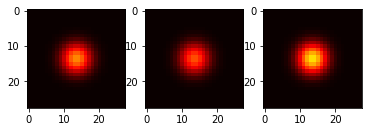

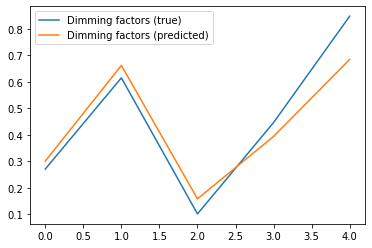

Current loss: 0.010194307193160057
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.35861384868621826, dimming (predicted): 0.2810964584350586


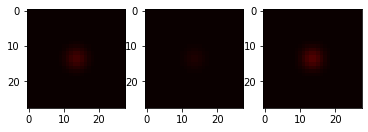

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3074658513069153, dimming (predicted): 0.2859417200088501


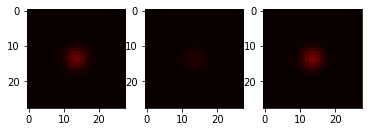

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9904721975326538, dimming (predicted): 0.8220155835151672


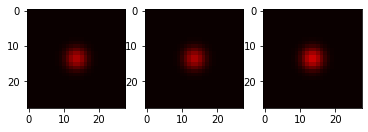

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8450095057487488, dimming (predicted): 0.6883007884025574


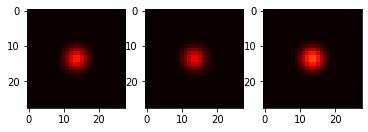

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.44127583503723145, dimming (predicted): 0.3337358832359314


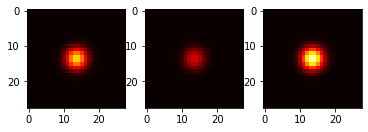

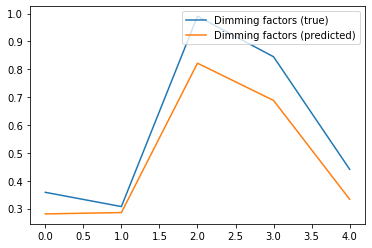

Current loss: 0.0337509885430336
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.02655130624771118, dimming (predicted): 0.12992700934410095


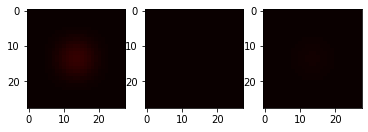

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3222652077674866, dimming (predicted): 0.3131440281867981


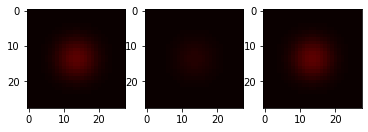

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8112812042236328, dimming (predicted): 0.8185625672340393


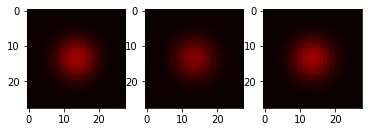

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5238443613052368, dimming (predicted): 0.5958971977233887


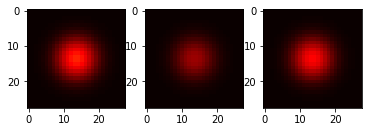

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9500934481620789, dimming (predicted): 0.8777979016304016


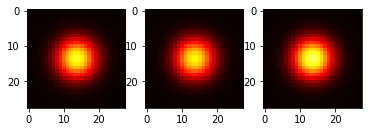

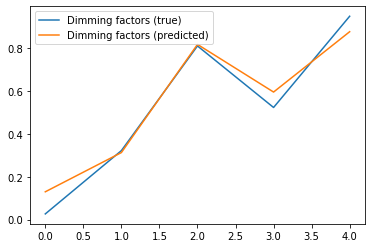

Current loss: 0.015739159658551216
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.0849958062171936, dimming (predicted): 0.22405342757701874


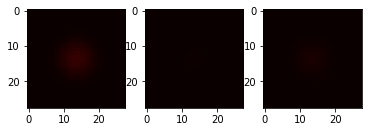

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.136505126953125, dimming (predicted): 0.3069077134132385


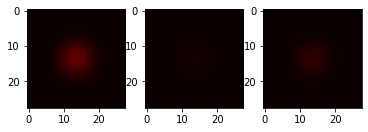

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.05827629566192627, dimming (predicted): 0.19392481446266174


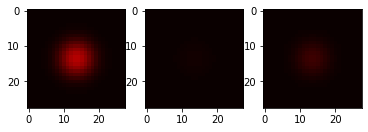

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.13808578252792358, dimming (predicted): 0.3767107129096985


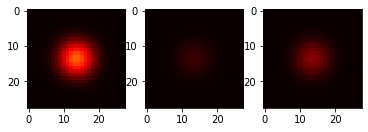

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.25154370069503784, dimming (predicted): 0.5637003779411316


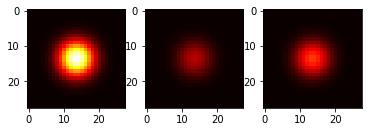

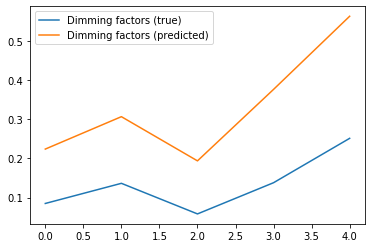

Current loss: 0.0049477266147732735
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9624348878860474, dimming (predicted): 0.917514979839325


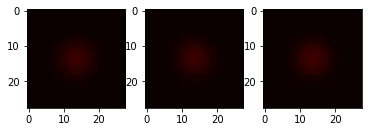

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.38765376806259155, dimming (predicted): 0.3235791027545929


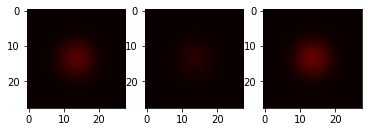

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6774170398712158, dimming (predicted): 0.7131432890892029


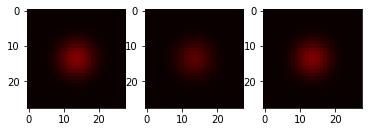

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4071165919303894, dimming (predicted): 0.36681848764419556


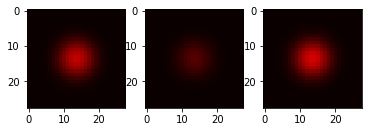

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3156741261482239, dimming (predicted): 0.26827472448349


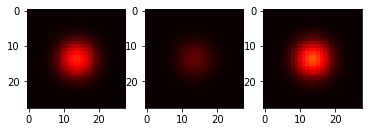

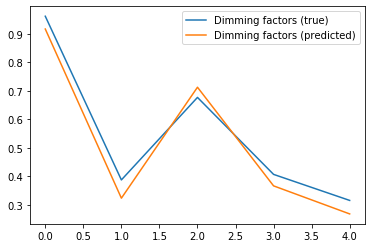

Current loss: 0.007755261845886707
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9491210579872131, dimming (predicted): 0.9320242404937744


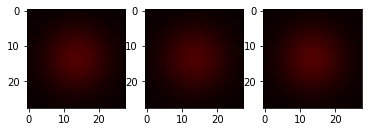

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.08551478385925293, dimming (predicted): 0.03581038489937782


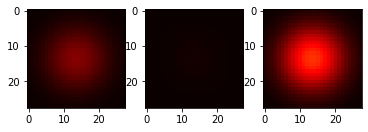

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5005597472190857, dimming (predicted): 0.6002761125564575


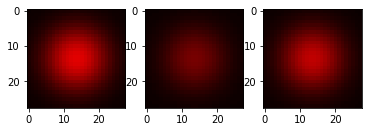

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.09990686178207397, dimming (predicted): 0.12046970427036285


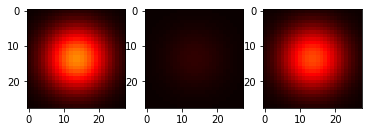

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.1498863697052002, dimming (predicted): 0.20237115025520325


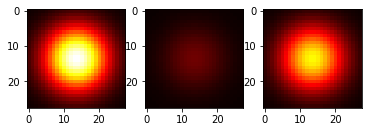

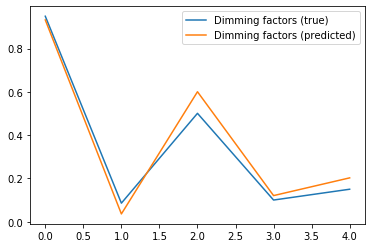

Current loss: 0.010569010861217976
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.10502231121063232, dimming (predicted): 0.15399660170078278


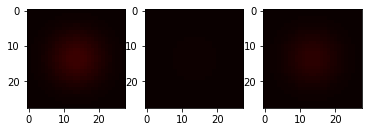

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3606727719306946, dimming (predicted): 0.42182010412216187


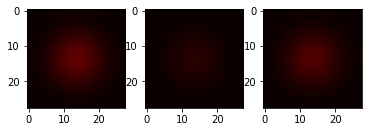

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.07372885942459106, dimming (predicted): 0.10264287143945694


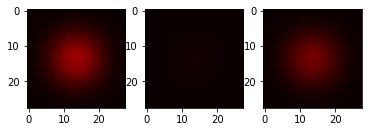

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7134130001068115, dimming (predicted): 0.6134215593338013


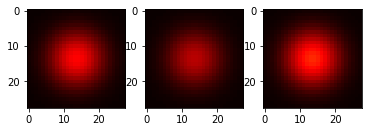

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8661888837814331, dimming (predicted): 0.7012139558792114


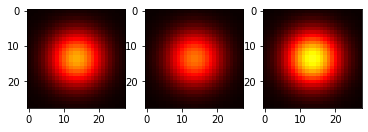

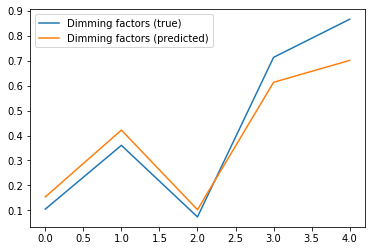

Current loss: 0.009757150895893574
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7635332345962524, dimming (predicted): 0.7245781421661377


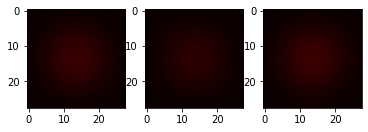

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5595113635063171, dimming (predicted): 0.5863597393035889


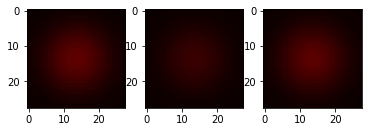

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4556887745857239, dimming (predicted): 0.35305434465408325


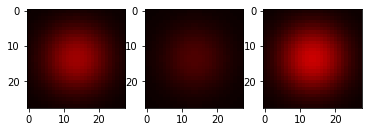

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8739739656448364, dimming (predicted): 0.723618745803833


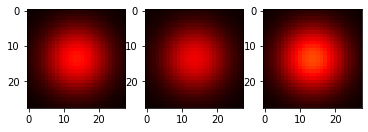

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5356993675231934, dimming (predicted): 0.49951082468032837


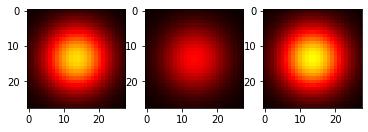

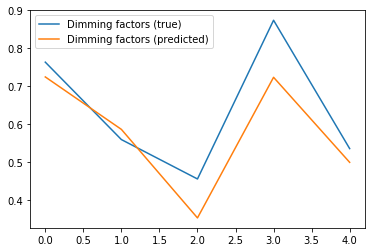

Current loss: 0.004686030559241772
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.312915563583374, dimming (predicted): 0.3382808268070221


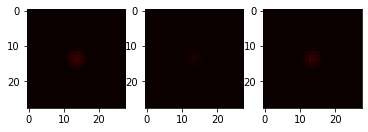

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.05911523103713989, dimming (predicted): 0.16325576603412628


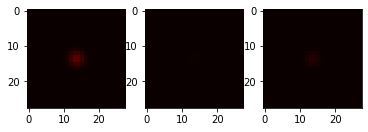

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6435440182685852, dimming (predicted): 0.7439154386520386


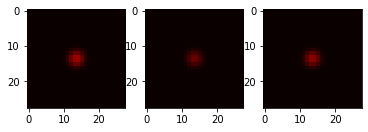

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4722840189933777, dimming (predicted): 0.6411215662956238


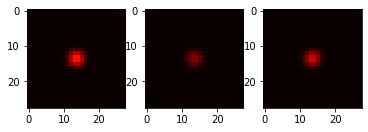

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4605902433395386, dimming (predicted): 0.5076271295547485


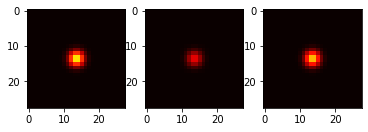

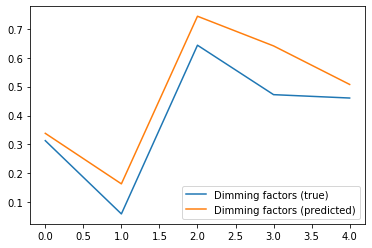

Current loss: 0.006644826382398605
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6831470727920532, dimming (predicted): 0.7231916189193726


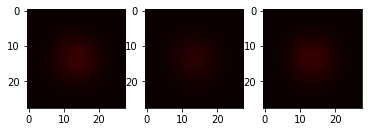

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9575688242912292, dimming (predicted): 0.8815800547599792


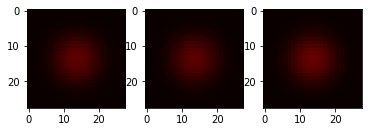

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.1149405837059021, dimming (predicted): 0.08246087282896042


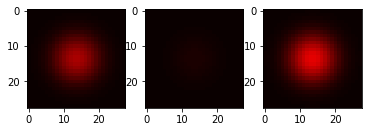

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9889319539070129, dimming (predicted): 0.7763254642486572


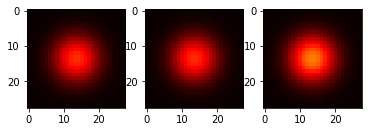

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.16347205638885498, dimming (predicted): 0.05561373755335808


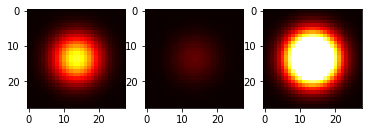

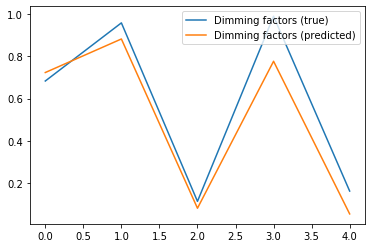

Current loss: 0.020372599363327026
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.438132643699646, dimming (predicted): 0.4905300736427307


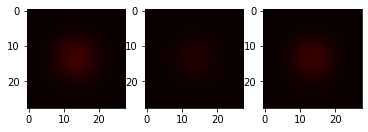

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.733386218547821, dimming (predicted): 0.7415062189102173


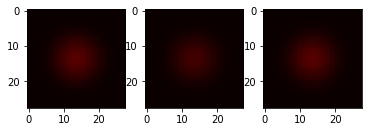

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.40449148416519165, dimming (predicted): 0.35312891006469727


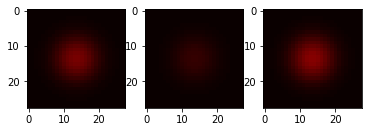

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9621109962463379, dimming (predicted): 0.6048369407653809


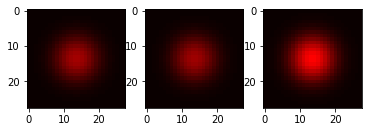

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3163496255874634, dimming (predicted): 0.193016916513443


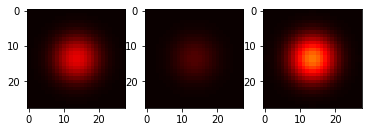

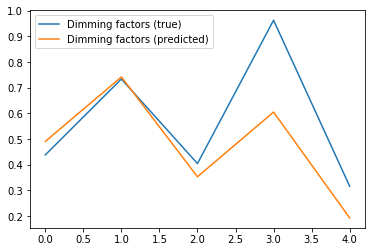

Current loss: 0.005381417460739613
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7935987114906311, dimming (predicted): 0.8240577578544617


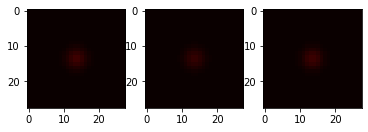

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.023249447345733643, dimming (predicted): 0.09191890060901642


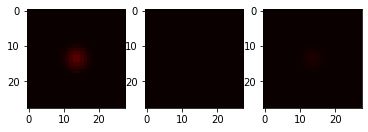

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.44444018602371216, dimming (predicted): 0.4698253870010376


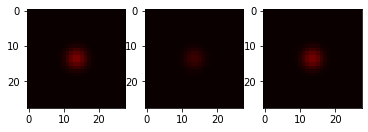

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9057777523994446, dimming (predicted): 0.6936994791030884


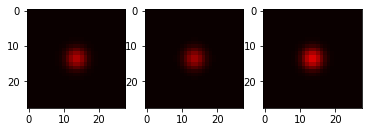

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.30723369121551514, dimming (predicted): 0.3092988133430481


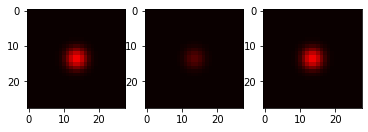

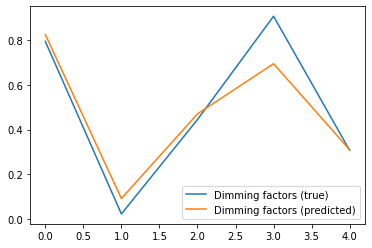

Current loss: 0.009035407565534115
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9984691739082336, dimming (predicted): 0.8725740909576416


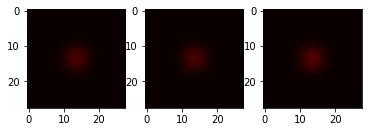

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4276221990585327, dimming (predicted): 0.3294391930103302


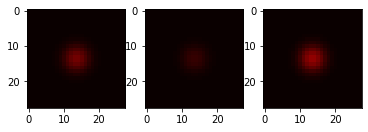

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3351861238479614, dimming (predicted): 0.39658230543136597


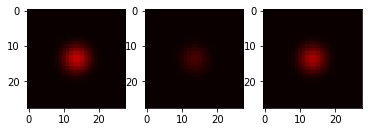

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.44690918922424316, dimming (predicted): 0.5707008838653564


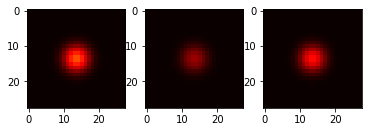

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.06993788480758667, dimming (predicted): 0.12710975110530853


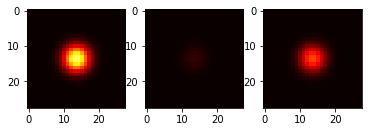

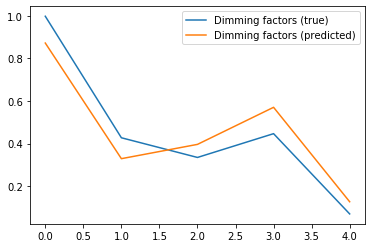

Current loss: 0.010797286406159401
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8790953755378723, dimming (predicted): 0.9145614504814148


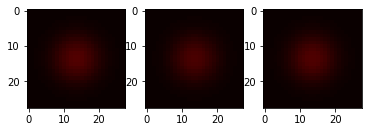

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2640591859817505, dimming (predicted): 0.17366614937782288


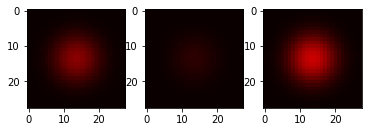

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.033487915992736816, dimming (predicted): 0.04568751901388168


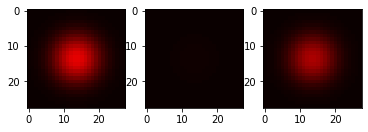

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6765851974487305, dimming (predicted): 0.6166428923606873


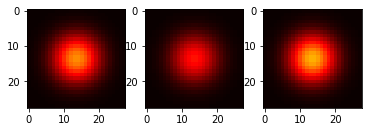

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4819738268852234, dimming (predicted): 0.5536590814590454


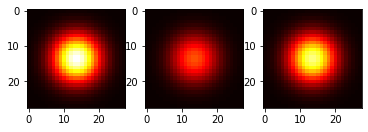

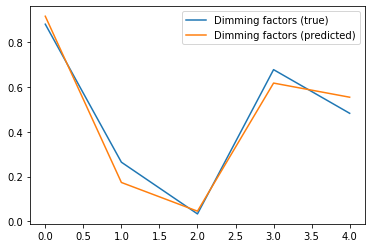

Current loss: 0.006216445006430149
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3241199254989624, dimming (predicted): 0.33090540766716003


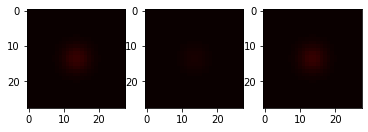

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.28478264808654785, dimming (predicted): 0.287092387676239


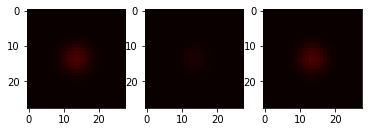

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7195286154747009, dimming (predicted): 0.6288222074508667


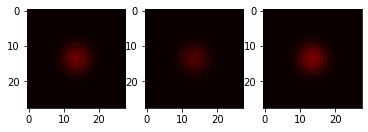

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.522639811038971, dimming (predicted): 0.4433152377605438


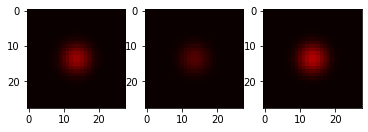

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3527895212173462, dimming (predicted): 0.36174896359443665


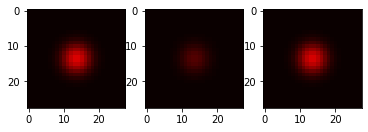

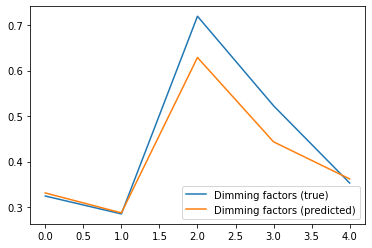

Current loss: 0.010185529477894306
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5130870938301086, dimming (predicted): 0.6101562976837158


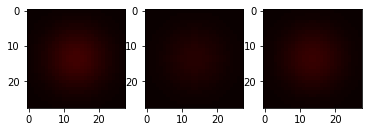

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8750763535499573, dimming (predicted): 0.8668333292007446


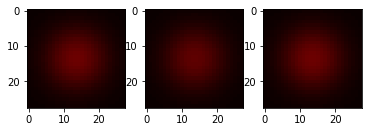

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8909786343574524, dimming (predicted): 0.8759815692901611


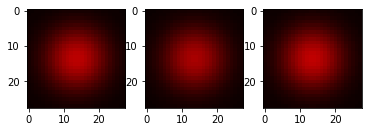

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8890316486358643, dimming (predicted): 0.8032354116439819


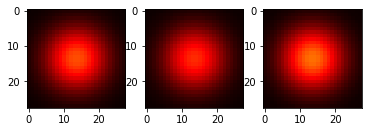

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9742333292961121, dimming (predicted): 0.6704365611076355


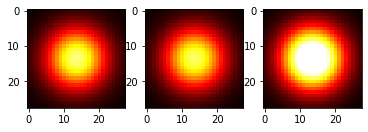

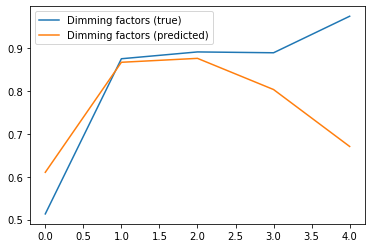

Current loss: 0.019625091925263405
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.05543708801269531, dimming (predicted): 0.031048256903886795


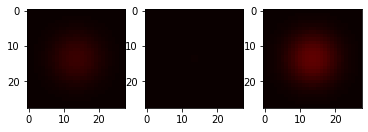

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8054735064506531, dimming (predicted): 0.6187323331832886


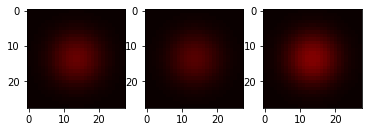

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.24969977140426636, dimming (predicted): 0.10231458395719528


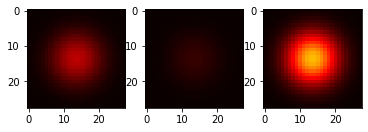

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9953899383544922, dimming (predicted): 0.9506056308746338


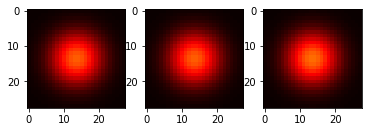

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.11755812168121338, dimming (predicted): 0.11532241851091385


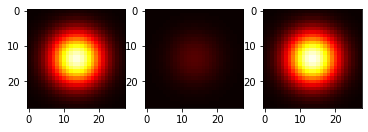

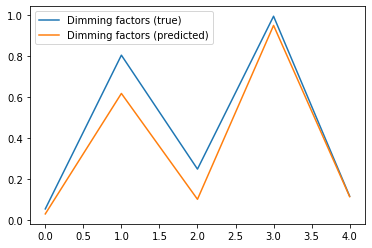

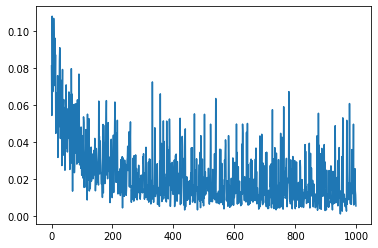

Loss min: 0.001021243049763143, max: 0.1078328862786293, mean: 0.02230118925345596
0.02230118925345596


In [104]:
def make_sun_upperright(num_channels):
    size = 28
    xx, yy = np.meshgrid(np.arange(size)-(size-1)/2.,np.arange(size)-(size-1)/2)
    r = np.sqrt(xx*xx+yy*yy) 
    R = np.random.rand(1)*(size/3)
    channels = []
    I_0 = np.random.rand() * 1000.
    for c in range(num_channels):
        I_c = I_0**(c/10.)
        channels.append(np.exp(-(r*r)/(R*R))*I_c)
    image = torch.cat([torch.from_numpy(channel).float().to(device) for channel in channels]).view(num_channels, 28, 28)
    return image

upperright_mean = run_experiment("upperright_mean", make_sun_upperright)
print(upperright_mean)

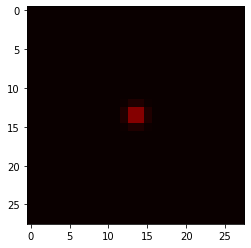

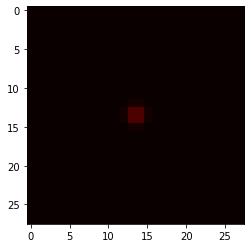

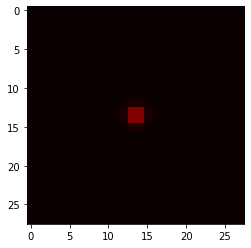

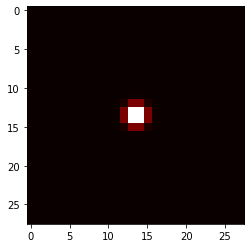

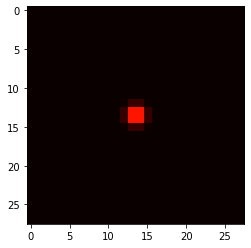

input_channels: 5
cnn_output_dim: 512
Current loss: 0.08990664780139923
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.15882164239883423, dimming (predicted): 0.49566707015037537


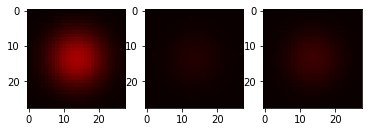

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4375320076942444, dimming (predicted): 0.4941524863243103


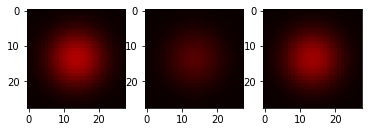

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4281409978866577, dimming (predicted): 0.4984416663646698


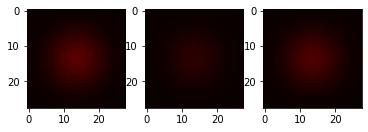

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.1805834174156189, dimming (predicted): 0.4849540591239929


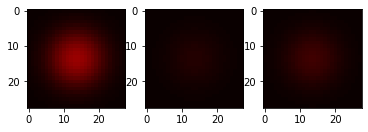

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8421151041984558, dimming (predicted): 0.5077607035636902


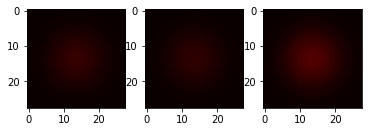

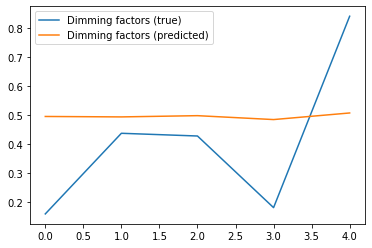

Current loss: 0.07906273752450943
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6381050944328308, dimming (predicted): 0.4653477370738983


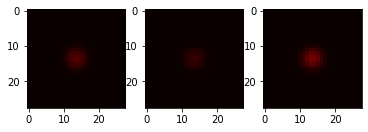

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6148339509963989, dimming (predicted): 0.5425748825073242


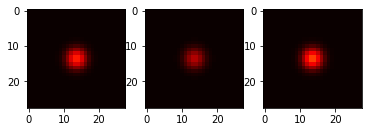

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.20786011219024658, dimming (predicted): 0.4893905520439148


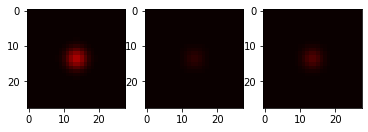

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.40471965074539185, dimming (predicted): 0.4987000823020935


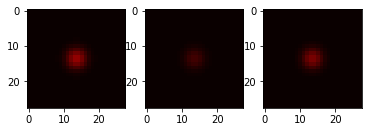

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7173977494239807, dimming (predicted): 0.5152801275253296


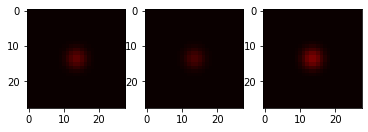

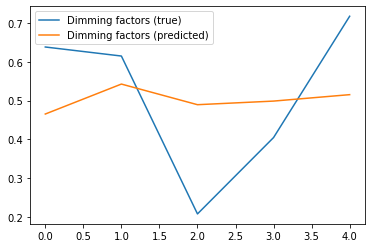

Current loss: 0.07188727706670761
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4956356883049011, dimming (predicted): 0.4905259609222412


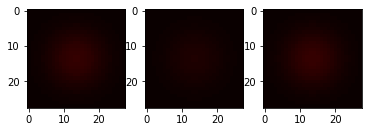

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.36341071128845215, dimming (predicted): 0.5446121096611023


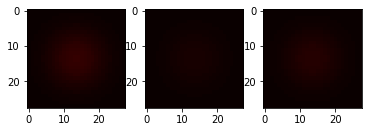

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.37835657596588135, dimming (predicted): 0.4796364903450012


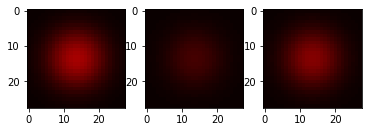

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.09841716289520264, dimming (predicted): 0.48067545890808105


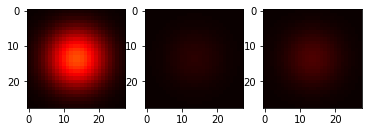

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.25806427001953125, dimming (predicted): 0.5423799753189087


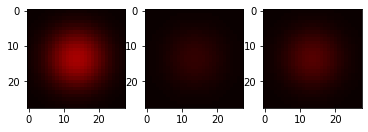

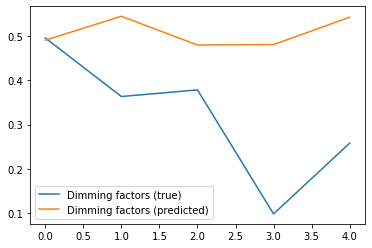

Current loss: 0.055092841386795044
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.521071195602417, dimming (predicted): 0.4940119683742523


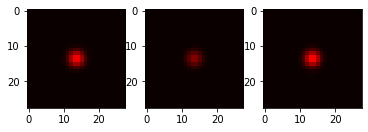

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4473046064376831, dimming (predicted): 0.4844447374343872


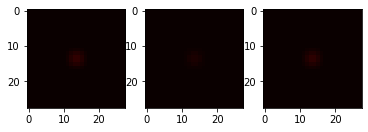

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6195036172866821, dimming (predicted): 0.5157175660133362


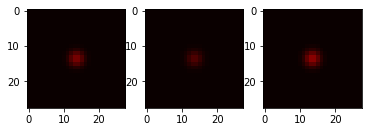

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8819475769996643, dimming (predicted): 0.5890599489212036


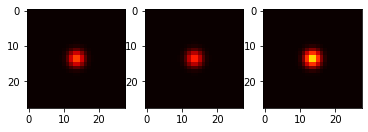

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.09241557121276855, dimming (predicted): 0.5866861939430237


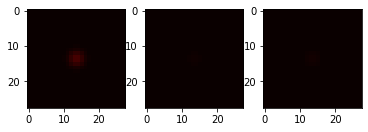

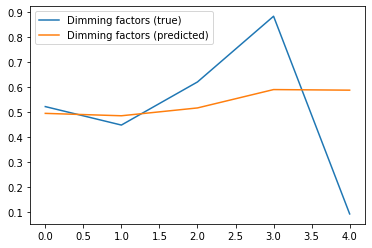

Current loss: 0.07297404110431671
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9800158739089966, dimming (predicted): 0.4827636778354645


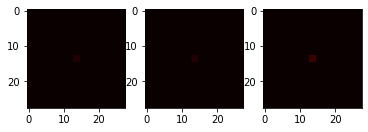

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.40065085887908936, dimming (predicted): 0.5337388515472412


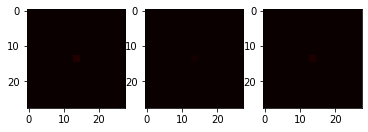

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.30343759059906006, dimming (predicted): 0.47132667899131775


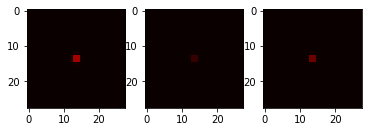

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.42922502756118774, dimming (predicted): 0.517411470413208


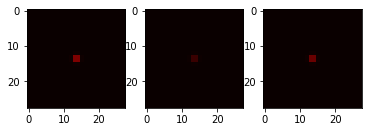

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9095121622085571, dimming (predicted): 0.5283387899398804


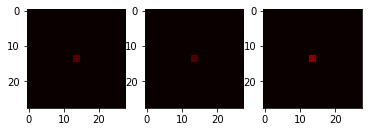

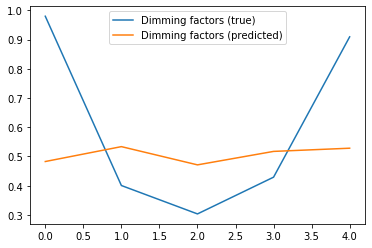

Current loss: 0.06792198866605759
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.009366869926452637, dimming (predicted): 0.14023582637310028


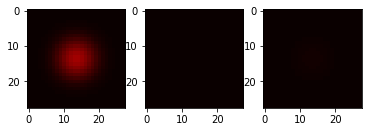

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6471979022026062, dimming (predicted): 0.8453988432884216


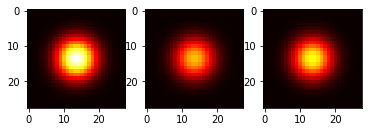

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.11549097299575806, dimming (predicted): 0.18132799863815308


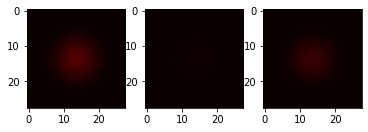

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.15942269563674927, dimming (predicted): 0.5493510961532593


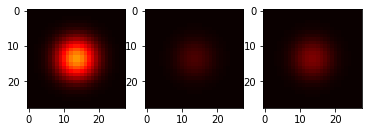

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9169335961341858, dimming (predicted): 0.5865691900253296


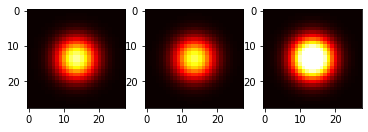

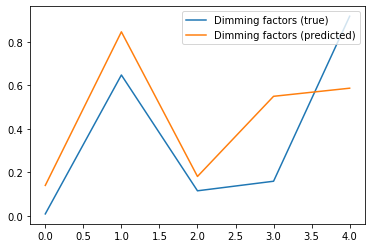

Current loss: 0.056688446551561356
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.23701536655426025, dimming (predicted): 0.5534919500350952


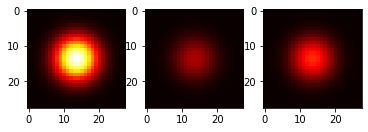

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6737232208251953, dimming (predicted): 0.5756043791770935


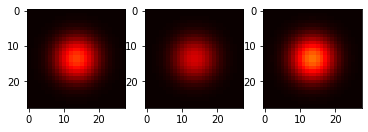

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.43423330783843994, dimming (predicted): 0.5024983882904053


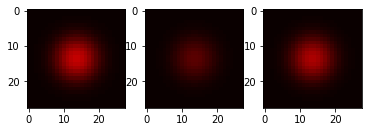

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6504356861114502, dimming (predicted): 0.37944069504737854


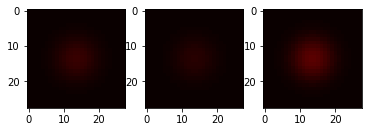

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3662261962890625, dimming (predicted): 0.4080975353717804


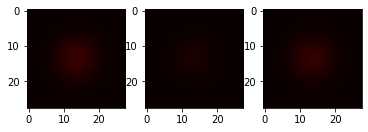

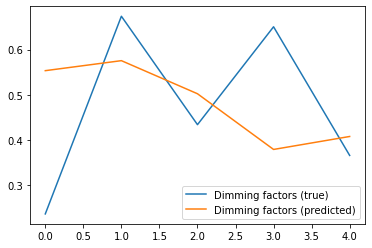

Current loss: 0.04400330036878586
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.22763985395431519, dimming (predicted): 0.48495879769325256


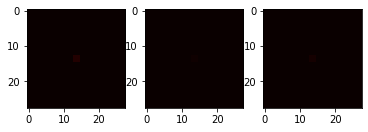

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7106736302375793, dimming (predicted): 0.5240886211395264


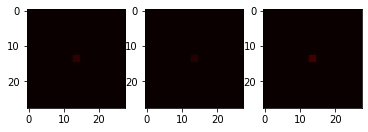

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.724795401096344, dimming (predicted): 0.44642096757888794


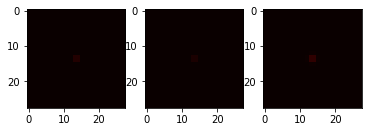

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3683861494064331, dimming (predicted): 0.4706727862358093


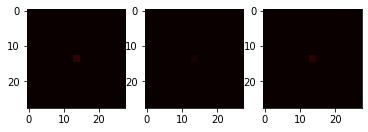

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5387477278709412, dimming (predicted): 0.5715304017066956


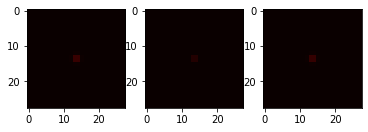

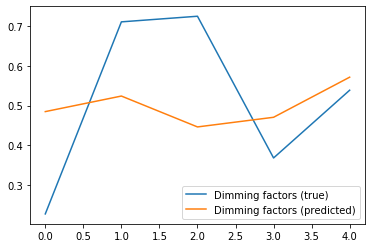

Current loss: 0.07104986906051636
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8425177931785583, dimming (predicted): 0.5894913673400879


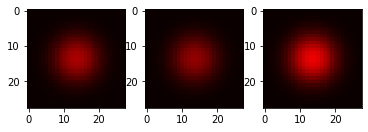

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.1048133373260498, dimming (predicted): 0.4677564799785614


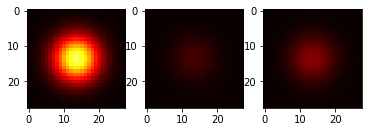

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4362412691116333, dimming (predicted): 0.56206214427948


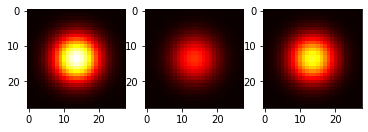

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.942232072353363, dimming (predicted): 0.49844345450401306


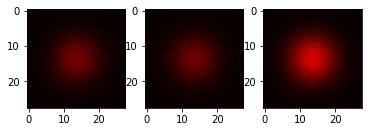

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8654058575630188, dimming (predicted): 0.5191317796707153


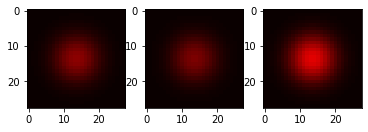

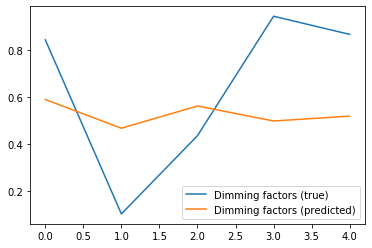

Current loss: 0.06977023184299469
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7499212026596069, dimming (predicted): 0.49288854002952576


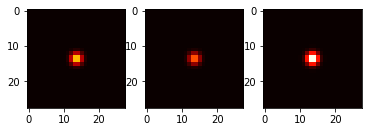

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.46227163076400757, dimming (predicted): 0.6083978414535522


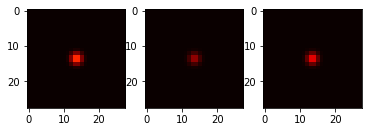

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6097585558891296, dimming (predicted): 0.5249090194702148


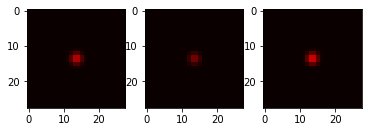

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7919237613677979, dimming (predicted): 0.49641716480255127


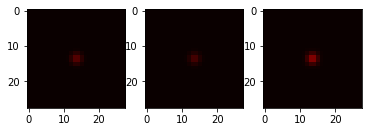

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7590857148170471, dimming (predicted): 0.6044572591781616


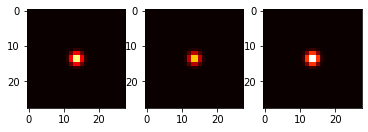

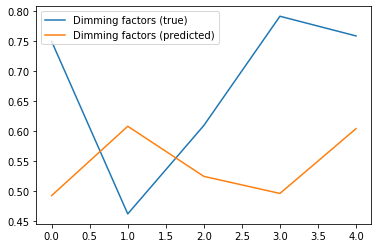

Current loss: 0.04577481746673584
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.44909989833831787, dimming (predicted): 0.41073426604270935


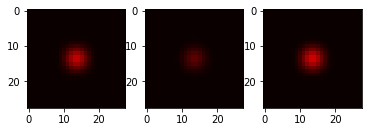

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6759722828865051, dimming (predicted): 0.5326297283172607


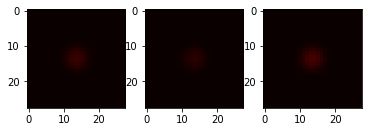

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.021867752075195312, dimming (predicted): 0.27986252307891846


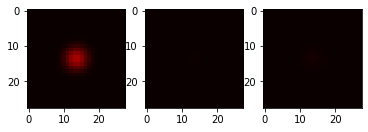

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5587918758392334, dimming (predicted): 0.7001056671142578


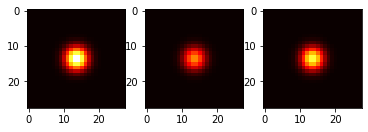

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7800596952438354, dimming (predicted): 0.4067170023918152


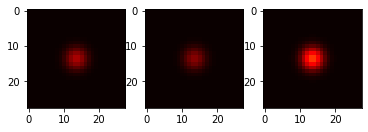

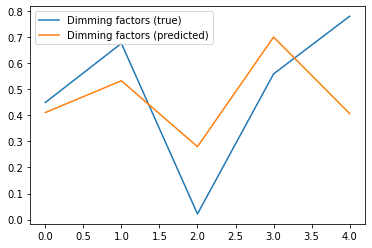

Current loss: 0.0607791431248188
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2779383063316345, dimming (predicted): 0.40297454595565796


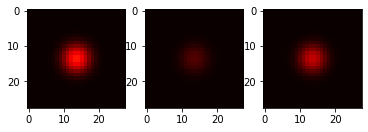

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.17767333984375, dimming (predicted): 0.4916764497756958


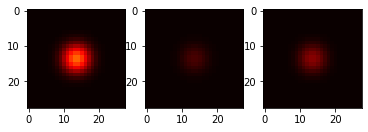

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.39100390672683716, dimming (predicted): 0.2587592303752899


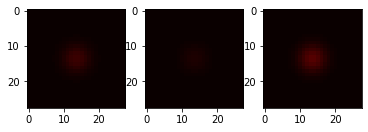

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7943913340568542, dimming (predicted): 0.7389600276947021


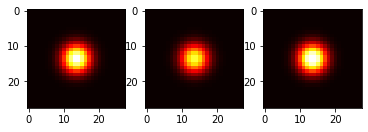

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.447695791721344, dimming (predicted): 0.3298313021659851


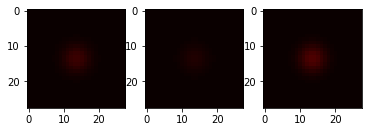

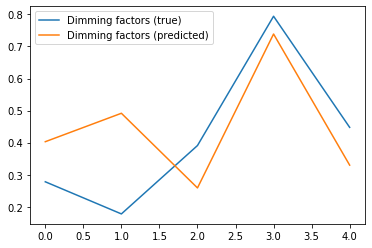

Current loss: 0.08189304172992706
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9372450709342957, dimming (predicted): 0.4082474410533905


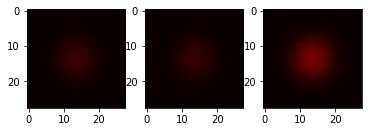

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.1797812581062317, dimming (predicted): 0.4439848065376282


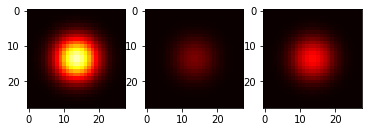

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.09860020875930786, dimming (predicted): 0.4479864835739136


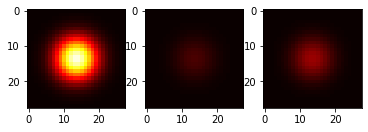

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5899431109428406, dimming (predicted): 0.5981220602989197


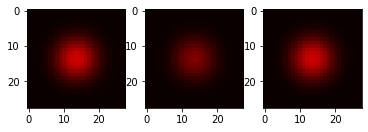

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.38482534885406494, dimming (predicted): 0.7540254592895508


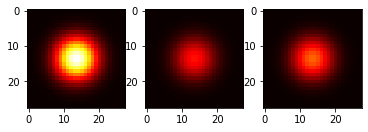

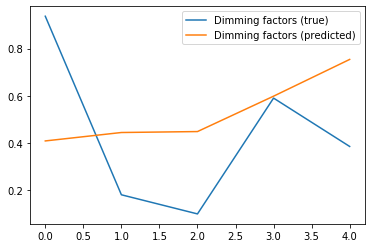

Current loss: 0.05878417566418648
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.12004351615905762, dimming (predicted): 0.4132087230682373


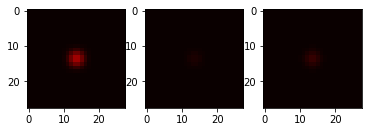

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.51096111536026, dimming (predicted): 0.6475095152854919


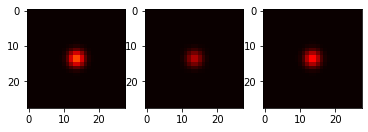

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9864518046379089, dimming (predicted): 0.3894957900047302


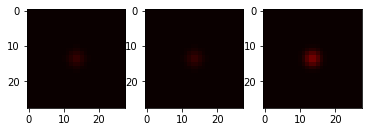

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.838136613368988, dimming (predicted): 0.6190437078475952


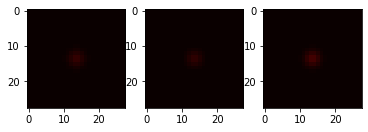

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9784455895423889, dimming (predicted): 0.7274009585380554


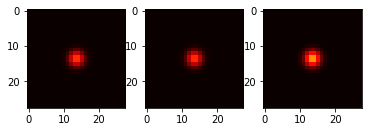

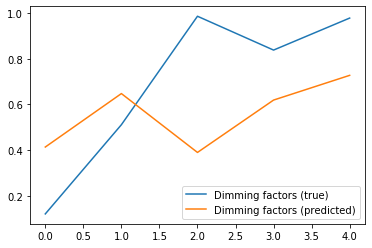

Current loss: 0.04145297780632973
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.1633794903755188, dimming (predicted): 0.527001678943634


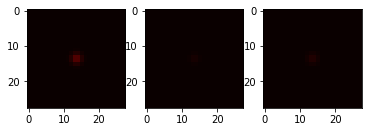

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4847121238708496, dimming (predicted): 0.40817949175834656


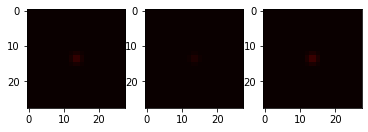

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6978315114974976, dimming (predicted): 0.7632163166999817


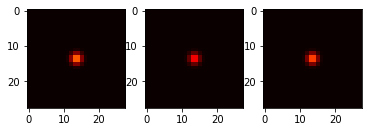

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5578733682632446, dimming (predicted): 0.5394521951675415


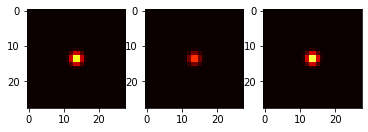

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.36501216888427734, dimming (predicted): 0.3937370181083679


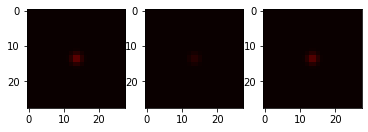

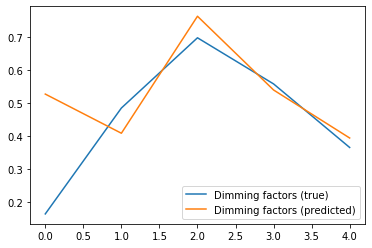

Current loss: 0.09545386582612991
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.22856152057647705, dimming (predicted): 0.4330376982688904


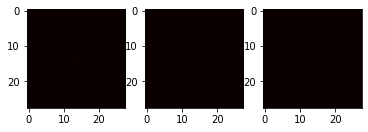

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.04715019464492798, dimming (predicted): 0.4709080457687378


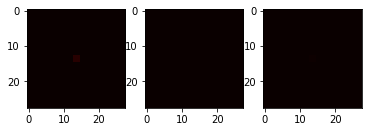

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8741294145584106, dimming (predicted): 0.5465128421783447


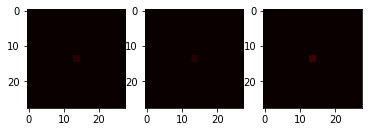

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9097477793693542, dimming (predicted): 0.4801875650882721


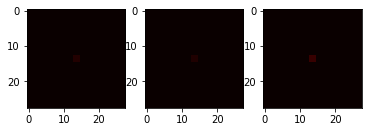

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9650725722312927, dimming (predicted): 0.4360850155353546


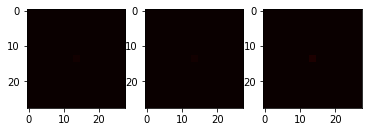

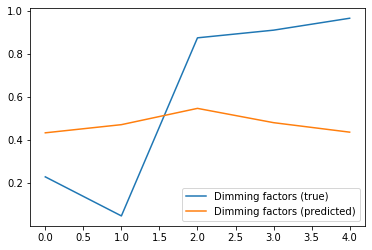

Current loss: 0.07595821470022202
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.41583770513534546, dimming (predicted): 0.6186480522155762


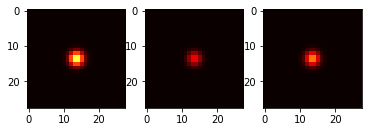

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.16439294815063477, dimming (predicted): 0.3291246294975281


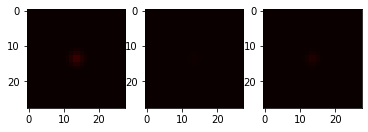

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8362998962402344, dimming (predicted): 0.47307658195495605


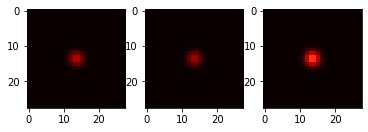

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.11677169799804688, dimming (predicted): 0.5394331216812134


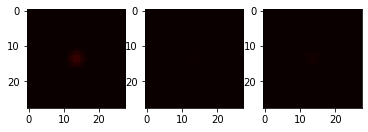

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.789111316204071, dimming (predicted): 0.7244133353233337


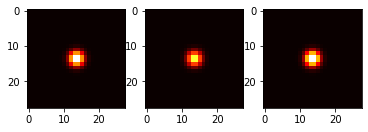

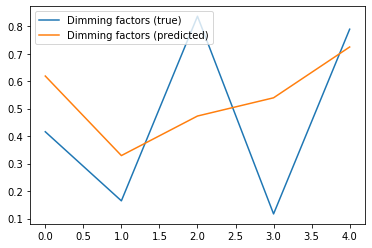

Current loss: 0.0883295089006424
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8998810052871704, dimming (predicted): 0.510279655456543


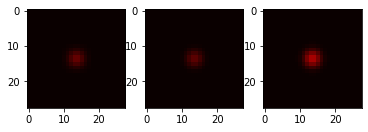

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.18846088647842407, dimming (predicted): 0.38117262721061707


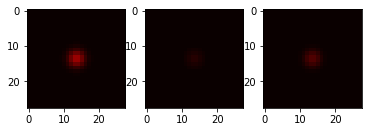

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.43874722719192505, dimming (predicted): 0.38107138872146606


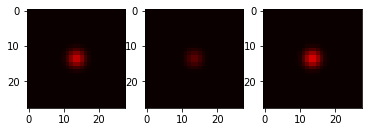

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9996092915534973, dimming (predicted): 0.6854916214942932


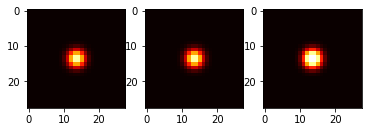

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.05793130397796631, dimming (predicted): 0.3500661849975586


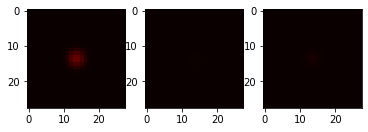

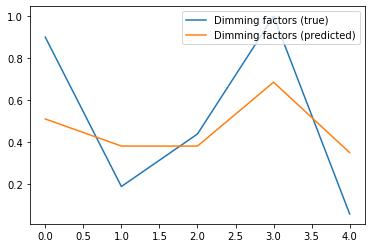

Current loss: 0.13095836341381073
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7736802697181702, dimming (predicted): 0.7100733518600464


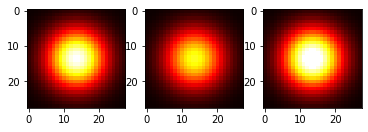

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5180111527442932, dimming (predicted): 0.8583322167396545


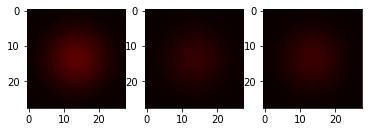

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8984938859939575, dimming (predicted): 0.15627017617225647


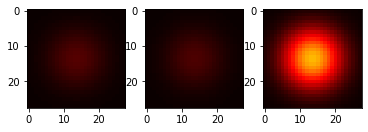

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8570529818534851, dimming (predicted): 0.08314330130815506


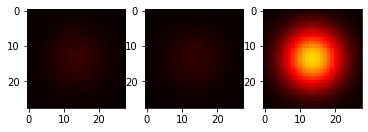

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3929387331008911, dimming (predicted): 0.47244420647621155


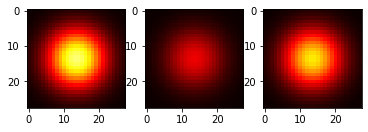

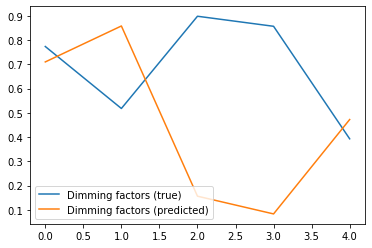

Current loss: 0.07064372301101685
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.29850077629089355, dimming (predicted): 0.42882969975471497


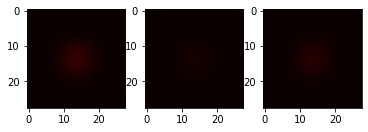

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7966659069061279, dimming (predicted): 0.5853361487388611


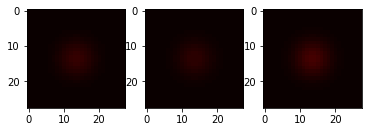

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.1095384955406189, dimming (predicted): 0.25801506638526917


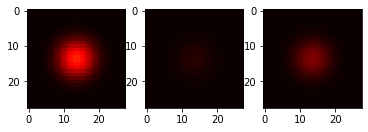

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9638016819953918, dimming (predicted): 0.7470998764038086


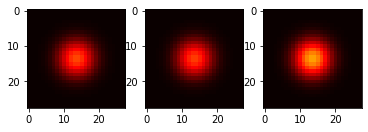

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6415709257125854, dimming (predicted): 0.6519285440444946


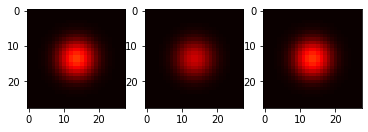

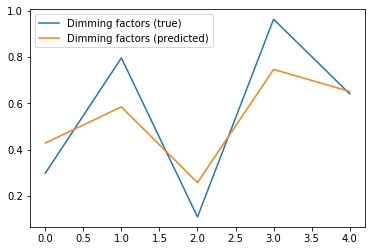

Current loss: 0.08133041858673096
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.1532101035118103, dimming (predicted): 0.3987971246242523


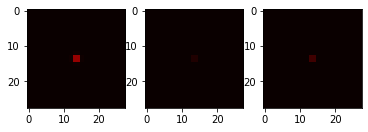

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.694000780582428, dimming (predicted): 0.5787308812141418


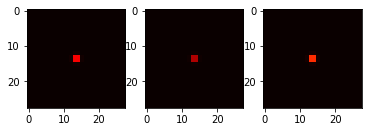

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5661106705665588, dimming (predicted): 0.5248277187347412


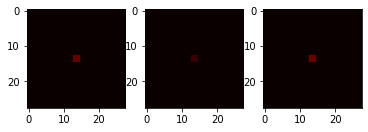

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3837953209877014, dimming (predicted): 0.6247259974479675


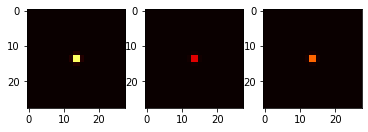

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7840793132781982, dimming (predicted): 0.5134524703025818


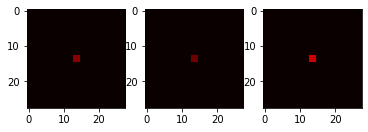

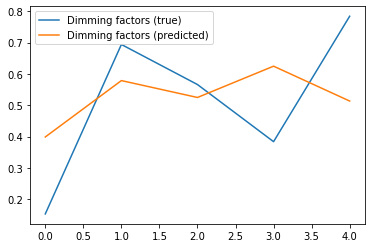

Current loss: 0.0479799285531044
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7400660514831543, dimming (predicted): 0.53351229429245


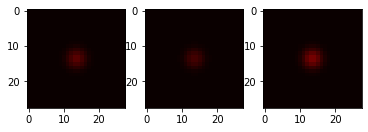

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6326068639755249, dimming (predicted): 0.4471496641635895


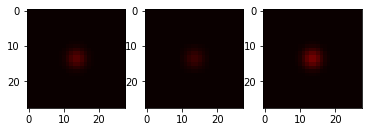

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.23228394985198975, dimming (predicted): 0.49782800674438477


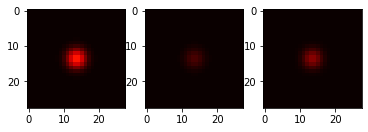

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5194849371910095, dimming (predicted): 0.4996258318424225


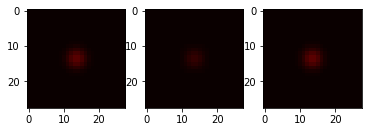

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3407190442085266, dimming (predicted): 0.43027177453041077


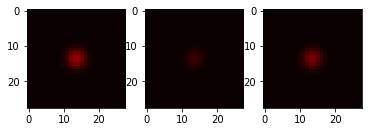

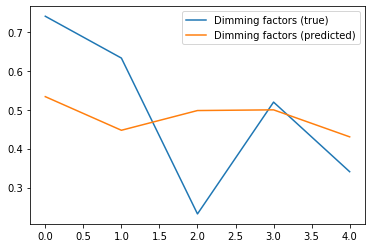

Current loss: 0.10273392498493195
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5282126665115356, dimming (predicted): 0.505272626876831


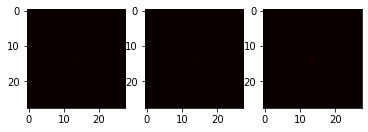

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.12327980995178223, dimming (predicted): 0.43493524193763733


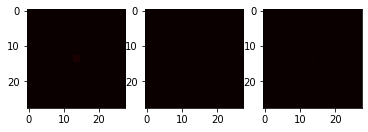

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2389581799507141, dimming (predicted): 0.46190518140792847


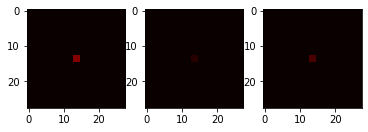

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.0596081018447876, dimming (predicted): 0.46429580450057983


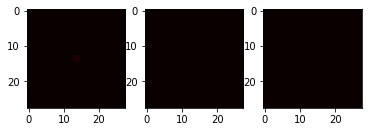

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.03509950637817383, dimming (predicted): 0.40068936347961426


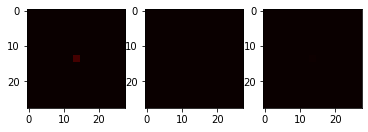

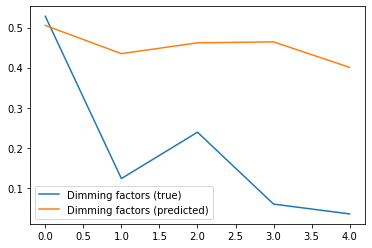

Current loss: 0.05137120932340622
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.17155873775482178, dimming (predicted): 0.4959465265274048


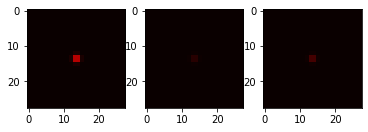

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4078344702720642, dimming (predicted): 0.49483147263526917


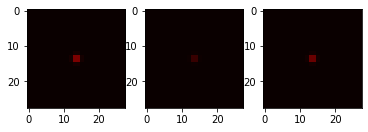

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.38840293884277344, dimming (predicted): 0.4297904074192047


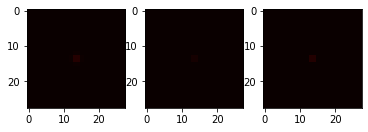

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2990191578865051, dimming (predicted): 0.4051031172275543


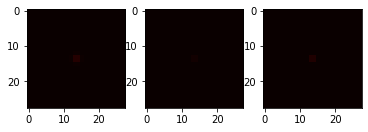

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5389842391014099, dimming (predicted): 0.4276893436908722


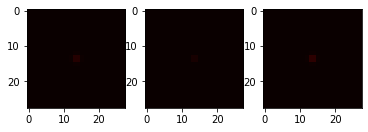

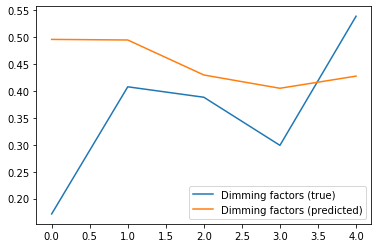

Current loss: 0.05242644622921944
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7576985359191895, dimming (predicted): 0.696061372756958


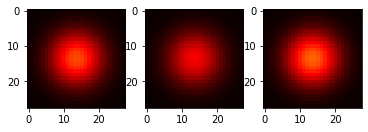

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6468276977539062, dimming (predicted): 0.669971764087677


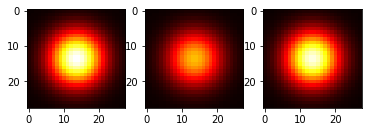

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8114949464797974, dimming (predicted): 0.6521278023719788


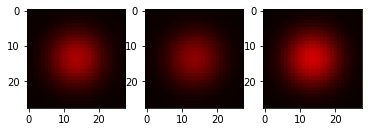

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6194908022880554, dimming (predicted): 0.17126181721687317


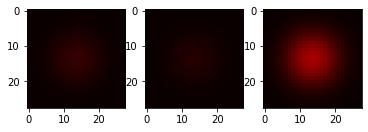

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6293145418167114, dimming (predicted): 0.5756374597549438


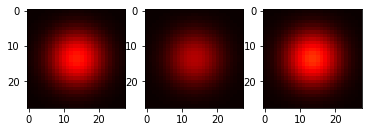

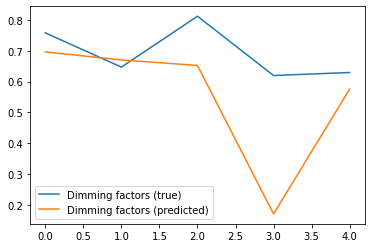

Current loss: 0.1104312390089035
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3994094729423523, dimming (predicted): 0.5466182231903076


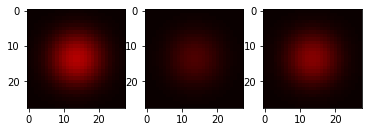

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.203593909740448, dimming (predicted): 0.5798432230949402


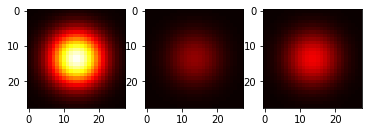

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5076735615730286, dimming (predicted): 0.5249026417732239


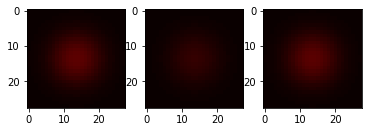

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.08519738912582397, dimming (predicted): 0.4698778986930847


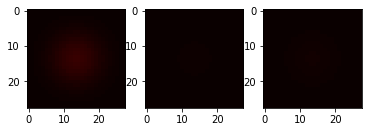

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.29721081256866455, dimming (predicted): 0.32605305314064026


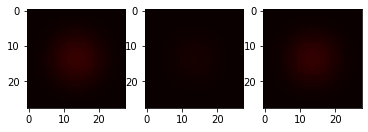

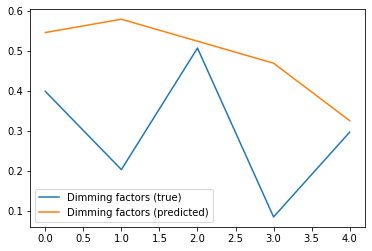

Current loss: 0.05610952898859978
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.815843939781189, dimming (predicted): 0.5946511626243591


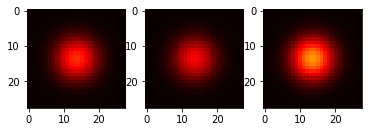

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.21585124731063843, dimming (predicted): 0.31194186210632324


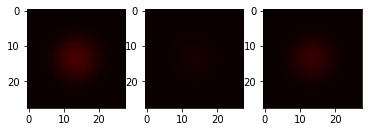

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6874332427978516, dimming (predicted): 0.6080566644668579


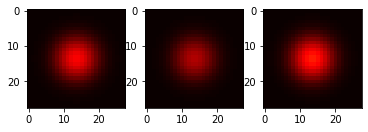

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9785974621772766, dimming (predicted): 0.6351028084754944


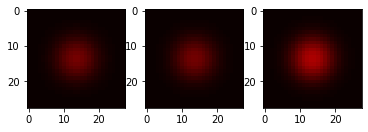

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.589005708694458, dimming (predicted): 0.3698507249355316


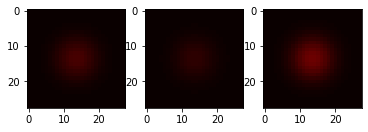

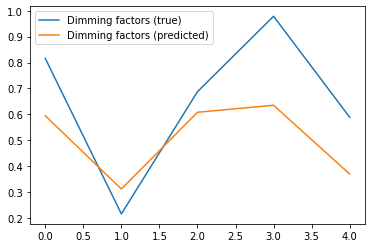

Current loss: 0.061765871942043304
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7346382737159729, dimming (predicted): 0.47621092200279236


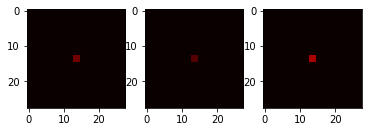

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7205914855003357, dimming (predicted): 0.5839866995811462


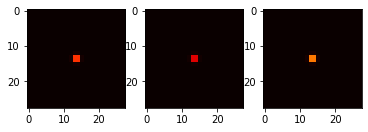

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.22956711053848267, dimming (predicted): 0.34037190675735474


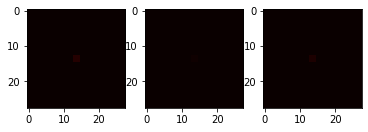

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.33929187059402466, dimming (predicted): 0.4067823886871338


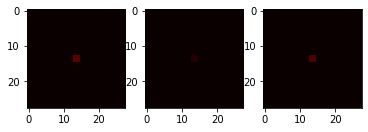

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4219411611557007, dimming (predicted): 0.4635801911354065


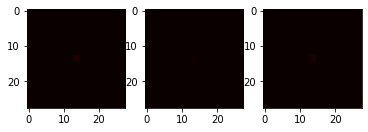

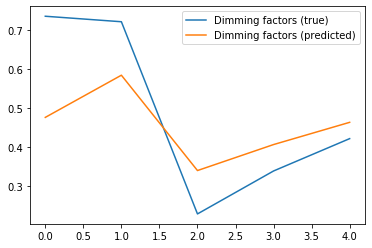

Current loss: 0.08001432567834854
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7181665301322937, dimming (predicted): 0.4914187788963318


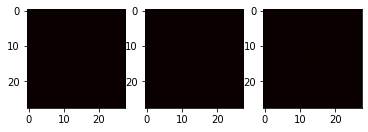

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9013546705245972, dimming (predicted): 0.45014023780822754


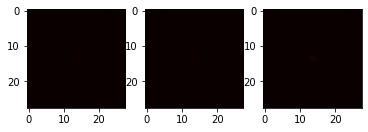

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.15160667896270752, dimming (predicted): 0.4003055691719055


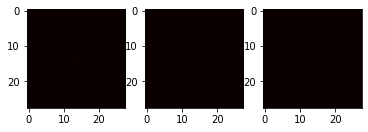

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.44720619916915894, dimming (predicted): 0.3899213969707489


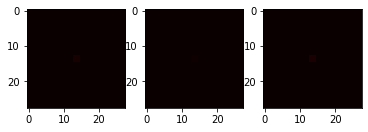

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.58736652135849, dimming (predicted): 0.5069289803504944


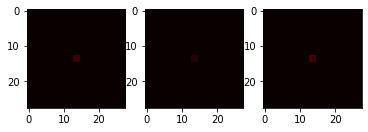

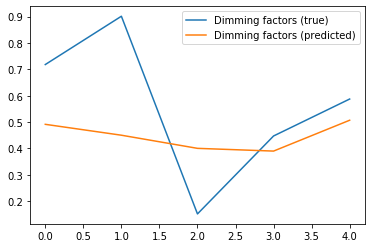

Current loss: 0.06482754647731781
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.38527029752731323, dimming (predicted): 0.40443289279937744


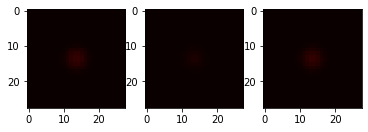

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.26068776845932007, dimming (predicted): 0.5055013298988342


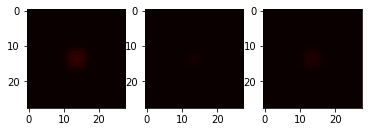

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8283088803291321, dimming (predicted): 0.4514486789703369


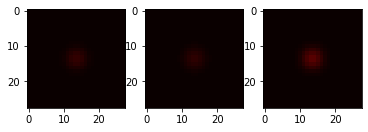

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8694229125976562, dimming (predicted): 0.5057564377784729


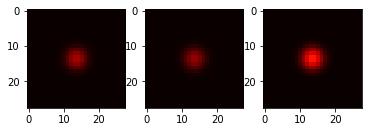

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.27534621953964233, dimming (predicted): 0.5490816235542297


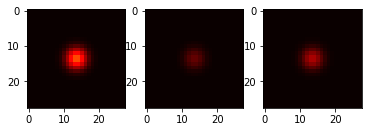

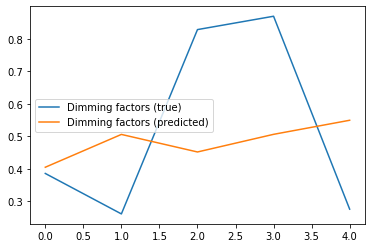

Current loss: 0.0315210185945034
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3440333604812622, dimming (predicted): 0.14470010995864868


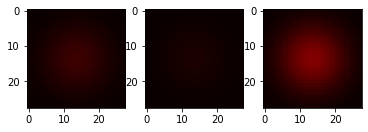

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7803570032119751, dimming (predicted): 0.7016443610191345


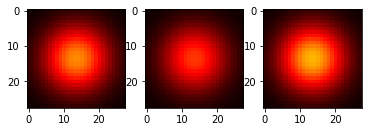

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5019285678863525, dimming (predicted): 0.5032926797866821


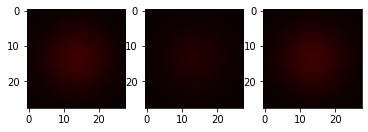

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4283900856971741, dimming (predicted): 0.2856559753417969


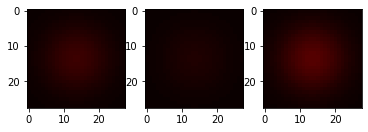

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.24557995796203613, dimming (predicted): 0.5172988772392273


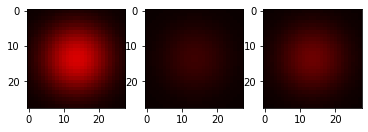

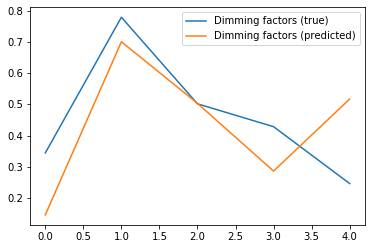

Current loss: 0.07965381443500519
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.43161171674728394, dimming (predicted): 0.09445019066333771


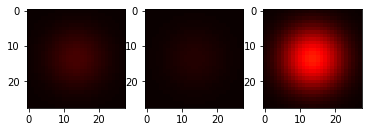

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7281096577644348, dimming (predicted): 0.8292139768600464


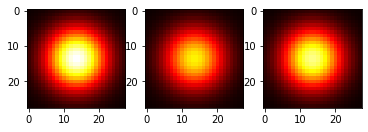

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.09021592140197754, dimming (predicted): 0.15527941286563873


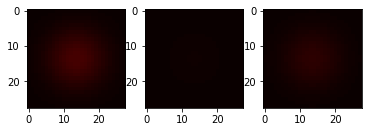

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.32422780990600586, dimming (predicted): 0.8216070532798767


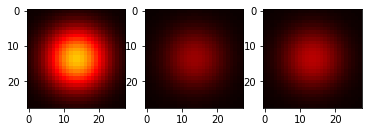

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8465664386749268, dimming (predicted): 0.3551313281059265


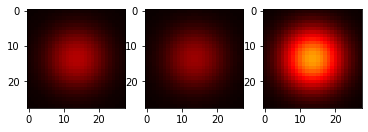

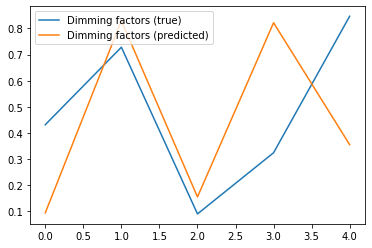

Current loss: 0.04873006418347359
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.27684473991394043, dimming (predicted): 0.4368557333946228


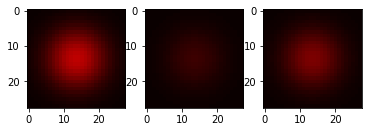

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.22485023736953735, dimming (predicted): 0.5673408508300781


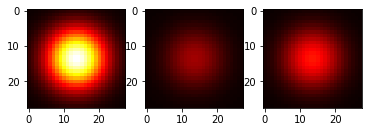

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8516073226928711, dimming (predicted): 0.4910939633846283


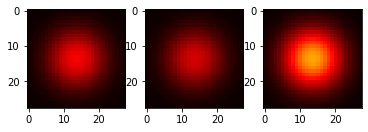

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.1848444938659668, dimming (predicted): 0.4635094106197357


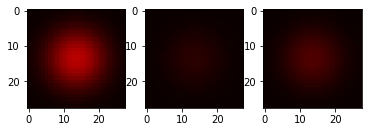

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.16928571462631226, dimming (predicted): 0.3976914584636688


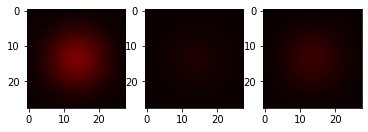

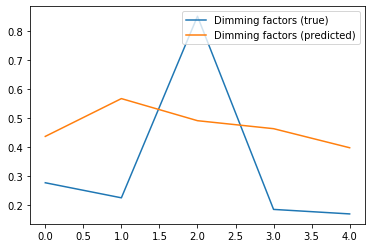

Current loss: 0.06149135157465935
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3375135064125061, dimming (predicted): 0.38232681155204773


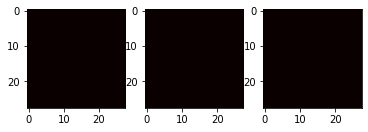

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7250315546989441, dimming (predicted): 0.45719438791275024


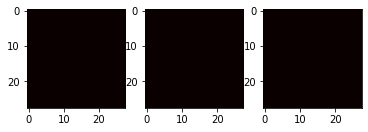

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7122718095779419, dimming (predicted): 0.3875194191932678


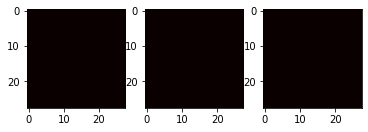

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.17967665195465088, dimming (predicted): 0.43834608793258667


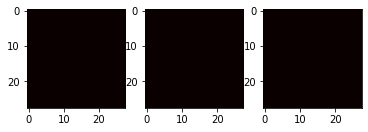

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.17699241638183594, dimming (predicted): 0.43214166164398193


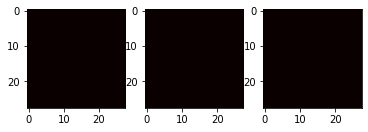

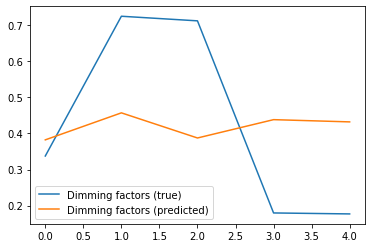

Current loss: 0.06287837028503418
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.026088416576385498, dimming (predicted): 0.3806183636188507


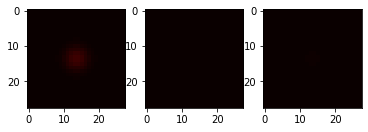

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7794130444526672, dimming (predicted): 0.4818817973136902


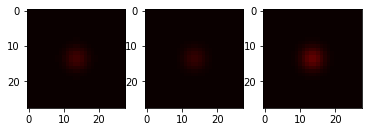

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5011861324310303, dimming (predicted): 0.4425119161605835


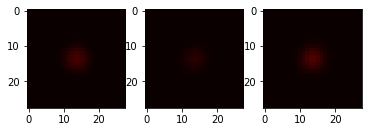

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6271731853485107, dimming (predicted): 0.4555075168609619


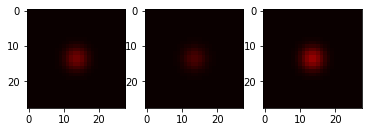

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7386646270751953, dimming (predicted): 0.44265154004096985


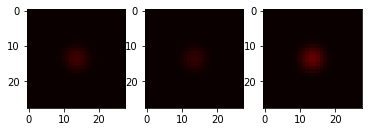

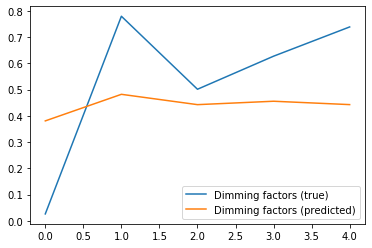

Current loss: 0.06795721501111984
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.06263470649719238, dimming (predicted): 0.41829660534858704


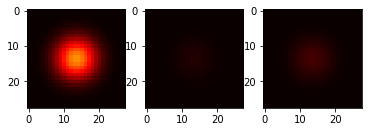

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.20013540983200073, dimming (predicted): 0.24856160581111908


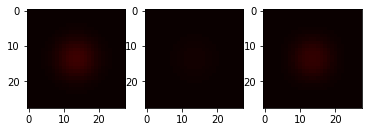

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.28655630350112915, dimming (predicted): 0.571687638759613


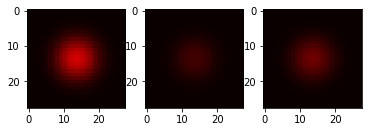

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9216307997703552, dimming (predicted): 0.597544252872467


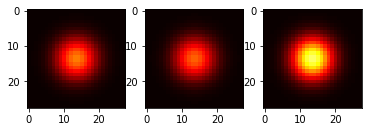

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9954185485839844, dimming (predicted): 0.5902758836746216


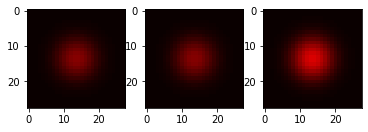

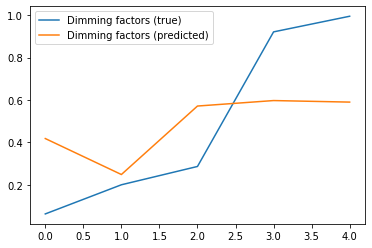

Current loss: 0.05175357311964035
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9298936128616333, dimming (predicted): 0.7918859124183655


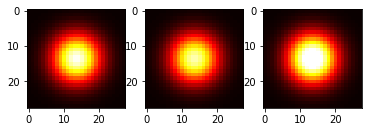

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7211772203445435, dimming (predicted): 0.6588782072067261


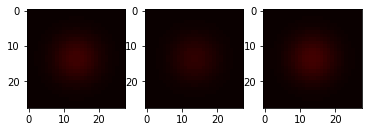

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4205626845359802, dimming (predicted): 0.20410965383052826


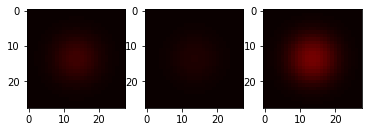

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6643630266189575, dimming (predicted): 0.6183440685272217


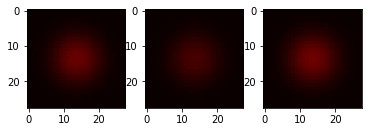

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2447115182876587, dimming (predicted): 0.3715140223503113


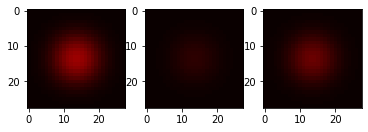

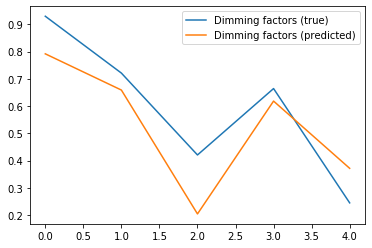

Current loss: 0.0540504977107048
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7064653635025024, dimming (predicted): 0.4283168613910675


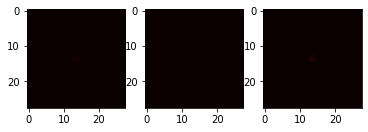

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6764382123947144, dimming (predicted): 0.44083839654922485


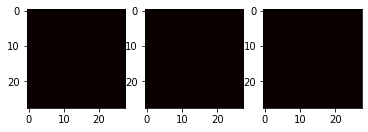

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.937966525554657, dimming (predicted): 0.46987104415893555


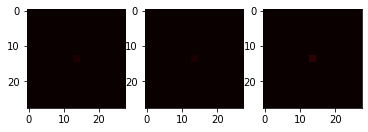

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8914861083030701, dimming (predicted): 0.4363812804222107


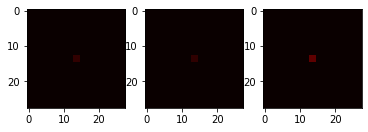

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.23541748523712158, dimming (predicted): 0.46151280403137207


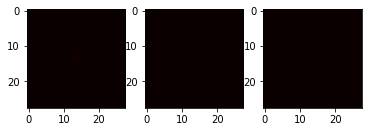

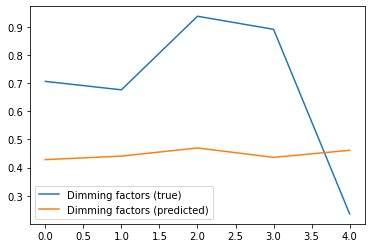

Current loss: 0.06595811247825623
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7988510727882385, dimming (predicted): 0.4331134557723999


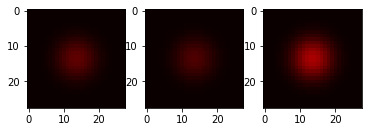

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.017819881439208984, dimming (predicted): 0.24809537827968597


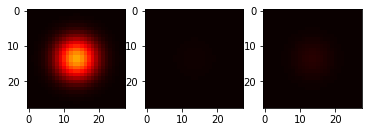

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.10192137956619263, dimming (predicted): 0.3826257884502411


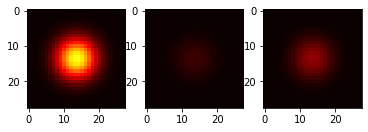

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.13233596086502075, dimming (predicted): 0.5416862964630127


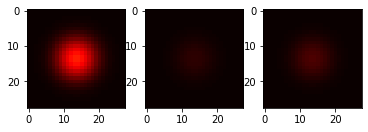

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6032875180244446, dimming (predicted): 0.6678290963172913


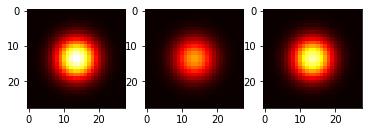

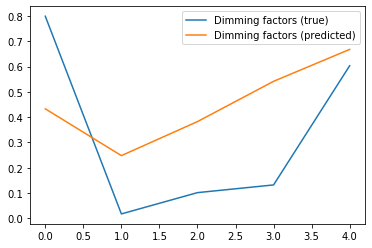

Current loss: 0.050334226340055466
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.819430410861969, dimming (predicted): 0.9011901617050171


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5464261770248413, dimming (predicted): 0.4327685534954071


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.22379112243652344, dimming (predicted): 0.36492544412612915


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.063812255859375, dimming (predicted): 0.32546383142471313


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.18461424112319946, dimming (predicted): 0.3947303891181946


Current loss: 0.08319520205259323
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.1297096610069275, dimming (predicted): 0.25802186131477356


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8955882787704468, dimming (predicted): 0.6467491388320923


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6209667921066284, dimming (predicted): 0.6084703803062439


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8107625842094421, dimming (predicted): 0.4858657419681549


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9254643321037292, dimming (predicted): 0.518818199634552


Current loss: 0.05919609218835831
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6460075974464417, dimming (predicted): 0.47972360253334045


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4641525149345398, dimming (predicted): 0.4991581439971924


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.1310882568359375, dimming (predicted): 0.32936933636665344


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2702213525772095, dimming (predicted): 0.5680450201034546


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.41639792919158936, dimming (predicted): 0.4871300756931305


Current loss: 0.07694642245769501
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7845064401626587, dimming (predicted): 0.48664864897727966


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.43448883295059204, dimming (predicted): 0.49885156750679016


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.08771449327468872, dimming (predicted): 0.4007643163204193


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3723507523536682, dimming (predicted): 0.4996623992919922


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.06479936838150024, dimming (predicted): 0.4740642011165619


Current loss: 0.051267094910144806
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5292128324508667, dimming (predicted): 0.47410789132118225


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2462599277496338, dimming (predicted): 0.5830029845237732


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.39868229627609253, dimming (predicted): 0.23620347678661346


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3046550750732422, dimming (predicted): 0.5581678152084351


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7345775961875916, dimming (predicted): 0.6223680973052979


Current loss: 0.06016078591346741
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7072929739952087, dimming (predicted): 0.5322508215904236


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.26942580938339233, dimming (predicted): 0.42132917046546936


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.06719326972961426, dimming (predicted): 0.42691880464553833


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3054124712944031, dimming (predicted): 0.5821658968925476


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.13563281297683716, dimming (predicted): 0.41065841913223267


Current loss: 0.0812445729970932
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6531724333763123, dimming (predicted): 0.3996158242225647


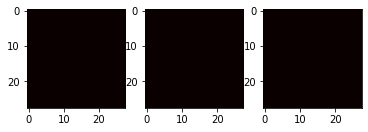

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6468965411186218, dimming (predicted): 0.4144037663936615


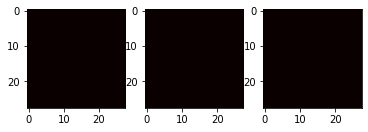

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.14648127555847168, dimming (predicted): 0.435403972864151


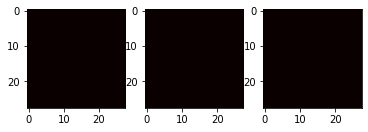

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8656579256057739, dimming (predicted): 0.44867855310440063


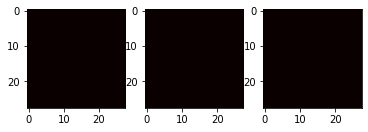

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.017099857330322266, dimming (predicted): 0.5229646563529968


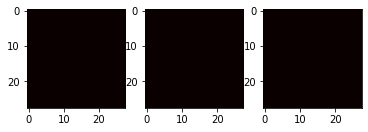

Current loss: 0.09294874966144562
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.775038480758667, dimming (predicted): 0.6007227897644043


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.25764769315719604, dimming (predicted): 0.47066426277160645


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2871840000152588, dimming (predicted): 0.46161767840385437


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.05493229627609253, dimming (predicted): 0.3732883036136627


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7325856685638428, dimming (predicted): 0.6084057092666626


Current loss: 0.043324731290340424
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.12013733386993408, dimming (predicted): 0.22412680089473724


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.861598789691925, dimming (predicted): 0.7283005118370056


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.34164732694625854, dimming (predicted): 0.5811721086502075


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.14394575357437134, dimming (predicted): 0.36375892162323


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6920565366744995, dimming (predicted): 0.7688958644866943


Current loss: 0.06168842315673828
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8048714399337769, dimming (predicted): 0.6072784662246704


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.15516912937164307, dimming (predicted): 0.6218792200088501


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2774236798286438, dimming (predicted): 0.4409889280796051


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5326362252235413, dimming (predicted): 0.6685113310813904


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6940754055976868, dimming (predicted): 0.7092673778533936


Current loss: 0.035967789590358734
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7581737637519836, dimming (predicted): 0.6535664796829224


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9864726662635803, dimming (predicted): 0.9816837310791016


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2132231593132019, dimming (predicted): 0.07041493058204651


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.10332882404327393, dimming (predicted): 0.10392855107784271


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.40147244930267334, dimming (predicted): 0.1498948633670807


Current loss: 0.08678971976041794
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6179873943328857, dimming (predicted): 0.5185354351997375


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5727712512016296, dimming (predicted): 0.7137970924377441


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.0516362190246582, dimming (predicted): 0.24783207476139069


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.30412769317626953, dimming (predicted): 0.44399547576904297


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9515785574913025, dimming (predicted): 0.6215319037437439


Current loss: 0.06833916902542114
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.43327683210372925, dimming (predicted): 0.6121396422386169


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.11939048767089844, dimming (predicted): 0.30554816126823425


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7326117753982544, dimming (predicted): 0.5752580165863037


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8747472167015076, dimming (predicted): 0.6768826246261597


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.13670063018798828, dimming (predicted): 0.40695786476135254


Current loss: 0.08679233491420746
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3545522689819336, dimming (predicted): 0.3353480398654938


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9901946783065796, dimming (predicted): 0.5435733199119568


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8027600646018982, dimming (predicted): 0.7947026491165161


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.14564013481140137, dimming (predicted): 0.6485071182250977


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7355857491493225, dimming (predicted): 0.7519927024841309


Current loss: 0.08554578572511673
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.597501277923584, dimming (predicted): 0.454434871673584


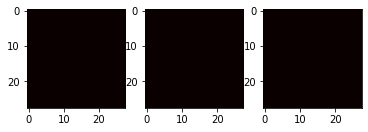

Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5762124061584473, dimming (predicted): 0.39267194271087646


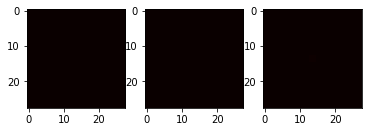

Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8216996192932129, dimming (predicted): 0.5545098781585693


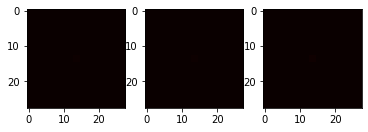

Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9516785740852356, dimming (predicted): 0.42839351296424866


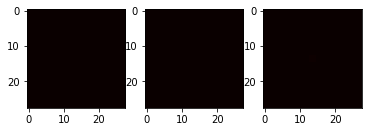

Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.22179031372070312, dimming (predicted): 0.40727344155311584


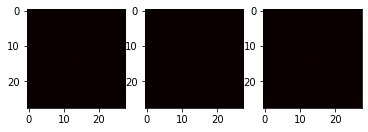

Current loss: 0.06237823888659477
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.977694571018219, dimming (predicted): 0.487736314535141


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6856899857521057, dimming (predicted): 0.6856278777122498


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5606565475463867, dimming (predicted): 0.7753812670707703


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9258472323417664, dimming (predicted): 0.794792890548706


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.36681067943573, dimming (predicted): 0.19245557487010956


Current loss: 0.08268649131059647
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7828677892684937, dimming (predicted): 0.5162978172302246


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7209885716438293, dimming (predicted): 0.5801942944526672


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2933781147003174, dimming (predicted): 0.5872014760971069


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.28070032596588135, dimming (predicted): 0.6437954306602478


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5759729146957397, dimming (predicted): 0.3112245202064514


Current loss: 0.05356306582689285
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7407599091529846, dimming (predicted): 0.5342620015144348


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.46369606256484985, dimming (predicted): 0.5261600613594055


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8092901706695557, dimming (predicted): 0.5210345387458801


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3683045506477356, dimming (predicted): 0.5122912526130676


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6046160459518433, dimming (predicted): 0.5237568020820618


Current loss: 0.06251466274261475
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6984721422195435, dimming (predicted): 0.6125003099441528


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7349193692207336, dimming (predicted): 0.6594931483268738


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.15754252672195435, dimming (predicted): 0.49841946363449097


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5300305485725403, dimming (predicted): 0.5883329510688782


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2512331008911133, dimming (predicted): 0.31223320960998535


Current loss: 0.07701368629932404
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.27189844846725464, dimming (predicted): 0.6365724802017212


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9207674264907837, dimming (predicted): 0.7621278762817383


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.29664433002471924, dimming (predicted): 0.48350661993026733


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9739013314247131, dimming (predicted): 0.45607781410217285


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8352898955345154, dimming (predicted): 0.4500519335269928


Current loss: 0.04054516926407814
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6998681426048279, dimming (predicted): 0.5715774893760681


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7555773258209229, dimming (predicted): 0.5405173897743225


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.630734384059906, dimming (predicted): 0.633640706539154


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.48916471004486084, dimming (predicted): 0.3697548806667328


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7916638255119324, dimming (predicted): 0.5828706622123718


Current loss: 0.06878795474767685
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8324654698371887, dimming (predicted): 0.6708163022994995


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.23154217004776, dimming (predicted): 0.5052540898323059


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.07799011468887329, dimming (predicted): 0.36594638228416443


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8616054058074951, dimming (predicted): 0.7096948623657227


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.47689902782440186, dimming (predicted): 0.5249615907669067


Current loss: 0.06777837127447128
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5387753248214722, dimming (predicted): 0.5314404964447021


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.23345446586608887, dimming (predicted): 0.5897074341773987


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.011579275131225586, dimming (predicted): 0.151749387383461


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6947495341300964, dimming (predicted): 0.6147322654724121


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4729204773902893, dimming (predicted): 0.5240296125411987


Current loss: 0.05240092799067497
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6569982171058655, dimming (predicted): 0.40247878432273865


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6090747714042664, dimming (predicted): 0.530229926109314


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.20449382066726685, dimming (predicted): 0.39000585675239563


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8049179315567017, dimming (predicted): 0.6671888828277588


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.014911055564880371, dimming (predicted): 0.18930743634700775


Current loss: 0.06780135631561279
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4861239790916443, dimming (predicted): 0.5982025861740112


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5945231914520264, dimming (predicted): 0.5576258897781372


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.691283106803894, dimming (predicted): 0.2992502748966217


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6264472007751465, dimming (predicted): 0.6919158697128296


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6436669230461121, dimming (predicted): 0.6029406189918518


Current loss: 0.06237400695681572
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3496094346046448, dimming (predicted): 0.6010981202125549


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3908187747001648, dimming (predicted): 0.5426871180534363


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5524677038192749, dimming (predicted): 0.5574716329574585


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.05402094125747681, dimming (predicted): 0.37726256251335144


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2880370616912842, dimming (predicted): 0.5968163013458252


Current loss: 0.07467883825302124
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8174711465835571, dimming (predicted): 0.5997586846351624


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.1255786418914795, dimming (predicted): 0.2536686360836029


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9107449650764465, dimming (predicted): 0.5119141340255737


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9657371640205383, dimming (predicted): 0.6063511967658997


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6502583622932434, dimming (predicted): 0.6007928252220154


Current loss: 0.050625503063201904
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.19692593812942505, dimming (predicted): 0.26539987325668335


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4476088881492615, dimming (predicted): 0.5867190957069397


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.25527334213256836, dimming (predicted): 0.725167989730835


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7001411318778992, dimming (predicted): 0.7601598501205444


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4517676830291748, dimming (predicted): 0.16568072140216827


Current loss: 0.044724851846694946
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5866246819496155, dimming (predicted): 0.7357827425003052


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.21704941987991333, dimming (predicted): 0.4226752817630768


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6247889995574951, dimming (predicted): 0.7805992960929871


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.20587694644927979, dimming (predicted): 0.2668473422527313


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7690207958221436, dimming (predicted): 0.2548995912075043


Current loss: 0.05608469992876053
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.37776821851730347, dimming (predicted): 0.6693985462188721


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7204735279083252, dimming (predicted): 0.7558627128601074


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6797287464141846, dimming (predicted): 0.6179448962211609


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8234238028526306, dimming (predicted): 0.7033271193504333


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.14832383394241333, dimming (predicted): 0.2475091516971588


Current loss: 0.0521034374833107
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.47262221574783325, dimming (predicted): 0.5661295652389526


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.03734326362609863, dimming (predicted): 0.45360568165779114


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.24847352504730225, dimming (predicted): 0.5824351906776428


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.130992591381073, dimming (predicted): 0.5473664999008179


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7319259643554688, dimming (predicted): 0.5643810033798218


Current loss: 0.059338122606277466
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.24308210611343384, dimming (predicted): 0.5950972437858582


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.759263277053833, dimming (predicted): 0.6507654786109924


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.1923343539237976, dimming (predicted): 0.6546434760093689


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.939863920211792, dimming (predicted): 0.7271441221237183


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5416305065155029, dimming (predicted): 0.5940361618995667


Current loss: 0.07296179980039597
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.07559752464294434, dimming (predicted): 0.44606906175613403


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.026739656925201416, dimming (predicted): 0.15513595938682556


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3123024106025696, dimming (predicted): 0.35850346088409424


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4111512303352356, dimming (predicted): 0.5573400855064392


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6409568190574646, dimming (predicted): 0.6770824790000916


Current loss: 0.07205620408058167
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.17329758405685425, dimming (predicted): 0.20260882377624512


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9837217330932617, dimming (predicted): 0.6622007489204407


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.916261613368988, dimming (predicted): 0.5723918676376343


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.0377802848815918, dimming (predicted): 0.5072235465049744


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5032545328140259, dimming (predicted): 0.4784976840019226


Current loss: 0.067918561398983
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.532916247844696, dimming (predicted): 0.6732211709022522


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7001886963844299, dimming (predicted): 0.39280572533607483


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.14585459232330322, dimming (predicted): 0.3910793662071228


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5076285004615784, dimming (predicted): 0.6658326387405396


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.11588943004608154, dimming (predicted): 0.33715304732322693


Current loss: 0.05535794049501419
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.22757560014724731, dimming (predicted): 0.4452166259288788


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3714398145675659, dimming (predicted): 0.4825341999530792


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.45770955085754395, dimming (predicted): 0.530148446559906


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8155425786972046, dimming (predicted): 0.5107493996620178


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5773237347602844, dimming (predicted): 0.5465245246887207


Current loss: 0.08778977394104004
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.09503823518753052, dimming (predicted): 0.2612498700618744


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2114582061767578, dimming (predicted): 0.5288835763931274


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3684179186820984, dimming (predicted): 0.5079839825630188


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6361489295959473, dimming (predicted): 0.5567833185195923


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.18992263078689575, dimming (predicted): 0.6548365354537964


Current loss: 0.05206618458032608
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8832314014434814, dimming (predicted): 0.57379150390625


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7338817715644836, dimming (predicted): 0.5439212322235107


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4086105227470398, dimming (predicted): 0.4775656759738922


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9008731245994568, dimming (predicted): 0.5016836524009705


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.14786601066589355, dimming (predicted): 0.5337215662002563


Current loss: 0.04986376687884331
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.40300142765045166, dimming (predicted): 0.326229065656662


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6744014024734497, dimming (predicted): 0.5538855195045471


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6387885212898254, dimming (predicted): 0.5772484540939331


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6878660321235657, dimming (predicted): 0.510858952999115


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6058796048164368, dimming (predicted): 0.5186554789543152


Current loss: 0.07702485471963882
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7259278297424316, dimming (predicted): 0.6380383968353271


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9425743818283081, dimming (predicted): 0.38595420122146606


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9791488647460938, dimming (predicted): 0.724685788154602


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9816924929618835, dimming (predicted): 0.5612287521362305


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.48146557807922363, dimming (predicted): 0.6883164644241333


Current loss: 0.08055759221315384
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9696650505065918, dimming (predicted): 0.7142221927642822


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.39725232124328613, dimming (predicted): 0.6301482319831848


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4995688796043396, dimming (predicted): 0.6135841012001038


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4774360656738281, dimming (predicted): 0.590895414352417


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.026729047298431396, dimming (predicted): 0.14610178768634796


Current loss: 0.07067454606294632
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.06010836362838745, dimming (predicted): 0.5641205310821533


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.08992820978164673, dimming (predicted): 0.2983008623123169


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.21647238731384277, dimming (predicted): 0.4769088923931122


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.04327434301376343, dimming (predicted): 0.2602619528770447


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7391107678413391, dimming (predicted): 0.5392873287200928


Current loss: 0.04804500937461853
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5707146525382996, dimming (predicted): 0.4383195638656616


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.36861467361450195, dimming (predicted): 0.6379990577697754


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.22897911071777344, dimming (predicted): 0.5676650404930115


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.496002197265625, dimming (predicted): 0.47274455428123474


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7912733554840088, dimming (predicted): 0.5824288129806519


Current loss: 0.061455827206373215
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5327457785606384, dimming (predicted): 0.49297264218330383


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.48590362071990967, dimming (predicted): 0.6367670893669128


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.45287221670150757, dimming (predicted): 0.739880383014679


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9727986454963684, dimming (predicted): 0.744982898235321


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.19287121295928955, dimming (predicted): 0.1526566743850708


Current loss: 0.06584403663873672
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7353744506835938, dimming (predicted): 0.5211856365203857


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.96131432056427, dimming (predicted): 0.5106171369552612


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.503102719783783, dimming (predicted): 0.4979623556137085


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3898025155067444, dimming (predicted): 0.5080785155296326


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8568627834320068, dimming (predicted): 0.5428287982940674


Current loss: 0.06920284032821655
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4140878915786743, dimming (predicted): 0.5647585391998291


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7629227638244629, dimming (predicted): 0.7146736979484558


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5235795378684998, dimming (predicted): 0.3430795669555664


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.27761316299438477, dimming (predicted): 0.3475108742713928


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.962291419506073, dimming (predicted): 0.5861870050430298


Current loss: 0.06438083946704865
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8006407618522644, dimming (predicted): 0.5767301917076111


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6044703125953674, dimming (predicted): 0.5338388681411743


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5864683985710144, dimming (predicted): 0.5566002726554871


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.33009064197540283, dimming (predicted): 0.4960773289203644


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.0903509259223938, dimming (predicted): 0.5670214295387268


Current loss: 0.03623224049806595
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8550219535827637, dimming (predicted): 0.8650913238525391


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9339460730552673, dimming (predicted): 0.7080061435699463


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9949035048484802, dimming (predicted): 0.8503047227859497


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.33952993154525757, dimming (predicted): 0.4656223654747009


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7753821015357971, dimming (predicted): 0.6565325856208801


Current loss: 0.06876790523529053
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7025343775749207, dimming (predicted): 0.6332712173461914


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8043361306190491, dimming (predicted): 0.5582240223884583


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7653775811195374, dimming (predicted): 0.521882176399231


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.37008893489837646, dimming (predicted): 0.6192187666893005


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6174507141113281, dimming (predicted): 0.584489643573761


Current loss: 0.06664364784955978
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9537287354469299, dimming (predicted): 0.6881080865859985


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8144860863685608, dimming (predicted): 0.4595910906791687


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.08938652276992798, dimming (predicted): 0.34467434883117676


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7852973937988281, dimming (predicted): 0.5858556628227234


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2659175992012024, dimming (predicted): 0.21179156005382538


Current loss: 0.024444032460451126
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.799302875995636, dimming (predicted): 0.771601676940918


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4767611026763916, dimming (predicted): 0.7104098200798035


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7212178707122803, dimming (predicted): 0.757227897644043


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7930287718772888, dimming (predicted): 0.7351772785186768


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6573708653450012, dimming (predicted): 0.7695549726486206


Current loss: 0.05719335749745369
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.26580315828323364, dimming (predicted): 0.40993934869766235


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5965328216552734, dimming (predicted): 0.39990657567977905


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.17818009853363037, dimming (predicted): 0.48957791924476624


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3350185751914978, dimming (predicted): 0.46593955159187317


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.12729936838150024, dimming (predicted): 0.41265013813972473


Current loss: 0.03446316346526146
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7848208546638489, dimming (predicted): 0.5476117134094238


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.42103928327560425, dimming (predicted): 0.5454915165901184


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.21416759490966797, dimming (predicted): 0.3029975891113281


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.158331036567688, dimming (predicted): 0.567980170249939


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5616423487663269, dimming (predicted): 0.5508976578712463


Current loss: 0.055634379386901855
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3925655484199524, dimming (predicted): 0.2815139591693878


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3117911219596863, dimming (predicted): 0.6219059228897095


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6077049374580383, dimming (predicted): 0.6862729787826538


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9682155251502991, dimming (predicted): 0.5065933465957642


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.19159752130508423, dimming (predicted): 0.26801902055740356


Current loss: 0.056554995477199554
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6349717974662781, dimming (predicted): 0.6689711809158325


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.08089154958724976, dimming (predicted): 0.29102709889411926


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5771965980529785, dimming (predicted): 0.6519687175750732


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9816228151321411, dimming (predicted): 0.4487835466861725


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.2262226939201355, dimming (predicted): 0.5869442820549011


Current loss: 0.03263756260275841
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.719566285610199, dimming (predicted): 0.8163918852806091


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8951243162155151, dimming (predicted): 0.7673006653785706


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4403197169303894, dimming (predicted): 0.3591158390045166


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.29223406314849854, dimming (predicted): 0.45316025614738464


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.24640637636184692, dimming (predicted): 0.5481700301170349


Current loss: 0.037370070815086365
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7207226157188416, dimming (predicted): 0.5789337754249573


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.39472073316574097, dimming (predicted): 0.6092652082443237


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3462333679199219, dimming (predicted): 0.5834580063819885


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.18264973163604736, dimming (predicted): 0.5101406574249268


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.015606820583343506, dimming (predicted): 0.36946484446525574


Current loss: 0.046475622802972794
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.03976625204086304, dimming (predicted): 0.4003700315952301


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.35491764545440674, dimming (predicted): 0.5218238830566406


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.54222571849823, dimming (predicted): 0.6239518523216248


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.024044275283813477, dimming (predicted): 0.15308044850826263


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5730323791503906, dimming (predicted): 0.6942622065544128


Current loss: 0.06107348948717117
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7571320533752441, dimming (predicted): 0.6133313775062561


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8253098130226135, dimming (predicted): 0.6348040699958801


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.3183673024177551, dimming (predicted): 0.5212903022766113


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7991796135902405, dimming (predicted): 0.5641012191772461


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4713585376739502, dimming (predicted): 0.3211051821708679


Current loss: 0.04710619896650314
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.19256609678268433, dimming (predicted): 0.26378241181373596


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4446945786476135, dimming (predicted): 0.5360854268074036


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.5008032917976379, dimming (predicted): 0.6090268492698669


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7238470315933228, dimming (predicted): 0.567741870880127


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.004612386226654053, dimming (predicted): 0.2836255729198456


Current loss: 0.04684139043092728
Channel: 0 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.8405807018280029, dimming (predicted): 0.56969153881073


Channel: 1 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.9028677940368652, dimming (predicted): 0.5115264058113098


Channel: 2 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.7665767669677734, dimming (predicted): 0.5907977819442749


Channel: 3 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.4127432703971863, dimming (predicted): 0.38187599182128906


Channel: 4 (left: original, middle: dimmed, right: undimmed)
Dimming (true): 0.6895279884338379, dimming (predicted): 0.5540660619735718


Loss min: 0.0240564476698637, max: 0.15803563594818115, mean: 0.0656494455076754
0.0656494455076754


In [105]:
def make_sun_lowerright(num_channels):
    size = 28
    xx, yy = np.meshgrid(np.arange(size)-(size-1)/2.,np.arange(size)-(size-1)/2)
    r = np.sqrt(xx*xx+yy*yy) 
    R = np.random.rand(1)*(size/3)
    channels = []
    for c in range(num_channels):
        random_channel = np.random.randint(num_channels)
        random_luminance = np.random.rand() * 1000. 
        I_c = random_luminance ** (random_channel/10.)
        channels.append(np.exp(-(r*r)/(R*R))*I_c)
    image = torch.cat([torch.from_numpy(channel).float().to(device) for channel in channels]).view(num_channels, 28, 28)
    return image

lowerright_mean = run_experiment("lowerright_mean", make_sun_lowerright)
print(lowerright_mean)

In [107]:
print('Cross correlation YES/Luminance related to size & shape YES: average mean {}'.format(upperleft_mean))
print('Cross correlation NO /Luminance related to size & shape YES: average mean {}'.format(lowerleft_mean))
print('Cross correlation YES/Luminance related to size & shape NO : average mean {}'.format(upperright_mean))
print('Cross correlation NO /Luminance related to size & shape NO : average mean {}'.format(lowerright_mean))

Cross correlation YES/Luminance related to size & shape YES: average mean 0.016695078083954287
Cross correlation NO /Luminance related to size & shape YES: average mean 0.027399372360436245
Cross correlation YES/Luminance related to size & shape NO : average mean 0.02230118925345596
Cross correlation NO /Luminance related to size & shape NO : average mean 0.0656494455076754
